<div style="display: flex; background-color: RGB(255,114,0);" >
<h1 style="margin: auto; padding: 30px; ">ANALYSE DU STOCK ET DES VENTES DU SITE BOTTLENECK</h1>
</div>

<u>**Remarque :**</u>  
Pour des raisons de lisibilité des parties ont été masquées.
Elles peuvent être démasquées directement sur le Notebook .ipynb

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 1 - Importation des librairies et chargement des fichiers</h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.1 - Importation des librairies</h3>
</div>

In [1]:
#PM :
#Import de la librairie expression régulières
import re

#Import de la librairie Numpy
import numpy as np

#Import de la librairie Pandas
import pandas as pd

In [2]:
#PM
#Import de la librairie matplotlib.pyplot
import matplotlib.pyplot as plt

In [3]:
#Import de plotly.express pour Etape 4.1
import plotly.express as px

In [4]:
#Import de scipy.stats pour Etape 4.2
import scipy.stats as st

In [5]:
#PM Import de seaborn pour Etape 4.2
import seaborn as sns

##### <u>*DESACTIVATIONS DE WARNINGS déjà lu pour LISISBILITE :*</u>

Source :  
https://saturncloud.io/blog/how-to-disable-warnings-in-jupyter-notebook/

https://docs.python.org/fr/3/library/warnings.html

default                      => Show all warnings (even those ignored by default)  
ignore                       => Ignore all warnings  
error                        => Convert all warnings to errors  
error::ResourceWarning       => Treat ResourceWarning messages as errors  
default::DeprecationWarnig   => Show DeprecationWarning messages  
ignore,default:::mymodule    => Only report warnings triggered by "mymodule"  
error:::mymodule             => Convert warnings to errors in "mymodule"  

In [6]:
import warnings

In [7]:
#Suppress all warnings
warnings.filterwarnings('ignore')

In [8]:
#Restore the warning behaviour to default : Show all warnings (even those ignored by default)
#warnings.filterwarnings('ignore')

##### <u>*FONCTION PERSONNELLE D'ANALYSE DE FICHIERS :*</u>

In [9]:
# FONCTION PERSONNELLE D'ANALYSE DE FICHIERS :

def Description_Fichier_Tableau_avc_ValBlanches(Data):
    """
    fonction permettant d'analyser un Dataframe DF.
    Elle prend en entrée le dataframe DF.
    Elle nécessite d'avoir chargé la librairie des expressions regulières : import re
    Et renvoie en sortie un dataframe DF2 avec pour chacune des colonnes de DF, les informations suivantes :
    'Type': type de la colonne
    'Nb lignes' : nbre de lignes total de la colonne
    'Valeurs non-vides' : nbre de valeurs non-vides dans la colonne au sens de la fonction pandas.Series.notna()
    'Valeurs vides' : nbre de valeurs vides dans la colonne au sens de la fonction pandas.Series.isna()
    'Valeurs distinctes' : nbre de valeurs vides dans la colonne au sens de la fonction pandas.Series.unique()
    'Valeurs blanches' : nbre de valeurs blanches dans la colonne au sens de le regular expression r"\A[\s]*$"
    c'est à dire au sens de uniquement une nombres quelconque de caractères blancs y compris aucun ''

    """

    
    re2 = r"\A[\s]*$"
    FICHIER = pd.DataFrame(Data)
    #création d'un DataFrame qui va contenir les colonnes du Fichier en Index, 
    #et la description des lignes dans les colonnes
    Tab_Descriptif = pd.DataFrame(index = FICHIER.columns, 
                                  columns=['Type','Nb lignes',
                                           'Valeurs non-vides','Valeurs vides',
                                           'Valeurs distinctes','Valeurs blanches'])

    #remplissage des lignes
    for elt in FICHIER.columns :
        col_string = (FICHIER[elt]).astype('string')
        Tab_Descriptif.loc[elt,:] = [FICHIER[elt].dtypes, len(FICHIER[elt]) , 
                                     FICHIER[elt].notna().sum() ,FICHIER[elt].isna().sum(),
                                     len(FICHIER[elt].unique()),col_string.str.match(re2).sum() ]

    #print(Tab_Descriptif)
    return Tab_Descriptif

L'alerte ne vaut que pour le texte de la description de fonction!

Trouver dans Google l'instruction permettant d'afficher toutes les colonnes d'un dataframe  
"display all columns dataframe Pandas"
=> pandas.DataFrame.columns

In [10]:
# FONCTION PERSONNELLE D'ANALYSE DE FICHIERS : VERBEUSE

def Description_Fichier(Data):
    
    re2 = r"\A[\s]*$"
    FICHIER = pd.DataFrame(Data)
    
    #Consulter le nombre de colonnes
    print("Le tableau comporte ",FICHIER.shape[1]," colonne(s) : ")
    
    for elt in FICHIER.columns :
        print(elt)
        
    print("\n")

    #le type de données et Le nombre de valeurs présentes dans chacune des colonnes
    for elt in FICHIER.columns :
        col_string = (FICHIER[elt]).astype('string')
        print("La colonne ",elt," (est de type ",FICHIER[elt].dtypes," ) et contient :")
        print("\t", len(FICHIER[elt])," lignes")
        print("\t", FICHIER[elt].notna().sum()," valeur(s) non-vide(s)")
        print("\t", FICHIER[elt].isna().sum()," valeur(s) vide(s)")
        print ("\t", len(FICHIER[elt].unique()), " valeur(s) distincte(s)." )
        print ("\t", col_string.str.match(re2).sum(), " valeur(s) blanche(s)." )
        print("\n")

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.2 - Chargements des fichiers</h3>
</div>

In [11]:
#Importation du fichier web.xlsx
df_web = pd.read_excel("web.xlsx")
#Importation du fichier erp.xlsx
df_erp = pd.read_excel("erp.xlsx")
#importation du fichier liaison.xlsx
df_liaison = pd.read_excel("liaison.xlsx")

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 2 - Analyse exploratoire des fichiers</h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.1 - Analyse exploratoire du fichier erp.xlsx</h3>
</div>

##### PM EXPLORATION PERSO

In [12]:
df_erp.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64
3,4032,1,14.1,26,instock,6.92
4,4039,1,46.0,3,outofstock,23.77


In [13]:
df_erp.shape

(825, 6)

In [14]:
df_erp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 825 entries, 0 to 824
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   product_id      825 non-null    int64  
 1   onsale_web      825 non-null    int64  
 2   price           825 non-null    float64
 3   stock_quantity  825 non-null    int64  
 4   stock_status    825 non-null    object 
 5   purchase_price  825 non-null    float64
dtypes: float64(2), int64(3), object(1)
memory usage: 38.8+ KB


In [15]:
Description_Fichier_Tableau_avc_ValBlanches(df_erp)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,825,825,0,825,0
onsale_web,int64,825,825,0,2,0
price,float64,825,825,0,383,0
stock_quantity,int64,825,825,0,84,0
stock_status,object,825,825,0,2,0
purchase_price,float64,825,825,0,660,0


###### <u>**OBSERVATIONS**</u>
des outofstock ne sont pas à zéro.  
=> Information redondante et inutile à maintenir 

In [16]:
df_erp.describe()

,product_id,onsale_web,price,stock_quantity,purchase_price
count,825.000000,825.000000,825.000000,825.000000,825.000000
mean,5162.597576,0.867879,32.187697,21.589091,16.940582
std,902.644635,0.338828,26.712077,21.933807,14.561840
min,3847.000000,0.000000,-20.000000,-10.000000,2.740000
25%,4348.000000,1.000000,14.500000,7.000000,7.590000
50%,4907.000000,1.000000,24.300000,18.000000,12.710000
75%,5805.000000,1.000000,42.000000,30.000000,22.020000
max,7338.000000,1.000000,225.000000,145.000000,137.810000


Remarque : il y a des prix négatifs des stocks négatifs.

In [17]:
df_erp.describe(include = np.number)

,product_id,onsale_web,price,stock_quantity,purchase_price
count,825.000000,825.000000,825.000000,825.000000,825.000000
mean,5162.597576,0.867879,32.187697,21.589091,16.940582
std,902.644635,0.338828,26.712077,21.933807,14.561840
min,3847.000000,0.000000,-20.000000,-10.000000,2.740000
25%,4348.000000,1.000000,14.500000,7.000000,7.590000
50%,4907.000000,1.000000,24.300000,18.000000,12.710000
75%,5805.000000,1.000000,42.000000,30.000000,22.020000
max,7338.000000,1.000000,225.000000,145.000000,137.810000


In [18]:
df_erp.loc[df_erp['stock_status']=='outofstock',:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
2,3850,1,20.8,0,outofstock,10.64
4,4039,1,46.0,3,outofstock,23.77
8,4043,1,60.0,0,outofstock,29.45
11,4047,1,18.3,0,outofstock,9.93
15,4051,1,7.7,0,outofstock,4.14
...,...,...,...,...,...,...
723,6301,1,40.5,0,outofstock,20.51
726,6327,0,28.5,0,outofstock,14.43
752,6632,1,52.7,0,outofstock,26.41
774,6900,0,30.0,0,outofstock,16.28


In [19]:
df_erp.loc[df_erp['stock_status']=='outofstock','stock_quantity'].unique()

array([  0,   3, -10,  -1], dtype=int64)

In [20]:
df_erp.loc[df_erp['stock_status']=='outofstock','stock_quantity'].value_counts()

stock_quantity
 0     89
 3      1
-10     1
-1      1
Name: count, dtype: int64

In [21]:
#df_erp['stock_status']=='outofstock'
#df_erp['stock_quantity']!=0
#(df_erp['stock_status']=='outofstock') & (df_erp['stock_quantity']!=0)

In [22]:
df_erp.loc[(df_erp['stock_status']=='outofstock') & (df_erp['stock_quantity']!=0) ,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
4,4039,1,46.0,3,outofstock,23.77
449,4973,0,10.0,-10,outofstock,4.96
573,5700,1,44.5,-1,outofstock,22.30


###### <u>**OBSERVATIONS**</u>
des outofstock ne sont pas à zéro.  
=> Information redondante et inutile à maintenir 

In [23]:
df_erp.describe()

,product_id,onsale_web,price,stock_quantity,purchase_price
count,825.000000,825.000000,825.000000,825.000000,825.000000
mean,5162.597576,0.867879,32.187697,21.589091,16.940582
std,902.644635,0.338828,26.712077,21.933807,14.561840
min,3847.000000,0.000000,-20.000000,-10.000000,2.740000
25%,4348.000000,1.000000,14.500000,7.000000,7.590000
50%,4907.000000,1.000000,24.300000,18.000000,12.710000
75%,5805.000000,1.000000,42.000000,30.000000,22.020000
max,7338.000000,1.000000,225.000000,145.000000,137.810000


Remarque : il y a des prix négatifs des stocks négatifs.

In [24]:
df_erp.describe(include = np.number)

,product_id,onsale_web,price,stock_quantity,purchase_price
count,825.000000,825.000000,825.000000,825.000000,825.000000
mean,5162.597576,0.867879,32.187697,21.589091,16.940582
std,902.644635,0.338828,26.712077,21.933807,14.561840
min,3847.000000,0.000000,-20.000000,-10.000000,2.740000
25%,4348.000000,1.000000,14.500000,7.000000,7.590000
50%,4907.000000,1.000000,24.300000,18.000000,12.710000
75%,5805.000000,1.000000,42.000000,30.000000,22.020000
max,7338.000000,1.000000,225.000000,145.000000,137.810000


In [25]:
df_erp.loc[df_erp['stock_status']=='outofstock',:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
2,3850,1,20.8,0,outofstock,10.64
4,4039,1,46.0,3,outofstock,23.77
8,4043,1,60.0,0,outofstock,29.45
11,4047,1,18.3,0,outofstock,9.93
15,4051,1,7.7,0,outofstock,4.14
...,...,...,...,...,...,...
723,6301,1,40.5,0,outofstock,20.51
726,6327,0,28.5,0,outofstock,14.43
752,6632,1,52.7,0,outofstock,26.41
774,6900,0,30.0,0,outofstock,16.28


In [26]:
df_erp.loc[df_erp['stock_status']=='outofstock','stock_quantity'].unique()

array([  0,   3, -10,  -1], dtype=int64)

In [27]:
df_erp.loc[df_erp['stock_status']=='outofstock','stock_quantity'].value_counts()

stock_quantity
 0     89
 3      1
-10     1
-1      1
Name: count, dtype: int64

In [28]:
df_erp['stock_status']=='outofstock'

0      False
1      False
2       True
3      False
4       True
       ...  
820    False
821    False
822    False
823    False
824    False
Name: stock_status, Length: 825, dtype: bool

In [29]:
df_erp['stock_quantity']!=0

0       True
1       True
2      False
3       True
4       True
       ...  
820     True
821     True
822     True
823     True
824     True
Name: stock_quantity, Length: 825, dtype: bool

In [30]:
(df_erp['stock_status']=='outofstock') & (df_erp['stock_quantity']!=0)

0      False
1      False
2      False
3      False
4       True
       ...  
820    False
821    False
822    False
823    False
824    False
Length: 825, dtype: bool

In [31]:
df_erp.loc[(df_erp['stock_status']=='outofstock') & (df_erp['stock_quantity']!=0) ,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
4,4039,1,46.0,3,outofstock,23.77
449,4973,0,10.0,-10,outofstock,4.96
573,5700,1,44.5,-1,outofstock,22.30


##### FIN PM EXPLORATION PERSO

In [32]:
#Travaillons sur des copies :
#COPIE de Nettoyage validé
df_erp_Nettoye = df_erp.copy(deep=True)

In [33]:
#Travaillons sur des copies :
#COPIE de nettoyage en vours
df_erp_1_2 = df_erp_Nettoye.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.1.1 Afficher les dimensions du dataset</h4>
</div>

In [34]:
#Afficher les dimensions du dataset
print(df_erp_1_2.shape)
print("Le tableau comporte {} observation(s) ou article(s)".format(df_erp_1_2.shape[0]))
print("Le tableau comporte {} colonne(s)".format(df_erp_1_2.shape[1]))

(825, 6)
Le tableau comporte 825 observation(s) ou article(s)
Le tableau comporte 6 colonne(s)


In [35]:
#Consulter le nombre de colonnes
#La nature des données dans chacune des colonnes
#Le nombre de valeurs présentes dans chacune des colonnes
df_erp_1_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 825 entries, 0 to 824
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   product_id      825 non-null    int64  
 1   onsale_web      825 non-null    int64  
 2   price           825 non-null    float64
 3   stock_quantity  825 non-null    int64  
 4   stock_status    825 non-null    object 
 5   purchase_price  825 non-null    float64
dtypes: float64(2), int64(3), object(1)
memory usage: 38.8+ KB


In [36]:
#Afficher les 5 premières lignes de la table
df_erp_1_2.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64
3,4032,1,14.1,26,instock,6.92
4,4039,1,46.0,3,outofstock,23.77


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.1.2 Vérifier si il y a des lignes en doublons dans la colonne `product_id`</h4>
</div>

In [37]:
df_erp_1_2.duplicated(subset=['product_id'],keep=False)

0      False
1      False
2      False
3      False
4      False
       ...  
820    False
821    False
822    False
823    False
824    False
Length: 825, dtype: bool

In [38]:
df_erp_1_2.duplicated(subset=['product_id'],keep=False).value_counts()

False    825
Name: count, dtype: int64

In [39]:
nb_doublons_df_erp_product_id = df_erp_1_2.duplicated(subset=['product_id'],keep=False).sum()

print("il y a :",
      nb_doublons_df_erp_product_id,
      "doublon(s)")

il y a : 0 doublon(s)


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.1.3 Analyse colonne `stock_status` et `stock_quantity`</h4></div>

##### <u>***Afficher les valeurs distinctes de la colonne stock_status***</u>

In [40]:
#Afficher les valeurs distinctes de la colonne stock_status
print("les valeurs distinctes de la colonne stock_status sont : ")
print(df_erp_1_2['stock_status'].unique())

les valeurs distinctes de la colonne stock_status sont : 
['instock' 'outofstock']


##### <u>***À quelle(s) autre(s) colonne(s) sont-elles liées ?***</u>

Les valeurs 'instock' 'outofstock' de la colonne `stock_status` représentent l'état du stock.  
Ces colonnes sont liées à la colonne `stock_quantity`.

##### <u>***Création d'une colonne "stock_status_2***</u>

In [41]:
#Création d'une colonne "stock_status_2
#La valeur de cette deuxième colonne sera fonction de la valeur dans la colonne "stock_quantity"
#si la valeur de la colonne "stock_quantity" est nulle renseigner "outofstock" sinon mettre "instock"

#remplissage par défaut en instock
df_erp_1_2['stock_status_2']= 'instock'
#remplissage des outofstock là ou stock_quantity ==0
df_erp_1_2.loc[df_erp_1_2['stock_quantity']==0,'stock_status_2']='outofstock'
df_erp_1_2.head(10)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2
0,3847,1,24.2,16,instock,12.88,instock
1,3849,1,34.3,10,instock,17.54,instock
2,3850,1,20.8,0,outofstock,10.64,outofstock
3,4032,1,14.1,26,instock,6.92,instock
4,4039,1,46.0,3,outofstock,23.77,instock
5,4040,1,34.3,12,instock,18.25,instock
6,4041,1,32.7,12,instock,17.57,instock
7,4042,1,31.2,15,instock,15.48,instock
8,4043,1,60.0,0,outofstock,29.45,outofstock
9,4045,1,42.6,5,instock,22.01,instock


##### <u>***Vérifions que les 2 colonnes sont identiques:***</u>

In [42]:
#Vérifions que les 2 colonnes sont identiques:
#Les 2 colonnes sont strictement identiques si les valeurs de chaque ligne sont strictement identiques 2 à 2
#La comparaison de 2 colonnes peut se réaliser simplement avec l'instruction ci-dessous:

diff_stock_status = (df_erp_1_2["stock_status"] == df_erp_1_2["stock_status_2"])
display(diff_stock_status)
#Le résultat est l'affichage de True ou False pour chacune des lignes du dataset
#C'est un bon début, mais difficile à exploiter

0       True
1       True
2       True
3       True
4      False
       ...  
820     True
821     True
822     True
823     True
824     True
Length: 825, dtype: bool

In [43]:
diff_stock_status.value_counts()

True     821
False      4
Name: count, dtype: int64

In [44]:
~diff_stock_status

0      False
1      False
2      False
3      False
4       True
       ...  
820    False
821    False
822    False
823    False
824    False
Length: 825, dtype: bool

In [45]:
(~diff_stock_status).value_counts()

False    821
True       4
Name: count, dtype: int64

In [46]:
#Mais il est possible de synthétiser ce résultat en effectuant la somme de cette colonne:
#True vaut 1 et False 0
#Nous devrions obtenir la somme de 825 qui correspond au nombre de lignes dans ce dataset
print("Le nombre de différence(s) entre les colonnes stock_status et stock_status_2 est de  :",
      (~diff_stock_status).sum()
     )

Le nombre de différence(s) entre les colonnes stock_status et stock_status_2 est de  : 4


##### <u>***Identifions les lignes en écart :***</u>

In [47]:
display(df_erp_1_2.loc[~diff_stock_status,:])

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2
4,4039,1,46.0,3,outofstock,23.77,instock
398,4885,1,18.7,0,instock,9.66,outofstock
449,4973,0,10.0,-10,outofstock,4.96,instock
573,5700,1,44.5,-1,outofstock,22.30,instock


In [48]:
Index_pb_stock_status = (df_erp_1_2.loc[~diff_stock_status,:]).index
Index_pb_stock_status

Index([4, 398, 449, 573], dtype='int64')

In [49]:
#Connaissance du poids total de stock_quantity
df_erp_1_2['stock_quantity'].sum()

17811

<u>*Commentaire:*</u>  
Cela permet de mesurer l'importance de ces valeurs sur le total, et l'impact de leur rectification :  
la valeur la plus élevée (10) représente (10/17811) 0,05% du total.  

In [50]:
df_erp_1_2[['price','purchase_price']].describe()

,price,purchase_price
count,825.000000,825.000000
mean,32.187697,16.940582
std,26.712077,14.561840
min,-20.000000,2.740000
25%,14.500000,7.590000
50%,24.300000,12.710000
75%,42.000000,22.020000
max,225.000000,137.810000


<u>*Commentaire :*</u>  
Ces lignes ne correspondent pas non plus aux valeurs minimales ou maximales des prix.

Quelque soit le choix de traitement il ne devrait pas y avoir un impact significatif.

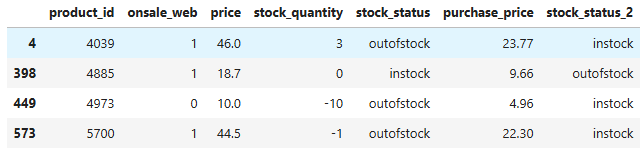

. **pour le product_id 4039 :**  
stock_quantity == 3;
**stock_status =='outofstock' => A REMPLACER PAR 'instock'**

. **pour le product_id 4885 :**  
stock_quantity == 0;
**stock_status =='instock' => A REMPLACER PAR 'outofstock'**

. **pour le product_id 4973 :**  
stock_quantity == -10; **=> A REMPLACER PAR stock_quantity == 0 (voir justificationci-dessous)**
stock_status =='outofstock' 

. **pour le product_id 5700 :**  
stock_quantity == -1; **=> A REMPLACER PAR stock_quantity == 0 (voir justificationci-dessous)**
stock_status =='outofstock' 

##### PM-Explication du choix :

=> pour ces 2 derniers produits il y a une interprétation à avoir :  
- un stock a-t-il le droit d'être négatif (produit déjà vendu, mais pas encore rentré en stock)  
- ou bien n'a-t-il pas le droit d'être négatif (pas de vente avant d'entrée en stock).
- Est-ce une erreur de signe ?

**Le fait que les produits qui ont des signes négatifs aient un statut négatif laisse penser que ce n'est pas un hasard.  
Cela ferait 2 erreurs de suite qui vont dans le même sens.**  
(on peut aussi émettre l'hypothèse d'une système de gestion qui met en outofstock, lorsque stock_quantity<0)

Après recherches,  
nous sommes très probablement face au stock réel (sinon il nous faudrait au moins une colonne stock réel, et une colonne stock disponible, stock à venir),  
**les stocks réels ne doivent pas être négatifs (sauf exception documentée).**
  
Le traitement en général de ces anomalies est de **détecter  
si il y a une erreur de chiffre compréhensible,  
si il ya une documentation du chiffre négatif,  
vérifier le stock réel.**  

Manifestement ici le produit étant outofstock, on suppose que la quantité en stock est de 0.

**Si dans leur gestion il leur arrive de vendre avant d'avoir reçu le produit en réel.  
il serait bon d'ajouter 2 colonnes de la manière suivante :**  
- Le `stock réel` correspond à la quantité physiquement présente dans votre lieu de stockage (entrepôt, camion, bureau, sous-sol, etc.).
- Le `stock disponible` est égal aux quantités dans votre stock réel moins les quantités inclus dans des bons de commande mais pas encore dans les bons de livraison. Ce dernier s'appelle le stock réservé.
- Le `stock à venir` est la quantité de produits inclus dans les ordres d'achat mais qui n'a pas encore été réceptionné.

<u>Sources et justification des règles pour les quantités négatives dans stock_quantity :</u>  

Les raisons pour lesquelles les quantités négatives devraient être interdites (sauf exception) sont basées sur les principes suivants :  
- Bonne gestion des stocks : Dans la plupart des systèmes d'ERP (Enterprise Resource Planning), un stock négatif peut indiquer une erreur dans les  processus de gestion (mauvais ajustement, erreur dans l'entrée des données). Un stock est censé représenter une quantité physique réelle disponible.
- Référence : ISO 9001 (normes de gestion de la qualité) recommande des contrôles stricts pour la traçabilité des données.
- Fiabilité des rapports : Les données de stock sont souvent utilisées pour générer des indicateurs clés (rotation, couverture). Des quantités négatives peuvent fausser ces calculs.
- Exemple :
. Articles de Harvard Business Review (HBR) sur l'importance des données fiables dans la chaîne d'approvisionnement.  
. Règlements comptables et fiscaux : Les lois de gestion des stocks imposent souvent que la quantité réelle soit alignée avec les déclarations. Un stock négatif sans documentation appropriée peut entraîner des erreurs comptables.
- Des exceptions sont parfois prévues, notamment pour :  
. Commandes anticipées : Un stock négatif temporaire peut indiquer un produit vendu avant réception physique (backorder).
. Retours ou ajustements : En cas de gestion des retours ou d'inventaires en cours.  
. Secteurs spécifiques : Par exemple, les services cloud ou virtuels où le "stock" n'est pas tangible.  

##### PM-FIN Explication du choix :

**=> Nous ferons donc le choix ici de mettre les stock_quantity == 0; (et le stock_status_2 =='outofstock')**

##### <u>***Correction de(s) donnée(s) incohérente(s) :***</u>

##### <font color='orange'><u>**CORRECTION DE 4 lignes : 2 stock_status et 2 stock_quantity**</u/font>

. **pour le product_id 4039 :**  
stock_quantity == 3;
**stock_status =='outofstock' => A REMPLACER PAR 'instock'**

. **pour le product_id 4885 :**  
stock_quantity == 0;
**stock_status =='instock' => A REMPLACER PAR 'outofstock'**

. **pour le product_id 4973 :**  
stock_quantity == -10; **=> A REMPLACER PAR stock_quantity == 0 (voir justificationci-dessous)**
stock_status =='outofstock' 

. **pour le product_id 5700 :**  
stock_quantity == -1; **=> A REMPLACER PAR stock_quantity == 0 (voir justificationci-dessous)**
stock_status =='outofstock' 

In [51]:
#Remarque : on sait qu'il n'y a pas de doublons de product_id , donc on peut l'utiliser comme clé
df_erp_1_2.loc[df_erp_1_2['product_id']==4039,'stock_status'] = 'instock'
df_erp_1_2.loc[df_erp_1_2['product_id']==4885,'stock_status'] = 'outofstock'
df_erp_1_2.loc[df_erp_1_2['product_id']==4973,'stock_quantity'] = 0
df_erp_1_2.loc[df_erp_1_2['product_id']==4973,'stock_status_2'] = 'outofstock'
df_erp_1_2.loc[df_erp_1_2['product_id']==5700,'stock_quantity'] = 0
df_erp_1_2.loc[df_erp_1_2['product_id']==5700,'stock_status_2'] = 'outofstock'

In [52]:
df_erp_1_2.loc[Index_pb_stock_status,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2
4,4039,1,46.0,3,instock,23.77,instock
398,4885,1,18.7,0,outofstock,9.66,outofstock
449,4973,0,10.0,0,outofstock,4.96,outofstock
573,5700,1,44.5,0,outofstock,22.30,outofstock


##### <u>***Verification en utilisant le même code que plus haut pour afficher les problemes:***</u>

In [53]:
diff_stock_status = (df_erp_1_2["stock_status"] == df_erp_1_2["stock_status_2"])
#display(diff_stock_status)
print("Le nombre de différence(s) entre les colonnes stock_status et stock_status_2 est de  :",
      (~diff_stock_status).sum()
     )

Le nombre de différence(s) entre les colonnes stock_status et stock_status_2 est de  : 0


##### <u>**VALIDONS ET CONSERVONS CE NETTOYAGE DANS df_erp_Netttoye :**</u>

In [54]:
#VALIDONS CE NETTOYAGE :
df_erp_Nettoye =df_erp_1_2.copy(deep=True)

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.2 - Analyse exploratoire de chaque variable du fichier erp.xlsx</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.1 - Analyse de la variable PRIX</h4>
</div>

In [55]:
#travaillons sur une copie :
df_erp_1_3 =df_erp_Nettoye.copy(deep=True)

In [56]:
df_erp_1_3.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2
0,3847,1,24.2,16,instock,12.88,instock
1,3849,1,34.3,10,instock,17.54,instock
2,3850,1,20.8,0,outofstock,10.64,outofstock
3,4032,1,14.1,26,instock,6.92,instock
4,4039,1,46.0,3,instock,23.77,instock


In [57]:
###############
## LES PRIX  ##
###############

#Vérification des prix: Y a t-il des prix non renseignés, négatif ou nul?
#Afficher le ou les prix non renseignés dans la colonne "price"
#print("Nombres d'article avec un prix non renseignés: {}".format()) #Saisir l'instruction manquante dans la fonction format
#Afficher le prix minimum de la colonne "price"

#Afficher le prix maximum de la colonne "price"

#Affichier les prix inférieurs à 0 (qu'est ce qu'il faut en faire ?)


##### <u>***Vérification des prix: Y a t-il des prix non renseignés, négatif ou nul?***</u>

In [58]:
Description_Fichier_Tableau_avc_ValBlanches(df_erp_1_3['price'])

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
price,float64,825,825,0,383,0


In [59]:
#Afficher le ou les prix non renseignés dans la colonne "price"
df_erp_1_3.loc[df_erp_1_3['price'].isna(),:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2


In [60]:
print("Nombres d'article avec un prix non renseignés: {}".format(df_erp_1_3['price'].isna().sum()))

Nombres d'article avec un prix non renseignés: 0


In [61]:
df_erp_1_3['price'].describe()

count    825.000000
mean      32.187697
std       26.712077
min      -20.000000
25%       14.500000
50%       24.300000
75%       42.000000
max      225.000000
Name: price, dtype: float64

In [62]:
#Afficher le prix minimum de la colonne "price"
df_erp_1_3['price'].min()

-20.0

**=> ANOMALIE A TRAITER : prix négatifs**

In [63]:
#Afficher le prix maximum de la colonne "price"
df_erp_1_3['price'].max()

225.0

In [64]:
#Affichier les prix inférieurs à 0 (qu'est ce qu'il faut en faire ?)
df_erp_1_3.loc[df_erp_1_3['price']<0,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2
151,4233,0,-20.0,0,outofstock,10.33,outofstock
469,5017,0,-8.0,0,outofstock,4.34,outofstock
739,6594,0,-9.1,19,instock,4.61,instock


In [65]:
Index_pb_price_neg = ( df_erp_1_3.loc[df_erp_1_3['price']<0,:] ).index
Index_pb_price_neg

Index([151, 469, 739], dtype='int64')

In [66]:
df_erp_1_3.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2
0,3847,1,24.2,16,instock,12.88,instock
1,3849,1,34.3,10,instock,17.54,instock
2,3850,1,20.8,0,outofstock,10.64,outofstock
3,4032,1,14.1,26,instock,6.92,instock
4,4039,1,46.0,3,instock,23.77,instock


In [67]:
df_erp_1_3['ratio_P_PP']=df_erp_1_3['price']/df_erp_1_3['purchase_price']

In [68]:
df_erp_1_3.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2,ratio_P_PP
0,3847,1,24.2,16,instock,12.88,instock,1.878882
1,3849,1,34.3,10,instock,17.54,instock,1.955530
2,3850,1,20.8,0,outofstock,10.64,outofstock,1.954887
3,4032,1,14.1,26,instock,6.92,instock,2.037572
4,4039,1,46.0,3,instock,23.77,instock,1.935212


In [69]:
df_erp_1_3['ratio_P_PP'].unique()

array([ 1.87888199,  1.95553022,  1.95488722,  2.03757225,  1.93521245,
        1.87945205,  1.86112692,  2.01550388,  2.03735144,  1.93548387,
        1.95503421,  1.8429003 ,  1.93548387,  1.87925998,  1.93605684,
        1.85990338,  1.86085036,  1.9954955 ,  1.86119054,  2.27296727,
        1.99685535,  1.99541284,  1.84322034,  2.01388889,  1.87993681,
        1.89792663,  2.01668985,  1.87989556,  2.01654602,  1.99616123,
        1.93491645,  1.86098655,  1.9953442 ,  1.91646192,  1.93586006,
        2.03691916,  1.91625616,  1.87869822,  1.84441656,  2.03623188,
        1.91631799,  1.97486535,  1.8974359 ,  2.03761755,  1.93621868,
        1.99484093,  1.93482688,  2.01722017,  1.84379001,  2.16040249,
        1.86138614,  1.91608392,  1.99683043,  1.97573657,  1.97530864,
        2.01642336,  1.99687988,  1.84364061,  1.8967587 ,  2.0375    ,
        1.89823875,  1.93732194,  1.89759036,  1.995439  ,  1.9165659 ,
        1.89753321,  1.84294872,  1.99548533,  1.87894073,  1.97

In [70]:
df_erp_1_3['ratio_P_PP'].describe()

count    825.000000
mean       1.915785
std        0.264333
min       -1.973970
25%        1.878941
50%        1.935096
75%        1.995485
max        2.296950
Name: ratio_P_PP, dtype: float64

In [71]:
#Affichier les prix inférieurs à 0 (qu'est ce qu'il faut en faire ?)

##### <font color='orange'><u>**CORRECTION DE 3 lignes : prix négatifs(x-1)**</u></font>
on se rend compte que le rapport entre df_erp_1_3['price']/df_erp_1_3['purchase_price'] est proche de 2.  
C'est le cas également pour nos prix négatifs.  
Il semble donc que seul le signe soit erronné pour ces valeurs.  
=> En conséquence nous changeront simplement le signe de ces lignes :  

In [72]:
df_erp_1_3.loc[Index_pb_price_neg,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2,ratio_P_PP
151,4233,0,-20.0,0,outofstock,10.33,outofstock,-1.936108
469,5017,0,-8.0,0,outofstock,4.34,outofstock,-1.843318
739,6594,0,-9.1,19,instock,4.61,instock,-1.973970


In [73]:
df_erp_1_3.loc[Index_pb_price_neg,'price']=(-1)*df_erp_1_3.loc[Index_pb_price_neg,'price']

In [74]:
df_erp_1_3.loc[Index_pb_price_neg,'ratio_P_PP']=df_erp_1_3['price']/df_erp_1_3['purchase_price']

In [75]:
df_erp_1_3.loc[Index_pb_price_neg,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2,ratio_P_PP
151,4233,0,20.0,0,outofstock,10.33,outofstock,1.936108
469,5017,0,8.0,0,outofstock,4.34,outofstock,1.843318
739,6594,0,9.1,19,instock,4.61,instock,1.973970


In [76]:
#Verification qu'il n'y a plus de prix négatifs :
df_erp_1_3.loc[df_erp_1_3['price']<0,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,stock_status_2,ratio_P_PP


In [77]:
df_erp_1_3['price'].describe()

count    825.000000
mean      32.277636
std       26.603196
min        5.200000
25%       14.500000
50%       24.300000
75%       42.000000
max      225.000000
Name: price, dtype: float64

In [78]:
df_erp_1_3['ratio_P_PP'].describe()

count    825.000000
mean       1.929733
std        0.127165
min        0.163268
25%        1.878941
50%        1.935172
75%        1.995485
max        2.296950
Name: ratio_P_PP, dtype: float64

Je peux supprimer les 2 dernières colonnes `ratio_P_PP` et `stock_status_2` , devenues inutiles,  
avant de valider la modifcation et de la conserver dans df_erp_Nettoye

In [79]:
del df_erp_1_3['ratio_P_PP']
del df_erp_1_3['stock_status_2']
df_erp_1_3.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64
3,4032,1,14.1,26,instock,6.92
4,4039,1,46.0,3,instock,23.77


##### <u>**VALIDONS ET CONSERVONS CE NETTOYAGE DANS df_erp_Netttoye :**</u>

In [80]:
df_erp_Nettoye =df_erp_1_3.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.2 -  Analyse de la variable STOCK</h4>
</div>

In [81]:
#Copie de travail
df_erp_1_4 =df_erp_Nettoye.copy(deep=True)

In [82]:
#######################
### stock_quantity  ###
#######################

#Vérification de la colonne stock quantity
#Afficher la quantité minimum de la colonne "stock_quantity"

#Afficher la quantité maximum de la colonne "stock_quantity"

#Affichier les stocks inférieurs à 0 (qu'est ce qu'il faut en faire ?)


In [83]:
df_erp_1_4.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64
3,4032,1,14.1,26,instock,6.92
4,4039,1,46.0,3,instock,23.77


In [84]:
df_erp_1_4['stock_quantity'].describe()

count    825.000000
mean      21.602424
std       21.917863
min        0.000000
25%        7.000000
50%       18.000000
75%       30.000000
max      145.000000
Name: stock_quantity, dtype: float64

In [85]:
print("stock_quantity : \n",
      'min : ', df_erp_1_4['stock_quantity'].min(),"\n"
      'max : ', df_erp_1_4['stock_quantity'].max(),
     )

stock_quantity : 
 min :  0 
max :  145


In [86]:
df_erp_1_4.loc[df_erp_1_4['stock_quantity']<0,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price


IL n'y a plus de stocks inférieurs à 0 le sujet a été traité au point 2.1.3 :  
Pour les 2 lignes concernées, les stocks ont été remis à zéro.  
Il serait bon :  
- de vérifier les stocks réels pour ces 2 produits.  
- documenter ces valeurs si il y a une explication à ces stocks négatifs

##### => PAS DE NETTOYAGE NECESSAIRE

##### <u>**CONSERVONS df_erp_Netttoye :**</u>

In [87]:
#PAS DE MODIFICATION FAITE : on conserve df_erp_Nettoye inchangé:
df_erp_Nettoye.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64
3,4032,1,14.1,26,instock,6.92
4,4039,1,46.0,3,instock,23.77


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.3 - Analyse de la variable ONSALE_WEB</h4>
</div>

In [88]:
#Copie de travail
df_erp_1_5 =df_erp_Nettoye.copy(deep=True)

##### <u>***Vérification de la colonne onsale_web et de ses valeurs***</u>

In [89]:
#Vérification de la colonne onsale_web et des valeurs qu'elle contient :
df_erp_1_5['onsale_web'].unique()

array([1, 0], dtype=int64)

##### <u>***Que signifient-elles?***</u>

<u>**SENS DE LA COLONNE ONSALE_WEB :**</u>  
La valeur dans la colonne 'ONSALE_WEB' indique si le produit est disponible à la vente en ligne (1 pour oui, 0 pour non)

<u>**PAS DE VALEUR ABERRANTES :**</u>  
Ici on ne détecte pas de valeurs abérrantes, que 0 ou 1 .

##### <u>***`Quelles sont les colonnes à conserver selon vous?***</u>  

**COLONNES A CONSERVER :**
Pour moi les colonnes à conserver sont les suivantes :  
. `product_id` : Identifiant unique du produit.  
. `onsale_web` : Indique si le produit est disponible à la vente en ligne (1 pour oui, 0 pour non).  
. `price` : Prix de vente unitaire du produit.  
. `stock_quantity `: Quantité de produits disponibles en stock.  
. `purchase_price` : Prix d'achat du produit.

**COLONNE stock_status :**
. `stock_status` : Statut du stock (par exemple, "instock" ou "outofstock").  
La colonne `stock_status` est la seule sur laquelle il peut y avoir une discussion.  
En effet dans le cadre d'une Base de Données, elle serait à supprimer car elle est redondante avec la colonne `stock_quantity`. Et on évite la redondance d'information dans les BDD car cela peut créer des problème d'unicité de données et des complications à mettre à jour les BDD.  
Cependant dans le cadre d'une Visualisation sur Python, qui n'est pas une BDD, on peut accepter une colonne stock_status dans un but de visualisation du statut du stock.  
Nous verrons par la suite, si nous pouvons nous passer de cette colonne.


**`Supprimer la colonnecomportant le libellé "stock_status_2" car elle est redondante 
avec la colonne "stock_status".`**

##### **Cette colonne a déjà été supprimée => PAS D'ACTION NECESSAIRE**

##### <u>**CONSERVONS df_erp_Netttoye :**</u>

In [90]:
#PAS DE MODIFICATION FAITE : on conserve df_erp_Nettoye inchangé:
df_erp_Nettoye.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64
3,4032,1,14.1,26,instock,6.92
4,4039,1,46.0,3,instock,23.77


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.4 - Analyse de la variable prix d'achat</h4>
</div>

In [91]:
#Copie de travail
df_erp_1_6 =df_erp_Nettoye.copy(deep=True)

In [92]:
df_erp_1_6.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54


In [93]:
######################
##   prix d'achat   ##
######################

#Vérification de la colonne purchase_price : 
#Afficher le ou les prix non renseignés dans la colonne "purchase_price"

#Afficher le prix minimum de la colonne "purchase_price"

#Afficher le prix maximum de la colonne "purchase_price"


##### <u>***Afficher le ou les prix non renseignés dans la colonne "purchase_price"***</u>

In [94]:
Description_Fichier_Tableau_avc_ValBlanches( df_erp_1_6['purchase_price'] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
purchase_price,float64,825,825,0,660,0


**=> IL n'y a pas de valeurs vides ou blanches dans la colonne 'purchase_price'**

##### <u>***Afficher le prix minimum et maximum de la colonne "purchase_price"***</u>

In [95]:
(df_erp_1_6['purchase_price'] ).describe()

count    825.000000
mean      16.940582
std       14.561840
min        2.740000
25%        7.590000
50%       12.710000
75%       22.020000
max      137.810000
Name: purchase_price, dtype: float64

In [96]:
#ype ((df_erp_1_6['purchase_price'] ).describe())

In [97]:
print("COLONNE 'purchase_price' : ",
      "\n---------------------------"
     )
display( ((df_erp_1_6['purchase_price'] ).describe())[['min','max']])

COLONNE 'purchase_price' :  
---------------------------


min      2.74
max    137.81
Name: purchase_price, dtype: float64

**=> IL n'y a pas d'anomalie notable dans la colonne 'purchase_price'**  
On peut juste relevé que 75% des valeurs sont inférieures à 22 euros .  
Cependant on a un max à 137.81 ; on s'attend donc à avoir des outliers.  
Mais ce ne sont pas des valeurs abérrantes pour ces produits (boissons y compris alcoolisées).

##### <u>**CONSERVONS df_erp_Netttoye :**</u>

In [98]:
#PAS DE MODIFICATION FAITE : on conserve df_erp_Nettoye inchangé:
df_erp_Nettoye.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64
3,4032,1,14.1,26,instock,6.92
4,4039,1,46.0,3,instock,23.77


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.5 -  VERIFICATION COMPLEMENTAIRES df_erp 1</h4>
</div>

In [99]:
#Copie de travail
df_erp_1_7 =df_erp_Nettoye.copy(deep=True)

In [100]:
Description_Fichier_Tableau_avc_ValBlanches(df_erp_1_7)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,825,825,0,825,0
onsale_web,int64,825,825,0,2,0
price,float64,825,825,0,381,0
stock_quantity,int64,825,825,0,82,0
stock_status,object,825,825,0,2,0
purchase_price,float64,825,825,0,660,0


<u>**OBSERVATIONS**</u>  
<u>Observations globales</u>  
. Pas de valeurs vides.  
. Pas de valeurs blanches.  
. Toutes les valeurs sont distinctes dans la colonne product_id qui représente un identifiant.  
Il ne peut donc pas y avoir de ligne en doublons.  
. Si on omet la colonne product_id, il n'y a pas de non-sens ici à avoir 2 lignes identiques (hors product_id).  
. Concerant les types tous les types sont cohérents.  
Seulement le type de stock_status pourrait-être un string.  

##### <font color='orange'><u>**CHANGEONS LE TYPE de stock_status en string**</u></font>

In [101]:
df_erp_1_7 = df_erp_1_7.astype({'stock_status':'string'})

In [102]:
Description_Fichier_Tableau_avc_ValBlanches(df_erp_1_7)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,825,825,0,825,0
onsale_web,int64,825,825,0,2,0
price,float64,825,825,0,381,0
stock_quantity,int64,825,825,0,82,0
stock_status,string[python],825,825,0,2,0
purchase_price,float64,825,825,0,660,0


##### <u>**VALIDONS ET CONSERVONS CE NETTOYAGE DANS df_erp_Netttoye :**</u>

In [103]:
df_erp_Nettoye =df_erp_1_7.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.6 - VERIFICATION COMPLEMENTAIRES df_erp 2</h4>
</div>

In [104]:
df_erp_Nettoye.describe()

,product_id,onsale_web,price,stock_quantity,purchase_price
count,825.000000,825.000000,825.000000,825.000000,825.000000
mean,5162.597576,0.867879,32.277636,21.602424,16.940582
std,902.644635,0.338828,26.603196,21.917863,14.561840
min,3847.000000,0.000000,5.200000,0.000000,2.740000
25%,4348.000000,1.000000,14.500000,7.000000,7.590000
50%,4907.000000,1.000000,24.300000,18.000000,12.710000
75%,5805.000000,1.000000,42.000000,30.000000,22.020000
max,7338.000000,1.000000,225.000000,145.000000,137.810000


In [105]:
#Copie de travail
df_erp_1_8 =df_erp_Nettoye.copy(deep=True)

##### **Recherche de Prix incohérents :**  
Vérifier si price est supérieur à purchase_price (les marges négatives devraient être justifiées).

In [106]:
df_erp_1_8.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54


In [107]:
df_erp_1_8.loc[df_erp_1_8['price']<df_erp_1_8['purchase_price'],:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
210,4355,1,12.65,97,instock,77.48
391,4864,0,8.30,0,outofstock,9.99
724,6324,0,92.00,18,instock,99.00
817,7196,0,31.00,55,instock,31.20


In [108]:
Index_pb_price_inf_purchase_price = ( df_erp_1_8.loc[df_erp_1_8['price']<df_erp_1_8['purchase_price'],:] ).index
Index_pb_price_inf_purchase_price

Index([210, 391, 724, 817], dtype='int64')

##### <u>**ANALYSE DE CES LIGNES :**</u>
Il existe des produits avec des marges négatives (prix de vente inférieur au prix d'achat).  
Notamment le produit product_id 4355 (index 210) vendu 12.65 euros et acheté 77.48 euros.  
Pour les autres produits (product_id : 4864 ,6324, 7196 ) (index 391, 724, 817)   la décôte est moins importante.
Nous ne pouvons savoir si cela est une erreur (de prix de vente, ou d'achat) ou dans le cadre d'une promotion.  
Il serait important d'obtenir une justification sur ces produits à marge négative et notamment pour le produit 4355.  

**La question se pose d'exclure le produit product_id 4355 de l'étude.**  

Dans un premier temps nous ne l'excluons pas. 
Mais nous gardons en tête cet outlier-valeur atypique, qui sera traité par la suite.

##### **=> Préparons le fichier de travail df_erp_1_8 avec une suppression du produit product_id 4355**

In [109]:
#référence de l'index à supprimer et vérification pas de doublon pour product_id == 4355
index_to_drop = (df_erp_1_8.loc[df_erp_1_8['product_id']==4355,:]).index
index_to_drop

Index([210], dtype='int64')

In [110]:
df_erp_1_8.drop(index = index_to_drop , inplace=True)

In [111]:
df_erp_1_8.loc[df_erp_1_8['price']<df_erp_1_8['purchase_price'],:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
391,4864,0,8.3,0,outofstock,9.99
724,6324,0,92.0,18,instock,99.00
817,7196,0,31.0,55,instock,31.20


##### **=> Mais NE VALIDONS PAS pour le moment la suppression du produit product_id 4355 poru des raisons pédagogiques**
TRAITEMENT DES MARGES voir Etape 5.4  
**PAS DE SUPPRESSION SUR df_erp_Nettoye**

##### <u>**CONSERVONS df_erp_Netttoye :**</u>

In [112]:
#PAS DE MODIFICATION FAITE : on conserve df_erp_Nettoye inchangé:
df_erp_Nettoye.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64
3,4032,1,14.1,26,instock,6.92
4,4039,1,46.0,3,instock,23.77


In [113]:
df_erp_Nettoye.loc[df_erp_Nettoye['price']<df_erp_Nettoye['purchase_price'],:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
210,4355,1,12.65,97,instock,77.48
391,4864,0,8.30,0,outofstock,9.99
724,6324,0,92.00,18,instock,99.00
817,7196,0,31.00,55,instock,31.20


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.3 - Analyse exploratoire du fichier web.xlsx</h3>
</div>
 

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.0 -  OBSERVATIONS PREALABLES PERSONNELLES.xlsx</h4>
</div>

##### <u>**PM : OBSERVATIONS PREALABLES PERSONNELLES**</u>

##### **ANALYSE du NOM DES COLONNES (CHAT GPT+correctif personnel) :**  

Le fichier semble être une extraction de données d'un site web ou d'une base WordPress utilisée pour gérer des produits (comme un e-commerce). Voici une présentation des colonnes :

`sku` : Stock Keeping Unit. Identifiant unique attribué à chaque produit pour sa gestion en stock.

`virtual` : Indicateur de produit virtuel (1 pour oui, 0 pour non). Par exemple, un produit virtuel pourrait être un service ou un produit téléchargeable.

`downloadable` : Indique si le produit est téléchargeable (1 pour oui, 0 pour non).

`rating_count` : Nombre total de notes ou évaluations laissées par les clients pour le produit.

`average_rating` : Note moyenne attribuée au produit, basée sur les évaluations des utilisateurs.

`total_sales` : Nombre total de ventes pour chaque produit.

`tax_status` : Statut fiscal du produit (par exemple, "taxable" ou "non-taxable").

`tax_class` : Classe fiscale associée au produit, définissant le taux de taxe applicable (par exemple, "standard", "reduced").

`post_author` : Identifiant de l'utilisateur ou de l'administrateur qui a créé ou édité l'article ou le produit.

`post_date` : Date de création ou publication initiale du produit ou de l'article.

`post_date_gmt` : Date et heure de création du produit ou de l'article au format GMT.

`post_content` : Description complète ou contenu détaillé du produit.

`product_type` : Type de produit (par exemple : vin, champagne, whisky...).

`post_title` : Titre ou nom du produit tel qu'affiché sur le site.

`post_excerpt` : Extrait ou description courte du produit.

`post_status` : Statut de publication du produit (par exemple, "publish", "draft", "private").

`comment_status` : Indique si les commentaires sont autorisés pour le produit (par exemple, "open" ou "closed").

`ping_status` : Statut des pings/trackbacks pour le produit.

`post_password` : Mot de passe pour accéder à l'article ou produit protégé, si applicable.

`post_name` : URL simplifiée ou "slug" utilisée pour le produit.

`post_modified` : Dernière date de modification du produit.

`post_modified_gmt` : Date et heure de la dernière modification au format GMT.

`post_content_filtered` : Contenu filtré, potentiellement utilisé pour des extraits ou affichages spécifiques.

`post_parent` : Identifiant du parent, utile pour des produits groupés ou des variations.

`guid` : Adresse internet du guide du produit

`menu_order` : Ordre du produit dans les menus ou listes.

`post_type` : Type de contenu (par exemple, "product" pour un produit WooCommerce). ici product ou attachment.  
Les produits (product) sont les éléments principaux de la boutique, tandis que les attachements (attachment) enrichissent ces produits avec des contenus visuels ou informatifs.

`post_mime_type` : Type MIME, utilisé pour des fichiers ou médias associés (par exemple, image/jpeg).

`comment_count` : Nombre total de commentaires associés au produit.  

**Observations générales :**  
. Ce fichier contient des métadonnées sur les produits, incluant des informations marketing, de gestion des ventes, et des relations avec les clients.  
. Il est orienté vers une plateforme de gestion de contenu comme WordPress, avec des colonnes propres à cette structure (par exemple, post_author, post_status).

In [114]:
df_web.head()

,sku,virtual,downloadable,rating_count,average_rating,total_sales,tax_status,tax_class,post_author,post_date,...,post_name,post_modified,post_modified_gmt,post_content_filtered,post_parent,guid,menu_order,post_type,post_mime_type,comment_count
0,11862,0,0,0,0.0,3.0,NaN,NaN,2.0,2018-02-12 13:46:23,...,gilles-robin-hermitage-2012,2019-01-31 12:12:56,2019-01-31 11:12:56,NaN,0.0,https://www.bottle-neck.fr/wp-content/uploads/...,0.0,attachment,image/jpeg,0.0
1,16057,0,0,0,0.0,5.0,NaN,NaN,2.0,2018-04-17 15:29:17,...,pelle-sancerre-rouge-la-croix-au-garde-2017,2020-07-07 10:05:02,2020-07-07 08:05:02,NaN,0.0,https://www.bottle-neck.fr/wp-content/uploads/...,0.0,attachment,image/jpeg,0.0
2,14692,0,0,0,0.0,5.0,taxable,NaN,2.0,2019-03-19 10:06:47,...,fonreaud-bordeaux-blanc-le-cygne-2016,2020-04-25 21:40:31,2020-04-25 19:40:31,NaN,0.0,https://www.bottle-neck.fr/?post_type=product&...,0.0,product,NaN,0.0
3,16295,0,0,0,0.0,14.0,NaN,NaN,2.0,2018-02-15 14:05:06,...,moulin-de-gassac-igp-pays-dherault-guilhem-ros...,2020-08-27 18:55:03,2020-08-27 16:55:03,NaN,0.0,https://www.bottle-neck.fr/wp-content/uploads/...,0.0,attachment,image/jpeg,0.0
4,15328,0,0,0,0.0,2.0,taxable,NaN,2.0,2019-03-27 18:05:09,...,agnes-levet-cote-rotie-maestria-2017,2020-07-25 15:45:02,2020-07-25 13:45:02,NaN,0.0,https://www.bottle-neck.fr/?post_type=product&...,0.0,product,NaN,0.0


In [115]:
df_web.shape

(1513, 29)

In [116]:
df_web.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1513 entries, 0 to 1512
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   sku                    1428 non-null   object        
 1   virtual                1513 non-null   int64         
 2   downloadable           1513 non-null   int64         
 3   rating_count           1513 non-null   int64         
 4   average_rating         1430 non-null   float64       
 5   total_sales            1430 non-null   float64       
 6   tax_status             716 non-null    object        
 7   tax_class              0 non-null      float64       
 8   post_author            1430 non-null   float64       
 9   post_date              1430 non-null   datetime64[ns]
 10  post_date_gmt          1430 non-null   datetime64[ns]
 11  post_content           0 non-null      float64       
 12  product_type           1429 non-null   object        
 13  pos

In [117]:
Description_Fichier_Tableau_avc_ValBlanches(df_web)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,1513,1428,85,715,0
virtual,int64,1513,1513,0,1,0
downloadable,int64,1513,1513,0,1,0
rating_count,int64,1513,1513,0,1,0
average_rating,float64,1513,1430,83,2,0
total_sales,float64,1513,1430,83,30,0
tax_status,object,1513,716,797,2,0
tax_class,float64,1513,0,1513,1,0
post_author,float64,1513,1430,83,3,0
post_date,datetime64[ns],1513,1430,83,717,0


In [118]:
Description_Fichier_Tableau_avc_ValBlanches(df_web).T

,sku,virtual,downloadable,rating_count,average_rating,total_sales,tax_status,tax_class,post_author,post_date,...,post_name,post_modified,post_modified_gmt,post_content_filtered,post_parent,guid,menu_order,post_type,post_mime_type,comment_count
Type,object,int64,int64,int64,float64,float64,object,float64,float64,datetime64[ns],...,object,datetime64[ns],datetime64[ns],float64,float64,object,float64,object,object,float64
Nb lignes,1513,1513,1513,1513,1513,1513,1513,1513,1513,1513,...,1513,1513,1513,1513,1513,1513,1513,1513,1513,1513
Valeurs non-vides,1428,1513,1513,1513,1430,1430,716,0,1430,1430,...,1430,1430,1430,0,1430,1430,1430,1430,714,1430
Valeurs vides,85,0,0,0,83,83,797,1513,83,83,...,83,83,83,1513,83,83,83,83,799,83
Valeurs distinctes,715,1,1,1,2,30,2,1,3,717,...,717,590,590,1,2,1431,2,3,2,2
Valeurs blanches,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [119]:
df_1 = Description_Fichier_Tableau_avc_ValBlanches(df_web)

In [120]:
# index des colonnes complètement vides :
( df_1.loc[df_1['Valeurs non-vides']==0,:] ).index

Index(['tax_class', 'post_content', 'post_password', 'post_content_filtered'], dtype='object')

In [121]:
# index des colonnes à une seule valeur :
( df_1.loc[df_1['Valeurs distinctes']==1,:] ).index

Index(['virtual', 'downloadable', 'rating_count', 'tax_class', 'post_content',
       'post_password', 'post_content_filtered'],
      dtype='object')

##### <u>**OBSERVATIONS :**</u>  

. Pas de valeur blanches  

<u>POINTS D'ATTENTION :</u>  

. de nombreuses valeurs sont vides  
. certaines colonnes sont complètement vides :  
['tax_class', 'post_content', 'post_password', 'post_content_filtered']  
et donc n'ont manifestement pas d'intérêt  
. certaines colonnes ne contiennent qu'une seule valeur :  
['virtual', 'downloadable', 'rating_count', 'tax_class', 'post_content', 'post_password', 'post_content_filtered']
et donc leur intérêt est limité

**POINT RGPD :**  
il ne semble pas qu'il y ait de données personnelles.  
Notamment la colonne post_name fait apparaître des noms de vins.  

**Colonne SKU :**  
la colonne SKU est sensée représenter un identifiant, cependant :  
. il existe 85 valeurs vides !  
. il existe des doublons car 1428 valeurs sont non-vides pour 715 valeurs distinctes  
(si on retire la valeur nan, il ya 714 valeurs distinctes)  
. SKU est de type object il aurait du être en int (ou en float si il y avait des nan)

In [122]:
df_web.describe().T

,count,mean,min,25%,50%,75%,max,std
virtual,1513.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
downloadable,1513.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
rating_count,1513.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
average_rating,1430.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
total_sales,1430.0,8.223077,-56.0,5.0,8.0,11.0,122.0,6.721899
tax_class,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
post_author,1430.0,1.998601,1.0,2.0,2.0,2.0,2.0,0.037385
post_date,1430,2018-08-22 03:22:17.090909184,2018-02-08 12:58:52,2018-02-27 20:01:12.500000,2018-04-19 14:56:05,2019-01-31 14:35:47,2020-07-20 11:00:00,NaN
post_date_gmt,1430,2018-08-22 01:53:30.097902080,2018-02-08 11:58:52,2018-02-27 19:01:12.500000,2018-04-19 12:56:05,2019-01-31 13:35:47,2020-07-20 09:00:00,NaN
post_content,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [123]:
df_web.describe(include = np.number).T

,count,mean,std,min,25%,50%,75%,max
virtual,1513.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
downloadable,1513.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
rating_count,1513.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
average_rating,1430.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
total_sales,1430.0,8.223077,6.721899,-56.0,5.0,8.0,11.0,122.0
tax_class,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
post_author,1430.0,1.998601,0.037385,1.0,2.0,2.0,2.0,2.0
post_content,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
post_password,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
post_content_filtered,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### <u>**OBSERVATIONS :**</u>  

. ATTENTION AUX VALEURS NEGATIVES DANS  total_sales

In [124]:
df_web['sku'].unique()

array([11862, 16057, 14692, 16295, 15328, 15471, 16515, 16246, nan, 13572,
       16513, 16585, 16269, 15526, 12869, 15575, 11586, 14338, 15425,
       16560, 15361, 13809, 11587, 15022, 14323, 16342, 16029, 15475,
       13754, 14680, 15875, 9636, 13849, 13662, 16564, 13557, 15429,
       14712, 15032, 15481, 15448, 16580, 15441, 804, 15300, 13958, 16071,
       15678, 13895, 15711, 12882, 16053, 13766, 16247, 12640, 15292,
       15476, 15670, 16189, 16038, 14864, 16044, 15324, 15531, 15953,
       15413, 15733, 14366, 15895, 15892, 16472, 15185, 16010, 15793,
       15849, 12315, 15741, 15934, 15148, 15781, 15659, 15106, 15490,
       14507, 14149, 16307, 13736, 14090, 16037, 15758, 14661, 12587,
       15337, 15489, 15201, 16305, 16131, 13435, 15747, 12203, 14509,
       14768, 16262, 14561, 16505, 15717, 16129, 13460, 15871, 15940,
       11602, 13127, 13520, 15480, 13032, 15436, 15269, 15910, 19821,
       16263, 15138, 15146, 15126, 15482, 16186, 13905, 16540, 15856,
       1567

##### <u>**OBSERVATIONS :**</u>  

. ATTENTION A CETTE VALEUR de SKU : 'bon-cadeau-25-euros'

##### <u>**PM : FIN OBSERVATIONS PREALABLES PERSONNELLES**</u>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.3.1 -  ANALYSE et NETTOYAGE GUIDES de df_web</h4>
</div>

##### <u>**COPIES DE TRAVAIL**</u>

##### **COPIE DE Nettoyage Validé**</u>

In [125]:
#Travaillons sur des copies :
#COPIE de Nettoyage validé
df_web_Nettoye = df_web.copy(deep=True)

##### **COPIE DE Nettoyage En Cours**</u>

In [126]:
#Travaillons sur des copies :
#COPIE de nettoyage en vours
df_web_1_2 = df_web_Nettoye.copy(deep=True)

##### <u>**ANALYSES et NETTOYAGES GUIDES**</u>

In [127]:
#Dimension du dataset
#Nombre d'observations
#Nombre de caractéristiques
print("dimension de df_web : ", df_web_1_2.shape ,
      "\nnombres de lignes : ", df_web_1_2.shape[0],
      "\nnombres de colonnes : ", df_web_1_2.shape[1])

dimension de df_web :  (1513, 29) 
nombres de lignes :  1513 
nombres de colonnes :  29


In [128]:
#Consulter le nombre de colonnes
#La nature des données dans chacune des colonnes
#Le nombre de valeurs présentes dans chacune des colonnes


In [129]:
df_web_1_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1513 entries, 0 to 1512
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   sku                    1428 non-null   object        
 1   virtual                1513 non-null   int64         
 2   downloadable           1513 non-null   int64         
 3   rating_count           1513 non-null   int64         
 4   average_rating         1430 non-null   float64       
 5   total_sales            1430 non-null   float64       
 6   tax_status             716 non-null    object        
 7   tax_class              0 non-null      float64       
 8   post_author            1430 non-null   float64       
 9   post_date              1430 non-null   datetime64[ns]
 10  post_date_gmt          1430 non-null   datetime64[ns]
 11  post_content           0 non-null      float64       
 12  product_type           1429 non-null   object        
 13  pos

<div style="border: 1px solid RGB(51,165,182);" >
<h5 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.3.1.1 - ETUDE DES COLONNES UTILES</h5>
</div>

##### <u>**Selon vous, quelles sont les colonnes à conserver ?**</u>

###### ANALYSE

**COLONNES POTENTIELLEMENT INTERESSANTES pour leur signification dans notre analyse de vente :**  
sku  
rating_count  
average_rating  
total_sales  
tax_status  
tax_class  
post_date_gmt  
product_type  
post_title  
post_name  
post_modified_gmt  
post_parent  
menu_order  
post_type  
comment_count  

**COLONNES COMPLTEMENT VIDES A EXCLURE :**  
['tax_class', 'post_content', 'post_password', 'post_content_filtered']  

**COLONNES MONO-VALEUR avec un intérêt à vérifier :**  
['virtual', 'downloadable', 'rating_count', 'tax_class', 'post_content', 'post_password', 'post_content_filtered']

**ANALYSE DES COLONNES PRESELECTIONNEES :**  

sku =>OK  
rating_count =>KO NON REMPLIE  
average_rating =>KO NON REMPLIE  
total_sales => OK  
tax_status => OK taxable ou vide (mais reliée à post_type : tous les product sont taxables, tous les attachment sont non-taxables)  
(garder dans un premier temps)  
tax_class => KO : non rempli  
post_date_gmt => OK  
product_type =>OK  
post_title =>KO redondant avec post_name  
post_name =>OK  
post_modified_gmt => OK  
post_parent =>KO une seule valeur non exploitable  
menu_order =>KO une seule valeur non exploitable  
post_type => OK pour comprendre ce qui est un produit (product) ou un complément d'information (attachment)    
(intéressnat notamment dans le tri des doublons.  
comment_count =>KO non rempli  

###### <u>**COLONNES CONSERVEES :**</u>  

sku  
total_sales  
tax_status  
post_date_gmt  
product_type  
post_title  
post_name  
post_modified_gmt  
post_type  

<u>**COLONNES CONSERVEES ORDONNEES :**</u>  

['sku' , 'post_type' , 'post_title' , 'product_type' , 'total_sales' , 
'post_date_gmt' , 'post_modified_gmt' , 'post_name' , 'tax_status'  ]


##### <font color='orange'><u>**SUPPRESSION DE 20 COLONNES :*</u></font>

##### **=> CONSERVATION DES COLONNES INTERESSANTES**

In [130]:
#Si vous avez défini des colonnes à supprimer, effectuer l'opération
liste_col_interet_web_1 = ['sku' , 'post_type' , 'post_title' ,
                           'product_type' , 'total_sales' , 'post_date_gmt' , 
                           'post_modified_gmt' , 'post_name' , 'tax_status' ]

In [131]:
df_web_1_2 = df_web_1_2[liste_col_interet_web_1]
df_web_1_2.head(2)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
0,11862,attachment,Gilles Robin Hermitage Rouge 2012,Vin,3.0,2018-02-12 12:46:23,2019-01-31 11:12:56,gilles-robin-hermitage-2012,NaN
1,16057,attachment,Domaine Pellé Sancerre Rouge La Croix Au Garde...,Vin,5.0,2018-04-17 13:29:17,2020-07-07 08:05:02,pelle-sancerre-rouge-la-croix-au-garde-2017,NaN


**VALIDONS ET CONSERVONS NOS MODIFCATION DANS df_web_Netttoye :**

In [132]:
df_web_Nettoye =df_web_1_2.copy(deep=True)

<div style="border: 1px solid RGB(51,165,182);" >
<h5 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.3.1.2 - ETUDE DE LA COLONNE SKU</h5>
</div>

##### <font color='blue'><u>**a.ETUDE DU FORMAT DE CODIFICATION sku**</u></font>

In [133]:
#Travaillons sur des copies :
#COPIE de nettoyage en vours
df_web_1_3 = df_web_Nettoye.copy(deep=True)

In [134]:
#Visualisation des valeurs de la colonne sku
#Quelles sont les valeurs qui ne semblent pas respecter la régle de codification?


In [135]:
df_web_1_3['sku'].unique()

array([11862, 16057, 14692, 16295, 15328, 15471, 16515, 16246, nan, 13572,
       16513, 16585, 16269, 15526, 12869, 15575, 11586, 14338, 15425,
       16560, 15361, 13809, 11587, 15022, 14323, 16342, 16029, 15475,
       13754, 14680, 15875, 9636, 13849, 13662, 16564, 13557, 15429,
       14712, 15032, 15481, 15448, 16580, 15441, 804, 15300, 13958, 16071,
       15678, 13895, 15711, 12882, 16053, 13766, 16247, 12640, 15292,
       15476, 15670, 16189, 16038, 14864, 16044, 15324, 15531, 15953,
       15413, 15733, 14366, 15895, 15892, 16472, 15185, 16010, 15793,
       15849, 12315, 15741, 15934, 15148, 15781, 15659, 15106, 15490,
       14507, 14149, 16307, 13736, 14090, 16037, 15758, 14661, 12587,
       15337, 15489, 15201, 16305, 16131, 13435, 15747, 12203, 14509,
       14768, 16262, 14561, 16505, 15717, 16129, 13460, 15871, 15940,
       11602, 13127, 13520, 15480, 13032, 15436, 15269, 15910, 19821,
       16263, 15138, 15146, 15126, 15482, 16186, 13905, 16540, 15856,
       1567

A l'oeil : on note plusieurs valeurs qui ne semblent pas respecter la codification (que des chiffres ) :  
**13127-1**  
**'bon-cadeau-25-euros'**

il ne semble pas y avoir de restrictions quand à la longueur des nombres.

##### <u>**Si vous avez identifié des codes articles ne respectant pas la régle de codification, consultez-les?**</u>

In [136]:
#\A : en début de chaine (équivalent à ^)
#[0-9] : uncaractère numérique
#1 caractère ou plusa, mais au moins 1
#$ fin de la chaîne
#re_sku : une chaine de caractère qui ne contient que des caractères numériques (et au moins 1
re_sku =  r"\A[0-9]+$"

##### PM TEST

In [137]:
liste_test = [ "", " ",'1', 'a1b', '1ab', 'ab1','452']

In [138]:
for elt in liste_test :
    resultat = re.match(re_sku,elt)
    print(elt," => resultat trouvé", resultat is not None) 

  => resultat trouvé False
   => resultat trouvé False
1  => resultat trouvé True
a1b  => resultat trouvé False
1ab  => resultat trouvé False
ab1  => resultat trouvé False
452  => resultat trouvé True


##### FIN PM TEST

In [139]:
col_sku_string = (df_web_1_3['sku']).astype('string')
col_sku_string.head()

0    11862
1    16057
2    14692
3    16295
4    15328
Name: sku, dtype: string

In [140]:
mask_sku_non_compliant_format = ~col_sku_string.str.match(re_sku)
mask_sku_non_compliant_format

0       False
1       False
2       False
3       False
4       False
        ...  
1508    False
1509    False
1510    False
1511    False
1512    False
Name: sku, Length: 1513, dtype: boolean

In [141]:
df_web_1_3.loc[mask_sku_non_compliant_format,:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
272,13127-1,product,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,2020-06-09 13:42:04,2020-07-20 15:09:06,clos-du-mont-olivet-chateauneuf-du-pape-2007-2,taxable
842,bon-cadeau-25-euros,attachment,Bon cadeau de 25€,Autre,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,NaN
1117,13127-1,attachment,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,2020-06-09 13:42:04,2020-07-20 15:09:06,clos-du-mont-olivet-chateauneuf-du-pape-2007-2,NaN
1387,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,taxable


In [142]:
df_web_1_3.columns

Index(['sku', 'post_type', 'post_title', 'product_type', 'total_sales',
       'post_date_gmt', 'post_modified_gmt', 'post_name', 'tax_status'],
      dtype='object')

In [143]:
liste_col_interet_web_2 =['sku', 'post_type', 
                          'post_title', 'product_type', 
                          'total_sales', 'tax_status']

In [144]:
df_web_1_3.loc[mask_sku_non_compliant_format,liste_col_interet_web_2]

,sku,post_type,post_title,product_type,total_sales,tax_status
272,13127-1,product,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,taxable
842,bon-cadeau-25-euros,attachment,Bon cadeau de 25€,Autre,7.0,NaN
1117,13127-1,attachment,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,NaN
1387,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,taxable


In [145]:
Index_sku_hors_format = (df_web_1_3.loc[mask_sku_non_compliant_format,liste_col_interet_web_2]).index

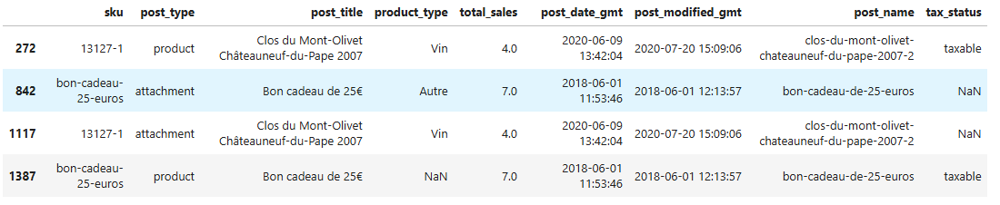

##### <u>**ANALYSE DE CES LIGNES**</u>  
<u>index **842** et **1387** : **bon-cadeau-25-euros** :</u>  
il ne s'agit pas d'un produit de type vin. ces lignes sont à supprimer.  

<u>index **272** et  et **1117** : sku **13127-1** :</u>  
**il semble que cela soit un codage altéré cela devrait être 13127, vérifions qu'il n'y a pas d'autre produit 13127.**  
Je ne me soucie pas ici de faire des doublons car ce doublon existe déjà  
(et qu'il y en a d'autres : les doublons seront traités par la suite).  
Clos du Mont-Olivet Châteauneuf-du-Pape 2007

In [146]:
df_web_1_3.loc[df_web_1_3['sku']==13127,:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
123,13127,product,Clos du Mont-Olivet Châteauneuf-du-Pape 2012,Vin,5.0,2018-02-12 10:18:33,2020-08-24 16:25:02,clos-du-mont-olivet-chateauneuf-du-pape-2012,taxable
713,13127,attachment,Clos du Mont-Olivet Châteauneuf-du-Pape 2012,Vin,5.0,2018-02-12 10:18:33,2020-08-24 16:25:02,clos-du-mont-olivet-chateauneuf-du-pape-2012,NaN


Il existe déjà un vin avec sku 13127 :  
mais pour un autre millésime 2012
Clos du Mont-Olivet Châteauneuf-du-Pape 2012  

Qunad on regarde les autres vins :  
La règle est que 2 vins identiques de millésime différent devraient avoir des sku différents.

Il faut voir aussi comment cela a été enregistré dans la table de liaison.

In [147]:
df_liaison.loc[df_liaison['id_web']==13127]

,id_web,product_id
17,13127,4053


In [148]:
df_liaison.loc[df_liaison['id_web']=='13127-1']

,id_web,product_id
822,13127-1,7247


Dans la table de liaison ce vin est référencé par le code '13127-1'  
Afin de pouvoir faire les jointures nous ne modifierons donc pas cette référence.  
<font color='red'><u>**Cependant il serait bon de modifier cela en base, et de restreindre la codification sku afin d'avoir une homogénéité de traitement**</u></font>  

##### <font color='orange'><u>**=> SUPPRIMONS LES LIGNES BON CADEAU :**</u></font>

In [149]:
df_web_1_3.loc[df_web_1_3['sku']=='bon-cadeau-25-euros',:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
842,bon-cadeau-25-euros,attachment,Bon cadeau de 25€,Autre,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,NaN
1387,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,taxable


In [150]:
index_sku_anormal_a_supprimer = ( df_web_1_3.loc[df_web_1_3['sku']=='bon-cadeau-25-euros',:] ).index
index_sku_anormal_a_supprimer

Index([842, 1387], dtype='int64')

In [151]:
df_web_1_3.drop(index = index_sku_anormal_a_supprimer , inplace=True)

**VERIFICATIONS APRES NETTOYAGE :**

In [152]:
df_web_1_3.loc[df_web_1_3['sku']=='bon-cadeau-25-euros',:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status


In [153]:
re_sku =  r"\A[0-9]+$"
col_sku_string = (df_web_1_3['sku']).astype('string')
mask_sku_non_compliant_format = ~col_sku_string.str.match(re_sku)
df_web_1_3.loc[mask_sku_non_compliant_format,:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
272,13127-1,product,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,2020-06-09 13:42:04,2020-07-20 15:09:06,clos-du-mont-olivet-chateauneuf-du-pape-2007-2,taxable
1117,13127-1,attachment,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,2020-06-09 13:42:04,2020-07-20 15:09:06,clos-du-mont-olivet-chateauneuf-du-pape-2007-2,NaN


In [154]:
df_web_1_3.loc[mask_sku_non_compliant_format,liste_col_interet_web_2]

,sku,post_type,post_title,product_type,total_sales,tax_status
272,13127-1,product,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,taxable
1117,13127-1,attachment,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,NaN


**VALIDONS ET CONSERVONS NOS MODIFCATION DANS df_web_Netttoye :**

In [155]:
df_web_Nettoye =df_web_1_3.copy(deep=True)

##### <font color='blue'><u>**b.ETUDE DES LIGNES SANS code SKU**</u></font>

In [156]:
#Identifier les lignes sans code articles
#Pour les codes articles identifiés, réalisé une analyse et définissez l'action à entreprendre

In [157]:
#Travaillons sur des copies :
#COPIE de nettoyage en vours
df_web_1_4 = df_web_Nettoye.copy(deep=True)

In [158]:
df_web_1_4.head(2)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
0,11862,attachment,Gilles Robin Hermitage Rouge 2012,Vin,3.0,2018-02-12 12:46:23,2019-01-31 11:12:56,gilles-robin-hermitage-2012,NaN
1,16057,attachment,Domaine Pellé Sancerre Rouge La Croix Au Garde...,Vin,5.0,2018-04-17 13:29:17,2020-07-07 08:05:02,pelle-sancerre-rouge-la-croix-au-garde-2017,NaN


In [159]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_4)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,1511,1426,85,714,0
post_type,object,1511,1428,83,3,0
post_title,object,1511,1428,83,713,0
product_type,object,1511,1428,83,7,0
total_sales,float64,1511,1428,83,30,0
post_date_gmt,datetime64[ns],1511,1428,83,716,0
post_modified_gmt,datetime64[ns],1511,1428,83,589,0
post_name,object,1511,1428,83,716,0
tax_status,object,1511,715,796,2,0


**=>Il semble exister 85 lignes dont le sku est vide**  
Etudions le contenu de ces lignes

In [160]:
df_web_1_4_sans_sku = df_web_1_4.loc[df_web_1_4['sku'].isna()  ,:]
df_web_1_4_sans_sku.head()

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
8,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
20,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
30,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
37,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
41,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN


In [161]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_4_sans_sku)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,85,0,85,1,0
post_type,object,85,2,83,2,0
post_title,object,85,2,83,3,0
product_type,object,85,2,83,2,0
total_sales,float64,85,2,83,3,0
post_date_gmt,datetime64[ns],85,2,83,3,0
post_modified_gmt,datetime64[ns],85,2,83,3,0
post_name,object,85,2,83,3,0
tax_status,object,85,2,83,2,0


In [162]:
#identifions les lignes non nulles
#Regardons les valeurs dans post_title
df_web_1_4_sans_sku['post_title'].unique()

array([nan, 'Pierre Jean Villa Condrieu Jardin Suspendu 2018',
       'Pierre Jean Villa Côte Rôtie Fongeant 2017'], dtype=object)

il y a 2 valeurs distinctes et des nan.  
Etudions déjà les 2 lignes avec un titre :
['Pierre Jean Villa Condrieu Jardin Suspendu 2018',
       'Pierre Jean Villa Côte Rôtie Fongeant 2017']

In [163]:
liste_post_title_hors_nan = df_web_1_4_sans_sku['post_title'].unique()
liste_post_title_hors_nan

array([nan, 'Pierre Jean Villa Condrieu Jardin Suspendu 2018',
       'Pierre Jean Villa Côte Rôtie Fongeant 2017'], dtype=object)

##### PM RECHERCHES (je n'ai pas réussi à faire sauter le nan dans le np.array donc je vais le faire dans une liste)

In [164]:
type(liste_post_title_hors_nan)

numpy.ndarray

In [165]:
#help(np.ndarray)

In [166]:
# ERREUR : cannot delete array elements
#liste_post_title_hors_nan.__delitem__(0)

In [167]:
#liste_post_title_hors_nan_2.__delitem__

In [168]:
#ERREUR : invalid syntax
#Delete liste_post_title_hors_nan_2[nan]

In [169]:
#ERREUR : name 'nan' is not defined
#liste_post_title_hors_nan.__delitem__(nan)

##### PM RECHERCHES (je n'ai pas réussi à faire sauter le nan dans le np.array donc je vais le faire dans une liste)

In [170]:
liste_post_title_hors_nan_2 = liste_post_title_hors_nan.tolist()
liste_post_title_hors_nan_2.remove(np.nan)
liste_post_title_hors_nan_2

['Pierre Jean Villa Condrieu Jardin Suspendu 2018',
 'Pierre Jean Villa Côte Rôtie Fongeant 2017']

In [171]:
#Affichage des lignes avec titre
df_web_1_4_sans_sku.loc[df_web_1_4_sans_sku['post_title'].isin(liste_post_title_hors_nan_2),:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1084,NaN,product,Pierre Jean Villa Condrieu Jardin Suspendu 2018,Vin,-56.0,2018-08-08 09:23:43,2019-11-02 12:24:01,pierre-jean-villa-condrieu-suspendu-2018,taxable
1087,NaN,product,Pierre Jean Villa Côte Rôtie Fongeant 2017,Vin,-17.0,2018-07-31 10:07:23,2019-11-02 12:24:15,pierre-jean-villa-cote-rotie-fongeant-2017,taxable


Il manque le sku.  
1. il faut que je vois s'il ne s'agit pas de doublon dont on connait déjà le sku.  
(Sinon Il faudra que je vois si je peux le retrouver avec df_erp et df_liaison  
Et sinon cela ne sert à rien que je le garde car je n'aurais pas de données exploitables)

In [172]:
#recherche d'autres lignes avec les mêmes titres mais avec un sku :
df_web_1_4.loc[df_web_1_4['post_title'].isin(liste_post_title_hors_nan_2),:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1084,NaN,product,Pierre Jean Villa Condrieu Jardin Suspendu 2018,Vin,-56.0,2018-08-08 09:23:43,2019-11-02 12:24:01,pierre-jean-villa-condrieu-suspendu-2018,taxable
1087,NaN,product,Pierre Jean Villa Côte Rôtie Fongeant 2017,Vin,-17.0,2018-07-31 10:07:23,2019-11-02 12:24:15,pierre-jean-villa-cote-rotie-fongeant-2017,taxable


In [173]:
df_web_1_4.loc[df_web_1_4['post_title'].isin(liste_post_title_hors_nan_2),liste_col_interet_web_2]

,sku,post_type,post_title,product_type,total_sales,tax_status
1084,NaN,product,Pierre Jean Villa Condrieu Jardin Suspendu 2018,Vin,-56.0,taxable
1087,NaN,product,Pierre Jean Villa Côte Rôtie Fongeant 2017,Vin,-17.0,taxable


##### **=>Il n'ya pas d'autres lignes avec sku ayant le même titre**  
Recherchons dans df_erp

In [174]:
df_erp_Nettoye.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54


##### **PAS D'information permettant d'identifier les 2 lignes NON NULLES SANS SKU :**
La table df_erp ou df_liaison ne nous permettrons pas de retrouver à quoi correspondent ces lignes.  
Nous ne pourrons donc pas les exploiter dans le cadre de notre étude.  
Il n'y a donc pas d'intérêt à les conserver.  

##### <font color='red'>**IL serait intéressant de demander des recherches pour re trouver le product_id et id_web de cette bouteille, ou les créer**</font>

##### <font color='orange'>**=>SUPPRIMONS les 2 lignes NON NULLES SANS SKU : dans df_web_1_4 et df_web_1_4_sans_sku**</font>

##### **=>suppression dans df_web_1_4_sans_sku**

In [175]:
df_web_1_4_sans_sku.loc[df_web_1_4_sans_sku['post_title'].isin(liste_post_title_hors_nan_2),:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1084,NaN,product,Pierre Jean Villa Condrieu Jardin Suspendu 2018,Vin,-56.0,2018-08-08 09:23:43,2019-11-02 12:24:01,pierre-jean-villa-condrieu-suspendu-2018,taxable
1087,NaN,product,Pierre Jean Villa Côte Rôtie Fongeant 2017,Vin,-17.0,2018-07-31 10:07:23,2019-11-02 12:24:15,pierre-jean-villa-cote-rotie-fongeant-2017,taxable


In [176]:
index_sans_sku_non_nulles_a_suppr = (df_web_1_4_sans_sku.loc[df_web_1_4_sans_sku['post_title'].isin(liste_post_title_hors_nan_2),:] ).index
index_sans_sku_non_nulles_a_suppr

Index([1084, 1087], dtype='int64')

In [177]:
df_web_1_4_sans_sku.drop(index = index_sans_sku_non_nulles_a_suppr , inplace=True)

In [178]:
df_web_1_4_sans_sku.loc[df_web_1_4_sans_sku['post_title'].isin(liste_post_title_hors_nan_2),:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status


##### **=>suppression dans df_web_1_4**

In [179]:
df_web_1_4.loc[df_web_1_4['post_title'].isin(liste_post_title_hors_nan_2),:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1084,NaN,product,Pierre Jean Villa Condrieu Jardin Suspendu 2018,Vin,-56.0,2018-08-08 09:23:43,2019-11-02 12:24:01,pierre-jean-villa-condrieu-suspendu-2018,taxable
1087,NaN,product,Pierre Jean Villa Côte Rôtie Fongeant 2017,Vin,-17.0,2018-07-31 10:07:23,2019-11-02 12:24:15,pierre-jean-villa-cote-rotie-fongeant-2017,taxable


In [180]:
index_sans_sku_non_nulles_a_suppr = (df_web_1_4.loc[df_web_1_4['post_title'].isin(liste_post_title_hors_nan_2),:] ).index
index_sans_sku_non_nulles_a_suppr

Index([1084, 1087], dtype='int64')

In [181]:
df_web_1_4.drop(index = index_sans_sku_non_nulles_a_suppr , inplace=True)

In [182]:
df_web_1_4.loc[df_web_1_4['post_title'].isin(liste_post_title_hors_nan_2),:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status


##### **REPRENONS LA SUITE DE L'ETUDE DES LIGNES SANS SKU :**

In [183]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_4)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,1509,1426,83,714,0
post_type,object,1509,1426,83,3,0
post_title,object,1509,1426,83,711,0
product_type,object,1509,1426,83,7,0
total_sales,float64,1509,1426,83,28,0
post_date_gmt,datetime64[ns],1509,1426,83,714,0
post_modified_gmt,datetime64[ns],1509,1426,83,587,0
post_name,object,1509,1426,83,714,0
tax_status,object,1509,713,796,2,0


In [184]:
df_web_1_4_sans_sku_2 = df_web_1_4.loc[df_web_1_4['sku'].isna()  ,:]
df_web_1_4_sans_sku.head()

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
8,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
20,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
30,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
37,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
41,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN


In [185]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_4_sans_sku_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,83,0,83,1,0
post_type,object,83,0,83,1,0
post_title,object,83,0,83,1,0
product_type,object,83,0,83,1,0
total_sales,float64,83,0,83,1,0
post_date_gmt,datetime64[ns],83,0,83,1,0
post_modified_gmt,datetime64[ns],83,0,83,1,0
post_name,object,83,0,83,1,0
tax_status,object,83,0,83,1,0


##### MAINTENANT TOUTES LES LIGNES RESTANTES SONT TOTALEMENT VIDES**  
**=> et nous allons donc pouvoir les SUPPRIMER TOUT SIMPLEMENT**

##### <font color ='red'>**Il serait intéressant de supprimer ces lignes vides de la base de données**</font>

##### <font color='orange'>**=>SUPPRIMONS les 83 lignes NULLES SANS SKU : dans df_web_1_4 directement**</font>

##### **=>suppression dans df_web_1_4**

In [186]:
Description_Fichier_Tableau_avc_ValBlanches( df_web_1_4)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,1509,1426,83,714,0
post_type,object,1509,1426,83,3,0
post_title,object,1509,1426,83,711,0
product_type,object,1509,1426,83,7,0
total_sales,float64,1509,1426,83,28,0
post_date_gmt,datetime64[ns],1509,1426,83,714,0
post_modified_gmt,datetime64[ns],1509,1426,83,587,0
post_name,object,1509,1426,83,714,0
tax_status,object,1509,713,796,2,0


In [187]:
index_sans_sku_nulles_a_supprimer = (df_web_1_4.loc[df_web_1_4['sku'].isna()  ,:] ).index
index_sans_sku_nulles_a_supprimer

Index([   8,   20,   30,   37,   41,   47,   55,   75,   94,  127,  130,  136,
        153,  162,  169,  184,  198,  199,  244,  264,  269,  290,  319,  339,
        352,  359,  364,  373,  376,  379,  409,  421,  425,  515,  522,  541,
        550,  557,  602,  612,  622,  639,  640,  666,  678,  696,  703,  714,
        717,  726,  778,  797,  819,  822,  829,  836,  944,  947,  968,  971,
        987, 1005, 1018, 1045, 1065, 1086, 1098, 1135, 1137, 1151, 1194, 1231,
       1244, 1254, 1263, 1301, 1329, 1332, 1384, 1429, 1432, 1445, 1457],
      dtype='int64')

In [188]:
Description_Fichier_Tableau_avc_ValBlanches( df_web_1_4.loc[index_sans_sku_nulles_a_supprimer,:] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,83,0,83,1,0
post_type,object,83,0,83,1,0
post_title,object,83,0,83,1,0
product_type,object,83,0,83,1,0
total_sales,float64,83,0,83,1,0
post_date_gmt,datetime64[ns],83,0,83,1,0
post_modified_gmt,datetime64[ns],83,0,83,1,0
post_name,object,83,0,83,1,0
tax_status,object,83,0,83,1,0


In [189]:
df_web_1_4.drop(index = index_sans_sku_nulles_a_supprimer ,inplace=True)

In [190]:
Description_Fichier_Tableau_avc_ValBlanches( df_web_1_4.loc[df_web_1_4['sku'].isna()  ,:] )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,0,0,0,0,0
post_type,object,0,0,0,0,0
post_title,object,0,0,0,0,0
product_type,object,0,0,0,0,0
total_sales,float64,0,0,0,0,0
post_date_gmt,datetime64[ns],0,0,0,0,0
post_modified_gmt,datetime64[ns],0,0,0,0,0
post_name,object,0,0,0,0,0
tax_status,object,0,0,0,0,0


In [191]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_4)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,1426,1426,0,713,0
post_type,object,1426,1426,0,2,0
post_title,object,1426,1426,0,710,0
product_type,object,1426,1426,0,6,0
total_sales,float64,1426,1426,0,27,0
post_date_gmt,datetime64[ns],1426,1426,0,713,0
post_modified_gmt,datetime64[ns],1426,1426,0,586,0
post_name,object,1426,1426,0,713,0
tax_status,object,1426,713,713,2,0


**=> Il n'y a plus de lignes avec sku vide.**

**VALIDONS ET CONSERVONS NOS MODIFCATION DANS df_web_Netttoye :**

In [192]:
df_web_Nettoye =df_web_1_4.copy(deep=True)

In [193]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,1426,1426,0,713,0
post_type,object,1426,1426,0,2,0
post_title,object,1426,1426,0,710,0
product_type,object,1426,1426,0,6,0
total_sales,float64,1426,1426,0,27,0
post_date_gmt,datetime64[ns],1426,1426,0,713,0
post_modified_gmt,datetime64[ns],1426,1426,0,586,0
post_name,object,1426,1426,0,713,0
tax_status,object,1426,713,713,2,0


##### REPONSES AUX QUESTIONS DE L'énoncé pour la forme (déjà traité ci-dessus)

#Les lignes sans code article semble être toutes non renseignées  
#Pour s'en assurer réaliser les étapes suivantes:  
#1 - Créer un dataframe avec uniquement les lignes sans code article =>DEJA FAIT    
#2 - utiliser la fonction df.info() sur ce nouveau dataframe pour observer le nombre de valeur reseigner dans chacune des colonnes  
=>DEJA FAIT : AVEC MA FONCTION  
#3 - Que constatez-vous?  
DEJA VU : il y a 2 lignes avec des valeurs.

##### FIN -REPONSES AUX QUESTIONS DE L'énoncé pour la forme (déjà traité ci-dessus)

##### <font color = 'blue'><u>**c. ETUDE DES doublons de code SKU**</u></font>

In [194]:
#Travaillons sur des copies :
#COPIE de nettoyage en cours
df_web_1_5 = df_web_Nettoye.copy(deep=True)

##### <u>***La clé pour chaque ligne est-elle uniques? ou autrement dit, y a-t-il des doublons?***</u>

In [195]:
df_web_1_5.head(2)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
0,11862,attachment,Gilles Robin Hermitage Rouge 2012,Vin,3.0,2018-02-12 12:46:23,2019-01-31 11:12:56,gilles-robin-hermitage-2012,NaN
1,16057,attachment,Domaine Pellé Sancerre Rouge La Croix Au Garde...,Vin,5.0,2018-04-17 13:29:17,2020-07-07 08:05:02,pelle-sancerre-rouge-la-croix-au-garde-2017,NaN


In [196]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_5)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,1426,1426,0,713,0
post_type,object,1426,1426,0,2,0
post_title,object,1426,1426,0,710,0
product_type,object,1426,1426,0,6,0
total_sales,float64,1426,1426,0,27,0
post_date_gmt,datetime64[ns],1426,1426,0,713,0
post_modified_gmt,datetime64[ns],1426,1426,0,586,0
post_name,object,1426,1426,0,713,0
tax_status,object,1426,713,713,2,0


Dans la colonne sku : il y a 1426 lignes, pour 713 valeurs distinctes et plus de np.nan

<u>**QUESTION DES DOUBLONS :**</u>  
D'abord supprimer les SKU sans valeurs : FAIT.

Puis, piste à étudier : pour moi les product sont des produits, les attachment sont des doublons.  
- trier (sort_value desc) pour avoir les produits en premier les attachment en dernier.  
- Faire sauter les doublons en ne gardant que le premier.  
- Vérifier si il n'y a plus de post_type attachment ce qui confirmerait que ce sont les doublones (compléments d'info sur un produit)  

<u>Complément :</u>  
regarder on ne devrait avoir dans tax-status que des statuts taxable.  
Dans ce cas cette colonne n'a plus de sens.
En effet on avait (product <=> taxable et attachment <=> non taxable).  
Si on a bien que des product qui sont conservés. ils sont tous taxables et cette colonne n'apporte plus une info intérressante.  
=>Supprimer cette colonne devenue inutile.

On rappelle :  
Les `produits (product)` sont les éléments principaux de la boutique,  
tandis que les `attachements (attachment)` enrichissent ces produits avec des contenus visuels ou informatifs.

In [197]:
df_web_1_5.sort_values(by = 'post_type', ascending=False,inplace=True)

In [198]:
df_web_1_5.head(3)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,2018-05-11 12:59:33,2020-08-26 07:35:02,jacqueson-rully-blanc-1er-cru-la-pucelle-2018,taxable
1219,14323,product,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0,2019-02-15 17:07:59,2019-08-31 08:50:04,domaine-clerget-vosne-romanee-les-violettes-2015,taxable
617,16138,product,Camin Larredya Jurançon Moelleux Costat Darrer...,Vin,8.0,2018-04-18 18:43:01,2020-08-26 15:35:03,camin-larredya-jurancon-moelleux-costat-darrer...,taxable


In [199]:
df_web_1_5.tail(3)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
713,13127,attachment,Clos du Mont-Olivet Châteauneuf-du-Pape 2012,Vin,5.0,2018-02-12 10:18:33,2020-08-24 16:25:02,clos-du-mont-olivet-chateauneuf-du-pape-2012,NaN
715,15561,attachment,Maurel Pays d'Oc Merlot 2018,Vin,17.0,2019-03-15 09:20:59,2020-08-14 08:55:02,maurel-pays-d-oc-merot-2018,NaN
1512,16004,attachment,Château du Couvent Pomerol 2017,Vin,5.0,2018-06-07 14:27:25,2020-08-25 16:35:02,chateau-du-couvent-pomerol-2017,NaN


In [200]:
#Un exemple : 
df_web_1_5.loc[df_web_1_5['sku']==15807,:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,2018-05-11 12:59:33,2020-08-26 07:35:02,jacqueson-rully-blanc-1er-cru-la-pucelle-2018,taxable
562,15807,attachment,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,2018-05-11 12:59:33,2020-08-26 07:35:02,jacqueson-rully-blanc-1er-cru-la-pucelle-2018,NaN


In [201]:
#Un exemple plus concis : 
df_web_1_5.loc[df_web_1_5['sku']==15807,liste_col_interet_web_2]

,sku,post_type,post_title,product_type,total_sales,tax_status
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,taxable
562,15807,attachment,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,NaN


In [202]:
#Un autre exemple : 
df_web_1_5.loc[df_web_1_5['sku']==14323,:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1219,14323,product,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0,2019-02-15 17:07:59,2019-08-31 08:50:04,domaine-clerget-vosne-romanee-les-violettes-2015,taxable
25,14323,attachment,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0,2019-02-15 17:07:59,2019-08-31 08:50:04,domaine-clerget-vosne-romanee-les-violettes-2015,NaN


In [203]:
#Un autre exemple : 
df_web_1_5.loc[df_web_1_5['sku']==16004,:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
642,16004,product,Château du Couvent Pomerol 2017,Vin,5.0,2018-06-07 14:27:25,2020-08-25 16:35:02,chateau-du-couvent-pomerol-2017,taxable
1512,16004,attachment,Château du Couvent Pomerol 2017,Vin,5.0,2018-06-07 14:27:25,2020-08-25 16:35:02,chateau-du-couvent-pomerol-2017,NaN


Il semble bien que la seule chose qui différencie les doublons entre eux c'est que l'un est un product/produit réel (taxable),  
et que l'autre est un attachment (éléments associé, image, info complémentaire) (sans info de taxation).  

##### <u>**ANALYSE DES DOUBLONS AU SENS 1 :**</u>  
colonnes_caract_web_doublon = ['sku', 'post_title', 'product_type', 'total_sales', 'post_date_gmt', 'post_modified_gmt', 'post_name']

**=> VERIFIONS SI CELA SE VERIFIE : Trions les premières valeurs, et les doublons et regardons si cela coicident avec les valeurs originelles et les doublons.**  

Nous entendrons ici comme doublon une ligne identique sauf pour les élément post_type et tax_status.

In [204]:
df_web_1_5.columns

Index(['sku', 'post_type', 'post_title', 'product_type', 'total_sales',
       'post_date_gmt', 'post_modified_gmt', 'post_name', 'tax_status'],
      dtype='object')

In [205]:
colonnes_caract_web_doublon = ['sku', 'post_title', 'product_type', 'total_sales',
       'post_date_gmt', 'post_modified_gmt', 'post_name']

In [206]:
#retrouve-t-onbien des doublons selon ses caractéristiques :
df_web_1_5.duplicated(subset = colonnes_caract_web_doublon,keep='first').value_counts()

False    717
True     709
Name: count, dtype: int64

In [207]:
double = (df_web_1_5.duplicated(subset = colonnes_caract_web_doublon,keep='first')).sum()
valeur_initiale = (~(df_web_1_5.duplicated(subset = colonnes_caract_web_doublon,keep='first') )).sum()

print("nous avons :",
      "\n", valeur_initiale, "valeures initiales",
      "\n", double, "valeures doublons")


nous avons : 
 717 valeures initiales 
 709 valeures doublons


In [208]:
mask_valeur_initiale = ~(df_web_1_5.duplicated(subset = colonnes_caract_web_doublon,keep='first'))
df_web_1_5_valeur_initiale = df_web_1_5.loc[mask_valeur_initiale,:]
df_web_1_5_valeur_initiale.head(3)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,2018-05-11 12:59:33,2020-08-26 07:35:02,jacqueson-rully-blanc-1er-cru-la-pucelle-2018,taxable
1219,14323,product,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0,2019-02-15 17:07:59,2019-08-31 08:50:04,domaine-clerget-vosne-romanee-les-violettes-2015,taxable
617,16138,product,Camin Larredya Jurançon Moelleux Costat Darrer...,Vin,8.0,2018-04-18 18:43:01,2020-08-26 15:35:03,camin-larredya-jurancon-moelleux-costat-darrer...,taxable


In [209]:
mask_double = (df_web_1_5.duplicated(subset = colonnes_caract_web_doublon,keep='first'))
df_web_1_5_double = df_web_1_5.loc[mask_double,:]
df_web_1_5_double.head(3)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1082,15605,attachment,Château de La Liquière Faugères Cistus Rouge 2017,Vin,10.0,2018-02-15 09:42:15,2020-08-26 08:45:03,chateau-de-la-liquiere-faugeres-cistus-rouge-2017,NaN
1466,15928,attachment,Cave de Castelmaure Corbières Rouge Vigneron 2018,Vin,0.0,2018-05-17 09:53:08,2020-08-27 14:05:03,cave-de-castelmaure-corbieres-rouge-vigneron-2018,NaN
1022,15773,attachment,Saumaize-Michelin Pouilly-Fuissé Clos sur la R...,Vin,5.0,2018-05-11 12:10:53,2020-07-31 07:30:09,saumaize-michelin-pouilly-fuisse-clos-sur-la-r...,NaN


In [210]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_5_valeur_initiale)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,717,717,0,713,0
post_type,object,717,717,0,2,0
post_title,object,717,717,0,710,0
product_type,object,717,717,0,6,0
total_sales,float64,717,717,0,27,0
post_date_gmt,datetime64[ns],717,717,0,713,0
post_modified_gmt,datetime64[ns],717,717,0,586,0
post_name,object,717,717,0,713,0
tax_status,object,717,713,4,2,0


In [211]:
df_web_1_5_valeur_initiale['post_type'].unique()

array(['product', 'attachment'], dtype=object)

In [212]:
df_web_1_5_double['post_type'].unique()

array(['attachment'], dtype=object)

Visiblement il existe quelques valeurs attachment qui ne sont pas les doubles de product.  
Par contre tous les doublons sont des attachment.(A vérifier si ils sont tous les doubles de product).

In [213]:
#la liste des index des doublons.  
#puisque ce sont des doublons, ils sont forcément dans df_web_1_5_valeur_initiale
liste_sku_doublons = df_web_1_5_double['sku'].unique()

In [214]:
print("quels sont les types de post_type dans les valeurs initiales, associés aux index qui sont dans les doublons :")
print( 
    (df_web_1_5_valeur_initiale.loc[df_web_1_5_valeur_initiale['sku'].isin(liste_sku_doublons),'post_type'] ).unique() 
)

quels sont les types de post_type dans les valeurs initiales, associés aux index qui sont dans les doublons :
['product']


**CONCLUSION :  
TOUS LES DOUBLONS dans df_web_1_5_double  SONT DES DOUBLONS DE PRODUCT dans df_web_1_5_valeur_initiale.**  

**RESTE A ETUDIER les lignes attachment dans df_web_1_5_valeur_initiale**

In [215]:
df_web_1_5_valeur_initiale.loc[df_web_1_5_valeur_initiale['post_type']=='attachment',:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
452,14950,attachment,François Baur Pinot Noir Schlittweg 2017,Vin,122.0,2018-04-18 09:53:51,2020-05-06 09:35:01,francois-baur-pinot-noir-schlittweg-2017,NaN
114,14561,attachment,Argentine Mendoza Alamos Torrontes 2017,Vin,111.0,2018-09-01 13:34:55,2020-07-11 12:00:03,argentine-mendoza-alamos-torrontes-2017,NaN
219,15346,attachment,Albert Mann Pinot Noir Grand H 2017,Vin,22.0,2018-07-31 09:49:05,2020-02-13 16:00:01,albert-mann-pinot-noir-grand-h-2017,NaN
523,1366,attachment,Champagne Mailly Grand Cru Intemporelle 2010,Champagne,116.0,2018-02-13 12:45:31,2020-08-26 16:05:02,champagne-mailly-grand-cru-intemporelle-2010,NaN


In [216]:
#index correspondant à ces attachment qui n'ont pas de product asscociés :
liste_sku_initales_attachment = (df_web_1_5_valeur_initiale.loc[df_web_1_5_valeur_initiale['post_type']=='attachment','sku'] ).unique()
liste_sku_initales_attachment

array([14950, 14561, 15346, 1366], dtype=object)

In [217]:
#quels sont les lignes du fichier associés à ces sku :
df_web_1_5.loc[df_web_1_5['sku'].isin(liste_sku_initales_attachment),:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
548,1366,product,Champagne Mailly Grand Cru Intemporelle 2010,Champagne,6.0,2018-02-13 12:45:31,2020-08-26 16:05:02,champagne-mailly-grand-cru-intemporelle-2010,taxable
999,14950,product,François Baur Pinot Noir Schlittweg 2017,Vin,22.0,2018-04-18 09:53:51,2020-05-06 09:35:01,francois-baur-pinot-noir-schlittweg-2017,taxable
1052,14561,product,Argentine Mendoza Alamos Torrontes 2017,Vin,11.0,2018-09-01 13:34:55,2020-07-11 12:00:03,argentine-mendoza-alamos-torrontes-2017,taxable
843,15346,product,Albert Mann Pinot Noir Grand H 2017,Vin,2.0,2018-07-31 09:49:05,2020-02-13 16:00:01,albert-mann-pinot-noir-grand-h-2017,taxable
452,14950,attachment,François Baur Pinot Noir Schlittweg 2017,Vin,122.0,2018-04-18 09:53:51,2020-05-06 09:35:01,francois-baur-pinot-noir-schlittweg-2017,NaN
114,14561,attachment,Argentine Mendoza Alamos Torrontes 2017,Vin,111.0,2018-09-01 13:34:55,2020-07-11 12:00:03,argentine-mendoza-alamos-torrontes-2017,NaN
219,15346,attachment,Albert Mann Pinot Noir Grand H 2017,Vin,22.0,2018-07-31 09:49:05,2020-02-13 16:00:01,albert-mann-pinot-noir-grand-h-2017,NaN
523,1366,attachment,Champagne Mailly Grand Cru Intemporelle 2010,Champagne,116.0,2018-02-13 12:45:31,2020-08-26 16:05:02,champagne-mailly-grand-cru-intemporelle-2010,NaN


<u>**OBSERVATION :**</u>  
Il semble qu'en réalité les **attachments dans df_web_1_5_valeur_initiale** soient **aussi  
des doublons de product** également **dans df_web_1_5_valeur_initiale**.  
Cependant ils n'ont pas été détectés en doublon sur les caractéristiques  
colonnes_caract_web_doublon = ['sku', 'post_title', 'product_type', 'total_sales', 'post_date_gmt', 'post_modified_gmt', 'post_name']  
car la **colonne total_sales** est **différente entre le product et l'attachment**.  
Nous devrions donc faire un choix pour savoir quelle valeur de total_sales garder.  
Supposant que la ligne product est celle qui contient les réelles caractéristiques,  
et que la ligne attachment ne correspond à pas un produit réel.  
Nous supposons que la valeur qui a été bien mise à jour et exploitée est celle de la ligne product.  

<font color='red'>Suggestions : il s'agit là d'un doublon de données induisant des erreurs potentielles. Un attachment devrait donc plutôt être une autre entité que l'on rattache à un product, (plutôt que d'en faire un doublon avec ses caractéristiques en doubles et de potentielles erreures de cohérence lors de mises à jour comme ici sur les total_sales ).</font>

Au vu de la précédente observation les attachment dans df_web_1_5_valeur_initiale ne diffèrent des attachments dans df_web_1_5_double que par des erreurs dans leurs caractéristiques total_sales.  

##### <u>**Reprenons donc notre analyse des doublons mais selon la liste des caractéristiques suivantes  :**</u>  
colonnes_caract_web_doublon_2 = ['sku', 'post_title', 'product_type', 'post_date_gmt', 'post_modified_gmt', 'post_name']

##### <u>**ANALYSE DES DOUBLONS AU SENS 2 :**</u>  
colonnes_caract_web_doublon_2 = ['sku', 'post_title', 'product_type', 'post_date_gmt', 'post_modified_gmt', 'post_name']

**=> VERIFIONS SI CELA SE VERIFIE : Trions les premières valeurs, et les doublons et regardons si cela coicident avec les valeurs originelles et les doublons.**  

Nous entendrons ici comme doublon une ligne identique sauf pour les élément post_type et tax_status, **ET total_sales**

In [218]:
df_web_1_5.columns

Index(['sku', 'post_type', 'post_title', 'product_type', 'total_sales',
       'post_date_gmt', 'post_modified_gmt', 'post_name', 'tax_status'],
      dtype='object')

In [219]:
colonnes_caract_web_doublon_2 = ['sku', 'post_title', 'product_type',
                                 'post_date_gmt', 'post_modified_gmt', 'post_name']

In [220]:
#retrouve-t-on bien des doublons selon ses caractéristiques :
df_web_1_5.duplicated(subset = colonnes_caract_web_doublon_2,keep='first').value_counts()

False    713
True     713
Name: count, dtype: int64

In [221]:
double_2 = (df_web_1_5.duplicated(subset = colonnes_caract_web_doublon_2,keep='first')).sum()
valeur_initiale_2 = (~(df_web_1_5.duplicated(subset = colonnes_caract_web_doublon_2,keep='first') )).sum()

print("nous avons :",
      "\n", valeur_initiale_2, "valeures initiales",
      "\n", double_2, "valeures doublons",
     "\nau sens de 'une ligne identique sauf pour les élément post_type et tax_status, ET total_sales' ")


nous avons : 
 713 valeures initiales 
 713 valeures doublons 
au sens de 'une ligne identique sauf pour les élément post_type et tax_status, ET total_sales' 


In [222]:
mask_valeur_initiale_2 = ~(df_web_1_5.duplicated(subset = colonnes_caract_web_doublon_2,keep='first'))
df_web_1_5_valeur_initiale_2 = df_web_1_5.loc[mask_valeur_initiale_2,:]
df_web_1_5_valeur_initiale_2.head(3)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,2018-05-11 12:59:33,2020-08-26 07:35:02,jacqueson-rully-blanc-1er-cru-la-pucelle-2018,taxable
1219,14323,product,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0,2019-02-15 17:07:59,2019-08-31 08:50:04,domaine-clerget-vosne-romanee-les-violettes-2015,taxable
617,16138,product,Camin Larredya Jurançon Moelleux Costat Darrer...,Vin,8.0,2018-04-18 18:43:01,2020-08-26 15:35:03,camin-larredya-jurancon-moelleux-costat-darrer...,taxable


In [223]:
mask_double_2 = (df_web_1_5.duplicated(subset = colonnes_caract_web_doublon_2,keep='first'))
df_web_1_5_double_2 = df_web_1_5.loc[mask_double_2,:]
df_web_1_5_double_2.head(3)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1082,15605,attachment,Château de La Liquière Faugères Cistus Rouge 2017,Vin,10.0,2018-02-15 09:42:15,2020-08-26 08:45:03,chateau-de-la-liquiere-faugeres-cistus-rouge-2017,NaN
1466,15928,attachment,Cave de Castelmaure Corbières Rouge Vigneron 2018,Vin,0.0,2018-05-17 09:53:08,2020-08-27 14:05:03,cave-de-castelmaure-corbieres-rouge-vigneron-2018,NaN
1022,15773,attachment,Saumaize-Michelin Pouilly-Fuissé Clos sur la R...,Vin,5.0,2018-05-11 12:10:53,2020-07-31 07:30:09,saumaize-michelin-pouilly-fuisse-clos-sur-la-r...,NaN


In [224]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_5_valeur_initiale_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,713,713,0,713,0
post_type,object,713,713,0,1,0
post_title,object,713,713,0,710,0
product_type,object,713,713,0,6,0
total_sales,float64,713,713,0,24,0
post_date_gmt,datetime64[ns],713,713,0,713,0
post_modified_gmt,datetime64[ns],713,713,0,586,0
post_name,object,713,713,0,713,0
tax_status,object,713,713,0,1,0


In [225]:
df_web_1_5_valeur_initiale_2['post_type'].unique()

array(['product'], dtype=object)

In [226]:
df_web_1_5_double_2['post_type'].unique()

array(['attachment'], dtype=object)

In [227]:
df_web_1_5_valeur_initiale_2['tax_status'].unique()

array(['taxable'], dtype=object)

In [228]:
df_web_1_5_double_2['tax_status'].unique()

array([nan], dtype=object)

##### <u>**CONCLUSION :**</u>  
Cela confirme bien notre hypothèse :  
. les **713 lignes (de post-type) product** sont des lignes représentant un **produit réel**, et qui ont un tax_status de type taxable.  
. les **713 lignes (de post_type) attachment** sont des lignes représentant des **attachements**  
qui enrichissent ces produits avec des contenus visuels ou informatifs, 
mais ne sont **pas des produits réels**, et ont un tax_status non renseigné. 
Ces lignes sont toutes des **doublons d'une ligne de post_type product**.  

Après avoir compris cela, nosu pouvons de manières équivalente, supprimer les lignes (de post_type) attachment,  
OU les doublons après le sort_value déjà effectué pour classer les lignes product en premier, doublon au sens  :  
colonnes_caract_web_doublon_2 = ['sku', 'post_title', 'product_type', 'post_date_gmt', 'post_modified_gmt', 'post_name']

##### <font color='orange'>**=> SUPPRIMONS LES 713 LIGNES de post_type attachment**<font>  
Puis vérifions que nous n'avons plus de doublon au sens :  
colonnes_caract_web_doublon_2 = ['sku', 'post_title', 'product_type', 'post_date_gmt', 'post_modified_gmt', 'post_name']

In [229]:
# Supprimons les doublons au sens colonnes_caract_web_doublon_2
df_web_1_5.drop_duplicates(subset = colonnes_caract_web_doublon_2, inplace=True)

In [230]:
df_web_1_5.head(2)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,2018-05-11 12:59:33,2020-08-26 07:35:02,jacqueson-rully-blanc-1er-cru-la-pucelle-2018,taxable
1219,14323,product,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0,2019-02-15 17:07:59,2019-08-31 08:50:04,domaine-clerget-vosne-romanee-les-violettes-2015,taxable


In [231]:
#Vérifions que nous n'avons plus de doublons :
df_web_1_5.duplicated(subset = colonnes_caract_web_doublon_2,keep='first').value_counts()

False    713
Name: count, dtype: int64

In [232]:
#Vérifions que nous n'avons plus de doublons :
double_2 = (df_web_1_5.duplicated(subset = colonnes_caract_web_doublon_2,keep='first')).sum()
valeur_initiale_2 = (~(df_web_1_5.duplicated(subset = colonnes_caract_web_doublon_2,keep='first') )).sum()

print("nous avons :",
      "\n", valeur_initiale_2, "valeures initiales",
      "\n", double_2, "valeures doublons",
     "\nau sens de 'une ligne identique sauf pour les élément post_type et tax_status, ET total_sales' ")

nous avons : 
 713 valeures initiales 
 0 valeures doublons 
au sens de 'une ligne identique sauf pour les élément post_type et tax_status, ET total_sales' 


**=>Il n'y a plus de doublons au sens :**  
colonnes_caract_web_doublon_2 = ['sku', 'post_title', 'product_type', 'post_date_gmt', 'post_modified_gmt', 'post_name']

In [233]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_1_5)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,713,713,0,713,0
post_type,object,713,713,0,1,0
post_title,object,713,713,0,710,0
product_type,object,713,713,0,6,0
total_sales,float64,713,713,0,24,0
post_date_gmt,datetime64[ns],713,713,0,713,0
post_modified_gmt,datetime64[ns],713,713,0,586,0
post_name,object,713,713,0,713,0
tax_status,object,713,713,0,1,0


In [234]:
df_web_1_5['post_type'].unique()

array(['product'], dtype=object)

In [235]:
df_web_1_5['tax_status'].unique()

array(['taxable'], dtype=object)

##### **CONFIRMATION => NETTOYAGE DES DOUBLONS BIEN EFFECTUE :**
Après Nettoyage,  il nous reste bien
les 713 lignes (de post-type) product représentant un produit réel, et qui ont un tax_status de type taxable.

**VALIDONS ET CONSERVONS NOS MODIFCATION DANS df_web_Netttoye :**

In [236]:
df_web_Nettoye =df_web_1_5.copy(deep=True)

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.4 - Analyse exploratoire du fichier liaison.xlsx</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.4.0 -  Analyse préalable personnelle.xlsx</h4>
</div>

In [237]:
df_liaison.head()

,id_web,product_id
0,15298,3847
1,15296,3849
2,15300,3850
3,19814,4032
4,19815,4039


In [238]:
df_liaison.shape

(825, 2)

In [239]:
df_liaison.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 825 entries, 0 to 824
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id_web      734 non-null    object
 1   product_id  825 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 13.0+ KB


In [240]:
Description_Fichier_Tableau_avc_ValBlanches(df_liaison)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_web,object,825,734,91,735,0
product_id,int64,825,825,0,825,0


ATTENTION il ya des valeurs vides dans id_web. 
ATTENTION il ya 734 valeurs distinctes (si on retire nan) alors qu'il n'y a que 714 valeurs dans la table des SKU.  

In [241]:
df_liaison.describe()

,product_id
count,825.000000
mean,5162.597576
std,902.644635
min,3847.000000
25%,4348.000000
50%,4907.000000
75%,5805.000000
max,7338.000000


In [242]:
df_liaison.describe(include = np.number)

,product_id
count,825.000000
mean,5162.597576
std,902.644635
min,3847.000000
25%,4348.000000
50%,4907.000000
75%,5805.000000
max,7338.000000


##### <font color='blue'><u>**a. Vérifions la cohérence des types  des 3 fichiers pour que la jointure marche :**</u></font>

In [243]:
df_erp_Nettoye.dtypes

product_id                 int64
onsale_web                 int64
price                    float64
stock_quantity             int64
stock_status      string[python]
purchase_price           float64
dtype: object

In [244]:
df_web_Nettoye.dtypes

sku                          object
post_type                    object
post_title                   object
product_type                 object
total_sales                 float64
post_date_gmt        datetime64[ns]
post_modified_gmt    datetime64[ns]
post_name                    object
tax_status                   object
dtype: object

In [245]:
df_liaison.dtypes

id_web        object
product_id     int64
dtype: object

##### <u>**OBSERVATIONS : Types cohérents**</u>  
df_erp_Nettoye.product_id et df_liaision.product_id ont un type cohérent (int64).  
df_web_Nettoye.sku et df_liaision.id_web ont un type cohérent (object).  
=>Dans l'état actuel les types sont cohérents, et ils ne devraient donc pas poser de pb pour la jointure.  
Cependant le type object, n'est pas très restrictif, et permet d'écrire de plusieurs manières la même chose exemple : 
"1234 " et 1234 qui pourraient ne pas être reconnu.
Cependant on a la valeur  13127-1 dans les sku qui nous epêche de passer en int.

##### <font color='blue'><u>**b.Nombres de valeurs distinctes dans les identifiants :**</u></font>

In [246]:
Description_Fichier_Tableau_avc_ValBlanches(df_erp_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,825,825,0,825,0
onsale_web,int64,825,825,0,2,0
price,float64,825,825,0,381,0
stock_quantity,int64,825,825,0,82,0
stock_status,string[python],825,825,0,2,0
purchase_price,float64,825,825,0,660,0


In [247]:
Description_Fichier_Tableau_avc_ValBlanches(df_liaison)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_web,object,825,734,91,735,0
product_id,int64,825,825,0,825,0


In [248]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,713,713,0,713,0
post_type,object,713,713,0,1,0
post_title,object,713,713,0,710,0
product_type,object,713,713,0,6,0
total_sales,float64,713,713,0,24,0
post_date_gmt,datetime64[ns],713,713,0,713,0
post_modified_gmt,datetime64[ns],713,713,0,586,0
post_name,object,713,713,0,713,0
tax_status,object,713,713,0,1,0


##### PM recherches

In [249]:
df_liaison['id_web'].isna().sum()

91

In [250]:
(df_liaison['id_web'].isna().sum()) != 0 

True

In [251]:
((df_liaison['id_web'].isna().sum()) != 0 ).sum()

1

In [252]:
df_web_Nettoye['sku'].isna().sum()

0

In [253]:
(df_web_Nettoye['sku'].isna().sum()) != 0 

False

In [254]:
((df_web_Nettoye['sku'].isna().sum()) != 0 ).sum()

0

##### FIN PM recherches

In [255]:
val_distinct_erp_product_id = len(df_erp_Nettoye['product_id'].unique())
val_nulle_erp_product_id = ((df_erp_Nettoye['product_id'].isna().sum()) != 0 ).sum()

print("pour df_erp_Nettoye.product_id , il y a : ",
      "\n- ", val_distinct_erp_product_id , "valeurs distinctes.",
      "\n- dont ", val_nulle_erp_product_id , "valeurs nan."
     )

pour df_erp_Nettoye.product_id , il y a :  
-  825 valeurs distinctes. 
- dont  0 valeurs nan.


In [256]:
val_distinct_liaison_product_id = len(df_liaison['product_id'].unique())
val_nulle_liaison_product_id = ((df_liaison['product_id'].isna().sum()) != 0 ).sum()

print("pour df_liaison.product_id , il y a : ",
      "\n- ", val_distinct_liaison_product_id , "valeurs distinctes.",
      "\n- dont ", val_nulle_liaison_product_id , "valeurs nan."
     )

pour df_liaison.product_id , il y a :  
-  825 valeurs distinctes. 
- dont  0 valeurs nan.


In [257]:
val_distinct_web_sku = len(df_web_Nettoye['sku'].unique())
val_nulle_web_sku= ((df_web_Nettoye['sku'].isna().sum()) != 0 ).sum()

print("pour df_web_Nettoye.sku , il y a : ",
      "\n- ", val_distinct_web_sku , "valeurs distinctes.",
      "\n- dont ", val_nulle_web_sku , "valeurs nan."
     )

pour df_web_Nettoye.sku , il y a :  
-  713 valeurs distinctes. 
- dont  0 valeurs nan.


In [258]:
val_distinct_liaison_id_web = len(df_liaison['id_web'].unique())
val_nulle_liaison_id_web = ((df_liaison['id_web'].isna().sum()) != 0 ).sum()

print("pour df_liaison.id_web , il y a : ",
      "\n- ", val_distinct_liaison_id_web , "valeurs distinctes.",
      "\n- dont ", val_nulle_liaison_id_web , "valeurs nan."
     )

pour df_liaison.id_web , il y a :  
-  735 valeurs distinctes. 
- dont  1 valeurs nan.


##### <u>**Observations :**</u>  
les données de df_erp_Nettoye.product_id et de df_liaison.product_id semblent cohérentes.  
ATTENTION les valeurs pourraient cependant être différentes.  

les données de df_web_Nettoye.sku et de df_liaison.id_web ne semblent pas cohérentes :  
. plus de valeurs dans df_liaison.id_web (734 valeurs non nulles) que dans df_web_Nettoye.sku (713 valeurs non-nulles).

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.4.1 -  Analyse exploratoire du fichier liaison.xlsx</h4>
</div>

In [259]:
#Travaillons sur des copies :
#COPIE de Nettoyage validé
df_liaison_Nettoye = df_liaison.copy(deep=True)

In [260]:
#Travaillons sur des copies :
#COPIE de nettoyage en cours
df_liaison_1_2 = df_liaison_Nettoye.copy(deep=True)

##### <u>**CARACTERISTIQUES GLOBALES :**</u>  
#Dimension du dataset  
#Nombre d'observations  
#Nombre de caractéristiques  
#Consulter le nombre de colonnes  
#La nature des données dans chacune des colonnes  
#Le nombre de valeurs présentes dans chacune des colonnes

In [261]:
df_liaison_1_2.shape

(825, 2)

In [262]:
df_liaison_1_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 825 entries, 0 to 824
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id_web      734 non-null    object
 1   product_id  825 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 13.0+ KB


In [263]:
Description_Fichier_Tableau_avc_ValBlanches(df_liaison_1_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_web,object,825,734,91,735,0
product_id,int64,825,825,0,825,0


##### <u>**Les valeurs de la colonne "product_id" sont elles toutes uniques?**</u>  
=> oui toutes les valeurs de la colonne 'product_id' sont uniques car nous avons 825 lignes et 825 valeurs distinctes.  
On peut également le confirmer de la manière suivante :

In [264]:
doublon_liaison_product_id = df_liaison_1_2.duplicated(subset='product_id',keep='first').sum()
valeur_initiale_liaison_product_id = (~ (df_liaison_1_2.duplicated(subset='product_id',keep='first'))).sum()

print("Pour df_liaison_1_2.product_id ,nous avons :",
      "\n", valeur_initiale_liaison_product_id, "valeures initiales",
      "\n", doublon_liaison_product_id, "valeures doublons")

Pour df_liaison_1_2.product_id ,nous avons : 
 825 valeures initiales 
 0 valeures doublons


##### <u>**Les valeurs de la colonne "id_web" sont-elles toutes uniques?**</u> 
Dans la colonne id_web, nous avons 825 lignes dont 91 valeurs sont vides.  
Nous avons 734 valeurs distinctes plus 1 valeur nan.  
Il est à noter que dans df_web_Nettoye nous n'avons que 713 valeurs distinctes pour sku.

In [265]:
doublon_liaison_id_web = df_liaison_1_2.duplicated(subset='id_web',keep='first').sum()
valeur_initiale_liaison_id_web = (~ (df_liaison_1_2.duplicated(subset='id_web',keep='first'))).sum()

print("Pour df_liaison_1_2.id_web ,nous avons :",
      "\n", valeur_initiale_liaison_id_web, "valeures initiales",
      "\n", doublon_liaison_id_web, "valeures doublons")

Pour df_liaison_1_2.id_web ,nous avons : 
 735 valeures initiales 
 90 valeures doublons


Pour df_liaison_1_2.id_web ,nous avons donc  
734 valeurs distinctes non nan plus 1 nan.  
et 91 nan (dont 90 répétitions de nan.)

In [266]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,713,713,0,713,0
post_type,object,713,713,0,1,0
post_title,object,713,713,0,710,0
product_type,object,713,713,0,6,0
total_sales,float64,713,713,0,24,0
post_date_gmt,datetime64[ns],713,713,0,713,0
post_modified_gmt,datetime64[ns],713,713,0,586,0
post_name,object,713,713,0,713,0
tax_status,object,713,713,0,1,0


<u>**Avons-nous des articles (product_id) sans correspondances?**</u>  
Oui forcément.  
Sur 825 lignes du fichier df_liaison_1_2, nous avons 825 valeurs distinctes de product_id,  
mais nous avons 91 valeurs vides pour id_web  (et 734 valeurs distinctes non vides) (734 + 91 = 825).  

Nous avons donc 91 product_id qui n'ont pas de correspondance pour un id_web(/sku)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.4.2 -  Analyse complémentaire du fichier liaison.xlsx</h4>
</div>

##### **Nous pouvons vérifier si l'ensemble des valeures de df_erp_Nettoye.product_id correspond bien à l'ensemble des valeurs df_liaison_1_2.product_id .**

In [267]:
ens_val_erp_product_id = df_erp_Nettoye['product_id'].unique()
ens_val_liaison_product_id = df_liaison_1_2['product_id'].unique()

In [268]:
#Est-ce que l'ensemble des valeures de df_erp_Nettoye.product_id se retrouvent dans l'ensemble des valeurs df_liaison_Nettoye.product_id 
(df_erp_Nettoye['product_id'].isin(ens_val_liaison_product_id) ).value_counts()

product_id
True    825
Name: count, dtype: int64

In [269]:
#Est-ce que l'ensemble des valeures de df_liaison_Nettoye.product_id  se retrouvent dans l'ensemble des valeurs df_erp_Nettoye.product_id 
(df_liaison_1_2['product_id'].isin(ens_val_erp_product_id) ).value_counts()

product_id
True    825
Name: count, dtype: int64

##### **CONCLUSION :**  
Oui l'ensemble des valeures de df_erp_Nettoye.product_id correspond bien à l'ensemble des valeurs df_liaison_1_2.product_id

De même,  
##### **Nous pouvons vérifier si l'ensemble des valeures de df_web_Nettoye.sku correspond bien à l'ensemble des valeurs df_liaison_1_2.id_web .**  

In [270]:
ens_val_web_sku = df_web_Nettoye['sku'].unique()
ens_val_liaison_id_web = df_liaison_1_2['id_web'].unique()

In [271]:
#Est-ce que l'ensemble des valeures de df_web_Nettoye.sku se retrouvent dans l'ensemble des valeurs df_liaison_Nettoye.id_web
(df_web_Nettoye['sku'].isin(ens_val_liaison_id_web) ).value_counts()

sku
True    713
Name: count, dtype: int64

In [272]:
#Est-ce que l'ensemble des valeures de df_liaison_Nettoye.id_web  se retrouvent dans l'ensemble des valeurs df_web_Nettoye.sku
(df_liaison_1_2['id_web'].isin(ens_val_web_sku) ).value_counts()

id_web
True     713
False    112
Name: count, dtype: int64

##### **CONCLUSION :**  
les 713 valeurs de df_web_Nettoye.sku se retrouvent dans les valeurs df_liaison_1_2.id_web .  
Parmi les 825 valeurs de valeurs df_liaison_1_2.id_web (734 valeurs non nulles, 91 valeurs nulles), 713 valeurs se retrouvent dans les 713 valeurs distinctes de df_web_Nettoye.sku .  
Il y a donc 21 valeurs non nulles et 91 valeurs nulles de df_liaison_1_2.id_web qui ne se retrouvent pas dans df_web_Nettoye.sku .

##### <u>quelles sont les  21 valeurs non nulles et 91 valeurs nulles de df_liaison_1_2.id_web qui ne se retrouvent pas dans df_web_Nettoye.sku ?</u>

In [273]:
mask_id_web_hors_sku = ~df_liaison_1_2['id_web'].isin(ens_val_web_sku) 

In [274]:
#DataFrame avec les id_web_hors_sku :
df_liaison_1_2.loc[mask_id_web_hors_sku,:]

,id_web,product_id
19,NaN,4055
49,NaN,4090
50,NaN,4092
119,NaN,4195
131,NaN,4209
...,...,...
818,NaN,7200
819,NaN,7201
820,NaN,7203
821,NaN,7204


In [275]:
#Array des id_web_hors_sku :
array_id_web_hors_sku = (df_liaison_1_2.loc[mask_id_web_hors_sku,'id_web']).unique()
array_id_web_hors_sku

array([nan, 13771, 15065, 14785, 12601, 15154, 14360, 15608, 15586,
       'bon-cadeau-25-euros', 15272, 15630, 14648, 14715, 14730, 14689,
       14379, 15609, 14377, 13577, 15529, '14680-1'], dtype=object)

In [276]:
#liste des id_web_hors_sku :
list_id_web_hors_sku = ( (df_liaison_1_2.loc[mask_id_web_hors_sku,'id_web']).unique() ).tolist()
list_id_web_hors_sku

[nan,
 13771,
 15065,
 14785,
 12601,
 15154,
 14360,
 15608,
 15586,
 'bon-cadeau-25-euros',
 15272,
 15630,
 14648,
 14715,
 14730,
 14689,
 14379,
 15609,
 14377,
 13577,
 15529,
 '14680-1']

In [277]:
#Index des id_web_hors_sku :
index_id_web_hors_sku =(df_liaison_1_2.loc[mask_id_web_hors_sku,'id_web']).index
index_id_web_hors_sku

Index([ 19,  49,  50, 119, 131, 151, 184, 185, 193, 234,
       ...
       813, 814, 815, 816, 817, 818, 819, 820, 821, 823],
      dtype='int64', length=112)

In [278]:
mask_id_web_hors_sku_hors_nan = (~df_liaison_1_2['id_web'].isin(ens_val_web_sku) )&(~df_liaison_1_2['id_web'].isna())

In [279]:
#DataFrame avec les id_web_hors_sku_hors_nan :
df_liaison_1_2.loc[mask_id_web_hors_sku_hors_nan,:]

,id_web,product_id
193,13771,4289
236,15065,4568
241,14785,4584
355,12601,4741
391,15154,4864
394,14360,4869
424,15608,4921
425,15586,4922
443,bon-cadeau-25-euros,4954
470,15272,5018


In [280]:
#Array des id_web_hors_sku_hors_nan :
array_id_web_hors_sku_hors_nan = (df_liaison_1_2.loc[mask_id_web_hors_sku_hors_nan,'id_web']).unique()
array_id_web_hors_sku_hors_nan

array([13771, 15065, 14785, 12601, 15154, 14360, 15608, 15586,
       'bon-cadeau-25-euros', 15272, 15630, 14648, 14715, 14730, 14689,
       14379, 15609, 14377, 13577, 15529, '14680-1'], dtype=object)

In [281]:
#liste des id_web_hors_sku_hors_nan :
list_id_web_hors_sku_hors_nan = ( (df_liaison_1_2.loc[mask_id_web_hors_sku_hors_nan,'id_web']).unique() ).tolist()
list_id_web_hors_sku_hors_nan

[13771,
 15065,
 14785,
 12601,
 15154,
 14360,
 15608,
 15586,
 'bon-cadeau-25-euros',
 15272,
 15630,
 14648,
 14715,
 14730,
 14689,
 14379,
 15609,
 14377,
 13577,
 15529,
 '14680-1']

In [282]:
#Index des id_web_hors_sku :
index_id_web_hors_sku_hors_nan =(df_liaison_1_2.loc[mask_id_web_hors_sku_hors_nan,'id_web']).index
index_id_web_hors_sku_hors_nan

Index([193, 236, 241, 355, 391, 394, 424, 425, 443, 470, 473, 523, 540, 548,
       613, 660, 661, 662, 664, 687, 823],
      dtype='int64')

Lors de la jointure, les prodiuct_id reliés à ces id_web_hors_sku ne trouveront pas de rattachement.  
Nous pouvons voir que l'on retrouve le  'bon-cadeau-25-euros' que nous avions supprimé de df_web_Nettoye.  

Nous pouvons nous interroger de savoir si dans notre nettoyage de df_web, nous n'avons pas perdu ces id_web/sku au cours d'un mauvais nettoyage. 

**Vérifions si ces id_web_hors_sku_hors_nan correspondaient à quelquechose dans le fichier df_web original :**  
(j'exclu les nan, car on ne peut pas savoir lesquels seraient à rattacher avec les 2 lignes nan qui ont un contenu).

In [283]:
df_web.loc[df_web['sku'].isin(list_id_web_hors_sku_hors_nan),liste_col_interet_web_1]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
842,bon-cadeau-25-euros,attachment,Bon cadeau de 25€,Autre,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,NaN
1387,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,taxable


##### **CONCLUSION :**  
Nous constatons que **le seul id_web_hors_sku**  
. qui est présent **dans le fichier df_lisaison_Nettoye**  
. qui était présent **dans le fichier df_web original**,  
. et qui n'est **plus présent dans le fichier df_web_Nettoye**  
=> c'est le **id_web_hors_sku 'bon-cadeau-25-euros'**  

Cependant cette ligne **ne correspond pas à un vin**.  
Nous avons donc bien fait de l'exclure dans notre nettoyage de df_web_Nettoye.  
Nous ne constatons **pas d'erreur de nettoyage**.  

<u>Remarque :</u>  
Nous pouvons cependant dès maintenant **nous attendre** à ce que **lors de la jointure** la ligne correspondant au **id_web 'bon-cadeau-25-euros' de df_liaison_Nettoye** ne trouve **pas de correspondance dans df_web_Nettoye**.

##### <font color='blue'><u>**LE 'bon-cadeau-25-euros' DANS LES DIVERS FICHIERS :**</u></font>

**LE 'bon-cadeau-25-euros' dans df_liaison_1_2 :**

In [284]:
#LE 'bon-cadeau-25-euros' dans df_liaison_Nettoye :
df_liaison_1_2.loc[df_liaison_1_2['id_web']=='bon-cadeau-25-euros',:]

,id_web,product_id
443,bon-cadeau-25-euros,4954


**LE 'bon-cadeau-25-euros' dans df_erp_Nettoye :**

In [285]:
product_id_bon_cadeau_25_eur = df_liaison_1_2.loc[df_liaison_1_2['id_web']=='bon-cadeau-25-euros','product_id']
product_id_bon_cadeau_25_eur

443    4954
Name: product_id, dtype: int64

In [286]:
type(product_id_bon_cadeau_25_eur)

pandas.core.series.Series

In [287]:
#LE 'bon-cadeau-25-euros' dans df_erp_Nettoye :
df_erp_Nettoye.loc[df_erp_Nettoye['product_id'].isin(product_id_bon_cadeau_25_eur),:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
443,4954,1,25.0,23,instock,13.3


<font color='red'><u>Remarque anecdotique :</u>  
C'est un peu curieux d'avoir un produit qui correspond à un bon d'achat de 25 euros qui a un cout d'achat de 13.3 .  
J'aurais plutôt mis un cout d'achat(purchase_price) à 50 (le double du prix de vente), afin de représenter que chacun de ces bons vendu représente une perte de 25 euros.  
Cependant je ne suis pas un spécialiste de gestion ou comptable.  
Donc j'émets une remarque sans préconisation, et sans jugement de ce qui est la bonne solution.</font>

**LE 'bon-cadeau-25-euros' dans df_web original :**

In [288]:
#LE 'bon-cadeau-25-euros' dans df_web original :
df_web.loc[df_web['sku']=='bon-cadeau-25-euros',liste_col_interet_web_1]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
842,bon-cadeau-25-euros,attachment,Bon cadeau de 25€,Autre,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,NaN
1387,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,taxable


**LE 'bon-cadeau-25-euros' dans df_web_Nettoye :**

In [289]:
#LE 'bon-cadeau-25-euros' dans df_web_Nettoye :
df_web_Nettoye.loc[df_web_Nettoye['sku']=='bon-cadeau-25-euros',:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status


##### <font color='orange'><u>**SUPPRIMONS LES ELEMENTS CORRESPONDANT A ce 'bon-cadeau-25-euros' :**</u></font>  
En effet nous souhaitons analyser les ventes de vin.  
Avoir ce bon parmi les données, soit va venir perturber les résultats,  
Soit nous serons obliger de l'exclure à chaque étude.  
Je fais donc le choix d'écarter au plus tôt cet élément qui ne fait pas partie de l'étude.

##### <font color='orange'><u>**SUPPRIMONS LE 'bon-cadeau-25-euros' dans df_liaison_1_2 :**<u></font>

In [290]:
index_bon_cadeau_25_euros_liaison = (df_liaison_1_2.loc[df_liaison_1_2['id_web']=='bon-cadeau-25-euros',:]).index
index_bon_cadeau_25_euros_liaison

Index([443], dtype='int64')

In [291]:
df_liaison_1_2.drop(index=index_bon_cadeau_25_euros_liaison,inplace=True)

In [292]:
#VERIFICATION de suppression :
df_liaison_1_2.loc[df_liaison_1_2['id_web']=='bon-cadeau-25-euros',:]

,id_web,product_id


##### <u>**VALIDONS ET CONSERVONS CE NETTOYAGE DANS df_liaison_Netttoye :**</u>

In [293]:
#VALIDONS CE NETTOAYAGE :
df_liaison_Nettoye =df_liaison_1_2.copy(deep=True)

##### <font color='orange'><u>**SUPPRIMONS LE 'bon-cadeau-25-euros' dans df_erp_Nettoye :**</u></font>

In [294]:
#Travaillons sur des copies :
#COPIE de nettoyage en cours
df_erp_1_9 = df_erp_Nettoye.copy(deep=True)

In [295]:
#LE 'bon-cadeau-25-euros' dans df_erp_Nettoye :
df_erp_1_9.loc[df_erp_1_9['product_id'].isin(product_id_bon_cadeau_25_eur),:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
443,4954,1,25.0,23,instock,13.3


In [296]:
index_bon_cadeau_25_euros_erp = ( df_erp_1_9.loc[df_erp_1_9['product_id'].isin(product_id_bon_cadeau_25_eur),:] ).index
index_bon_cadeau_25_euros_erp

Index([443], dtype='int64')

In [297]:
df_erp_1_9.drop(index=index_bon_cadeau_25_euros_erp,inplace=True)

In [298]:
#VERIFICATION de suppression :
df_erp_1_9.loc[df_erp_1_9['product_id'].isin(product_id_bon_cadeau_25_eur),:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price


##### <u>**VALIDONS ET CONSERVONS CE NETTOYAGE DANS df_erp_Netttoye :**</u>

In [299]:
#VALIDONS CE NETTOAYAGE :
df_erp_Nettoye =df_erp_1_9.copy(deep=True)

##### <font color='orange'><u>**SUPPRESSION DEJA FAITE DE 'bon-cadeau-25-euros' dans df_web_Nettoye :**</u></font>

In [300]:
#LE 'bon-cadeau-25-euros' dans df_web_Nettoye :
df_web_Nettoye.loc[df_web_Nettoye['sku']=='bon-cadeau-25-euros',:]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status


##### <u>**CONSERVONS df_web_Nettoye :**</u>

##### PM

**FINALEMENT MODIFICATION FAITE=>PAS DE MODIFICATION NECESSAIRE DE df_liaison_1_2** :  
En effet il n'y a pas d'anomalie détectée, éventuellement nous pourrions supprimer le id_web 'bon-cadeau-25-euros'.  
Cependant l'analyse du fait que cela ne correspond pas à un vin a déjà été faite dans df_web_Nettoye, et ce id_web/sku a été supprimé de df_web_Nettoye.
Donc il ne devrait pas être maintenu lors des jointures.

In [301]:
#df_liaison_Nettoye.head(2)

##### FIN-PM

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.5 - BILAN DES FICHIERS NETTOYES :</h3>
</div>

In [302]:
# df_erp_Nettoye
df_erp_Nettoye.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54


In [303]:
Description_Fichier_Tableau_avc_ValBlanches(df_erp_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,824,824,0,824,0
onsale_web,int64,824,824,0,2,0
price,float64,824,824,0,381,0
stock_quantity,int64,824,824,0,82,0
stock_status,string[python],824,824,0,2,0
purchase_price,float64,824,824,0,659,0


In [304]:
# df_web_Nettoye
df_web_Nettoye.head(2)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,2018-05-11 12:59:33,2020-08-26 07:35:02,jacqueson-rully-blanc-1er-cru-la-pucelle-2018,taxable
1219,14323,product,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0,2019-02-15 17:07:59,2019-08-31 08:50:04,domaine-clerget-vosne-romanee-les-violettes-2015,taxable


In [305]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,713,713,0,713,0
post_type,object,713,713,0,1,0
post_title,object,713,713,0,710,0
product_type,object,713,713,0,6,0
total_sales,float64,713,713,0,24,0
post_date_gmt,datetime64[ns],713,713,0,713,0
post_modified_gmt,datetime64[ns],713,713,0,586,0
post_name,object,713,713,0,713,0
tax_status,object,713,713,0,1,0


In [306]:
# df_liaison_Nettoye
df_liaison_Nettoye.head(2)

,id_web,product_id
0,15298,3847
1,15296,3849


In [307]:
Description_Fichier_Tableau_avc_ValBlanches(df_liaison_Nettoye)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_web,object,824,733,91,734,0
product_id,int64,824,824,0,824,0


<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 3 - Jonction des fichiers</h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 3.1 - Jonction du fichier df_erp et df_liaison</h3>
</div>

In [308]:
df_erp_Nettoye_Final_1 = df_erp_Nettoye.copy(deep=True)

In [309]:
df_liaison_Nettoye_Final_1 = df_liaison_Nettoye.copy(deep=True)

In [310]:
df_web_Nettoye_Final_1 = df_web_Nettoye.copy(deep=True)

In [311]:
df_erp_Nettoye_Final_1.head(3)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64


In [312]:
df_liaison_Nettoye_Final_1.head(3)

,id_web,product_id
0,15298,3847
1,15296,3849
2,15300,3850


In [313]:
Description_Fichier_Tableau_avc_ValBlanches(df_erp_Nettoye_Final_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,824,824,0,824,0
onsale_web,int64,824,824,0,2,0
price,float64,824,824,0,381,0
stock_quantity,int64,824,824,0,82,0
stock_status,string[python],824,824,0,2,0
purchase_price,float64,824,824,0,659,0


In [314]:
Description_Fichier_Tableau_avc_ValBlanches(df_liaison_Nettoye_Final_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
id_web,object,824,733,91,734,0
product_id,int64,824,824,0,824,0


##### **JOINTURE OUTER POUR EXPLORER :**

In [315]:
#Fusion des fichiers df_erp et df_liaison
df_merge_OUTER_1 = pd.merge(left = df_erp_Nettoye_Final_1 ,
                        right = df_liaison_Nettoye_Final_1 ,
                        on = 'product_id' ,
                        how = 'outer',
                        indicator = True
                       )


In [316]:
df_merge_OUTER_1.head()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge
0,3847,1,24.2,16,instock,12.88,15298,both
1,3849,1,34.3,10,instock,17.54,15296,both
2,3850,1,20.8,0,outofstock,10.64,15300,both
3,4032,1,14.1,26,instock,6.92,19814,both
4,4039,1,46.0,3,instock,23.77,19815,both


In [317]:
df_merge_OUTER_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 824 entries, 0 to 823
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   product_id      824 non-null    int64   
 1   onsale_web      824 non-null    int64   
 2   price           824 non-null    float64 
 3   stock_quantity  824 non-null    int64   
 4   stock_status    824 non-null    string  
 5   purchase_price  824 non-null    float64 
 6   id_web          733 non-null    object  
 7   _merge          824 non-null    category
dtypes: category(1), float64(2), int64(3), object(1), string(1)
memory usage: 46.1+ KB


In [318]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_OUTER_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,824,824,0,824,0
onsale_web,int64,824,824,0,2,0
price,float64,824,824,0,381,0
stock_quantity,int64,824,824,0,82,0
stock_status,string[python],824,824,0,2,0
purchase_price,float64,824,824,0,659,0
id_web,object,824,733,91,734,0
_merge,category,824,824,0,1,0


##### <u>***Y a t-il des lignes ne "matchant" pas entre les 2 fichiers?**</u>

In [319]:
df_merge_OUTER_1.tail()

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge
819,7203,0,45.0,30,instock,23.48,NaN,both
820,7204,0,45.0,9,instock,24.18,NaN,both
821,7247,1,54.8,6,instock,27.18,13127-1,both
822,7329,0,26.5,14,instock,13.42,14680-1,both
823,7338,1,16.3,40,instock,8.00,16230,both


In [320]:
df_merge_OUTER_1['_merge'].unique()

['both']
Categories (3, object): ['left_only', 'right_only', 'both']

In [321]:
df_merge_OUTER_1.loc[df_merge_OUTER_1['_merge']=='right_only',:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge


In [322]:
df_merge_OUTER_1.loc[df_merge_OUTER_1['_merge']=='left_only',:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge


<u>**=>CONCLUSION :**</u>  
les 824 valeurs de df_erp_Nettoye_Final_1.product_id se retrouvent exactement dans les 824 valeurs distinctes de df_liaison_Nettoye_Final_1.product_id .  
<u>**REMARQUE :**</u>  
Dans ce type de situation, faire une **JOINTURE EXTERNE (outer), INTERNE (inner), à gauche (left), ou à droite (droite)**,  
aboutit au **même résultat**.

<u>**Y a t-il des lignes ne "matchant" pas entre les 2 fichiers?**</u>  
Non :  
les 824 valeurs de df_erp_Nettoye_Final_1.product_id se retrouvent exactement dans les 824 valeurs distinctes de df_liaison_Nettoye_Final_1.product_id .


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 3.2 - Jonction du fichier df_merge et df_web</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.1 - ETUDE EXPLORATOIRE :</h4></div>

##### <font color='blue'><u>**FICHIER df_merge_OUTER_1 :**</u></font>

In [323]:
df_merge_OUTER_1.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge
0,3847,1,24.2,16,instock,12.88,15298,both
1,3849,1,34.3,10,instock,17.54,15296,both


In [324]:
#afin d'éviter un conflit lors du deuxième merge renommons la colonne _merge issue du premier merge
df_merge_OUTER_1 = df_merge_OUTER_1.rename(columns={'_merge':'_merge_1'})
df_merge_OUTER_1.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1
0,3847,1,24.2,16,instock,12.88,15298,both
1,3849,1,34.3,10,instock,17.54,15296,both


In [325]:
df_merge_OUTER_1.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1
0,3847,1,24.2,16,instock,12.88,15298,both
1,3849,1,34.3,10,instock,17.54,15296,both


In [326]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_OUTER_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,824,824,0,824,0
onsale_web,int64,824,824,0,2,0
price,float64,824,824,0,381,0
stock_quantity,int64,824,824,0,82,0
stock_status,string[python],824,824,0,2,0
purchase_price,float64,824,824,0,659,0
id_web,object,824,733,91,734,0
_merge_1,category,824,824,0,1,0


<u>**OBSERVATIONS :**</u>

In [327]:
doublon_merge_OUTER_1_id_web = df_merge_OUTER_1.duplicated(subset='id_web',keep='first').sum()
valeur_initiale_merge_OUTER_1_id_web = (~ (df_merge_OUTER_1.duplicated(subset='id_web',keep='first'))).sum()

print("Pour df_merge_OUTER_1.id_web ,nous avons :",
      "\n", valeur_initiale_merge_OUTER_1_id_web, "valeures initiales distinctes",
      "\n", doublon_merge_OUTER_1_id_web, "valeures doublons")

Pour df_merge_OUTER_1.id_web ,nous avons : 
 734 valeures initiales distinctes 
 90 valeures doublons


Pour df_merge_OUTER_1.id_web ,nous avons :  
 733 valeurs initiales plus 1 nan  
 91 nan dont 90 valeurs doublons  

##### <font color='blue'><u>**FICHIER df_web_Nettoye_Final_1 :**</u></font>

In [328]:
df_web_Nettoye_Final_1.head(3)

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0,2018-05-11 12:59:33,2020-08-26 07:35:02,jacqueson-rully-blanc-1er-cru-la-pucelle-2018,taxable
1219,14323,product,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0,2019-02-15 17:07:59,2019-08-31 08:50:04,domaine-clerget-vosne-romanee-les-violettes-2015,taxable
617,16138,product,Camin Larredya Jurançon Moelleux Costat Darrer...,Vin,8.0,2018-04-18 18:43:01,2020-08-26 15:35:03,camin-larredya-jurancon-moelleux-costat-darrer...,taxable


In [329]:
df_web_Nettoye_Final_1.columns

Index(['sku', 'post_type', 'post_title', 'product_type', 'total_sales',
       'post_date_gmt', 'post_modified_gmt', 'post_name', 'tax_status'],
      dtype='object')

In [330]:
df_web_Nettoye_Final_1[['sku', 'post_type', 'post_title', 'product_type', 'total_sales']].head(3)

,sku,post_type,post_title,product_type,total_sales
510,15807,product,Jacqueson Rully Blanc 1er Cru La Pucelle 2018,Vin,4.0
1219,14323,product,Domaine Clerget Vosne-Romanée Les Violettes 2015,Vin,4.0
617,16138,product,Camin Larredya Jurançon Moelleux Costat Darrer...,Vin,8.0


In [331]:
Description_Fichier_Tableau_avc_ValBlanches(df_web_Nettoye_Final_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
sku,object,713,713,0,713,0
post_type,object,713,713,0,1,0
post_title,object,713,713,0,710,0
product_type,object,713,713,0,6,0
total_sales,float64,713,713,0,24,0
post_date_gmt,datetime64[ns],713,713,0,713,0
post_modified_gmt,datetime64[ns],713,713,0,586,0
post_name,object,713,713,0,713,0
tax_status,object,713,713,0,1,0


<u>**OBSERVATIONS :**</u>

Pour df_web_Nettoye_Final_1.sku ,nous avons :  
 713 valeurs initiales distinctes plus 0 nan,  
 et 0 doublon de sku.

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.2 - JOINTURE OUTER POUR EXPLORER :</h4></div>

In [332]:
#Fusionnez les datasets df_merge et df_web
df_merge_OUTER_1_OUTER_2 = pd.merge(left= df_merge_OUTER_1 ,
                                    right = df_web_Nettoye_Final_1 ,
                                    left_on = 'id_web' ,
                                    right_on = 'sku',
                                    how = 'outer',
                                    indicator = True
                                    )

In [333]:
df_merge_OUTER_1_OUTER_2.shape

(824, 18)

In [334]:
df_merge_OUTER_1_OUTER_2.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
0,4729,1,8.6,26,instock,4.22,38,both,38,product,Emile Boeckel Crémant Brut Blanc de Blancs,Vin,10.0,2018-04-18 10:25:58,2020-08-27 15:15:03,emile-boeckel-cremant-brut-blanc-de-blancs,taxable,both
1,4634,1,41.0,11,instock,20.12,41,both,41,product,Marcel Windholtz Eau de Vie de Marc de Gewurzt...,Vin,6.0,2018-04-14 10:01:43,2020-08-03 08:25:02,marcel-windholtz-eau-de-marc-de-gewurztraminer,taxable,both


In [335]:
df_merge_OUTER_1_OUTER_2.tail(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
822,7203,0,45.0,30,instock,23.48,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
823,7204,0,45.0,9,instock,24.18,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only


In [336]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_OUTER_1_OUTER_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,824,824,0,824,0
onsale_web,int64,824,824,0,2,0
price,float64,824,824,0,381,0
stock_quantity,int64,824,824,0,82,0
stock_status,string[python],824,824,0,2,0
purchase_price,float64,824,824,0,659,0
id_web,object,824,733,91,734,0
_merge_1,category,824,824,0,1,0
sku,object,824,713,111,714,0
post_type,object,824,713,111,2,0


In [337]:
df_merge_OUTER_1_OUTER_2['_merge'].unique()

['both', 'left_only']
Categories (3, object): ['left_only', 'right_only', 'both']

In [338]:
df_merge_OUTER_1_OUTER_2['_merge'].value_counts()

_merge
both          713
left_only     111
right_only      0
Name: count, dtype: int64

In [339]:
df_merge_OUTER_1_OUTER_2.loc[df_merge_OUTER_1_OUTER_2['_merge']=='right_only',:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge


In [340]:
df_merge_OUTER_1_OUTER_2.loc[df_merge_OUTER_1_OUTER_2['_merge']=='left_only',:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
81,4741,0,12.4,0,outofstock,6.66,12601,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
127,5957,0,39.0,0,outofstock,20.75,13577,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
139,4289,0,22.8,0,outofstock,11.90,13771,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
180,4869,0,17.2,0,outofstock,9.33,14360,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
185,5955,0,27.3,0,outofstock,13.68,14377,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
819,7196,0,31.0,55,instock,31.20,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
820,7200,0,31.0,6,instock,15.54,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
821,7201,0,31.0,18,instock,16.02,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
822,7203,0,45.0,30,instock,23.48,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only


In [341]:
(df_merge_OUTER_1_OUTER_2.loc[df_merge_OUTER_1_OUTER_2['_merge']=='left_only',:] )['onsale_web'].unique()

array([0, 1], dtype=int64)

In [342]:
mask_left_onsale_web_1 = (df_merge_OUTER_1_OUTER_2['_merge']=='left_only')&(df_merge_OUTER_1_OUTER_2['onsale_web']==1)
df_merge_OUTER_1_OUTER_2_left_onsale_web_1 = df_merge_OUTER_1_OUTER_2.loc[mask_left_onsale_web_1,:]
df_merge_OUTER_1_OUTER_2_left_onsale_web_1

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
744,4594,1,144.0,0,outofstock,87.36,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
761,5070,1,84.7,0,outofstock,47.43,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
762,5075,1,43.3,0,outofstock,21.70,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only


In [343]:
df_merge_OUTER_1_OUTER_2_left_onsale_web_1.shape

(3, 18)

In [344]:
mask_left_onsale_web_0 = (df_merge_OUTER_1_OUTER_2['_merge']=='left_only')&(df_merge_OUTER_1_OUTER_2['onsale_web']==0)
df_merge_OUTER_1_OUTER_2_left_onsale_web_0 = df_merge_OUTER_1_OUTER_2.loc[mask_left_onsale_web_0,:]
df_merge_OUTER_1_OUTER_2_left_onsale_web_0

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
81,4741,0,12.4,0,outofstock,6.66,12601,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
127,5957,0,39.0,0,outofstock,20.75,13577,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
139,4289,0,22.8,0,outofstock,11.90,13771,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
180,4869,0,17.2,0,outofstock,9.33,14360,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
185,5955,0,27.3,0,outofstock,13.68,14377,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
819,7196,0,31.0,55,instock,31.20,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
820,7200,0,31.0,6,instock,15.54,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
821,7201,0,31.0,18,instock,16.02,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
822,7203,0,45.0,30,instock,23.48,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only


In [345]:
df_merge_OUTER_1_OUTER_2_left_onsale_web_0.shape

(108, 18)

##### <u>***Avons-nous des lignes sans correspondances?***</u>

##### <u>**OBSERVATIONS :**</u>  
Il y a **713 lignes** qui ont un _merge **'both'** :  
=> Cela signifie que les 713 valeurs distinctes de df_web_Nettoye_Final_1.sku ont toutes coïncidé avec une valeur de df_merge_OUTER_1.id_web .

Il n'ya **aucune lignes** qui ont un _merge **'right_only'** :  
ce qui est cohérent avec la remarque ci-dessus.  

Il y a **111 lignes** qui ont un _merge **'left_only'** :  
. Parmi ces lignes, **3 lignes** pourraient être vendues sur internet **('onsale_web' == 1 )**, cependant les références sont outofstock.  
Elles n'ont pas d'id_web . On peut se demander si ces références sont toujours suivies et ont toujours vocations à être vendues sur le web.  
En l'absence d'id_web, et pour des produits outofstock, on peut supposer que la vente de ces produits ne se fait plus.  
<font color='red'>On pourrait demander plus d'information à Bottleneck : afin de savoir si ces références sont encore suivies.</font>  
En tout cas ces références pour lesquelles nous n'avons pas des statistiques de ventes sont peu intéressantes à conserver dans le merge.  
En effet sinon une statistique faite directement sur le df_erp_Nettoye_Final_1 peut_être faite.  
. Le reste des lignes, sont donc **108 lignes** qui ont ne sont pas vendues sur internet **('onsale_web' == 0 )**. Nos statistiques de ventes étant issues du site, il n'y a pas d'intérêt à conserver ces lignes pour lesquels nous n'avons pas de statistiques de vente.  
Encore une fois si nous voulons faire des statistiques incluant uniquement les données de df_erp_Nettoye_Final_1 , nous pouvons les faire directement sur celui-ci.

<u>**En conclusion :**</u>  
**nous n'avons pas d'intérêt à garder ces lignes qui ont un _merge 'left_only', pour lesquels nous n'avons pas de statistiques de vente, et dont toutes les donnes intéressantes sont dans df_erp_Nettoye_Final_1 .**

<font color='orange'>Il semble donc qu'une **JOINTURE INTERNE soit la plus adaptée** afin de ne conserver que les lignes pour lesquelles nous avons des statistiques de vente.</font>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.3 - JOINTURE INTERNE/INNER POUR NOTRE ETUDE :</h4></div>

In [346]:
#Fusionnez les datasets df_merge et df_web
df_merge_OUTER_1_INNER_2 = pd.merge(left= df_merge_OUTER_1 ,
                                    right = df_web_Nettoye_Final_1 ,
                                    left_on = 'id_web' ,
                                    right_on = 'sku',
                                    how = 'inner',
                                    indicator = True
                                    )

In [347]:
df_merge_OUTER_1_INNER_2.shape

(713, 18)

In [348]:
df_merge_OUTER_1_INNER_2.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
0,3847,1,24.2,16,instock,12.88,15298,both,15298,product,Pierre Jean Villa Saint-Joseph Préface 2018,Vin,6.0,2018-02-08 11:58:52,2019-12-30 08:30:29,pierre-jean-villa-saint-joseph-preface-2018,taxable,both
1,3849,1,34.3,10,instock,17.54,15296,both,15296,product,Pierre Jean Villa Saint-Joseph Rouge Tildé 2017,Vin,9.0,2018-02-08 12:49:41,2019-12-21 08:00:17,pierre-jean-villa-saint-joseph-tilde-2017,taxable,both


In [349]:
df_merge_OUTER_1_INNER_2.tail(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
711,7247,1,54.8,6,instock,27.18,13127-1,both,13127-1,product,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,2020-06-09 13:42:04,2020-07-20 15:09:06,clos-du-mont-olivet-chateauneuf-du-pape-2007-2,taxable,both
712,7338,1,16.3,40,instock,8.00,16230,both,16230,product,Domaine Saint-Nicolas Vin de France Blanc Les ...,Vin,13.0,2020-07-20 09:00:00,2020-08-13 08:45:03,domaine-saint-nicolas-fiefs-vendeens-blanc-les...,taxable,both


In [350]:
df_merge_OUTER_1_INNER_2['_merge'].unique()

['both']
Categories (3, object): ['left_only', 'right_only', 'both']

In [351]:
df_merge_OUTER_1_INNER_2['_merge'].value_counts()

_merge
both          713
left_only       0
right_only      0
Name: count, dtype: int64

##### <u>**OBSERVATIONS :**</u>  
Comme attendu lors d'une jointure interne... nous n'avons que des _merge 'both' !  
(en effet c'est la définition même de la jointure interne).  

Lors d'une jointure interne, nous pouvons nous attendre à un maximum de min(lignes à gauche=824,lignes à droite =713)=713 lignes.   

Comme vu lors de la jointure externe :  
Il y a **713 lignes** qui ont un _merge **'both'** :  
=> **Cela signifie que les 713 valeurs distinctes de df_web_Nettoye_Final_1.sku ont toutes coïncidé avec une valeur de df_merge_OUTER_1.id_web .**

Nous allons effectuer notre étude avec ce fichier : df_merge_OUTER_1_INNER_2

In [352]:
Description_Fichier_Tableau_avc_ValBlanches( df_merge_OUTER_1_INNER_2 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,713,713,0,713,0
onsale_web,int64,713,713,0,2,0
price,float64,713,713,0,362,0
stock_quantity,int64,713,713,0,80,0
stock_status,string[python],713,713,0,2,0
purchase_price,float64,713,713,0,589,0
id_web,object,713,713,0,713,0
_merge_1,category,713,713,0,1,0
sku,object,713,713,0,713,0
post_type,object,713,713,0,1,0


##### <u>**VALIDONS CETTE JOINTURE**  
<u>**ET CONSERVONS LA DANS UNE COPIE**</u>

In [353]:
#Validons cette jointure :
df_merge_final_1 = df_merge_OUTER_1_INNER_2.copy(deep=True)

##### <u>**Supprimons les colonnes inutiles :**</u>

In [354]:
df_merge_final_1.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', '_merge_1', 'sku', 'post_type',
       'post_title', 'product_type', 'total_sales', 'post_date_gmt',
       'post_modified_gmt', 'post_name', 'tax_status', '_merge'],
      dtype='object')

In [355]:
df_merge_final_1['_merge_1'].unique()

['both']
Categories (3, object): ['left_only', 'right_only', 'both']

In [356]:
len(df_merge_final_1.loc[df_merge_final_1['id_web']==df_merge_final_1['sku'],:])

713

In [357]:
df_merge_final_1['tax_status'].unique()

array(['taxable'], dtype=object)

In [358]:
df_merge_final_1['_merge'].unique()

['both']
Categories (3, object): ['left_only', 'right_only', 'both']

##### <font color='red'><u>**Supprimons les colonnes inutiles :**</u></font>  
`_merge_1` : qui n'affiche que des both  
`sku` : qui affiche la même chose que id_web par construction de la jointure  
`tax_status` : qui n'affiche que des taxable  
`_merge` : qui n'affiche que des both par construction d'uen jointure interne

`post_date_gmt` : Non utilisé dans les analyses par la suite (conservé pour distinguer d'éventuels doublons)  
`post_modified_gmt` : Non utilisé dans les analyses par la suite (conservé pour distinguer d'éventuels doublons)  
`post_name` : Non utilisé dans les analyses par la suite (conservé pour distinguer d'éventuels doublons)

##### <font color='orange'><u>**=>SUPPRESSION de 7 COLonnes inutiles :**</u></font>  

In [359]:
#SUPPRESSION DES COLONNES INUTILES :
df_merge_final_1 = df_merge_final_1.drop(columns=['_merge_1','sku',
                                                  'tax_status','_merge',
                                                  'post_date_gmt', 'post_modified_gmt', 'post_name',])

In [360]:
Description_Fichier_Tableau_avc_ValBlanches(df_merge_final_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
product_id,int64,713,713,0,713,0
onsale_web,int64,713,713,0,2,0
price,float64,713,713,0,362,0
stock_quantity,int64,713,713,0,80,0
stock_status,string[python],713,713,0,2,0
purchase_price,float64,713,713,0,589,0
id_web,object,713,713,0,713,0
post_type,object,713,713,0,1,0
post_title,object,713,713,0,710,0
product_type,object,713,713,0,6,0


In [361]:
df_merge_final_1.head(3)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,total_sales
0,3847,1,24.2,16,instock,12.88,15298,product,Pierre Jean Villa Saint-Joseph Préface 2018,Vin,6.0
1,3849,1,34.3,10,instock,17.54,15296,product,Pierre Jean Villa Saint-Joseph Rouge Tildé 2017,Vin,9.0
2,3850,1,20.8,0,outofstock,10.64,15300,product,Pierre Jean Villa Crozes-Hermitage Accroche Co...,Vin,0.0


In [362]:
df_merge_final_1.head(3).T

,0,1,2
product_id,3847,3849,3850
onsale_web,1,1,1
price,24.2,34.3,20.8
stock_quantity,16,10,0
stock_status,instock,instock,outofstock
purchase_price,12.88,17.54,10.64
id_web,15298,15296,15300
post_type,product,product,product
post_title,Pierre Jean Villa Saint-Joseph Préface 2018,Pierre Jean Villa Saint-Joseph Rouge Tildé 2017,Pierre Jean Villa Crozes-Hermitage Accroche Co...
product_type,Vin,Vin,Vin


<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 4 - Analyse univariée des prix</h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 4.1 - Exploration par la visualisation de données</h3>
</div>

In [363]:
df_merge_final_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 713 entries, 0 to 712
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   product_id      713 non-null    int64  
 1   onsale_web      713 non-null    int64  
 2   price           713 non-null    float64
 3   stock_quantity  713 non-null    int64  
 4   stock_status    713 non-null    string 
 5   purchase_price  713 non-null    float64
 6   id_web          713 non-null    object 
 7   post_type       713 non-null    object 
 8   post_title      713 non-null    object 
 9   product_type    713 non-null    object 
 10  total_sales     713 non-null    float64
dtypes: float64(3), int64(3), object(4), string(1)
memory usage: 61.4+ KB


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.1 - Création d'une Boite à moustache de la répartition des prix </h4></div>

##### <font color='green'><u>**a. Boite à moustache de la répartition des prix grâce à Pandas**</u></font>

##### **Sur le fichier df_erp original :**

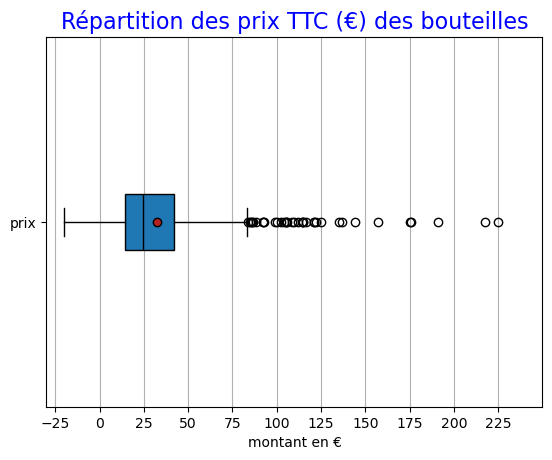

In [364]:
# Propriétés graphiques  de mediane et moyenne :   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
#graphique
plt.boxplot(df_erp['price'],
            vert=False, labels=['prix'],
            medianprops=medianprops, meanprops = meanprops,
            showmeans=True,patch_artist=True
#            showfliers=True #poru voir les outliers
            )

plt.xlim(-30,250)
plt.grid(axis='x')
plt.xticks(range(-25,250,25))
plt.xlabel('montant en €')
plt.title('Répartition des prix TTC (€) des bouteilles',
          fontdict={'fontsize':16,'color':'blue'})
plt.show()

##### **FIN-Sur le fichier df_merge_final_1 :**

###### **ESSAI 1:**

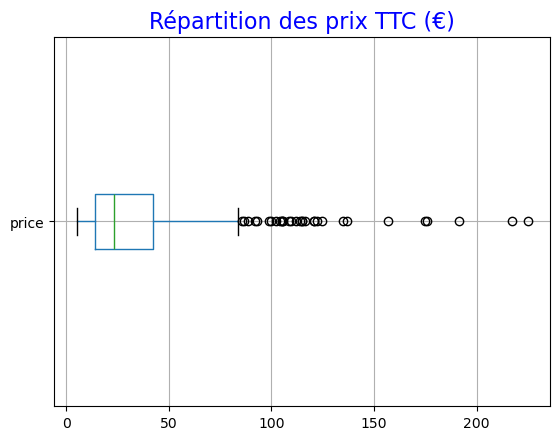

In [365]:
df_merge_final_1.boxplot(column='price',vert=False)
plt.title('Répartition des prix TTC (€)',
          fontdict={'fontsize':16,'color':'blue'})
plt.show()

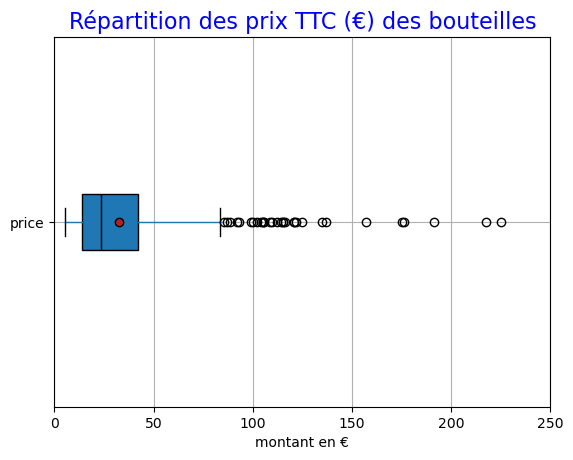

In [366]:
# Propriétés graphiques  de mediane et moyenne :   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
boxprops={'color':"black"}
#graphique
df_merge_final_1.boxplot(column='price',vert=False,
                         medianprops=medianprops, meanprops = meanprops,
                         boxprops=boxprops,
                         showmeans=True,patch_artist=True,
#                         showfliers=False #poru voir les outliers
                        )

plt.xlim(0,250)
plt.xlabel('montant en €')
plt.title('Répartition des prix TTC (€) des bouteilles',
          fontdict={'fontsize':16,'color':'blue'})
plt.show()

###### **FIN-ESSAI 1:**

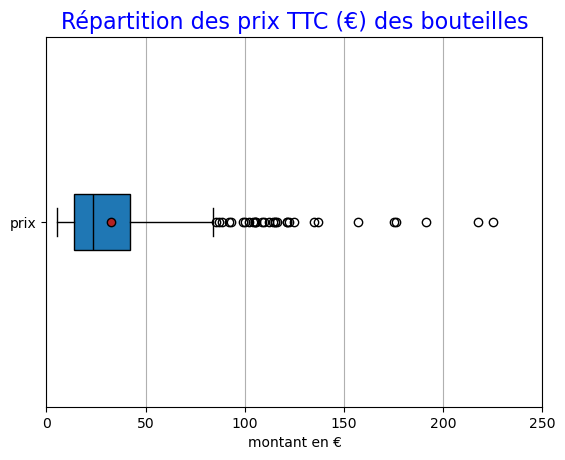

In [367]:
# Propriétés graphiques  de mediane et moyenne :   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
#graphique
plt.boxplot(df_merge_final_1['price'],
            vert=False, labels=['prix'],
            medianprops=medianprops, meanprops = meanprops,
            showmeans=True,patch_artist=True,
#            showfliers=False #poru voir les outliers
            )

plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('montant en €')
plt.title('Répartition des prix TTC (€) des bouteilles',
          fontdict={'fontsize':16,'color':'blue'})
plt.show()

##### <font color='green'><u>**b. Boite à moustache de la répartition des prix grâce à plotly express**</u></font>

In [368]:
#import plotly.express as px
#Import en en-tête de Notebook

##### **Sur le fichier df_erp original :**

In [369]:
fig = px.box(df_erp, x="price",orientation='h')
#fig = px.box(df_merge_final_1, y="price")
fig.show()

##### **Sur le fichier df_merge_final_1 :**

In [370]:
fig = px.box(df_merge_final_1, x="price",
             title ='Répartition des prix TTC (€)')
#fig = px.box(df_merge_final_1, y="price")
fig.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.2 - Analyses graphiques complémentaire : prix, prix d'achat, Nbre de reférences, ventes </h4></div>

##### <font color='green'><u>**a. Analyse graphique des prix d'achat TTC et prix de vente TTC globaux**</u></font>

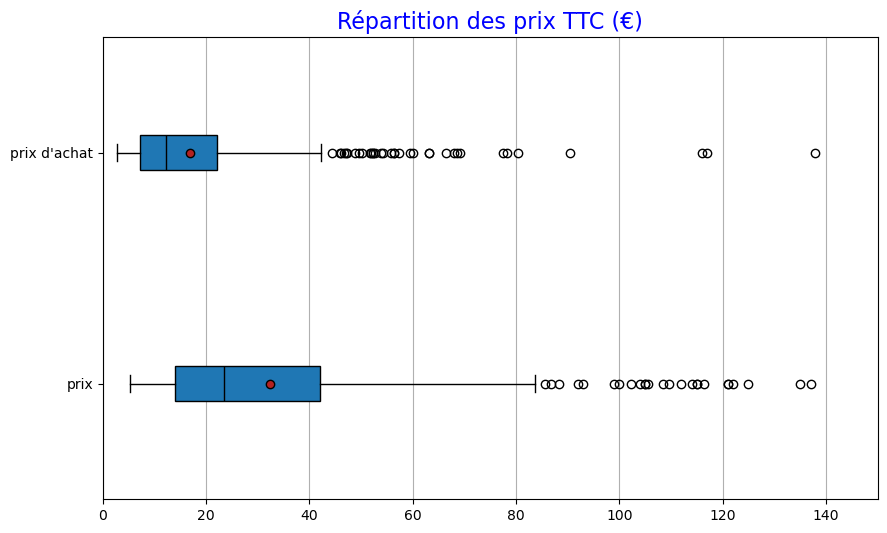

In [371]:
plt.figure(figsize=(10,6))
# Propriétés graphiques  de mediane et moyenne :   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
#graphique
plt.boxplot(df_merge_final_1[['price','purchase_price']],
            vert=False,labels=['prix',"prix d'achat"],
            medianprops=medianprops, meanprops = meanprops,
            showmeans=True,patch_artist=True,
#            showfliers=False #poru voir les outliers
            )

plt.xlim(0,150)
plt.grid(axis='x')
plt.title('Répartition des prix TTC (€)',
          fontdict={'fontsize':16,'color':'blue'})
plt.show()

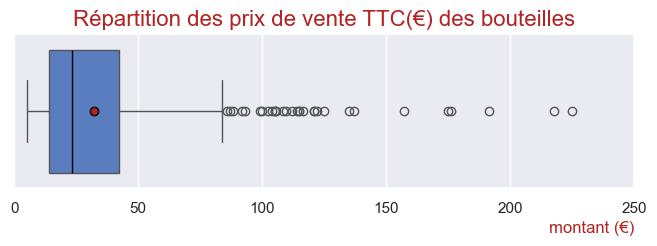

In [372]:
plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_merge_final_1,x='price',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order=Ordre_produit
           )
plt.xlim(0,250)
plt.grid(axis='x')
plt.xlabel('montant (€)',fontdict={'fontsize' : 12, 'color':'firebrick'},loc='right')
#plt.legend()
plt.title("Répartition des prix de vente TTC(€) des bouteilles",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

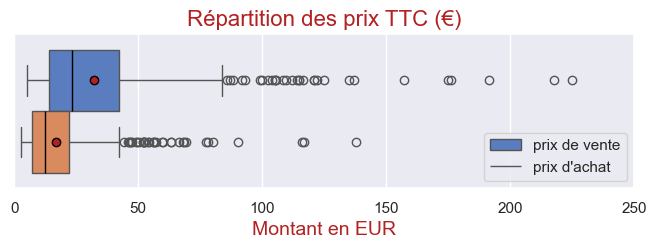

In [373]:
# Transformer le DataFrame en format long (idéal pour Seaborn)
df_melted = df_merge_final_1.melt(value_vars=['price', 'purchase_price'], var_name='Type de prix', value_name='Valeur')

plt.figure(figsize=(8,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
#plt.figure(figsize=(10, 6))
sns.boxplot(data=df_melted, x='Valeur',
            hue='Type de prix',
            #palette={'price': 'blue', 'purchase_price': 'red'},
            medianprops={'color': "black"},
            meanprops={'marker': 'o', 'markeredgecolor': 'black', 'markerfacecolor': 'firebrick'},
            showmeans=True,
            #width=0.4,
            #legend = ['Prix de vente','Prix d\'achat'],
            #hue_order={'price':'Prix de vente','purchase_price':'Prix d\'achat'}
           )

plt.xlim(0, 250)
plt.grid(axis='x')
plt.xlabel('Montant en EUR', fontdict={'fontsize': 14, 'color': 'firebrick'})
plt.title("Répartition des prix TTC (€)", fontdict={'fontsize': 16, 'color': 'firebrick'})
#plt.legend(['Prix de vente',"Prix d'achat"])
plt.legend(labels=['prix de vente',"prix d'achat"])
plt.show()

In [374]:
#df_melted.head(2)

In [375]:
#df_melted.tail(2)

##### <font color='green'><u>**b. Répartition des prix TTC (€) selon le type de produit**</u></font>

In [376]:
Ordre_produit = ['Vin', 'Champagne', 'Whisky','Cognac',"Huile d'olive",'Gin']

In [377]:
# Générer une palette 'muted' avec autant de couleurs que de catégories
couleurs_muted = sns.color_palette("muted", len(Ordre_produit))

# Associer chaque produit à une couleur fixe dans un dictionnaire
palette_fixe = dict(zip(Ordre_produit, couleurs_muted))

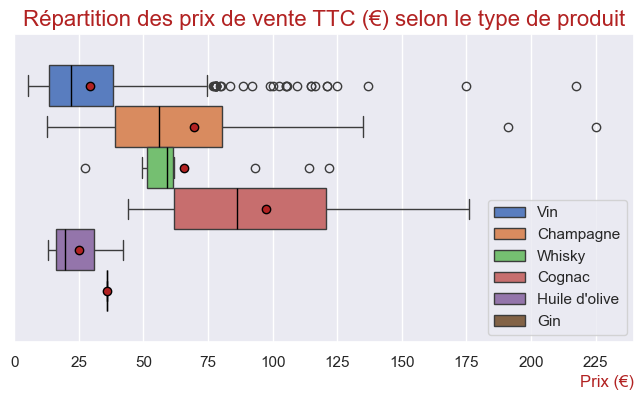

In [378]:
plt.figure(figsize=(8,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_merge_final_1,x='price',hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            hue_order=Ordre_produit,
            palette=palette_fixe
           )
plt.xlim(0,240)
plt.grid(axis='x')
plt.xticks(range(0,250,25))
plt.xlabel('Prix (€)',fontdict={'fontsize' : 12, 'color':'firebrick'},loc='right')
plt.legend(title=None)
#plt.legend(title='Type de produit')
plt.title("Répartition des prix de vente TTC (€) selon le type de produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

##### <font color='green'><u>**C. Répartition des ventes par bouteille en Octobre**</u></font>

###### DOUBLON :

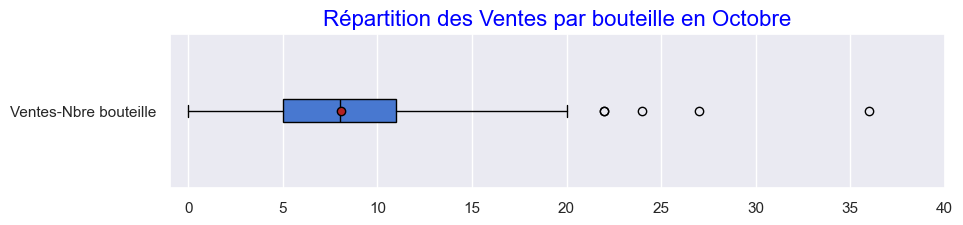

In [379]:
plt.figure(figsize=(10,2))
# Propriétés graphiques  de mediane et moyenne :   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
#graphique
plt.boxplot(df_merge_final_1['total_sales'],
            vert=False,labels=['Ventes-Nbre bouteille'],
            medianprops=medianprops, meanprops = meanprops,
            showmeans=True,patch_artist=True
#            showfliers=False #poru voir les outliers
            )

plt.xlim(-1,40)
plt.grid(axis='x')
plt.title('Répartition des Ventes par bouteille en Octobre',
          fontdict={'fontsize':16,'color':'blue'})
plt.show()

###### FIN-DOUBLON :

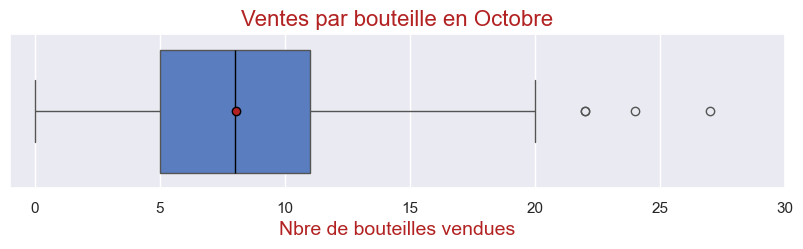

In [380]:
plt.figure(figsize=(10,2))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_merge_final_1,x='total_sales',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True #c'est ce qui permet de faire apparaitre la moyenne
           )
plt.xlim(-1,30)
plt.grid(axis='x')
plt.xlabel('Nbre de bouteilles vendues',fontdict={'fontsize' : 14, 'color':'firebrick'})
#plt.legend()
plt.title("Ventes par bouteille en Octobre",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

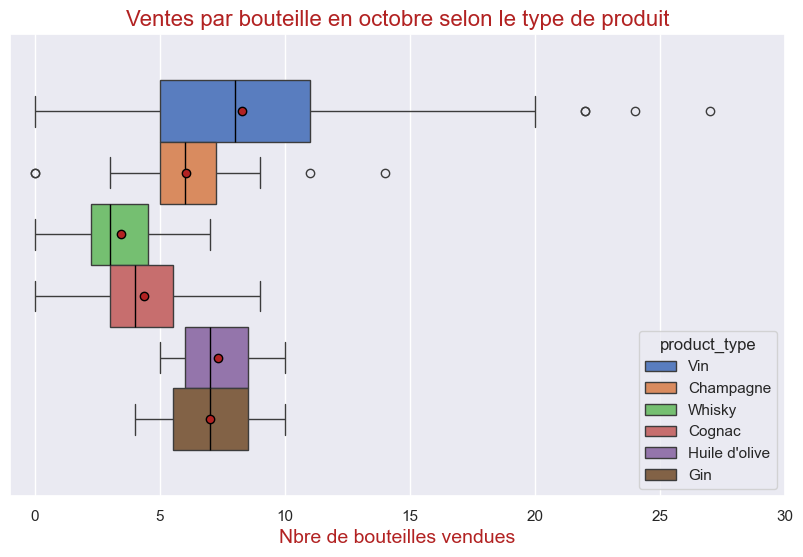

In [381]:
plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})


sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_merge_final_1,x='total_sales',hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne
            hue_order=Ordre_produit,
            palette=palette_fixe
           )
plt.xlim(-1,30)
plt.grid(axis='x')
plt.xlabel('Nbre de bouteilles vendues',fontdict={'fontsize' : 14, 'color':'firebrick'})
#plt.legend()
plt.title("Ventes par bouteille en octobre selon le type de produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

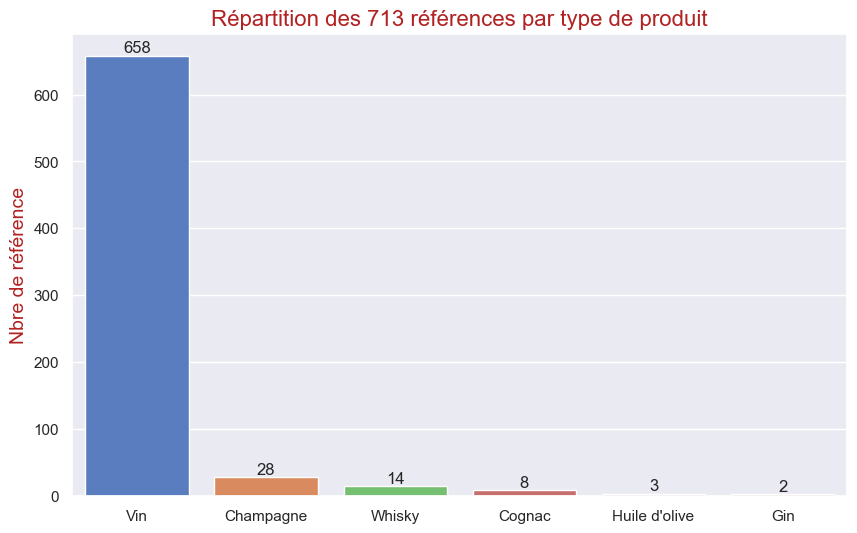

In [382]:
plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=df_merge_final_1,
                 x='product_type',
                 y='product_id',
                 hue='product_type',
                 errorbar=None,
                 estimator='count',
                 order =Ordre_produit,
                 palette=palette_fixe
           )

for x in range(0,6) :
    ax.bar_label(ax.containers[x])

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('Nbre de référence',fontdict={'fontsize' : 14, 'color':'firebrick'})
#plt.legend()
plt.title("Répartition des 713 références par type de produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

##### **Un Camembert ça ne donne pas grand chose avec des pourcentages à 0%**

In [383]:
data_graph_reference =df_merge_final_1[['product_id','product_type']].groupby(by='product_type').count()
data_graph_reference

,product_id
product_type,
Champagne,28
Cognac,8
Gin,2
Huile d'olive,3
Vin,658
Whisky,14


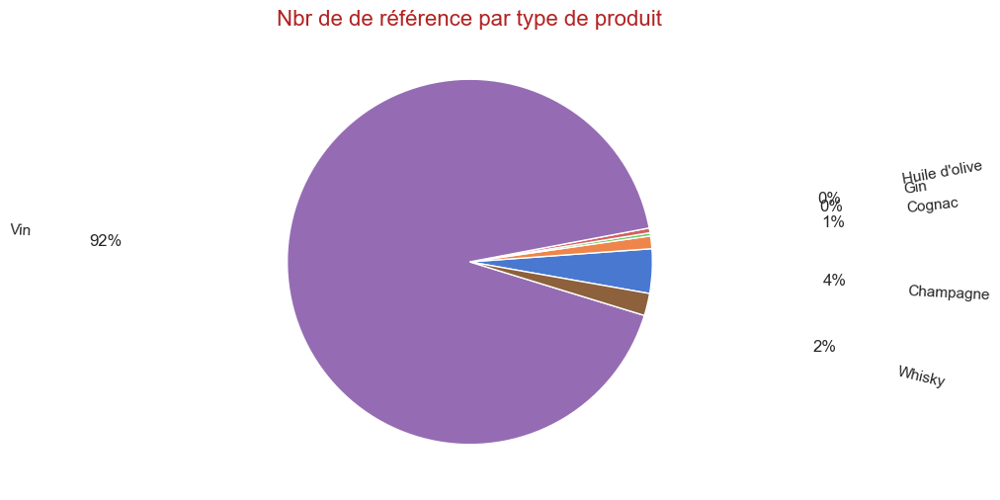

In [384]:
#Presentation sous forme de Camembert : pas de camenbert sous seaborn !!!:(

plt.figure(figsize=(10,6))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

plt.pie(x=data_graph_reference['product_id'],
        labels=data_graph_reference.index,
        normalize=True,
        autopct='%.0f%%',
        labeldistance=2.4,
        pctdistance =2.0,startangle=-10,
        rotatelabels =True
       )
        
#plt.legend()
plt.title("Nbr de de référence par type de produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

##### **Construisons un DataFrame avec les données en pourcentage**

In [385]:
liste_col = ['product_type','product_id','stock_quantity','total_sales']
data_graph_agg_par_prod = df_merge_final_1[liste_col].groupby(by='product_type'
                                                              ).agg({'product_id':'count',
                                                                     'stock_quantity':'sum',
                                                                     'total_sales':'sum'
                                                                     })
data_graph_agg_par_prod

,product_id,stock_quantity,total_sales
product_type,,,
Champagne,28,2894,169.0
Cognac,8,99,35.0
Gin,2,11,14.0
Huile d'olive,3,158,22.0
Vin,658,13470,5456.0
Whisky,14,85,48.0


In [386]:
data_graph_agg_par_prod.rename(columns={'product_id':'Nbr_references','stock_quantity':'Total_stock','total_sales':'Total_vente'},inplace=True)

In [387]:
#colonne Part_references
data_graph_agg_par_prod['Part_references']=(data_graph_agg_par_prod['Nbr_references']*100)/data_graph_agg_par_prod['Nbr_references'].sum()
#colonne Part_stock
data_graph_agg_par_prod['Part_stock']=(data_graph_agg_par_prod['Total_stock']*100)/data_graph_agg_par_prod['Total_stock'].sum()
#colonne Part_ventes
data_graph_agg_par_prod['Part_ventes']=(data_graph_agg_par_prod['Total_vente']*100)/data_graph_agg_par_prod['Total_vente'].sum()

In [388]:
data_graph_agg_par_prod.sort_values(by='Nbr_references',ascending=False,inplace=True)

In [389]:
data_graph_agg_par_prod

,Nbr_references,Total_stock,Total_vente,Part_references,Part_stock,Part_ventes
product_type,,,,,,
Vin,658,13470,5456.0,92.286115,80.576658,94.986072
Champagne,28,2894,169.0,3.927069,17.311719,2.942201
Whisky,14,85,48.0,1.963534,0.508464,0.835655
Cognac,8,99,35.0,1.122020,0.592212,0.609331
Huile d'olive,3,158,22.0,0.420757,0.945146,0.383008
Gin,2,11,14.0,0.280505,0.065801,0.243733


In [390]:
data_graph_agg_par_prod['Total_vente'] = (data_graph_agg_par_prod['Total_vente']).astype('int')

##### **Un DataFrame avec les données en pourcentage pour les graphes :**

In [391]:
data_graph_agg_par_prod

,Nbr_references,Total_stock,Total_vente,Part_references,Part_stock,Part_ventes
product_type,,,,,,
Vin,658,13470,5456,92.286115,80.576658,94.986072
Champagne,28,2894,169,3.927069,17.311719,2.942201
Whisky,14,85,48,1.963534,0.508464,0.835655
Cognac,8,99,35,1.122020,0.592212,0.609331
Huile d'olive,3,158,22,0.420757,0.945146,0.383008
Gin,2,11,14,0.280505,0.065801,0.243733


##### **FIN-Construisons un DataFrame avec les données en pourcentage**

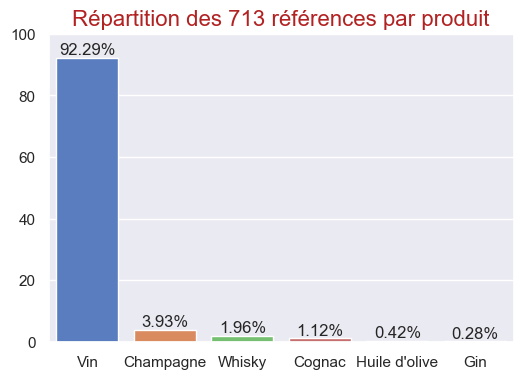

In [392]:
plt.figure(figsize=(6,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=data_graph_agg_par_prod,
                 x='product_type',
                 y='Part_references',
                 hue='product_type',
                 errorbar=None,
                 #estimator='count',
                 order =Ordre_produit,
                 palette=palette_fixe
           )

for x in range(0,6) :
    ax.bar_label(ax.containers[x],fmt='%.2f%%')

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('')
plt.ylim(0,100)
#plt.ylabel('Part du Nbre de référence',fontdict={'fontsize' : 14, 'color':'firebrick'})
#plt.legend()
plt.title("Répartition des 713 références par produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

In [393]:
pd.DataFrame(data_graph_agg_par_prod['Nbr_references'])

,Nbr_references
product_type,
Vin,658
Champagne,28
Whisky,14
Cognac,8
Huile d'olive,3
Gin,2


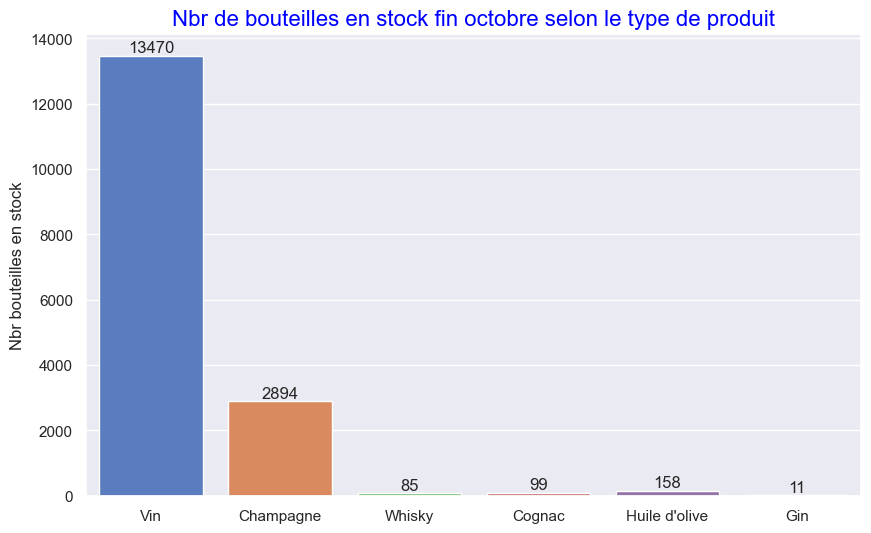

In [394]:
plt.figure(figsize=(10,6))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=df_merge_final_1,
                 x='product_type',
                 y='stock_quantity',
                 hue='product_type',
                 errorbar=None,
                 estimator='sum',
                 order =Ordre_produit,
                 palette=palette_fixe
           )
for x in range(0,6) :
    ax.bar_label(ax.containers[x])

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('Nbr bouteilles en stock')
#plt.legend()
plt.title("Nbr de bouteilles en stock fin octobre selon le type de produit",fontdict={'fontsize' : 16, 'color':'blue'})
plt.show()

In [395]:
data_graph_agg_par_prod.columns

Index(['Nbr_references', 'Total_stock', 'Total_vente', 'Part_references',
       'Part_stock', 'Part_ventes'],
      dtype='object')

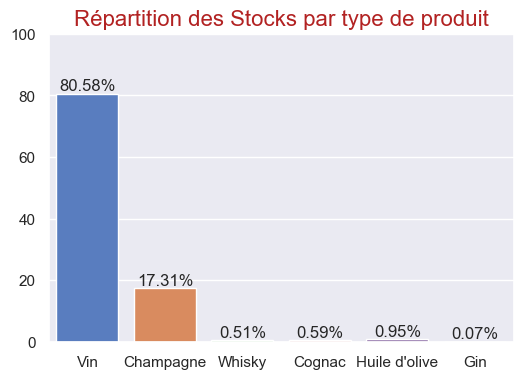

In [396]:
plt.figure(figsize=(6,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=data_graph_agg_par_prod,
                 x='product_type',
                 y='Part_stock',
                 hue='product_type',
                 errorbar=None,
                 #estimator='count',
                 order =Ordre_produit,
                 palette=palette_fixe
           )

for x in range(0,6) :
    ax.bar_label(ax.containers[x],fmt='%.2f%%')

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('')
plt.ylim(0,100)
#plt.ylabel('Part des stocks',fontdict={'fontsize' : 14, 'color':'firebrick'})
#plt.legend()
plt.title("Répartition des Stocks par type de produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

In [397]:
pd.DataFrame(data_graph_agg_par_prod['Total_stock'])

,Total_stock
product_type,
Vin,13470
Champagne,2894
Whisky,85
Cognac,99
Huile d'olive,158
Gin,11


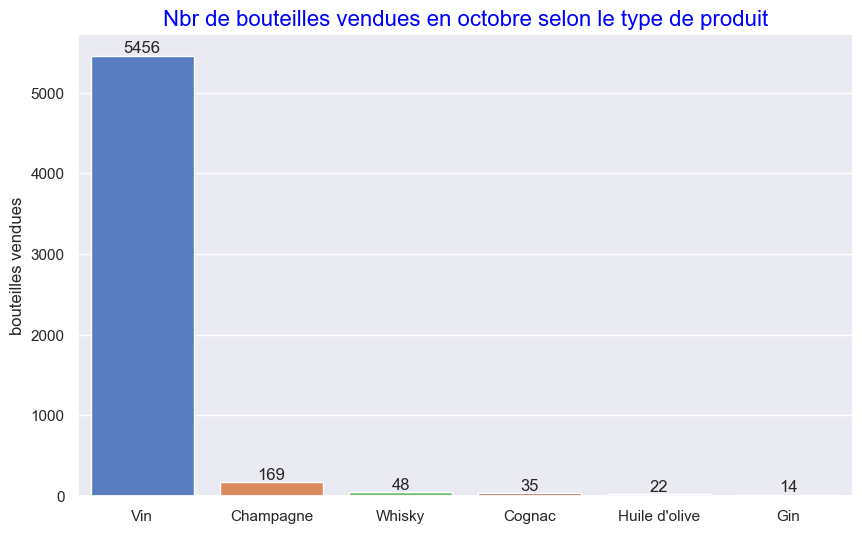

In [398]:
plt.figure(figsize=(10,6))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=df_merge_final_1,
                 x='product_type',
                 y='total_sales',
                 hue='product_type',
                 errorbar=None,
                 estimator='sum',
                 order =Ordre_produit,
                 palette=palette_fixe
           )
for x in range(0,6) :
    ax.bar_label(ax.containers[x])

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('bouteilles vendues')
#plt.legend()
plt.title("Nbr de bouteilles vendues en octobre selon le type de produit",fontdict={'fontsize' : 16, 'color':'blue'})
plt.show()

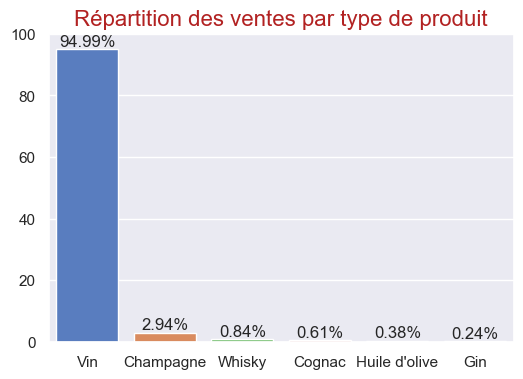

In [399]:
plt.figure(figsize=(6,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=data_graph_agg_par_prod,
                 x='product_type',
                 y='Part_ventes',
                 hue='product_type',
                 errorbar=None,
                 #estimator='count',
                 order =Ordre_produit,
                 palette=palette_fixe
           )

for x in range(0,6) :
    ax.bar_label(ax.containers[x],fmt='%.2f%%')

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('')
plt.ylim(0,100)
#plt.ylabel('Part des ventes',fontdict={'fontsize' : 14, 'color':'firebrick'})
#plt.legend()
plt.title("Répartition des ventes par type de produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

In [400]:
pd.DataFrame(data_graph_agg_par_prod['Total_vente'])

,Total_vente
product_type,
Vin,5456
Champagne,169
Whisky,48
Cognac,35
Huile d'olive,22
Gin,14


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 4.2 - Exploration du prix(TTC) par l'utilisation de méthodes statistique</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.1 - Mesure de tendance centrale : moyenne, médiane</h4>
</div>

In [401]:
#Calculer la moyenne du prix :
moyenne_price = df_merge_final_1['price'].mean()

#PM calculer la médianne du prix :
mediane_price = df_merge_final_1['price'].median()

#Afficher :
print("Pour la variable PRIX, les mesures sont :",
      "\nMoyenne : ", round(moyenne_price,2), "euros",
      "\nMédiane : ", mediane_price, "euros"
     )

Pour la variable PRIX, les mesures sont : 
Moyenne :  32.34 euros 
Médiane :  23.4 euros


In [402]:
round(df_merge_final_1['price'].describe(),2)

count    713.00
mean      32.34
std       27.61
min        5.20
25%       14.05
50%       23.40
75%       42.10
max      225.00
Name: price, dtype: float64

In [403]:
round(pd.DataFrame(df_merge_final_1['price'].describe()),2)

,price
count,713.00
mean,32.34
std,27.61
min,5.20
25%,14.05
50%,23.40
75%,42.10
max,225.00


##### <font color='red'>PM : faire une discrétisation de prix et faire un histogramme :</font>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.2 - Mesure de dispersion : écart-type</h4>
</div>

##### Complément perso :

**variance empirique :**  
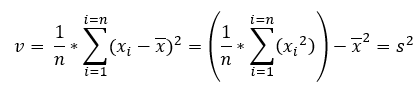

In [404]:
#calcul de la variance empririque :
df_merge_final_1['price'].var(ddof=0)

761.4820253398618

**variance emprique sans biais :**  
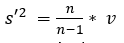

In [405]:
#calcul de la variance empririque :
df_merge_final_1['price'].var(ddof=1)

762.5515225664627

<u>Remarque :</u>  
Pour la **variance empirique**, afin d'intégrer le biais ou non, la formule enregistrée dans Python est :  
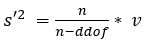  
variance empirique (ddof=0)  
variance empirique non biaisée : (ddof=1)

**L'écart type empirique :**  
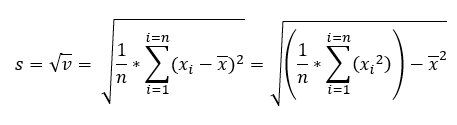

<u>Remarque :</u>  
Pour **l'écart-type empirique**, afin d'intégrer le biais ou non, la formule enregistrée dans Python est :  
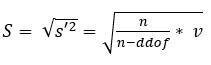  
écart-type empirique (ddof=0)  
écart-type empririque non biaisé : (ddof=1)

##### Fin Complément :

##### **Calculer l'écart-type empirique du prix :**

In [406]:
#Calculer l'écart-type empirique du prix :
ecart_type_price = df_merge_final_1['price'].std(ddof=0)
#Afficher :
print("Pour la variable PRIX, les mesures sont :",
      "\nEcart-type empirique : ", round(ecart_type_price,2), "euros"
      )

Pour la variable PRIX, les mesures sont : 
Ecart-type empirique :  27.59 euros


##### **Calculer l'écart-type empirique non biaisé du prix :**

In [407]:
#Calculer l'écart-type empirique non biaisé du prix :
ecart_type_price_non_biaise = df_merge_final_1['price'].std(ddof=1)
ecart_type_price_non_biaise

27.61433545400763

##### **Complément : visualisation graphique**

##### ESSAI:

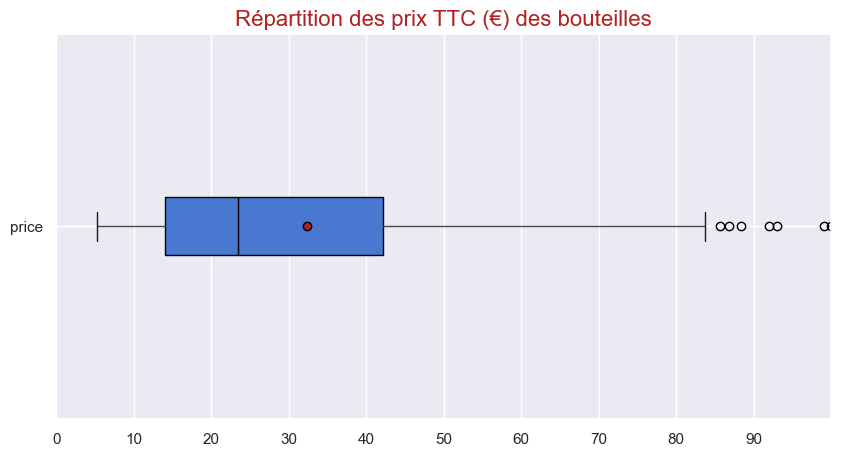

In [408]:
#RAPPEL :
plt.figure(figsize=(10,5))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})
# Propriétés graphiques  de mediane et moyenne :   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
boxprops={'color':"black"}
#graphique
df_merge_final_1.boxplot(column='price',vert=False,
                         medianprops=medianprops, meanprops = meanprops,
                         boxprops=boxprops,
                         showmeans=True,patch_artist=True,
#                         showfliers=False #poru voir les outliers
                        )

plt.xlim(0,100)
plt.xticks(range(0,100,10))
plt.title('Répartition des prix TTC (€) des bouteilles',
          fontdict={'fontsize':16,'color':'firebrick'})
plt.show()

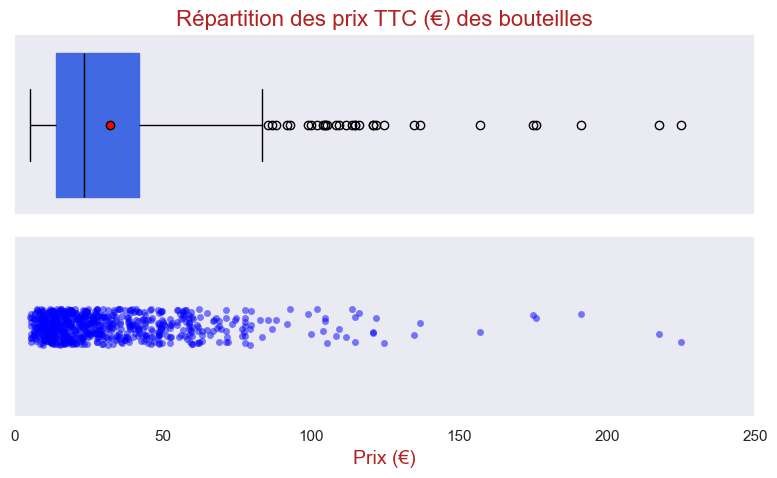

In [409]:
# Configuration de la figure avec 2 sous-graphiques (1 colonne, 2 lignes)
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(8, 5), sharex=True)

# Tracé du boxplot dans le premier sous-graphique
sns.boxplot(x=df_merge_final_1['price'], ax=ax[0], color='black', showmeans=True,
            meanprops={"marker": "o", "markerfacecolor": "red", "markeredgecolor": "black"},
            medianprops={"color": "black"},
            boxprops={"color":"royalblue"})

ax[0].set_title('Répartition des prix TTC (€) des bouteilles', fontsize=16, color='firebrick')
ax[0].set_xlim(0, 250)
ax[0].tick_params(axis='x', labelsize=12)

# Tracé du scatterplot (stripplot) dans le second sous-graphique
sns.stripplot(x=df_merge_final_1['price'], ax=ax[1], color='blue', alpha=0.5, jitter=True)

ax[1].set_xlabel('Prix (€)', fontsize=14, color='firebrick')
ax[1].set_yticks([])  # Cacher l'axe des Y car inutile

# Ajustement de l'espacement entre les sous-graphiques
plt.tight_layout()
plt.show()

##### FIN-ESSAI:

<Figure size 800x400 with 0 Axes>

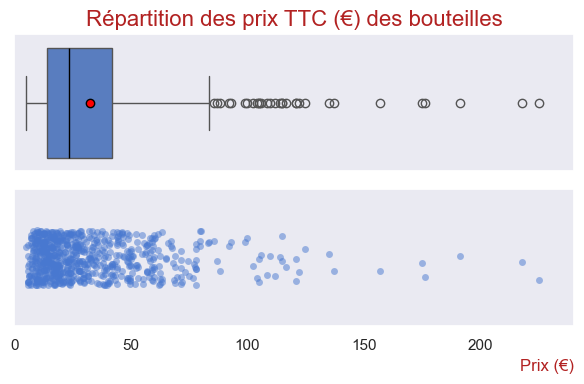

In [410]:
plt.figure(figsize=(8,4))
# Configuration de la figure avec 2 sous-graphiques (1 colonne, 2 lignes)
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(6, 4), sharex=True)

sns.set_theme(style='dark', palette='muted')
# Tracé du boxplot dans le premier sous-graphique
sns.boxplot(x=df_merge_final_1['price'], ax=ax[0], color='black', showmeans=True,
            meanprops={"marker": "o", "markerfacecolor": "red", "markeredgecolor": "black"},
            medianprops={"color": "black"},
            palette ='muted'#,
            #boxprops={"color":"blue"}
           )

ax[0].set_title('Répartition des prix TTC (€) des bouteilles', fontsize=16, color='firebrick')
ax[0].set_xlim(0, 240)
ax[0].tick_params(axis='x', labelsize=12)

# Tracé du scatterplot (stripplot) dans le second sous-graphique
sns.stripplot(x=df_merge_final_1['price'], ax=ax[1], #color='blue', 
              alpha=0.5, jitter=0.2)

ax[1].set_xlabel('Prix (€)', fontsize=12, color='firebrick',loc='right')
ax[1].set_yticks([])  # Cacher l'axe des Y car inutile

# Ajustement de l'espacement entre les sous-graphiques
plt.tight_layout()
plt.show()

<Figure size 1000x300 with 0 Axes>

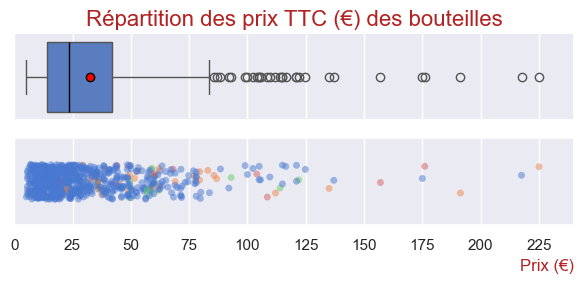

In [411]:
plt.figure(figsize=(10,3))
# Configuration de la figure avec 2 sous-graphiques (1 colonne, 2 lignes)
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(6, 3), sharex=True)

sns.set_theme(style='dark', palette='muted')
# Tracé du boxplot dans le premier sous-graphique
sns.boxplot(x=df_merge_final_1['price'], ax=ax[0], color='black', showmeans=True,
            meanprops={"marker": "o", "markerfacecolor": "red", "markeredgecolor": "black"},
            medianprops={"color": "black"},
            palette ='muted'#,
            #boxprops={"color":"blue"}
           )

ax[0].set_title('Répartition des prix TTC (€) des bouteilles', fontsize=16, color='firebrick')
ax[0].set_xlim(0, 240)
ax[0].tick_params(axis='x', labelsize=12)
ax[0].grid(axis='x')
#plt.grid(axis='x')

# Tracé du scatterplot (stripplot) dans le second sous-graphique
sns.stripplot(data =df_merge_final_1[['price','product_type']], ax=ax[1], #color='blue',
              x='price',
              hue='product_type',
              alpha=0.5, jitter=0.2,
              #order =Ordre_produit,
              palette=palette_fixe,
              legend=False
             )

ax[1].set_xlabel('Prix (€)', fontsize=12, color='firebrick',loc='right')
ax[1].set_yticks([])  # Cacher l'axe des Y car inutile

# Ajustement de l'espacement entre les sous-graphiques
#plt.legend()
plt.xlim(0,240)
plt.xticks(range(0,250,25))
plt.grid(axis='x')
plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

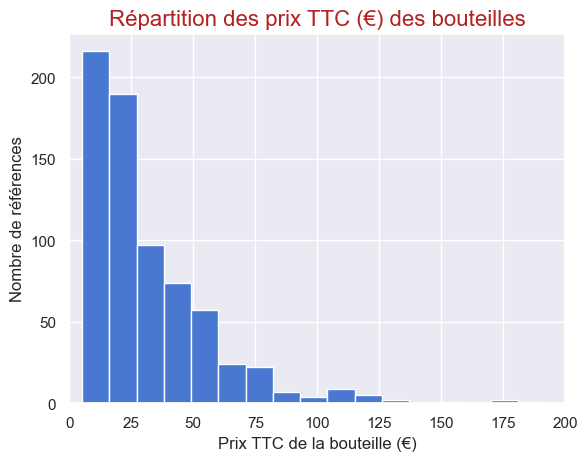

In [412]:
plt.figure(figsize=(10,6))

#graphique
df_merge_final_1.hist(column='price',by=None,
                     bins=20)

plt.xlim(0,200)
plt.xlabel("Prix TTC de la bouteille (€)")
plt.ylabel("Nombre de références")
#plt.xticks(range(0,100,10))
plt.title('Répartition des prix TTC (€) des bouteilles',
          fontdict={'fontsize':16,'color':'firebrick'})
plt.show()

<Figure size 1000x1500 with 0 Axes>

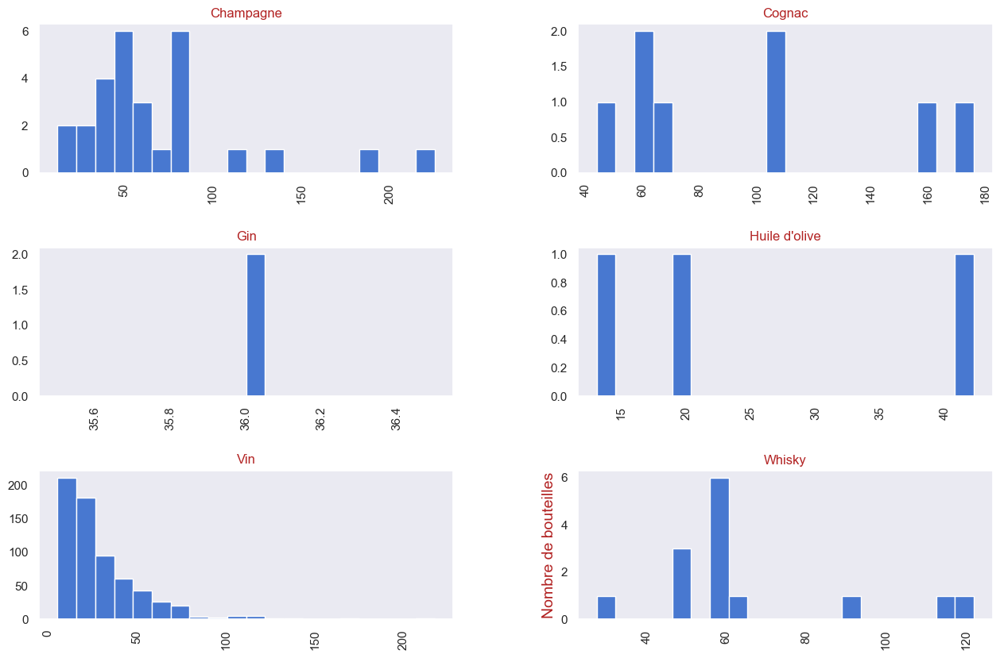

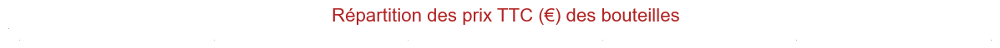

In [413]:
plt.figure(figsize=(10,15))

#graphique
df_merge_final_1.hist(column='price',by='product_type',figsize=(15,10),
                     bins=20)


#plt.xlim(0,200)
#plt.xlabel("Prix TTC de la bouteille",fontdict={'fontsize':14,'color':'firebrick'})
plt.ylabel("Nombre de bouteilles",fontdict={'fontsize':14,'color':'firebrick'})
#plt.xticks(range(0,100,10))
#plt.title('Répartition des prix TTC (€) des bouteilles',
#          fontdict={'fontsize':16,'color':'blue','verticalalignment':'baseline'})
plt.show()

#print('Répartition des prix TTC (€) des bouteilles')
plt.figure(figsize=(15,0))
plt.title('Répartition des prix TTC (€) des bouteilles',
          fontdict={'fontsize':16,'color':'firebrick'},loc='center')
plt.tick_params(axis = 'both', labelsize = 0)
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.3 -Mesure de dispersion : Identification par le Z-score</h4>
</div>

##### **Calculer le Z-score :**

docs scipy.stats.zscore :  
https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.zscore.html

docs Z-score :
https://www.jmp.com/fr_ca/statistics-knowledge-portal/measures-of-central-tendency-and-variability/z-score.html#:~:text=Le%20score%20Z%20(ou%20%C2%AB%20z,%2Ddistribution%20%C2%BB%20en%20anglais).  

https://www.bibmath.net/dico/index.php?action=affiche&quoi=./z/zscore.html  

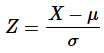

In [414]:
#import scipy.stats as st
#Import en en-tête de Notebook
st.zscore(df_merge_final_1['price'],axis=0, ddof=0, nan_policy='propagate')

0     -0.295125
1      0.070884
2     -0.418336
3     -0.661134
4      0.494874
         ...   
708   -0.867693
709   -0.175538
710    1.328359
711    0.813773
712   -0.581409
Name: price, Length: 713, dtype: float64

In [415]:
#Travaillons sur une copie :
df_merge_copy_1_2 = df_merge_final_1.copy(deep=True)

In [416]:
df_merge_copy_1_2['price_Z_score'] = st.zscore(df_merge_final_1['price'],axis=0, ddof=0, nan_policy='propagate')

##### **Présentons mieux le Z-score :**

In [417]:
df_price_Z_score = df_merge_copy_1_2[['price','price_Z_score']]
df_price_Z_score.head()

,price,price_Z_score
0,24.2,-0.295125
1,34.3,0.070884
2,20.8,-0.418336
3,14.1,-0.661134
4,46.0,0.494874


In [418]:
df_price_Z_score.describe()

,price,price_Z_score
count,713.000000,7.130000e+02
mean,32.343969,7.972429e-17
std,27.614335,1.000702e+00
min,5.200000,-9.836566e-01
25%,14.050000,-6.629459e-01
50%,23.400000,-3.241160e-01
75%,42.100000,3.535439e-01
max,225.000000,6.981565e+00


##### PM : illustration peu intéressante :

In [419]:
#import seaborn as sns

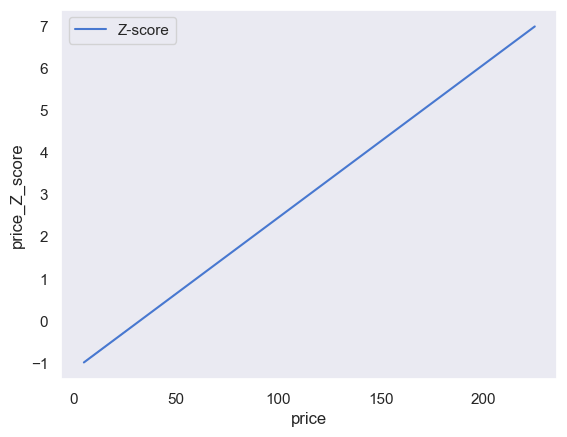

In [420]:
plt.figure()
sns.lineplot(x=df_price_Z_score['price'], y=df_price_Z_score['price_Z_score'], label='Z-score')
plt.legend()
plt.show()

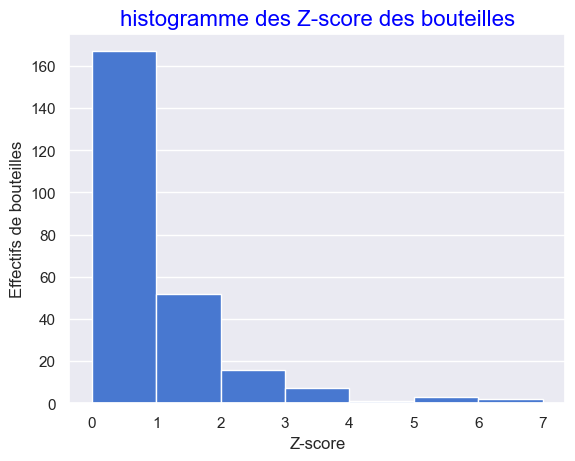

In [421]:
plt.figure()
plt.hist(x=df_merge_copy_1_2['price_Z_score'],bins=range(0,8,1))
   
plt.xlabel("Z-score")
plt.ylabel("Effectifs de bouteilles")
plt.title('histogramme des Z-score des bouteilles',
          fontdict={'fontsize':16,'color':'blue'},loc='center')
plt.grid(axis='y')
#plt.legend()
plt.show()

##### PM : illustration peu intéressante :

##### <u>***Quel est le seuil prix dont z-score est supérieur à 3?***</u>
Le Z-score supérieur égale à 3 correspond à un prix égale à : moyenne+3*écart-type

In [422]:
#Quel est le seuil prix dont z-score est supérieur à 3?
seuil_prix_Z_score_3 = (moyenne_price +(3*ecart_type_price) )
print("le seuil prix à partir duquel le z-score est supérieur à 3 est de :",
      round(seuil_prix_Z_score_3 ,2) , " eur.")

le seuil prix à partir duquel le z-score est supérieur à 3 est de : 115.13  eur.


##### **les vins qui ont un Z-score supérieur à 3 :**

In [423]:
#quels sont les vins qui ont un Z-score supérieur à 3 :
mask=df_merge_copy_1_2['price_Z_score']>3
colonnes = ['product_id','price','price_Z_score','post_title']

(df_merge_copy_1_2.loc[mask,colonnes] ).sort_values(by='price',ascending=False)

,product_id,price,price_Z_score,post_title
199,4352,225.0,6.981565,Champagne Egly-Ouriet Grand Cru Millésimé 2008
425,5001,217.5,6.709776,David Duband Charmes-Chambertin Grand Cru 2014
586,5892,191.3,5.760328,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...
218,4402,176.0,5.205879,Cognac Frapin VIP XO
552,5767,175.0,5.169640,Camille Giroud Clos de Vougeot 2016
221,4406,157.0,4.517347,Cognac Frapin Château de Fontpinot 1989 20 Ans...
381,4904,137.0,3.792577,Domaine Des Croix Corton Charlemagne Grand Cru...
641,6126,135.0,3.720100,Champagne Gosset Célébris Vintage 2007
510,5612,124.8,3.350468,Domaine Weinbach Gewurztraminer Grand Cru Furs...
602,5917,122.0,3.249000,Wemyss Malts Single Cask Scotch Whisky Choc 'n...


##### <u>**Calcul d'un Z-score :**<u>  
Un Z-score se calcule pour l'ensemble de chacune des lignes du fichier.  
**Il n'y a pas UN Z-score, mais une liste de Z-score, aussi longue que la longueur des données.**  
Z-score(i) = ( X(i) - Moy)/Ecart_type = ( X(i)/Ecart_type) - (Moy/Ecart_type)  
Ce Z-score(i) indique à combien d'écart type la valeure X(i) se trouve de la moyenne

Cependant **on peut calculer un Z-score =(Moy/Ecart-type)**  
Le sens principal que l'on peut trouver à ce dernier calcul est :  
- de donner une indication sur l'importance relative de l'écart-type par rapport à la moyenne.
=> Le Z-score nous indique combien de fois la moyenne vaut l'éacrt-type.
Ici on a un rapport de un peu plus de 1, ce qui veut dire que l'écart-type est relativement important par rapport à la moyenne.  

Z-score(i) = ( X(i)/Ecart_type) - Z-score


In [424]:
#Calcul d' "UN Z-score": 
Z_score = moyenne_price/ecart_type_price
print('''Le "Z-score" de 'price' vaut : ''',Z_score)

Le "Z-score" de 'price' vaut :  1.172096815083919


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.4 - Identification par l'intervalle interquartile</h4>
</div>

In [425]:
#Utilisation de la fonction describe de Pandas pour l'etude des mesures de dispersions
df_merge_final_1['price'].describe()

count    713.000000
mean      32.343969
std       27.614335
min        5.200000
25%       14.050000
50%       23.400000
75%       42.100000
max      225.000000
Name: price, dtype: float64

##### <u>***Définissez un seuil pour les articles "outliers" en prix***</u>

En général on considère que les prix au-delà de 1,5 écart interquartile sont les outliers.  
C'est ce qui est utilisé dans les boites à moustache.

In [426]:
Q1 = (df_merge_final_1['price'].describe() )['25%']
Q2 = (df_merge_final_1['price'].describe() )['50%']
Q3 = (df_merge_final_1['price'].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas des prix en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ," eur.",
      "\nle seuil haut des prix au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2) ," eur."
     )

l'intervalle interquatile IQ vaut :  28.05 
le seuil bas des prix en deça duquel on est outliers est :  -28.02  eur. 
le seuil haut des prix au dessus duquel on est outliers est :  84.18  eur.


<u>**Remarque :**</u>  
Le seuil bas des outliers prix étant inférieur à la valeur minimale prix, il n'y aura pas d'outlier bas.

##### <u>***Définissez le nombre d'articles et la proportion de l'ensemble du catalogue "outliers"***</u>

In [427]:
#les outliers :
mask_outlier_price = (df_merge_final_1['price']<seuil_bas_outlier)|(seuil_haut_outlier<df_merge_final_1['price'])
df_outlier_price = df_merge_final_1.loc[mask_outlier_price,:]
nb_outlier_price = len(df_outlier_price)
prop_outlier_price = (nb_outlier_price/len(df_merge_final_1))*100

print("Il y a ", nb_outlier_price , "article(s) 'outliers'.",
      "\nCe qui représente ", round(prop_outlier_price,2) ," % des articles."
     )

Il y a  31 article(s) 'outliers'. 
Ce qui représente  4.35  % des articles.


##### <u>***Selon vous, ces outliers sont-ils justifiés ? Comment le démontrer si cela est possible ?***</u>

##### <u>***Selon vous, ces outliers sont-ils justifiés ?***</u>  
Les bouteilles de vin peuvent avoir des prix élevés selon la rareté et le type de vin (producteur, millésime, ....).  
Certaines bouteilles peuvent valoir plusieurs milliers d'euros.  
Donc ces oultier ne sont pas des valeurs absurdes.

##### <u>***Comment le démontrer si cela est possible ?***</u>  
Un des meilleurs moyens de voir si ces prix sont ici injustifiés pourrait être le nombre de vente associé à ces outliers.  
Ces bouteilles ne se sont_elles jamais vendues ?  
Ensuite la politique de prix est une affaire de l'entreprise et de connaissance.  
Le fait qu'une bouteille de vin ne se soit pas vendue est une indication mais pas un critère absolu.  
En effet en général, les biens de grandes valeurs s'achètent en moins grandes quantités, que des biens de valeur courante.

In [428]:
df_outlier_price.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales'],
      dtype='object')

In [429]:
df_outlier_price.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,total_sales
63,4115,1,100.0,12,instock,52.7,15382,product,Zind-Humbrecht Riesling Grand Cru Rangen De Th...,Vin,1.0
65,4132,1,88.4,7,instock,44.3,11668,product,Zind-Humbrecht Pinot Gris Grand Cru Rangen De ...,Vin,5.0


In [430]:
display(df_outlier_price[['product_id','price',
                          'total_sales','stock_quantity',
                          'post_title','product_type']].sort_values(by='price',ascending=False)
       )

,product_id,price,total_sales,stock_quantity,post_title,product_type
199,4352,225.0,11.0,0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne
425,5001,217.5,2.0,18,David Duband Charmes-Chambertin Grand Cru 2014,Vin
586,5892,191.3,6.0,98,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne
218,4402,176.0,3.0,11,Cognac Frapin VIP XO,Cognac
552,5767,175.0,4.0,12,Camille Giroud Clos de Vougeot 2016,Vin
221,4406,157.0,4.0,12,Cognac Frapin Château de Fontpinot 1989 20 Ans...,Cognac
381,4904,137.0,3.0,9,Domaine Des Croix Corton Charlemagne Grand Cru...,Vin
641,6126,135.0,5.0,138,Champagne Gosset Célébris Vintage 2007,Champagne
510,5612,124.8,1.0,19,Domaine Weinbach Gewurztraminer Grand Cru Furs...,Vin
602,5917,122.0,3.0,12,Wemyss Malts Single Cask Scotch Whisky Choc 'n...,Whisky


##### <u>**OBSERVATIONS :**</u>  
Toutes ces bouteilles price-'outliers', se sont vendus au moins une fois.  
Avoir des bouteilles à ces prix n'est donc pas incohérent.  
On peut même noter que la bouteille la plus chère a été vendue 11 fois et est en rupture de stock.  

Il pourrait êter intéressant de revoir les prix pour les vins qui se sont peu vendus proportionnellement au stock.

In [431]:
df_outlier_price_etude = df_outlier_price[['product_id','price', 'purchase_price',
                                           'total_sales','stock_quantity',
                                           'post_title','product_type']].sort_values(by='price',ascending=False)

In [432]:
df_outlier_price_etude['prop_stock_vendu']= round( (df_outlier_price_etude['total_sales']/
                                                    (df_outlier_price_etude['total_sales']+df_outlier_price_etude['stock_quantity'])
                                                    )*100,2)

In [433]:
df_outlier_price_etude

,product_id,price,purchase_price,total_sales,stock_quantity,post_title,product_type,prop_stock_vendu
199,4352,225.0,137.81,11.0,0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,100.00
425,5001,217.5,116.87,2.0,18,David Duband Charmes-Chambertin Grand Cru 2014,Vin,10.00
586,5892,191.3,116.06,6.0,98,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,5.77
218,4402,176.0,78.25,3.0,11,Cognac Frapin VIP XO,Cognac,21.43
552,5767,175.0,90.42,4.0,12,Camille Giroud Clos de Vougeot 2016,Vin,25.00
221,4406,157.0,69.08,4.0,12,Cognac Frapin Château de Fontpinot 1989 20 Ans...,Cognac,25.00
381,4904,137.0,67.95,3.0,9,Domaine Des Croix Corton Charlemagne Grand Cru...,Vin,25.00
641,6126,135.0,80.33,5.0,138,Champagne Gosset Célébris Vintage 2007,Champagne,3.50
510,5612,124.8,66.41,1.0,19,Domaine Weinbach Gewurztraminer Grand Cru Furs...,Vin,5.00
602,5917,122.0,54.24,3.0,12,Wemyss Malts Single Cask Scotch Whisky Choc 'n...,Whisky,20.00


In [434]:
df_outlier_price_etude.columns

Index(['product_id', 'price', 'purchase_price', 'total_sales',
       'stock_quantity', 'post_title', 'product_type', 'prop_stock_vendu'],
      dtype='object')

In [435]:
df_outlier_price_etude_2 = df_outlier_price_etude[['product_id', 'price', 'purchase_price',
                                                   'prop_stock_vendu','total_sales','stock_quantity', 
                                                   'post_title', 'product_type']].sort_values(by='prop_stock_vendu')

display(df_outlier_price_etude_2)

,product_id,price,purchase_price,prop_stock_vendu,total_sales,stock_quantity,post_title,product_type
641,6126,135.0,80.33,3.50,5.0,138,Champagne Gosset Célébris Vintage 2007,Champagne
436,5025,112.0,68.60,4.23,6.0,136,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne
510,5612,124.8,66.41,5.00,1.0,19,Domaine Weinbach Gewurztraminer Grand Cru Furs...,Vin
227,4582,109.6,53.80,5.26,1.0,18,Château de Meursault Puligny-Montrachet 1er Cr...,Vin
586,5892,191.3,116.06,5.77,6.0,98,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne
205,4359,85.6,51.93,5.88,7.0,112,Champagne Larmandier-Bernier Grand Cru Les Che...,Champagne
63,4115,100.0,52.70,7.69,1.0,12,Zind-Humbrecht Riesling Grand Cru Rangen De Th...,Vin
437,5026,86.8,50.13,8.18,9.0,101,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne
425,5001,217.5,116.87,10.00,2.0,18,David Duband Charmes-Chambertin Grand Cru 2014,Vin
656,6216,121.0,60.02,12.50,2.0,14,Domaine des Comtes Lafon Volnay 1er Cru Champa...,Vin


##### <font color='red'>**ACTION ENVISAGEE :**</u>
On pourrait envisager une action lors de soldes par exemple, ou d'événements exceptionnels (foire aux vins ...).
Selon les informations ci-dessus :  
Une action pourrait être menée sur les bouteilles qui n'ont vendu qu'un faible pourcentage de leur stock total.  
A fortiori pour les bouteilles qui sont en stocks important :

In [436]:
mask_prop_vendu_faible_stock_important = ((df_outlier_price_etude_2['prop_stock_vendu']<10)
                                          &(df_outlier_price_etude_2['stock_quantity']>95))
df_outlier_price_etude_3 = df_outlier_price_etude_2.loc[mask_prop_vendu_faible_stock_important,:]
df_outlier_price_etude_3

,product_id,price,purchase_price,prop_stock_vendu,total_sales,stock_quantity,post_title,product_type
641,6126,135.0,80.33,3.50,5.0,138,Champagne Gosset Célébris Vintage 2007,Champagne
436,5025,112.0,68.60,4.23,6.0,136,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne
586,5892,191.3,116.06,5.77,6.0,98,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne
205,4359,85.6,51.93,5.88,7.0,112,Champagne Larmandier-Bernier Grand Cru Les Che...,Champagne
437,5026,86.8,50.13,8.18,9.0,101,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne


In [437]:
df_outlier_price_etude_3.columns

Index(['product_id', 'price', 'purchase_price', 'prop_stock_vendu',
       'total_sales', 'stock_quantity', 'post_title', 'product_type'],
      dtype='object')

In [438]:
df_outlier_price_etude_3[['post_title','product_type', 'price', 'stock_quantity','total_sales','prop_stock_vendu']]

,post_title,product_type,price,stock_quantity,total_sales,prop_stock_vendu
641,Champagne Gosset Célébris Vintage 2007,Champagne,135.0,138,5.0,3.50
436,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne,112.0,136,6.0,4.23
586,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,191.3,98,6.0,5.77
205,Champagne Larmandier-Bernier Grand Cru Les Che...,Champagne,85.6,112,7.0,5.88
437,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne,86.8,101,9.0,8.18


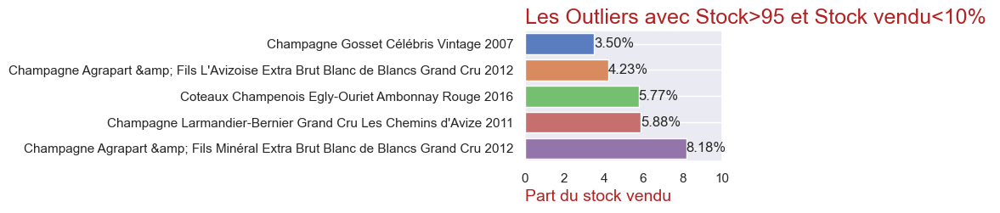

In [439]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(3,2))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_outlier_price_etude_3 , 
                 y='post_title',
                 x = 'prop_stock_vendu', errorbar=None,
                 hue='post_title',legend=False,
                 palette='muted',
                 order=df_outlier_price_etude_3['post_title']
                )

for x in range(0,len(df_outlier_price_etude_3)) :
    ax.bar_label(ax.containers[x],fmt='%.2f%%')

plt.xlabel('Part du stock vendu', loc='left',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
plt.xlim(0,10)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Les Outliers avec Stock>95 et Stock vendu<10% ", loc='left',
          fontdict = {'fontsize' : 18, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.5 - Complément perso :</h4>
</div>

In [440]:
df_merge_final_1.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales'],
      dtype='object')

Pour la variable PRIX les statistiques sont : 
moyenne :  32.343969144460026
mediane :  23.4
Ecart-type empirique non biaisé :  27.61433545400763
Le Skewness empirique:  2.600205143696024


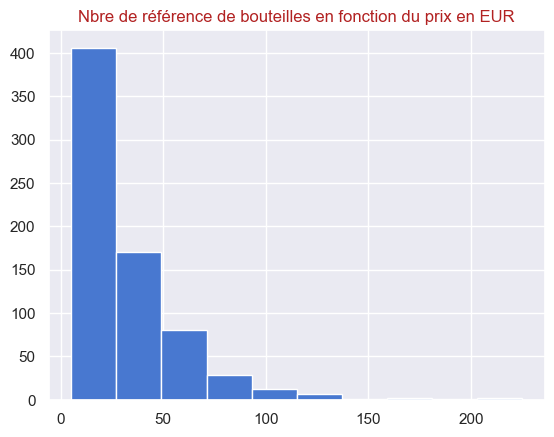

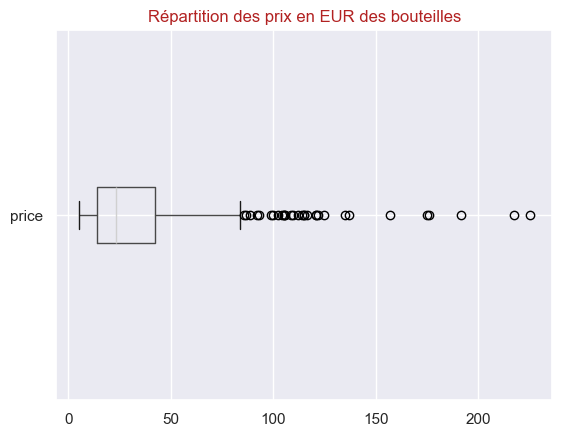

--------------------


In [441]:
print('Pour la variable PRIX les statistiques sont : ')
print('moyenne : ',df_merge_final_1['price'].mean())
print('mediane : ',df_merge_final_1['price'].median())
print('Ecart-type empirique non biaisé : ',df_merge_final_1['price'].std(ddof=1))
print('Le Skewness empirique: ',df_merge_final_1['price'].skew())
#print('Le Kurtosis empirique : ',df_merge_final_1['price'].kurtosis())# poru des distributions symétriques.

df_merge_final_1['price'].hist() # Crée l'histogramme
plt.title(f"Nbre de référence de bouteilles en fonction du prix en EUR")
plt.show() # Affiche l'histogramme

df_merge_final_1.boxplot(column='price', vert=False)#crée la boite à moustache
plt.title(f"Répartition des prix en EUR des bouteilles")
plt.show()

print("-"*20)

<u>**OBSERVATIONS :**</u>
Skewness>0 => variable étalée à droite.  
Pas de sens à calculer un khurtosis (mesure de l'applatissement pour des Dispersion symétriques).

catégorie  Vin  : 
moyenne :  29.281306990881458
mediane :  21.85
Ecart-type empirique non biaisé :  23.45656564711389
Le Skewness empirique:  2.5014765854965924


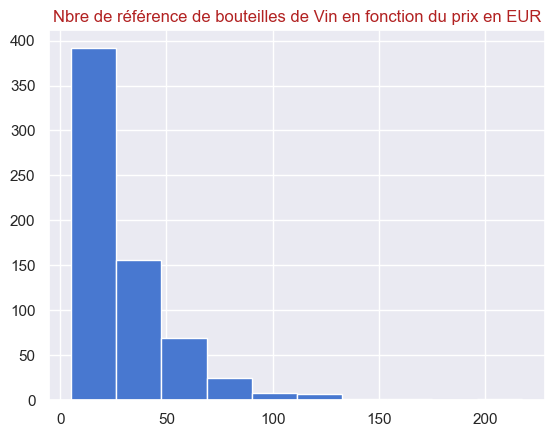

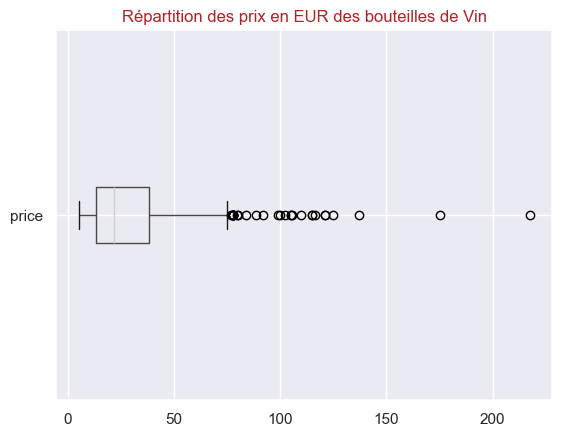

--------------------
catégorie  Champagne  : 
moyenne :  69.62678571428572
mediane :  56.0
Ecart-type empirique non biaisé :  47.62163078807092
Le Skewness empirique:  1.969901213324473


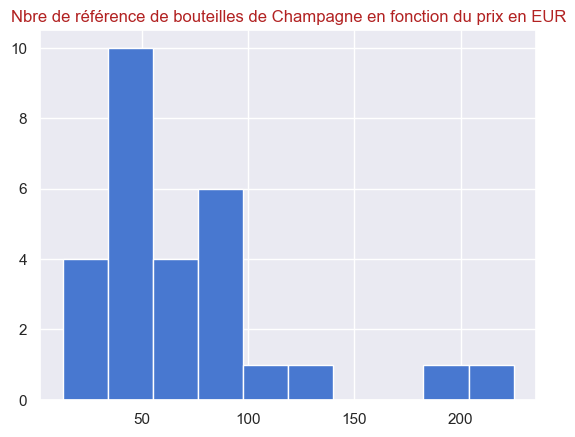

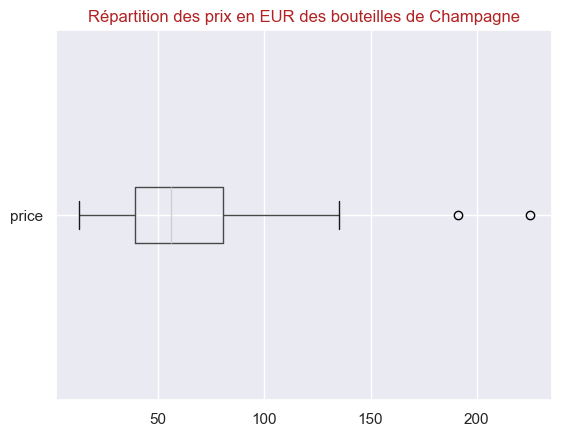

--------------------
catégorie  Whisky  : 
moyenne :  65.55714285714285
mediane :  59.0
Ecart-type empirique non biaisé :  26.060129118450845
Le Skewness empirique:  1.238735089372655


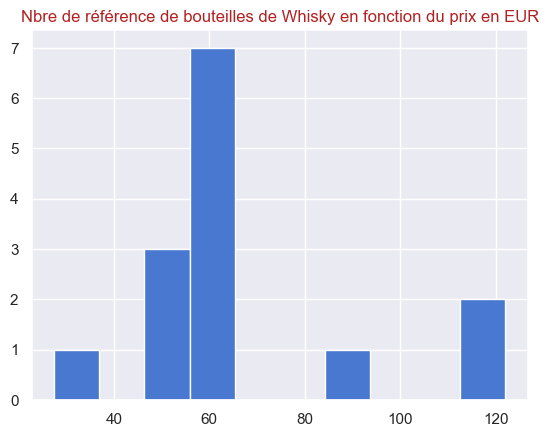

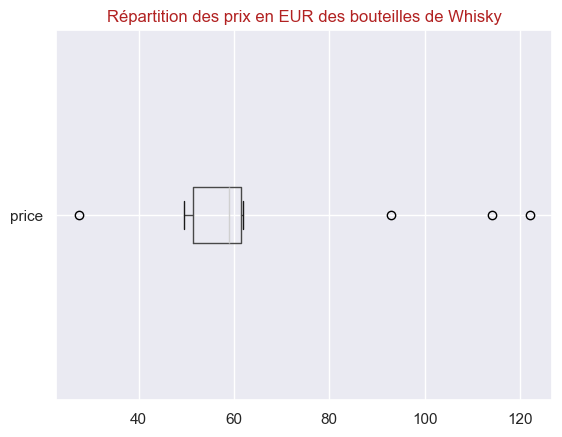

--------------------
catégorie  Cognac  : 
moyenne :  97.5
mediane :  86.05
Ecart-type empirique non biaisé :  48.153207874153395
Le Skewness empirique:  0.7189060158408767


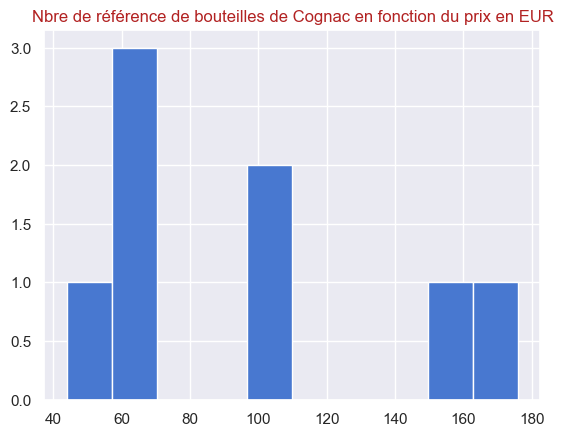

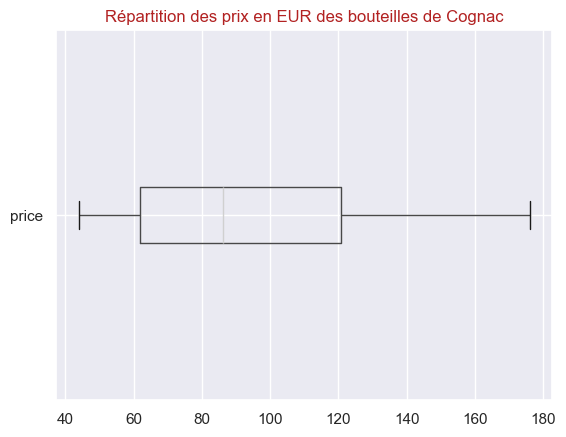

--------------------
catégorie  Huile d'olive  : 
moyenne :  24.933333333333337
mediane :  19.5
Ecart-type empirique non biaisé :  15.291936873180369
Le Skewness empirique:  1.397034004599347


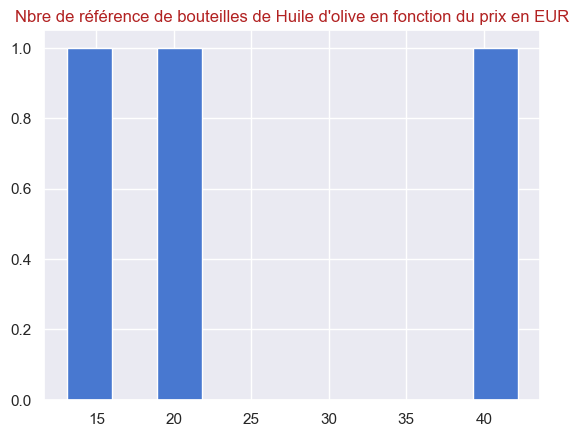

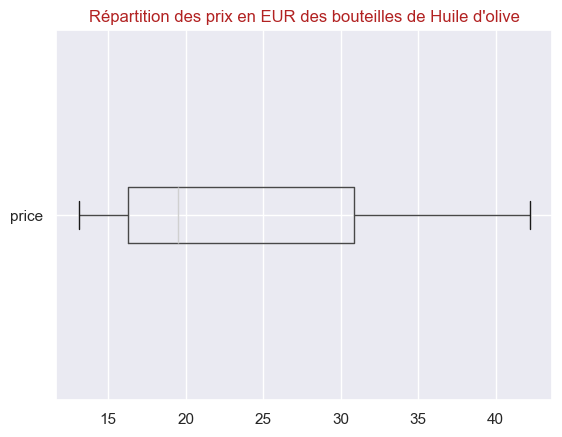

--------------------
catégorie  Gin  : 
moyenne :  36.0
mediane :  36.0
Ecart-type empirique non biaisé :  0.0
Le Skewness empirique:  nan


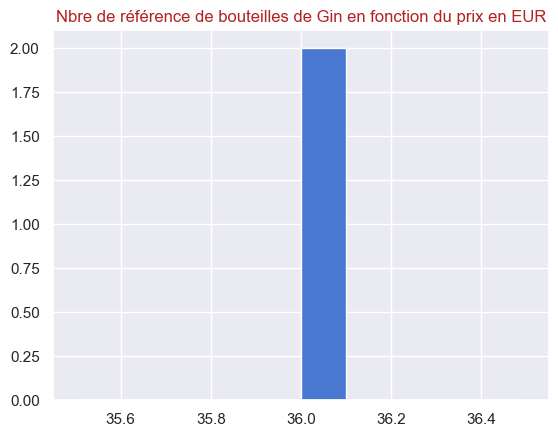

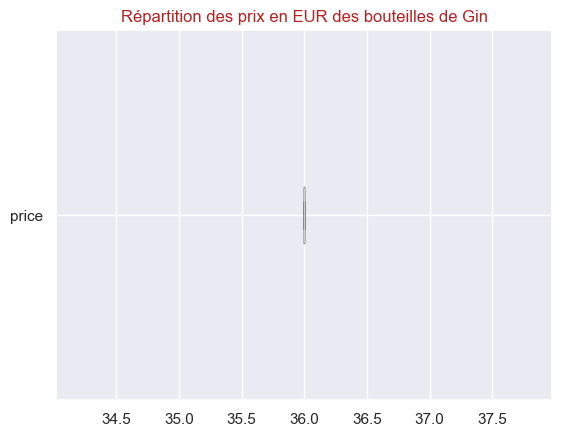

--------------------


In [442]:
data = df_merge_final_1
categ = "product_type"
observation = 'price'

for cat in data[categ].unique():
    subset = data.loc[data[categ] == cat, :] # Création du sous-échantillon
    print('catégorie ',cat,' : ')
    print('moyenne : ',subset[observation].mean())
    print('mediane : ',subset[observation].median())
    print('Ecart-type empirique non biaisé : ',subset[observation].std(ddof=1))
    print('Le Skewness empirique: ',subset[observation].skew())
#    print('Le Kurtosis empirique : ',df_merge_final_1['price'].kurtosis())# poru des distributions symétriques.
    
    subset[observation].hist() # Crée l'histogramme
    plt.title(f"Nbre de référence de bouteilles de {cat} en fonction du prix en EUR")
    plt.show() # Affiche l'histogramme
    
    subset.boxplot(column=observation, vert=False)#crée la boite à moustache
    plt.title(f"Répartition des prix en EUR des bouteilles de {cat}")
    plt.show()

    print("-"*20)

In [443]:
df_stats_price =df_merge_final_1.pivot_table(index=df_merge_final_1.index,columns='product_type',values='price')
df_stats_price

product_type,Champagne,Cognac,Gin,Huile d'olive,Vin,Whisky
0,NaN,NaN,NaN,NaN,24.2,NaN
1,NaN,NaN,NaN,NaN,34.3,NaN
2,NaN,NaN,NaN,NaN,20.8,NaN
3,NaN,NaN,NaN,NaN,14.1,NaN
4,NaN,NaN,NaN,NaN,46.0,NaN
...,...,...,...,...,...,...
708,NaN,NaN,NaN,NaN,8.4,NaN
709,NaN,NaN,NaN,NaN,27.5,NaN
710,NaN,NaN,NaN,NaN,69.0,NaN
711,NaN,NaN,NaN,NaN,54.8,NaN


In [444]:
df_stats_price.columns

Index(['Champagne', 'Cognac', 'Gin', 'Huile d'olive', 'Vin', 'Whisky'], dtype='object', name='product_type')

In [445]:
df_stats_price_2 = df_stats_price.copy()

In [446]:
#NE MARCHE PAS CAR CA NE PREND LE MAX QUE 
#df_stats_price_2['Tout_produit']=0.0
#
#for x in df_stats_price_2.index :
#    for cat in df_stats_price_2.columns:
#        if df_stats_price_2.loc[x,cat]!=nan :
#            df_stats_price_2.loc[x,'Tout_produit']=df_stats_price_2.loc[x,cat]

In [447]:
df_stats_price_2.head(2)

product_type,Champagne,Cognac,Gin,Huile d'olive,Vin,Whisky
0,NaN,NaN,NaN,NaN,24.2,NaN
1,NaN,NaN,NaN,NaN,34.3,NaN


In [448]:
df_stats_price_2.loc[0,'Cognac']==None

False

In [449]:
df_stats_price_2.describe()

product_type,Champagne,Cognac,Gin,Huile d'olive,Vin,Whisky
count,28.000000,8.000000,2.0,3.000000,658.000000,14.000000
mean,69.626786,97.500000,36.0,24.933333,29.281307,65.557143
std,47.621631,48.153208,0.0,15.291937,23.456566,26.060129
min,12.650000,44.000000,36.0,13.100000,5.200000,27.500000
25%,39.000000,61.850000,36.0,16.300000,13.500000,51.375000
50%,56.000000,86.050000,36.0,19.500000,21.850000,59.000000
75%,80.375000,120.625000,36.0,30.850000,38.400000,61.450000
max,225.000000,176.000000,36.0,42.200000,217.500000,122.000000


In [450]:
STAT_PRICE = df_stats_price.describe()
STAT_PRICE

product_type,Champagne,Cognac,Gin,Huile d'olive,Vin,Whisky
count,28.000000,8.000000,2.0,3.000000,658.000000,14.000000
mean,69.626786,97.500000,36.0,24.933333,29.281307,65.557143
std,47.621631,48.153208,0.0,15.291937,23.456566,26.060129
min,12.650000,44.000000,36.0,13.100000,5.200000,27.500000
25%,39.000000,61.850000,36.0,16.300000,13.500000,51.375000
50%,56.000000,86.050000,36.0,19.500000,21.850000,59.000000
75%,80.375000,120.625000,36.0,30.850000,38.400000,61.450000
max,225.000000,176.000000,36.0,42.200000,217.500000,122.000000


In [451]:
df_merge_final_1['price'].describe()

count    713.000000
mean      32.343969
std       27.614335
min        5.200000
25%       14.050000
50%       23.400000
75%       42.100000
max      225.000000
Name: price, dtype: float64

In [452]:
STAT_PRICE['Tout_Produit']=df_merge_final_1['price'].describe()

In [453]:
STAT_PRICE

product_type,Champagne,Cognac,Gin,Huile d'olive,Vin,Whisky,Tout_Produit
count,28.000000,8.000000,2.0,3.000000,658.000000,14.000000,713.000000
mean,69.626786,97.500000,36.0,24.933333,29.281307,65.557143,32.343969
std,47.621631,48.153208,0.0,15.291937,23.456566,26.060129,27.614335
min,12.650000,44.000000,36.0,13.100000,5.200000,27.500000,5.200000
25%,39.000000,61.850000,36.0,16.300000,13.500000,51.375000,14.050000
50%,56.000000,86.050000,36.0,19.500000,21.850000,59.000000,23.400000
75%,80.375000,120.625000,36.0,30.850000,38.400000,61.450000,42.100000
max,225.000000,176.000000,36.0,42.200000,217.500000,122.000000,225.000000


In [454]:
round(STAT_PRICE,2)

product_type,Champagne,Cognac,Gin,Huile d'olive,Vin,Whisky,Tout_Produit
count,28.00,8.00,2.0,3.00,658.00,14.00,713.00
mean,69.63,97.50,36.0,24.93,29.28,65.56,32.34
std,47.62,48.15,0.0,15.29,23.46,26.06,27.61
min,12.65,44.00,36.0,13.10,5.20,27.50,5.20
25%,39.00,61.85,36.0,16.30,13.50,51.38,14.05
50%,56.00,86.05,36.0,19.50,21.85,59.00,23.40
75%,80.38,120.62,36.0,30.85,38.40,61.45,42.10
max,225.00,176.00,36.0,42.20,217.50,122.00,225.00


<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 5 - Analyse univariée du CA, des quantités vendues, des stocks et de la marge ainsi qu'une analyse multivarié  </h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 5.1 - Analyse des ventes en CA</h3>
</div>

In [455]:
df_merge_final_1.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,total_sales
0,3847,1,24.2,16,instock,12.88,15298,product,Pierre Jean Villa Saint-Joseph Préface 2018,Vin,6.0
1,3849,1,34.3,10,instock,17.54,15296,product,Pierre Jean Villa Saint-Joseph Rouge Tildé 2017,Vin,9.0


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1.1 - Calculer le CA du site web :</h4></div>

In [456]:
##############################
# Calculer le CA du site web #
##############################


In [457]:
#Travaillons sur une copie :
df_merge_copy_1_3 = df_merge_final_1.copy(deep=True)

In [458]:
#Créons une colonne calculant le CA par article :
df_merge_copy_1_3['CA_par_article'] = df_merge_copy_1_3['price']*df_merge_copy_1_3['total_sales']
df_merge_copy_1_3[['price','total_sales','CA_par_article']].head(5)

,price,total_sales,CA_par_article
0,24.2,6.0,145.2
1,34.3,9.0,308.7
2,20.8,0.0,0.0
3,14.1,12.0,169.2
4,46.0,3.0,138.0


In [459]:
#Calculez le chiffre d'affaire du site web : somme de la colonne "ca_par_article"
CA_total_site = df_merge_copy_1_3['CA_par_article'].sum()
print("Le chiffre d'affaire TTC total du site est de ", round(CA_total_site,2) ," euros.")

Le chiffre d'affaire TTC total du site est de  143505.1  euros.


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1.2 Palmares des articles en CA :</h4></div>

In [460]:
###############################
# Palmares des articles en CA #
###############################

#Effectuer le tri dans l'ordre décroissant du CA du dataset df_merge
#Réinitialiser l'index du dataset par un reset_index
#Afficher les 20 premier articles en CA
#Graphique en barre des 20 premiers articles avec plotly express

In [461]:
df_top20_article_CA = df_merge_copy_1_3.sort_values(by='CA_par_article',ascending=False).reset_index().drop(columns='index').head(20)
df_top20_article_CA.head(5)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,total_sales,CA_par_article
0,4352,1,225.0,0,outofstock,137.81,15940,product,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,11.0,2475.0
1,5892,1,191.3,98,instock,116.06,14983,product,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,6.0,1147.8
2,4353,1,79.5,127,instock,45.91,12587,product,Champagne Egly-Ouriet Grand Cru Brut Rosé,Champagne,14.0,1113.0
3,5826,1,41.2,34,instock,21.71,15325,product,Agnès Levet Côte Rôtie Améthyste 2017,Vin,20.0,824.0
4,6212,1,115.0,16,instock,59.42,13996,product,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,7.0,805.0


##### <u>**Palmares des articles en CA : Tableau**</u>

In [462]:
df_top20_article_CA.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article'],
      dtype='object')

In [463]:
colonnes_choix = ['product_id','price','total_sales','CA_par_article','post_title','product_type']
display(df_top20_article_CA[colonnes_choix])

,product_id,price,total_sales,CA_par_article,post_title,product_type
0,4352,225.0,11.0,2475.0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne
1,5892,191.3,6.0,1147.8,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne
2,4353,79.5,14.0,1113.0,Champagne Egly-Ouriet Grand Cru Brut Rosé,Champagne
3,5826,41.2,20.0,824.0,Agnès Levet Côte Rôtie Améthyste 2017,Vin
4,6212,115.0,7.0,805.0,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin
5,5026,86.8,9.0,781.2,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne
6,5008,105.0,7.0,735.0,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin
7,5767,175.0,4.0,700.0,Camille Giroud Clos de Vougeot 2016,Vin
8,6126,135.0,5.0,675.0,Champagne Gosset Célébris Vintage 2007,Champagne
9,5025,112.0,6.0,672.0,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne


##### <u>**Palmares des articles en CA : Graphiques**</u>

In [464]:
#PORU EVITER une lecture en nombres des id sur l'axe des x
df_top20_article_CA['product_id'] = (df_top20_article_CA['product_id']).astype('string')

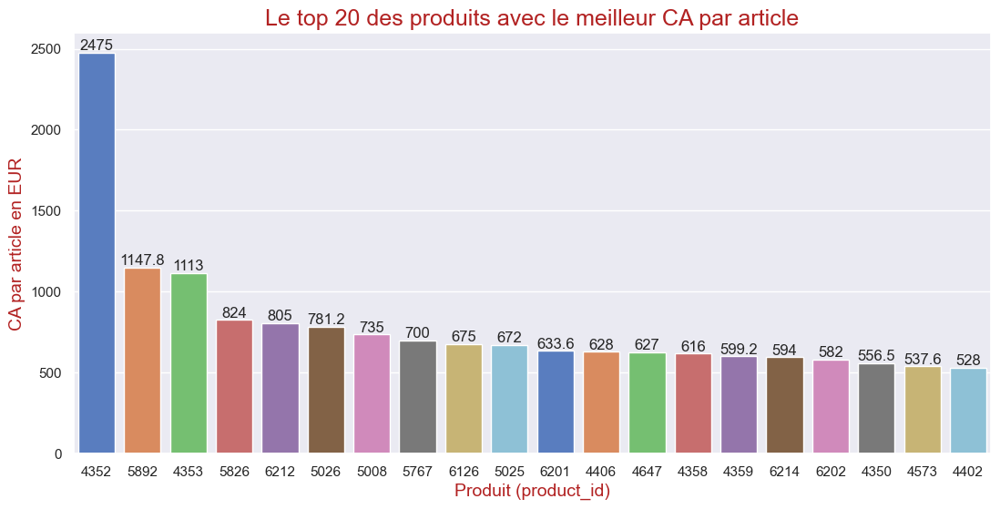

In [465]:
plt.figure(figsize=(13,6))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_CA , x='product_id',
                 y = 'CA_par_article', errorbar=None,
                 hue='product_id',legend=False,
                 palette='muted',
                 order=df_top20_article_CA['product_id']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x])

plt.xlabel('Produit (product_id)',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('CA par article en EUR', fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le top 20 des produits avec le meilleur CA par article",
          fontdict = {'fontsize' : 18, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

###### **VERSION VERTICALE NOM :**

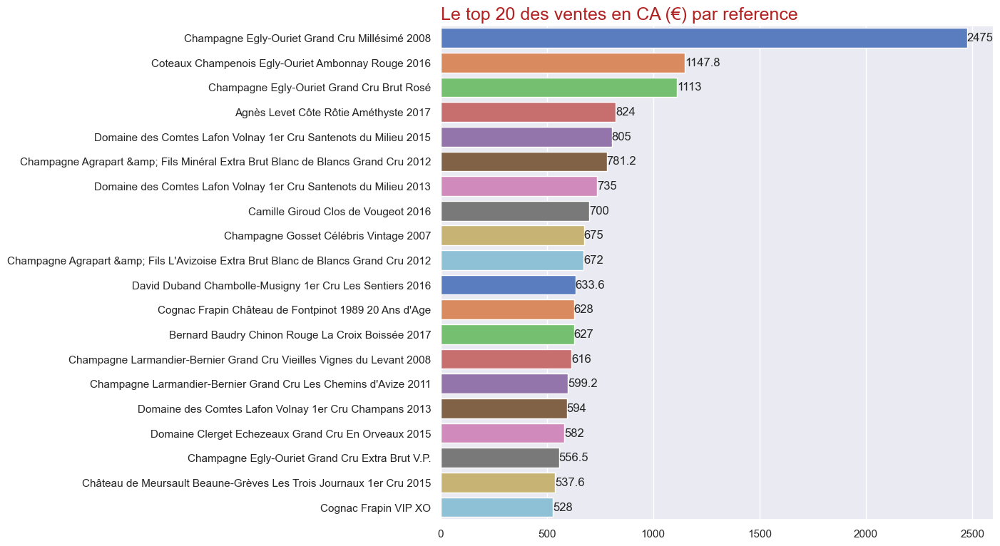

In [466]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(10,9))
plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_CA , y='post_title',
                 x = 'CA_par_article', errorbar=None,
                 hue='post_title',legend=False,
                 palette='muted',
                 order=df_top20_article_CA['post_title']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
#plt.xlabel('CA par référence (€)', loc='right',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='x')
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le top 20 des ventes en CA (€) par reference", loc='left',
          fontdict = {'fontsize' : 18, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

In [467]:
colonnes_choix

['product_id',
 'price',
 'total_sales',
 'CA_par_article',
 'post_title',
 'product_type']

In [468]:
df_top20_article_CA['Label']=df_top20_article_CA['post_title']+' - '+df_top20_article_CA['product_type']
display(df_top20_article_CA[['product_id', 'price',
                             'total_sales','CA_par_article',
                             'post_title','product_type',
                             'Label']])

,product_id,price,total_sales,CA_par_article,post_title,product_type,Label
0,4352,225.0,11.0,2475.0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,Champagne Egly-Ouriet Grand Cru Millésimé 2008...
1,5892,191.3,6.0,1147.8,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...
2,4353,79.5,14.0,1113.0,Champagne Egly-Ouriet Grand Cru Brut Rosé,Champagne,Champagne Egly-Ouriet Grand Cru Brut Rosé - Ch...
3,5826,41.2,20.0,824.0,Agnès Levet Côte Rôtie Améthyste 2017,Vin,Agnès Levet Côte Rôtie Améthyste 2017 - Vin
4,6212,115.0,7.0,805.0,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,Domaine des Comtes Lafon Volnay 1er Cru Santen...
5,5026,86.8,9.0,781.2,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne,Champagne Agrapart &amp; Fils Minéral Extra Br...
6,5008,105.0,7.0,735.0,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,Domaine des Comtes Lafon Volnay 1er Cru Santen...
7,5767,175.0,4.0,700.0,Camille Giroud Clos de Vougeot 2016,Vin,Camille Giroud Clos de Vougeot 2016 - Vin
8,6126,135.0,5.0,675.0,Champagne Gosset Célébris Vintage 2007,Champagne,Champagne Gosset Célébris Vintage 2007 - Champ...
9,5025,112.0,6.0,672.0,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne,Champagne Agrapart &amp; Fils L'Avizoise Extra...


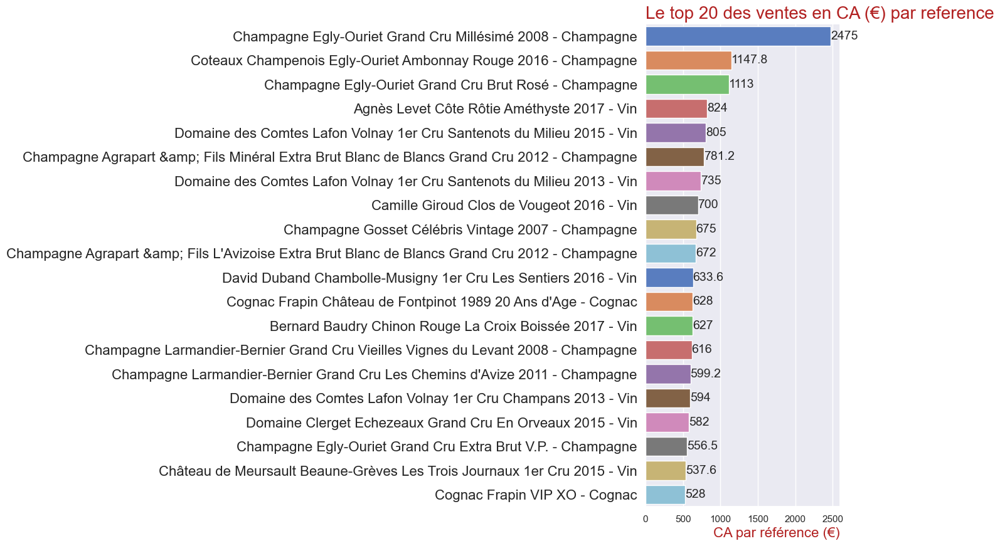

In [469]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(4,10))
plt.rcParams.update({'font.size':16,'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_CA , y='Label',
                 x = 'CA_par_article', errorbar=None,
                 hue='Label',
                 legend=False,
                 palette='muted',
                 order=df_top20_article_CA['Label']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x],size=14)

plt.yticks(fontsize=16)
plt.xlabel('')
plt.xlabel('CA par référence (€)', loc='right',fontdict = {'fontsize' : 16,'color':'firebrick'})
plt.ylabel('', fontdict = {'fontsize' : 16,'color':'firebrick'})
plt.grid(axis='x')
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le top 20 des ventes en CA (€) par reference", loc='left',
          fontdict = {'fontsize' : 20, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

###### **COMPLEMENT PERSO :Classement par titre**

In [470]:
#Classement par titre :
classement_top20_article_CA = df_top20_article_CA[['post_title','product_type','CA_par_article']]
classement_top20_article_CA

,post_title,product_type,CA_par_article
0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,2475.0
1,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,1147.8
2,Champagne Egly-Ouriet Grand Cru Brut Rosé,Champagne,1113.0
3,Agnès Levet Côte Rôtie Améthyste 2017,Vin,824.0
4,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,805.0
5,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne,781.2
6,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,735.0
7,Camille Giroud Clos de Vougeot 2016,Vin,700.0
8,Champagne Gosset Célébris Vintage 2007,Champagne,675.0
9,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne,672.0


In [471]:
classement_top20_article_CA['classement']=1+classement_top20_article_CA.index
classement_top20_article_CA

,post_title,product_type,CA_par_article,classement
0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,2475.0,1
1,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,1147.8,2
2,Champagne Egly-Ouriet Grand Cru Brut Rosé,Champagne,1113.0,3
3,Agnès Levet Côte Rôtie Améthyste 2017,Vin,824.0,4
4,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,805.0,5
5,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne,781.2,6
6,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,735.0,7
7,Camille Giroud Clos de Vougeot 2016,Vin,700.0,8
8,Champagne Gosset Célébris Vintage 2007,Champagne,675.0,9
9,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne,672.0,10


In [472]:
classement_top20_article_CA.columns

Index(['post_title', 'product_type', 'CA_par_article', 'classement'], dtype='object')

In [473]:
classement_top20_article_CA = classement_top20_article_CA[['classement','post_title', 'product_type', 'CA_par_article']]
classement_top20_article_CA

,classement,post_title,product_type,CA_par_article
0,1,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,2475.0
1,2,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,1147.8
2,3,Champagne Egly-Ouriet Grand Cru Brut Rosé,Champagne,1113.0
3,4,Agnès Levet Côte Rôtie Améthyste 2017,Vin,824.0
4,5,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,805.0
5,6,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne,781.2
6,7,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,735.0
7,8,Camille Giroud Clos de Vougeot 2016,Vin,700.0
8,9,Champagne Gosset Célébris Vintage 2007,Champagne,675.0
9,10,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne,672.0


In [474]:
classement_top20_article_CA_extract = classement_top20_article_CA.rename(columns={'post_title':'Nom',
                                                                                 'product_type':'type de produit', 
                                                                                 'CA_par_article':'CA TTC par article'})
classement_top20_article_CA_extract

,classement,Nom,type de produit,CA TTC par article
0,1,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,2475.0
1,2,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,1147.8
2,3,Champagne Egly-Ouriet Grand Cru Brut Rosé,Champagne,1113.0
3,4,Agnès Levet Côte Rôtie Améthyste 2017,Vin,824.0
4,5,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,805.0
5,6,Champagne Agrapart &amp; Fils Minéral Extra Br...,Champagne,781.2
6,7,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,735.0
7,8,Camille Giroud Clos de Vougeot 2016,Vin,700.0
8,9,Champagne Gosset Célébris Vintage 2007,Champagne,675.0
9,10,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne,672.0


In [475]:
#Extraction si nécessaire :
classement_top20_article_CA_extract.to_excel('classement_top20_article_CA_extract.xlsx',index=False)

###### **FIN-COMPLEMENT PERSO :Classement par titre**

##### <u>**Palmares des articles en CA : Graphiques plotly express**</u>

Doc plotly express :  
https://plotly.com/python/histograms/

pour les couleurs :  
https://plotly.com/python/discrete-color/

##### ESSAIS GRAPHIQUE :

In [476]:
#help(px.bar)
#help(px.histogram)


In [477]:

fig = px.histogram(df_top20_article_CA,
                   x= 'product_id' ,
                   y= 'CA_par_article' ,
                   title = 'Le top 20 des produits avec le meilleur CA par article',
                   labels={'product_id':'Produit (product_id)',
                           'CA_par_article': 'CA par article en EUR'}
#                   width=12,
#                   height=26
           
                  )
fig.show()

In [478]:

fig = px.histogram(df_top20_article_CA,
                   x= 'product_id' ,
                   y= 'CA_par_article' ,
                   title = 'Le top 20 des produits avec le meilleur CA par article',
                   labels={'product_id':'Produit (product_id)',
                           'CA_par_article': 'CA par article en EUR'},
                   width=1000,
                   height=600
           
                  )
fig.show()

Pour que `"color_discrete_sequence=px.colors.qualitative.G10"` s'applique,  
il fallait spécifier à quoi s'applique la couleur avec : `color='product_id'`

In [479]:

fig = px.histogram(df_top20_article_CA,
                   x= 'product_id' ,
                   y= 'CA_par_article' ,
                   title = 'Le top 20 des produits avec le meilleur CA par article',
                   labels={'product_id':'Produit (product_id)',
                           'CA_par_article': 'CA par article en EUR'},
                   width=1000,
                   height=600,
                   color='product_id',
                   color_discrete_sequence=px.colors.sequential.Plasma_r
           
                  )
fig.show()

In [480]:

fig = px.histogram(df_top20_article_CA,
                   x= 'product_id' ,
                   y= 'CA_par_article' ,
                   title = 'Le top 20 des produits avec le meilleur CA par article',
                   labels={'product_id':'Produit (product_id)',
                           'CA_par_article': 'CA par article en EUR'},
                   width=1000,
                   height=600,
                   color='product_id',
                   color_discrete_sequence=px.colors.qualitative.G10
           
                  )
fig.show()

In [481]:

fig = px.bar(df_top20_article_CA,
                   x= 'product_id' ,
                   y= 'CA_par_article' ,
                   title = 'Le top 20 des produits avec le meilleur CA par article',
                   labels={'product_id':'Produit (product_id)',
                           'CA_par_article': 'CA par article en EUR'},
                   width=1000,
                   height=600,
                   color='product_id',
                   color_discrete_sequence=px.colors.qualitative.G10
           
                  )
fig.show()

##### FIN-ESSAIS GRAPHIQUE :

In [482]:
df_top20_article_CA['product_id'].dtype

string[python]

In [483]:

fig = px.bar(df_top20_article_CA.astype({'product_id':'string'}),#copy ou product_id est en string pour ne pas perturber le graph
                   x= 'product_id' ,
                   y= 'CA_par_article' ,
                   title = 'Le top 20 des produits avec le meilleur CA par article',
                   labels={'product_id':'Produit (product_id)',
                           'CA_par_article': 'CA par article en EUR'},
                   width=1000,
                   height=600,
                   color='product_id',
                   color_discrete_sequence=px.colors.qualitative.G10
           
                  )
fig.show()

In [484]:
df_top20_article_CA['product_id'].dtype

string[python]

##### <u>**Complément**</u>

In [485]:
#complément:
pd.DataFrame(df_top20_article_CA['product_type'].value_counts())

,count
product_type,
Champagne,9
Vin,9
Cognac,2


In [486]:
df_merge_copy_1_3.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,total_sales,CA_par_article
0,3847,1,24.2,16,instock,12.88,15298,product,Pierre Jean Villa Saint-Joseph Préface 2018,Vin,6.0,145.2
1,3849,1,34.3,10,instock,17.54,15296,product,Pierre Jean Villa Saint-Joseph Rouge Tildé 2017,Vin,9.0,308.7


In [487]:
df_merge_copy_1_3.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article'],
      dtype='object')

In [488]:
df_merge_copy_1_3.shape

(713, 12)

In [489]:
#CONSERVONS Le travail sur le CA par article dans df_ :
df_merge_final_1 =df_merge_copy_1_3.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1.3 Calculer le 20 / 80 en CA : LOI DE PARETO</h4></div>

In [490]:
#############################
# Calculer le 20 / 80 en CA #
#############################

#Créer une colonne calculant la part du CA de la ligne dans le dataset
#Créer une colonne réalisant la somme cumulative de la colonne précedemment créée
#Grâce aux deux colonnes créées précedemment, calculer le nombre d'articles représentant 80% du CA
#Afficher la proportion que représentent ce groupe d'articles dans le catalogue entier du site web


In [491]:
#Travaillons sur une copie :
df_merge_copy_1_4 =df_merge_final_1.copy(deep=True)

In [492]:
df_merge_copy_1_4['part_CA_pct'] = round((df_merge_copy_1_4['CA_par_article'] /CA_total_site)*100 , 3)

In [493]:
colonnes_choix_2 = colonnes_choix[:]
colonnes_choix_2.append('part_CA_pct')
print(colonnes_choix_2)

['product_id', 'price', 'total_sales', 'CA_par_article', 'post_title', 'product_type', 'part_CA_pct']


In [494]:
df_merge_copy_1_4[colonnes_choix_2].head(2)

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_CA_pct
0,3847,24.2,6.0,145.2,Pierre Jean Villa Saint-Joseph Préface 2018,Vin,0.101
1,3849,34.3,9.0,308.7,Pierre Jean Villa Saint-Joseph Rouge Tildé 2017,Vin,0.215


In [495]:
df_merge_copy_1_4 = df_merge_copy_1_4.sort_values(by='CA_par_article',ascending=False).reset_index().drop(columns='index')
df_merge_copy_1_4[colonnes_choix_2].head(2)

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_CA_pct
0,4352,225.0,11.0,2475.0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,1.725
1,5892,191.3,6.0,1147.8,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,0.800


In [496]:
df_merge_copy_1_4['part_CA_pct_cumul'] = df_merge_copy_1_4['part_CA_pct'].cumsum()

In [497]:
colonnes_choix_3 = colonnes_choix_2[:]
colonnes_choix_3.append('part_CA_pct_cumul')
print(colonnes_choix_3)

['product_id', 'price', 'total_sales', 'CA_par_article', 'post_title', 'product_type', 'part_CA_pct', 'part_CA_pct_cumul']


In [498]:
df_merge_copy_1_4[colonnes_choix_3].head(2)

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_CA_pct,part_CA_pct_cumul
0,4352,225.0,11.0,2475.0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,1.725,1.725
1,5892,191.3,6.0,1147.8,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,0.800,2.525


In [499]:
df_article_repres_quasi_80_pct_CA = df_merge_copy_1_4.loc[df_merge_copy_1_4['part_CA_pct_cumul']<80,colonnes_choix_3]
df_article_repres_quasi_80_pct_CA

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_CA_pct,part_CA_pct_cumul
0,4352,225.0,11.0,2475.0,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,1.725,1.725
1,5892,191.3,6.0,1147.8,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,0.800,2.525
2,4353,79.5,14.0,1113.0,Champagne Egly-Ouriet Grand Cru Brut Rosé,Champagne,0.776,3.301
3,5826,41.2,20.0,824.0,Agnès Levet Côte Rôtie Améthyste 2017,Vin,0.574,3.875
4,6212,115.0,7.0,805.0,Domaine des Comtes Lafon Volnay 1er Cru Santen...,Vin,0.561,4.436
...,...,...,...,...,...,...,...,...
428,4978,18.5,8.0,148.0,Château Dutruch Grand Poujeaux Moulis 2016,Vin,0.103,79.540
429,4664,16.4,9.0,147.6,La Cotelleraie Saint-Nicolas-de-Bourgueil Le V...,Vin,0.103,79.643
430,4728,29.5,5.0,147.5,Maurice Schoech Gewurztraminer Vendanges Tardi...,Vin,0.103,79.746
431,4865,9.8,15.0,147.0,Mourgues du Grès Costières de Nîmes Capitelles...,Vin,0.102,79.848


In [500]:
nb_articles_repres_80_pct_CA = 1+len(df_article_repres_quasi_80_pct_CA)
print("le nombre d'articles représentant 80% du CA est de ",nb_articles_repres_80_pct_CA," articles.")

nb_articles_total=len(df_merge_copy_1_4)
print("la proportion que représentent ce groupe d'articles est de ",
      round((nb_articles_repres_80_pct_CA/nb_articles_total)*100,2) , " % du catalogue entier du site web.")

le nombre d'articles représentant 80% du CA est de  434  articles.
la proportion que représentent ce groupe d'articles est de  60.87  % du catalogue entier du site web.


##### <u>**OBSERVATIONS :**<u>  
Ici on ne vérifie pas la Loi de Pareto qui dit que 20% des produits (les mieux vendus) font 80% du CA.  
Cette loi se vérifie peut-ête plus pour des commerces qui ont des biens de grandes valeurs, ou des biens de valeurs très variés.

**La Loi de Pareto tend à s'appliquer davantage dans des contextes où :**

. Les valeurs des produits (ou leur contribution au chiffre d'affaires) sont très inégales.
. Certains produits ont des prix ou des volumes de vente très élevés, tandis que d'autres ont un faible impact.

**Dans notre cas :**  
. la gamme de prix est homogène (peu de variabilité), il est normal que la Loi de Pareto ne s’applique pas strictement. Dans ce cas, beaucoup de produits peuvent contribuer de manière similaire au chiffre d'affaires.  
. les produits les plus vendus n’ont pas une forte disparité par rapport aux autres (prix, total de vente).  

=> Ces 2 éléments vont dans le sens d'une application non stricte de la loi de Pareto.

##### <u>**COMPLEMENT : PALMARES DU PLUS GRANDES NOMBRES DE VENTES => VOIR PARGRAPHE SUIVANT :**

In [501]:
#PALMARES DU PLUS GRANDES NOMBRES DE VENTES => VOIR PARGRAPHE SUIVANT
df_merge_copy_1_4.sort_values(by='total_sales',ascending=False).reset_index().drop(columns='index').head(15)[colonnes_choix_3]

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_CA_pct,part_CA_pct_cumul
0,4867,9.9,36.0,356.4,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,0.248,22.827
1,4203,9.9,27.0,267.3,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,0.186,40.285
2,4275,14.9,24.0,357.6,I Fabbri Chianti Classico Lamole 2017,Vin,0.249,21.584
3,4726,12.7,22.0,279.4,François Baur Pinot Noir Schlittweg 2017,Vin,0.195,36.852
4,4647,28.5,22.0,627.0,Bernard Baudry Chinon Rouge La Croix Boissée 2017,Vin,0.437,8.235
5,5826,41.2,20.0,824.0,Agnès Levet Côte Rôtie Améthyste 2017,Vin,0.574,3.875
6,6129,5.2,20.0,104.0,Moulin de Gassac IGP Pays d'Hérault Guilhem Bl...,Vin,0.072,95.321
7,4220,11.6,18.0,208.8,Xavier Frissant Touraine Amboise Chenin Les Pi...,Vin,0.146,57.967
8,5778,5.8,17.0,98.6,Maurel Pays d'Oc Merlot 2018,Vin,0.069,96.732
9,6569,29.0,17.0,493.0,Decelle-Villa Chorey-Lès-Beaune 2016,Vin,0.344,12.440


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1.4 Complément étude du CA par type de produit</h4></div>

In [502]:
df_merge_copy_1_4.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul'],
      dtype='object')

In [503]:
Ordre_produit

['Vin', 'Champagne', 'Whisky', 'Cognac', "Huile d'olive", 'Gin']

In [504]:
df_graph_CA_par_produit = df_merge_copy_1_4[['product_type','CA_par_article']].groupby(by='product_type').sum()
df_graph_CA_par_produit.sort_values(by="CA_par_article",inplace=True,ascending=False)
df_graph_CA_par_produit

,CA_par_article
product_type,
Vin,123518.0
Champagne,12928.6
Cognac,3170.2
Whisky,2886.6
Gin,504.0
Huile d'olive,497.7


In [505]:
df_graph_CA_par_produit = (df_graph_CA_par_produit.T[Ordre_produit]).T
df_graph_CA_par_produit

,CA_par_article
product_type,
Vin,123518.0
Champagne,12928.6
Whisky,2886.6
Cognac,3170.2
Huile d'olive,497.7
Gin,504.0


In [506]:
df_graph_CA_par_produit.rename(columns={'CA_par_article':'CA_par_produit'},inplace=True)
df_graph_CA_par_produit

,CA_par_produit
product_type,
Vin,123518.0
Champagne,12928.6
Whisky,2886.6
Cognac,3170.2
Huile d'olive,497.7
Gin,504.0


In [507]:
df_graph_CA_par_produit['Part_CA_par_produit']=(df_graph_CA_par_produit['CA_par_produit']*100)/df_graph_CA_par_produit['CA_par_produit'].sum()
df_graph_CA_par_produit

,CA_par_produit,Part_CA_par_produit
product_type,,
Vin,123518.0,86.072202
Champagne,12928.6,9.009157
Whisky,2886.6,2.011496
Cognac,3170.2,2.209120
Huile d'olive,497.7,0.346817
Gin,504.0,0.351207


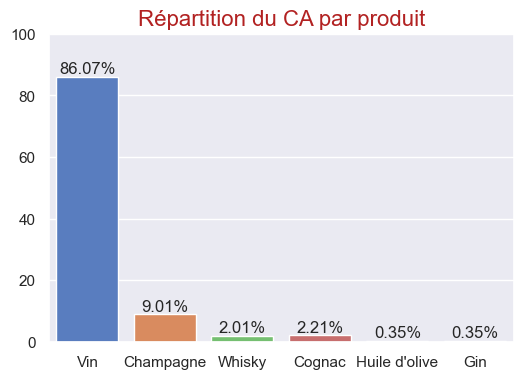

In [508]:
plt.figure(figsize=(6,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=df_graph_CA_par_produit,
                 x='product_type',
                 y='Part_CA_par_produit',
                 hue='product_type',
                 errorbar=None,
                 #estimator='count',
                 order =Ordre_produit,
                 palette=palette_fixe
           )

for x in range(0,6) :
    ax.bar_label(ax.containers[x],fmt='%.2f%%')

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('')
plt.ylim(0,100)
#plt.ylabel('Part du Nbre de référence',fontdict={'fontsize' : 14, 'color':'firebrick'})
#plt.legend()
plt.title("Répartition du CA par produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()  

**Regroupons l'ensemble des données pour pourcentages :**

In [509]:
data_graph_agg_par_prod

,Nbr_references,Total_stock,Total_vente,Part_references,Part_stock,Part_ventes
product_type,,,,,,
Vin,658,13470,5456,92.286115,80.576658,94.986072
Champagne,28,2894,169,3.927069,17.311719,2.942201
Whisky,14,85,48,1.963534,0.508464,0.835655
Cognac,8,99,35,1.122020,0.592212,0.609331
Huile d'olive,3,158,22,0.420757,0.945146,0.383008
Gin,2,11,14,0.280505,0.065801,0.243733


In [510]:
df_graph_CA_par_produit

,CA_par_produit,Part_CA_par_produit
product_type,,
Vin,123518.0,86.072202
Champagne,12928.6,9.009157
Whisky,2886.6,2.011496
Cognac,3170.2,2.209120
Huile d'olive,497.7,0.346817
Gin,504.0,0.351207


In [511]:
data_graph_agg_par_prod_2 = pd.merge(left=data_graph_agg_par_prod,
                                     right=df_graph_CA_par_produit,
                                     on='product_type',
                                     how='inner')
data_graph_agg_par_prod_2

,Nbr_references,Total_stock,Total_vente,Part_references,Part_stock,Part_ventes,CA_par_produit,Part_CA_par_produit
product_type,,,,,,,,
Vin,658,13470,5456,92.286115,80.576658,94.986072,123518.0,86.072202
Champagne,28,2894,169,3.927069,17.311719,2.942201,12928.6,9.009157
Whisky,14,85,48,1.963534,0.508464,0.835655,2886.6,2.011496
Cognac,8,99,35,1.122020,0.592212,0.609331,3170.2,2.209120
Huile d'olive,3,158,22,0.420757,0.945146,0.383008,497.7,0.346817
Gin,2,11,14,0.280505,0.065801,0.243733,504.0,0.351207


###### **TEST**

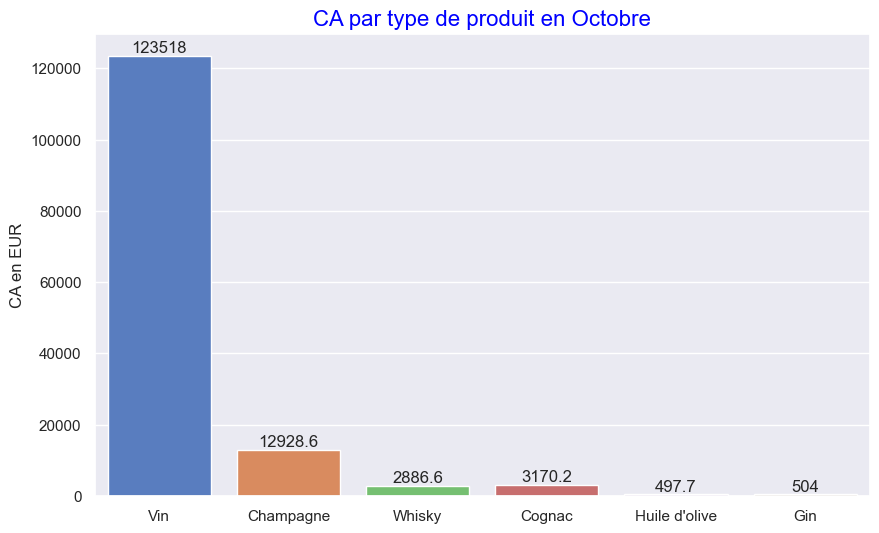

In [512]:
plt.figure(figsize=(10,6))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

ax=sns.barplot(data= df_graph_CA_par_produit ,
               x=df_graph_CA_par_produit.index ,
               y='CA_par_produit',
               estimator ='sum',
               errorbar=None,
               hue=df_graph_CA_par_produit.index,
               order=Ordre_produit
              )

# now simply assign the bar values to
# each bar by passing containers method
# to bar_label function
for x in range(0,6) :
    ax.bar_label( ax.containers[x])

plt.xlabel("")
plt.ylabel('CA en EUR')
plt.grid(axis='y')
#plt.ylim(0,250)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.22,1.02))
plt.title("CA par type de produit en Octobre",fontdict={'fontsize' : 16, 'color':'blue'})


plt.show()

###### **FIN-TEST**

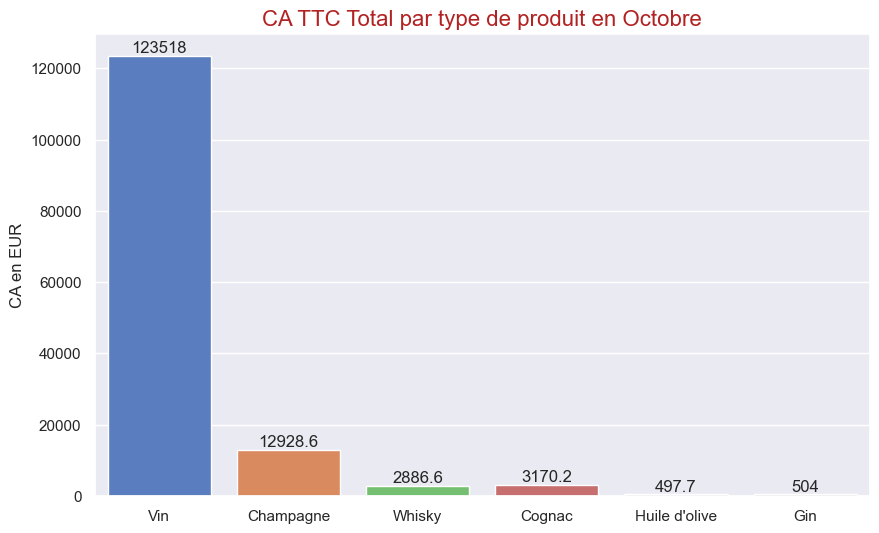

In [513]:
plt.figure(figsize=(10,6))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

ax=sns.barplot(data= df_merge_copy_1_4 ,
               x='product_type' ,
               y='CA_par_article',
               estimator ='sum',
               errorbar=None,
               hue='product_type',
               order=Ordre_produit,
               palette=palette_fixe
              )

# now simply assign the bar values to
# each bar by passing containers method
# to bar_label function
for x in range(0,6) :
    ax.bar_label( ax.containers[x])

plt.xlabel("")
plt.ylabel('CA en EUR')
plt.grid(axis='y')
#plt.ylim(0,250)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.22,1.02))
plt.title("CA TTC Total par type de produit en Octobre",fontdict={'fontsize' : 16, 'color':'firebrick'})


plt.show()

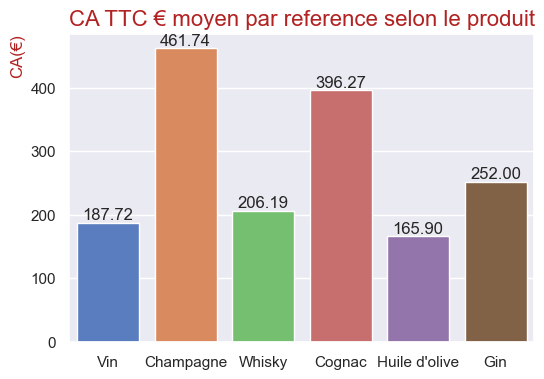

In [514]:
plt.figure(figsize=(6,4))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

ax=sns.barplot(data= df_merge_copy_1_4 ,
               x='product_type' ,
               y='CA_par_article',
               estimator ='mean',
               errorbar=None,
               hue='product_type',
               order=Ordre_produit,
               palette=palette_fixe
              )

# now simply assign the bar values to
# each bar by passing containers method
# to bar_label function
for x in range(0,6) :
    ax.bar_label( ax.containers[x],fmt='%.2f')#fmt='%.2f' permet de tronquer 2 chiffres après la virgule.

plt.xlabel("")
plt.ylabel('CA(€)',fontdict={'fontsize' : 12, 'color':'firebrick'},loc='top')
plt.grid(axis='y')
#plt.ylim(0,250)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.22,1.02))
plt.title("CA TTC € moyen par reference selon le produit",fontdict={'fontsize' : 16, 'color':'firebrick'})


plt.show()

In [515]:
#AU GLOBAL :
nbr_reference = df_merge_copy_1_4['product_id'].count()
print("Le nombre total de référence est de : ",
      nbr_reference, " références.")

Le nombre total de référence est de :  713  références.


In [516]:
#AU GLOBAL :
print("Le CA TTC moyen par reference en Octobre est de : ",
      round(df_merge_copy_1_4['CA_par_article'].mean(),2), " euros.")
print("La CA TTC median par reference en Octobre est de : ",
      round(df_merge_copy_1_4['CA_par_article'].median(),2), " euros.")

Le CA TTC moyen par reference en Octobre est de :  201.27  euros.
La CA TTC median par reference en Octobre est de :  168.0  euros.


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1.5 Conservations des modifications :</h4></div>

In [517]:
df_merge_copy_1_4.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,total_sales,CA_par_article,part_CA_pct,part_CA_pct_cumul
0,4352,1,225.0,0,outofstock,137.81,15940,product,Champagne Egly-Ouriet Grand Cru Millésimé 2008,Champagne,11.0,2475.0,1.725,1.725
1,5892,1,191.3,98,instock,116.06,14983,product,Coteaux Champenois Egly-Ouriet Ambonnay Rouge ...,Champagne,6.0,1147.8,0.800,2.525


In [518]:
#Validons ces modification dans df_merge_final_1 
#ajout des colonnes 'part_CA_pct' , 'part_CA_pct_cumul'
df_merge_final_1 = df_merge_copy_1_4.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.1.6 Complément : Etude de l'impact du Nettoyage sur le chiffre d'affaires :</h4></div>

##### <u>**Recherches des lignes product non intégrés dans notre étude :"** 
On rappelle que les lignes attachment (en post_type) ne correspondent pas à des produits mais à des compléments d'informations sur les produits.

In [519]:
#Recherches des lignes product non intégrées dans notre étude :
mask = (~df_web['sku'].isin(df_merge_final_1['id_web'])) & (df_web['post_type']=='product')
df_web.loc[mask,liste_col_interet_web_1]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1084,NaN,product,Pierre Jean Villa Condrieu Jardin Suspendu 2018,Vin,-56.0,2018-08-08 09:23:43,2019-11-02 12:24:01,pierre-jean-villa-condrieu-suspendu-2018,taxable
1087,NaN,product,Pierre Jean Villa Côte Rôtie Fongeant 2017,Vin,-17.0,2018-07-31 10:07:23,2019-11-02 12:24:15,pierre-jean-villa-cote-rotie-fongeant-2017,taxable
1387,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,taxable


##### <u>**OBSERVATIONS :**</u>  
<u>index 1084 et 1087 :</u>  
Les valeurs de ventes sont abérrantes (valeurs négatives). 
Et nous n'avons pas de sku donc aucune possibilité de connaître le prix associé et donc de faire une évaluation du CA potentiel perdu en retirant ces 2 lignes.

<u>index 'bon-cadeau-25-euros' :</u>  
Nous pouvons évaluer sa part dans le CA.

In [520]:
mask=(df_web['sku']=='bon-cadeau-25-euros')& (df_web['post_type']=='product')
df_bon_cadeau_25_euros =pd.merge(left = df_liaison,
                                 right = df_web.loc[mask,liste_col_interet_web_1] ,
                                 left_on = 'id_web' ,
                                 right_on ='sku',
                                 how = 'inner'
                                 )

df_bon_cadeau_25_euros =pd.merge(left = df_erp,
                                 right = df_bon_cadeau_25_euros ,
                                 on = 'product_id' ,
                                 how = 'inner'
                                 )
display(df_bon_cadeau_25_euros)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
0,4954,1,25.0,23,instock,13.3,bon-cadeau-25-euros,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,taxable


In [521]:
CA_Nettoye = (df_bon_cadeau_25_euros['price']* df_bon_cadeau_25_euros['total_sales'] ).sum()
print("le chiffre d'affaire correspondant au bon cadeau de 25 euros qui a été retiré dans le Nettoyage de donné est de : ",
      CA_Nettoye , "euros.")

le chiffre d'affaire correspondant au bon cadeau de 25 euros qui a été retiré dans le Nettoyage de donné est de :  175.0 euros.


##### <u>**OBSERVATIONS :**</u>  
<u>index 1084 et 1087 :</u>  
Les valeurs de ventes sont abérrantes (valeurs négatives). 
Et nous n'avons pas de sku donc aucune possibilité de connaître le prix associé et donc de faire une évaluation du CA potentiel perdu en retirant ces 2 lignes.

<u>index 'bon-cadeau-25-euros' :</u>  
Nous pouvons évaluer sa part dans le CA.  
**=> Ce montant de 175 euros est négligeable par rapport au CA total de 143 505 euros**
Il représente : **0,12%**

In [522]:
#Pour Rappel CA total :
CA_total_site

143505.09999999998

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 5.2 - Analyse des ventes en Quantités</h3>
</div>

In [523]:
#Travaillons sur une copie :
df_merge_copy_1_5 = df_merge_final_1.copy(deep=True)

In [524]:
df_merge_copy_1_5.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul'],
      dtype='object')

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.2.1. Palmarès des articles en quantité</h4></div>

##### <u>***Effectuer le tri dans l'ordre décroissant de quantités vendues du dataset df_merge***</u>

In [525]:
#Effectuer le tri dans l'ordre décroissant de quantités vendues du dataset df_merge
#Réinitialiser l'index du dataset par un reset_index
#Afficher les 20 premier articles en quantité
df_merge_copy_1_5 = df_merge_copy_1_5.sort_values(by='total_sales',ascending=False).reset_index().drop(columns='index')
df_merge_copy_1_5[colonnes_choix_3].head(5)

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_CA_pct,part_CA_pct_cumul
0,4867,9.9,36.0,356.4,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,0.248,22.827
1,4203,9.9,27.0,267.3,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,0.186,40.285
2,4275,14.9,24.0,357.6,I Fabbri Chianti Classico Lamole 2017,Vin,0.249,21.584
3,4726,12.7,22.0,279.4,François Baur Pinot Noir Schlittweg 2017,Vin,0.195,36.852
4,4647,28.5,22.0,627.0,Bernard Baudry Chinon Rouge La Croix Boissée 2017,Vin,0.437,8.235


##### <u>**Observation**</u>  
La colonne part_CA_pct_cumul n'a plus de sens si on trie l'ordre car la colonne ne se met pas à jour et donc le cumul n'est pas recalculé et donc faux.

##### <u>***Afficher les 20 premiers articles en quantité***</u>

In [526]:
df_top20_article_total_sales = df_merge_copy_1_5.head(20)
display(df_top20_article_total_sales[colonnes_choix_2])

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_CA_pct
0,4867,9.9,36.0,356.4,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,0.248
1,4203,9.9,27.0,267.3,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,0.186
2,4275,14.9,24.0,357.6,I Fabbri Chianti Classico Lamole 2017,Vin,0.249
3,4726,12.7,22.0,279.4,François Baur Pinot Noir Schlittweg 2017,Vin,0.195
4,4647,28.5,22.0,627.0,Bernard Baudry Chinon Rouge La Croix Boissée 2017,Vin,0.437
5,5826,41.2,20.0,824.0,Agnès Levet Côte Rôtie Améthyste 2017,Vin,0.574
6,6129,5.2,20.0,104.0,Moulin de Gassac IGP Pays d'Hérault Guilhem Bl...,Vin,0.072
7,4220,11.6,18.0,208.8,Xavier Frissant Touraine Amboise Chenin Les Pi...,Vin,0.146
8,5778,5.8,17.0,98.6,Maurel Pays d'Oc Merlot 2018,Vin,0.069
9,6569,29.0,17.0,493.0,Decelle-Villa Chorey-Lès-Beaune 2016,Vin,0.344


##### <u>***Graphique en barre des 20 premiers articles en quantité:***</u>

In [527]:
#PORU EVITER une lecture en nombres des id sur l'axe des x
df_top20_article_total_sales['product_id'] = (df_top20_article_total_sales['product_id']).astype('string')

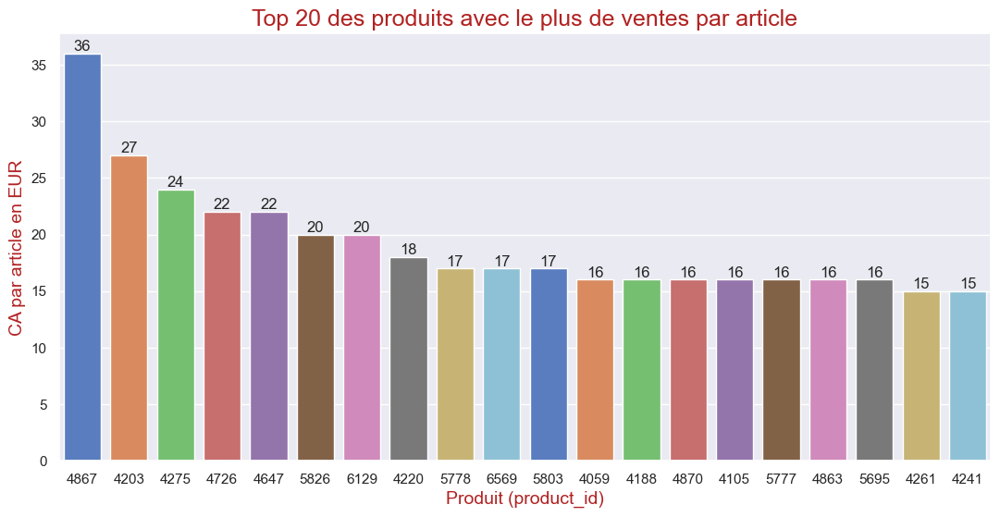

In [528]:
plt.figure(figsize=(13,6))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_total_sales , 
                 x='product_id',
                 y = 'total_sales', errorbar=None,
                 hue='product_id',legend=False,
                 palette='muted',
                 order=df_top20_article_total_sales['product_id']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x])

plt.xlabel('Produit (product_id)',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('CA par article en EUR', fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top 20 des produits avec le plus de ventes par article",
          fontdict = {'fontsize' : 18, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

###### **VERSION VERTICALE NOM :**

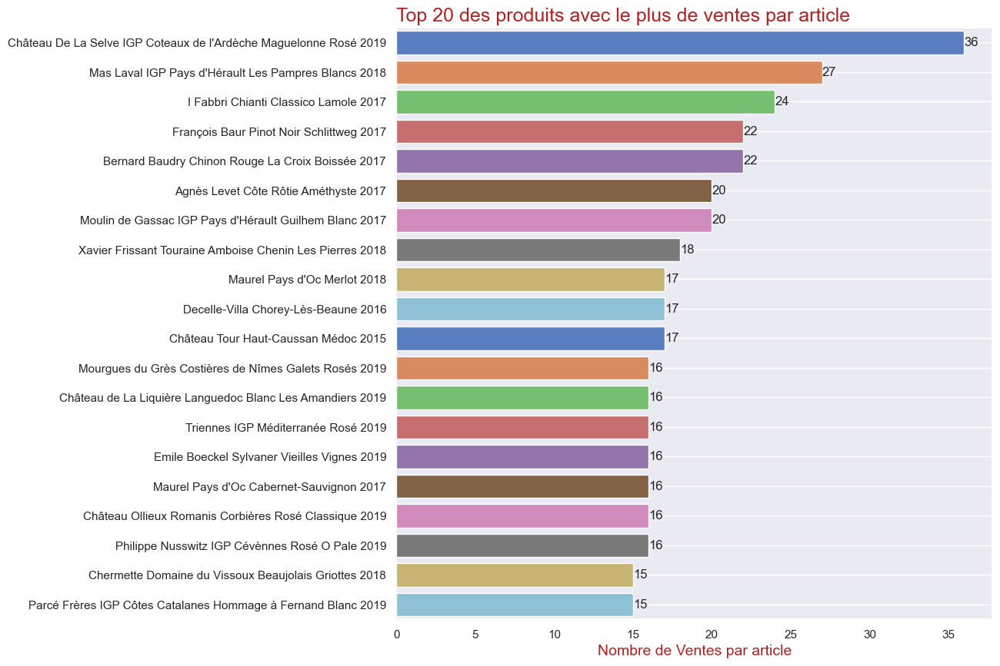

In [529]:
#VERSION VERTICALE NOM :
plt.figure(figsize=(10,10))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_total_sales , 
                 y='post_title',
                 x = 'total_sales', errorbar=None,
                 hue='post_title',legend=False,
                 palette='muted',
                 order=df_top20_article_total_sales['post_title']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x])

plt.xlabel('Nombre de Ventes par article',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top 20 des produits avec le plus de ventes par article", loc='left',
          fontdict = {'fontsize' : 18, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

In [530]:
df_top20_article_total_sales['Label']=df_top20_article_total_sales['post_title']+' - '+df_top20_article_total_sales['product_type']

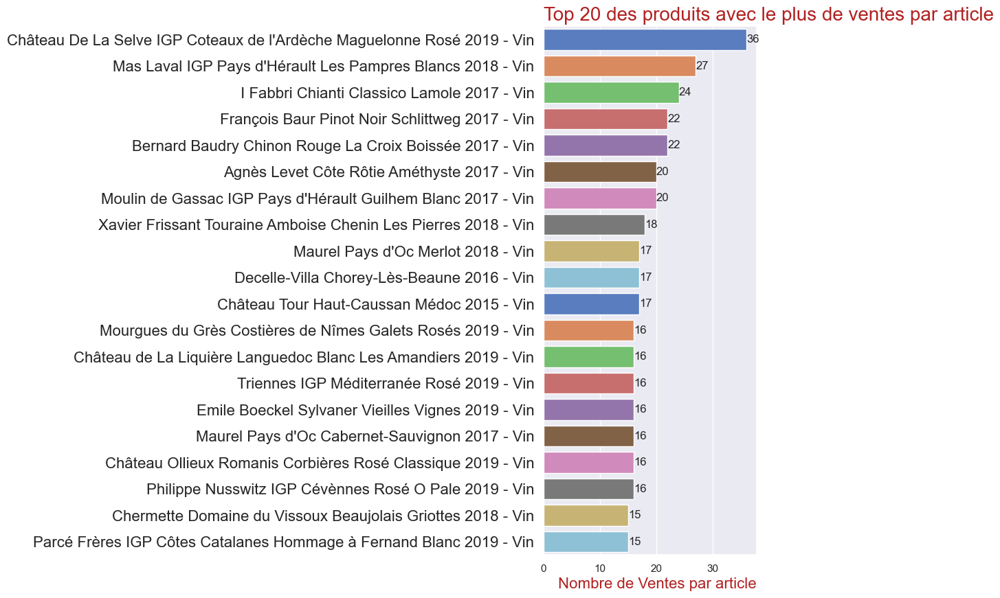

In [531]:
#VERSION VERTICALE NOM :
plt.figure(figsize=(4,10))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_total_sales , 
                 y='Label',
                 x = 'total_sales', errorbar=None,
                 hue='Label',legend=False,
                 palette='muted',
                 order=df_top20_article_total_sales['Label']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x])

plt.yticks(fontsize=16)
plt.xlabel('Nombre de Ventes par article',loc='right',fontdict = {'fontsize' : 16,'color':'firebrick'})
plt.ylabel('', fontdict = {'fontsize' : 16,'color':'firebrick'})
plt.grid(axis='x')
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top 20 des produits avec le plus de ventes par article", loc='left',
          fontdict = {'fontsize' : 20, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

###### **COMPLEMENT PERSO :Classement par titre**

In [532]:
#Classement par titre :
classement_top20_total_sales = df_top20_article_total_sales[['post_title','product_type','total_sales']]
classement_top20_total_sales

,post_title,product_type,total_sales
0,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,36.0
1,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,27.0
2,I Fabbri Chianti Classico Lamole 2017,Vin,24.0
3,François Baur Pinot Noir Schlittweg 2017,Vin,22.0
4,Bernard Baudry Chinon Rouge La Croix Boissée 2017,Vin,22.0
5,Agnès Levet Côte Rôtie Améthyste 2017,Vin,20.0
6,Moulin de Gassac IGP Pays d'Hérault Guilhem Bl...,Vin,20.0
7,Xavier Frissant Touraine Amboise Chenin Les Pi...,Vin,18.0
8,Maurel Pays d'Oc Merlot 2018,Vin,17.0
9,Decelle-Villa Chorey-Lès-Beaune 2016,Vin,17.0


In [533]:
classement_top20_total_sales['classement']=1+classement_top20_total_sales.index
classement_top20_total_sales

,post_title,product_type,total_sales,classement
0,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,36.0,1
1,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,27.0,2
2,I Fabbri Chianti Classico Lamole 2017,Vin,24.0,3
3,François Baur Pinot Noir Schlittweg 2017,Vin,22.0,4
4,Bernard Baudry Chinon Rouge La Croix Boissée 2017,Vin,22.0,5
5,Agnès Levet Côte Rôtie Améthyste 2017,Vin,20.0,6
6,Moulin de Gassac IGP Pays d'Hérault Guilhem Bl...,Vin,20.0,7
7,Xavier Frissant Touraine Amboise Chenin Les Pi...,Vin,18.0,8
8,Maurel Pays d'Oc Merlot 2018,Vin,17.0,9
9,Decelle-Villa Chorey-Lès-Beaune 2016,Vin,17.0,10


In [534]:
classement_top20_total_sales.columns

Index(['post_title', 'product_type', 'total_sales', 'classement'], dtype='object')

In [535]:
classement_top20_total_sales = classement_top20_total_sales[['classement','post_title', 'product_type', 'total_sales']]
classement_top20_total_sales

,classement,post_title,product_type,total_sales
0,1,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,36.0
1,2,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,27.0
2,3,I Fabbri Chianti Classico Lamole 2017,Vin,24.0
3,4,François Baur Pinot Noir Schlittweg 2017,Vin,22.0
4,5,Bernard Baudry Chinon Rouge La Croix Boissée 2017,Vin,22.0
5,6,Agnès Levet Côte Rôtie Améthyste 2017,Vin,20.0
6,7,Moulin de Gassac IGP Pays d'Hérault Guilhem Bl...,Vin,20.0
7,8,Xavier Frissant Touraine Amboise Chenin Les Pi...,Vin,18.0
8,9,Maurel Pays d'Oc Merlot 2018,Vin,17.0
9,10,Decelle-Villa Chorey-Lès-Beaune 2016,Vin,17.0


In [536]:
classement_top20_total_sales_extract = classement_top20_total_sales.rename(columns={'post_title':'Nom',
                                                                                 'product_type':'type de produit', 
                                                                                 'total_sales':'Ventes par article'})
classement_top20_total_sales_extract

,classement,Nom,type de produit,Ventes par article
0,1,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,36.0
1,2,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,27.0
2,3,I Fabbri Chianti Classico Lamole 2017,Vin,24.0
3,4,François Baur Pinot Noir Schlittweg 2017,Vin,22.0
4,5,Bernard Baudry Chinon Rouge La Croix Boissée 2017,Vin,22.0
5,6,Agnès Levet Côte Rôtie Améthyste 2017,Vin,20.0
6,7,Moulin de Gassac IGP Pays d'Hérault Guilhem Bl...,Vin,20.0
7,8,Xavier Frissant Touraine Amboise Chenin Les Pi...,Vin,18.0
8,9,Maurel Pays d'Oc Merlot 2018,Vin,17.0
9,10,Decelle-Villa Chorey-Lès-Beaune 2016,Vin,17.0


In [537]:
#Extraction si nécessaire :
classement_top20_total_sales_extract.to_excel('classement_top20_total_sales_extract.xlsx',index=False)

###### **FIN-COMPLEMENT PERSO :**

##### <u>***Graphique en barre des 20 premiers articles avec plotly express***</u>

In [538]:
fig = px.bar(df_top20_article_total_sales,
                   x= 'product_id' ,
                   y= 'total_sales' ,
                   title = 'Le top 20 des produits avec le meilleur total de ventes par article',
                   labels={'product_id':'Produit (product_id)',
                           'total_sales': 'Ventes par article en unité'},
                   width=1000,
                   height=600,
                   color='product_id',
                   color_discrete_sequence=px.colors.qualitative.G10,
                   opacity=0.75
           
                  )
fig.show()

##### <u>**Complément**</u>

In [539]:
#complément:
data = pd.DataFrame(df_top20_article_total_sales['product_type'].value_counts())
data

,count
product_type,
Vin,20


In [540]:
data.index.rename('product',inplace=True)

In [541]:
data

,count
product,
Vin,20


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.2.2 Calculer le 20 / 80 en quantité : LOI DE PARETO</h4></div>

In [542]:
#############################
# Calculer le 20 / 80 en CA #
#############################

#Créer une colonne calculant la part en quantité de la ligne dans le dataset
#Créer une colonne réalisant la somme cumulative de la colonne précedemment créée
#Grâce au deux colonnes créées précedemment, calculer le nombre d'articles représentant 80% des ventes en quantité
#Afficher la proportion que représentent ce groupe d'articles dans le catalogue entier du site web


**Remarque le df_merge_copy_1_5 est déjà trié par quantité décroissante**

In [543]:
df_merge_copy_1_5.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul'],
      dtype='object')

In [544]:
#Création d'une colonne calculant la part en quantité de la ligne dans le dataset
total_total_sales = df_merge_copy_1_5['total_sales'].sum()
df_merge_copy_1_5['part_total_sales'] = round((df_merge_copy_1_5['total_sales']/total_total_sales)*100 ,3)

#tri déjà fait mais refait par sécurité en cas de modification :
df_merge_copy_1_5 = df_merge_copy_1_5.sort_values(by='total_sales',ascending=False).reset_index().drop(columns='index')

#Création d' une colonne réalisant la somme cumulative de la colonne précedemment créée
df_merge_copy_1_5['part_total_sales_cumul'] = df_merge_copy_1_5['part_total_sales'].cumsum()

In [545]:
print("le nombre totat de Vente de bouteilles en Octobre est de : ",
      int(total_total_sales), " bouteilles.")

le nombre totat de Vente de bouteilles en Octobre est de :  5744  bouteilles.


In [546]:
df_merge_copy_1_5.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul'],
      dtype='object')

In [547]:
colonnes_choix_3

['product_id',
 'price',
 'total_sales',
 'CA_par_article',
 'post_title',
 'product_type',
 'part_CA_pct',
 'part_CA_pct_cumul']

In [548]:
colonnes_choix_4 = ['product_id', 'price', 'total_sales', 'CA_par_article', 'post_title', 'product_type',
                    'part_total_sales', 'part_total_sales_cumul']

In [549]:
df_merge_copy_1_5[colonnes_choix_4].head(2)

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_total_sales,part_total_sales_cumul
0,4867,9.9,36.0,356.4,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,0.627,0.627
1,4203,9.9,27.0,267.3,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,0.470,1.097


In [550]:
df_merge_copy_1_5[colonnes_choix_4].tail(2)

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_total_sales,part_total_sales_cumul
711,4337,83.0,0.0,0.0,Champagne Mailly Grand Cru Les Echansons 2007,Champagne,0.0,100.007
712,4100,15.8,0.0,0.0,Emile Boeckel Gewurztraminer Grand Cru Zotzenb...,Vin,0.0,100.007


In [551]:
df_article_repres_quasi_80_pct_ventes = df_merge_copy_1_5.loc[df_merge_copy_1_5['part_total_sales_cumul']<80,colonnes_choix_4]
df_article_repres_quasi_80_pct_ventes

,product_id,price,total_sales,CA_par_article,post_title,product_type,part_total_sales,part_total_sales_cumul
0,4867,9.9,36.0,356.4,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,0.627,0.627
1,4203,9.9,27.0,267.3,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,0.470,1.097
2,4275,14.9,24.0,357.6,I Fabbri Chianti Classico Lamole 2017,Vin,0.418,1.515
3,4726,12.7,22.0,279.4,François Baur Pinot Noir Schlittweg 2017,Vin,0.383,1.898
4,4647,28.5,22.0,627.0,Bernard Baudry Chinon Rouge La Croix Boissée 2017,Vin,0.383,2.281
...,...,...,...,...,...,...,...,...
427,4793,18.7,7.0,130.9,Maurice Schoech Pinot Gris Grand Cru Schlossbe...,Vin,0.122,79.499
428,6928,19.0,7.0,133.0,Le Cèdre de Jean Faure Saint-Emilion 2016,Vin,0.122,79.621
429,4405,68.1,7.0,476.7,Cognac Frapin Château de Fontpinot XO 1/2,Cognac,0.122,79.743
430,4350,79.5,7.0,556.5,Champagne Egly-Ouriet Grand Cru Extra Brut V.P.,Champagne,0.122,79.865


In [552]:
nb_articles_repres_80_pct_ventes = 1+len(df_article_repres_quasi_80_pct_ventes)
print("le nombre d'articles représentant 80% des ventes est de ",nb_articles_repres_80_pct_ventes," articles.")

nb_articles_total=len(df_merge_copy_1_5)
print("la proportion que représentent ce groupe d'articles est de ",
      round((nb_articles_repres_80_pct_ventes/nb_articles_total)*100,2) , " % du catalogue entier du site web.")

le nombre d'articles représentant 80% des ventes est de  433  articles.
la proportion que représentent ce groupe d'articles est de  60.73  % du catalogue entier du site web.


##### <u>**OBSERVATIONS :**</u>  
Voir Observations présente :  
La loi de Pareto ne s'applique pas strictement lorsque l'on a beaucoup de produits qui se ressemble avec peu de variétés dans le type de produit et dans sa valeur.

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.2.3 - Analyse complémentaire</h4></div>

In [553]:
df_merge_copy_1_5.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul'],
      dtype='object')

In [554]:
df_graph_Ventes_par_produit = df_merge_copy_1_5[['product_type','total_sales']].groupby(by='product_type').sum()
df_graph_Ventes_par_produit.sort_values(by="total_sales",inplace=True,ascending=False)
df_graph_Ventes_par_produit

,total_sales
product_type,
Vin,5456.0
Champagne,169.0
Whisky,48.0
Cognac,35.0
Huile d'olive,22.0
Gin,14.0


In [555]:
df_graph_Ventes_par_produit = (df_graph_Ventes_par_produit.T[Ordre_produit]).T
df_graph_Ventes_par_produit

,total_sales
product_type,
Vin,5456.0
Champagne,169.0
Whisky,48.0
Cognac,35.0
Huile d'olive,22.0
Gin,14.0


**ETUDE en pourcentage déjà faite =>voir à la fin du 4.2.5**

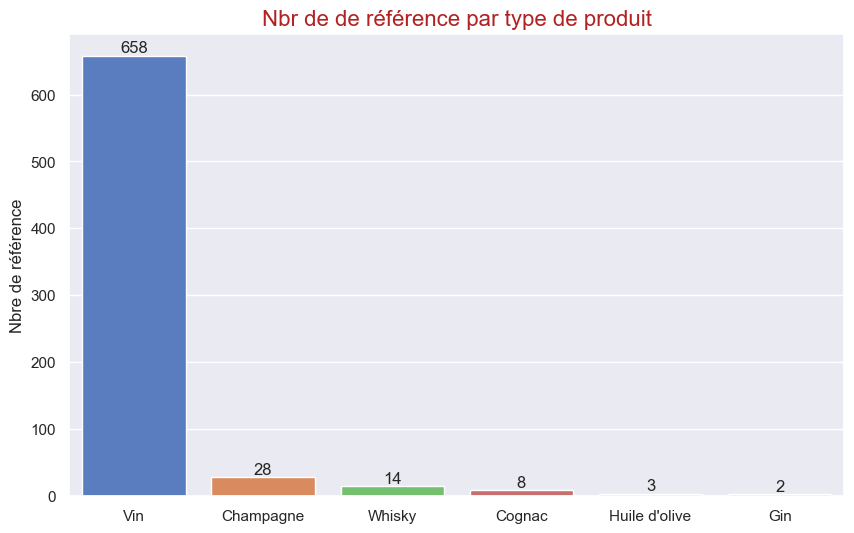

In [556]:
plt.figure(figsize=(10,6))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=df_merge_final_1,
                 x='product_type',
                 y='product_id',
                 hue='product_type',
                 errorbar=None,
                 estimator='count',
                 order=Ordre_produit,
                 palette=palette_fixe
           )

for x in range(0,6) :
    ax.bar_label(ax.containers[x])

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('Nbre de référence')
#plt.legend()
plt.title("Nbr de de référence par type de produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

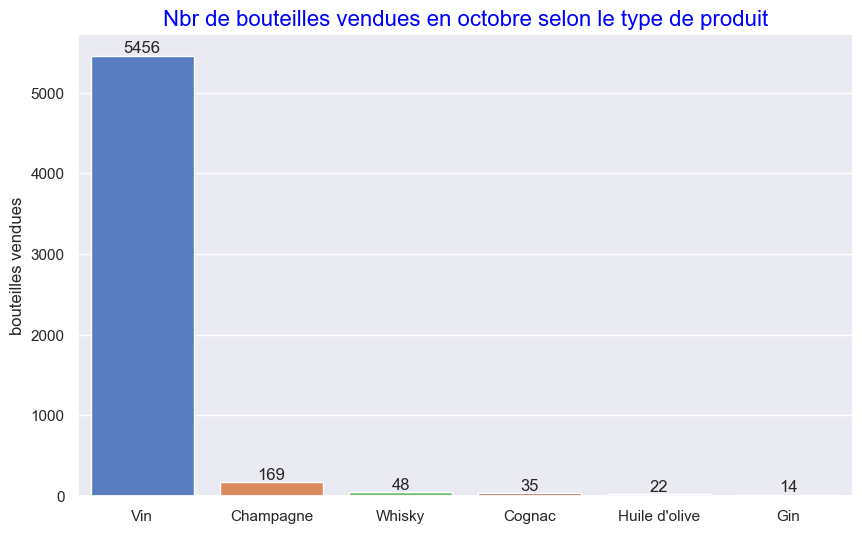

In [557]:
plt.figure(figsize=(10,6))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=df_merge_copy_1_5,
                 x='product_type',
                 y='total_sales',
                 hue='product_type',
                 errorbar=None, 
                 estimator='sum',
                 order=Ordre_produit,
                 palette=palette_fixe
           )

for x in range(0,6) :
    ax.bar_label(ax.containers[x])

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('bouteilles vendues')
#plt.ylim(0,7000)
#plt.legend()
plt.title("Nbr de bouteilles vendues en octobre selon le type de produit",fontdict={'fontsize' : 16, 'color':'blue'})
plt.show()

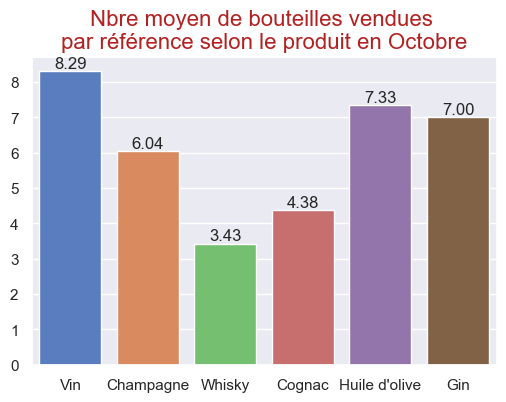

In [558]:
plt.figure(figsize=(6,4))
#plt.rcParams.update({'font.size':16})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=df_merge_copy_1_5,
                 x='product_type',
                 y='total_sales',
                 hue='product_type',
                 errorbar=None, 
                 estimator='mean',
                 order=Ordre_produit,
                 palette=palette_fixe
           )
for x in range(0,6) :
    ax.bar_label(ax.containers[x],fmt='%.2f')#fmt='%.2f' permet de tronquer 2 chiffres après la virgule.

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('')
#plt.ylim(0,7000)
#plt.legend()
plt.title("Nbre moyen de bouteilles vendues \npar référence selon le produit en Octobre",
          fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

In [559]:
#AU GLOBAL :
nbr_reference = df_merge_copy_1_5['product_id'].count()
print("Le Nbr moyen de ventes par reference en Octobre est de : ",
      round(df_merge_copy_1_5['total_sales'].mean(),2), " bouteilles.")
print("La médiane du Nbr de ventes par reference en Octobre est de : ",
      round(df_merge_copy_1_5['total_sales'].median(),2), " bouteilles.")

Le Nbr moyen de ventes par reference en Octobre est de :  8.06  bouteilles.
La médiane du Nbr de ventes par reference en Octobre est de :  8.0  bouteilles.


In [560]:
df_merge_copy_1_5.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,total_sales,CA_par_article,part_CA_pct,part_CA_pct_cumul,part_total_sales,part_total_sales_cumul
0,4867,1,9.9,121,instock,4.86,16148,product,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin,36.0,356.4,0.248,22.827,0.627,0.627
1,4203,1,9.9,74,instock,5.01,15415,product,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin,27.0,267.3,0.186,40.285,0.470,1.097


In [561]:
#Validons ces modification dans df_merge_final_1 
#(ajout de colonnes CA_par_article, part_CA_pct , part_CA_pct_cumul / tri par CA-oar-article
df_merge_final_1 = df_merge_copy_1_5.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.2.4 Complément : Etude de l'impact du Nettoyage sur les ventes en quantités :</h4></div>

**Nettoyage de df_web**  
Pour le nombre de ventes,
Nous avons Nettoyé dans df_web 3 lignes avec 'post-type' product qui avaient des valeurs de vente :

In [562]:
#Recherches des lignes product non intégrées dans notre étude :
mask = (~df_web['sku'].isin(df_merge_final_1['id_web'])) & (df_web['post_type']=='product')
df_web.loc[mask,liste_col_interet_web_1]

,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status
1084,NaN,product,Pierre Jean Villa Condrieu Jardin Suspendu 2018,Vin,-56.0,2018-08-08 09:23:43,2019-11-02 12:24:01,pierre-jean-villa-condrieu-suspendu-2018,taxable
1087,NaN,product,Pierre Jean Villa Côte Rôtie Fongeant 2017,Vin,-17.0,2018-07-31 10:07:23,2019-11-02 12:24:15,pierre-jean-villa-cote-rotie-fongeant-2017,taxable
1387,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,2018-06-01 11:53:46,2018-06-01 12:13:57,bon-cadeau-de-25-euros,taxable


Sur ces 3 lignes :  
2 ont des valeurs de ventes négatives abérrantes.  
L'autre est un bon et donc n'est pas une référence à analyser avec les ventes de bouteilles.  
**=> Le seul impact est donc sur ces valeurs de ventes erronnées évaluées donc à 73 ventes**

**NETTOYAGE de df_erp, df_liaison, et jointure :**  
Lors de la jointure l'ensemble des valeurs présentes dans le fichier df_web ont trouvé une correspondance dans df_merge.  
Toutes les autres Nettoyages, et jointures n'ont donc pas fait disparaître d'autre lignes de ventes de product.

In [563]:
#RAppel du nombre de ventes :
total_total_sales

5744.0

Pour rappel le nombre total de vente en octobre est de 5744 ventes.  
**L'impact potentiel du manque d'information(product_id manquant) et des valeurs erronés est donc d'environ :**  
(73/5744)*100 = **1,27 % du nombres de ventes**

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 5.3 - Analyse des stocks</h3>
</div>

In [564]:
#Travaillons sur une copie :
df_merge_copy_1_6 = df_merge_final_1.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.1 Calcul du nombre de mois de stock</h4></div>

In [565]:
######################################
# Calcule le nombre de mois de stock #
######################################

#Import de numpy (déjà fait)
#Création de la colonne Rotation de stock
#Remplacement des "inf" par 0
#Effectuer le tri dans l'ordre décroissant du nombre de mois de stock dans le dataset df_merge
#Graphique en barre du flop 20 des produits qui ont le plus de mois de stock

**Documentation sur la Rotation des stocks :**  
https://www.cubyn.com/fr/blog/taux-de-rotation-des-stocks-le-calculer-et-comprendre-ses-enjeux  
https://combohr.com/fr/blog/rotation-de-stock

Calcul de la rotation des stocks.  
Nos données correspondent à une extraction au 31 octobre,  
et les ventes sont celles du 1 octobre au 31 octobre.  

Nous considérerons donc le **stock moyen** comme la moyenne entre :  
. le stock en début de mois (stock fin de mois+vente)  
. et le stock en fin de mois.

Concernant le **Ratio de stocks mensuel** il s'agira donc :  
Nbre de Vente du mois (*Prix Achat bouteille)/Quantité_Stock_moyen(*Prix achat bouteille) 
'=Nbre de vente du mois/Quantité_Stock_moyen

La Rotation des stocks se calcule en général en CA,  
cependant ici cela reviendra à multiplier à la fois le nbre des ventes et les quantités en Stock par le prix d'achat de la bouteille,  
pour estimer le CA des ventes et le CA en stock).

Lors du ratio de rotation des stocks, nous allons revenir à un ration de quantité : **Nbre de vente Mensuelle/stock moyen (en quantité)**.  
Et nous pouvons donc calculer en unité.

##### <u>***Création de la colonne Rotation de stock , mais aussi : stock_moyen , rotation_stock_mensuel, rotation_stock_annuel, mois_de_stock***</u>

In [566]:
df_merge_copy_1_6.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul'],
      dtype='object')

In [567]:
df_merge_copy_1_6['stock_moyen']=(df_merge_copy_1_6['stock_quantity']+df_merge_copy_1_6['total_sales']+
                                  df_merge_copy_1_6['stock_quantity'])/2

In [568]:
df_merge_copy_1_6['rotation_stock_mensuel']=df_merge_copy_1_6['total_sales']/df_merge_copy_1_6['stock_moyen']

In [569]:
#Si on extrapole les ventes mensuelles à l'année :
df_merge_copy_1_6['rotation_stock_annuel']=df_merge_copy_1_6['rotation_stock_mensuel']*12

Pour calculer un nombre de mois de stock.  
On va calculer le Ratio entre le Stock/Vente_mensuelle

In [570]:
df_merge_copy_1_6['mois_de_stock'] = df_merge_copy_1_6['stock_quantity']/df_merge_copy_1_6['total_sales']

In [571]:
df_merge_copy_1_6.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock'],
      dtype='object')

In [572]:
colonnes_choix_4

['product_id',
 'price',
 'total_sales',
 'CA_par_article',
 'post_title',
 'product_type',
 'part_total_sales',
 'part_total_sales_cumul']

In [573]:
colonnes_choix_5 = ['product_id', 'price', 'total_sales', 'stock_quantity',
                    'stock_moyen','rotation_stock_mensuel','rotation_stock_annuel','mois_de_stock',
                    'post_title', 'product_type']

In [574]:
df_merge_copy_1_6[colonnes_choix_5].head(2)

,product_id,price,total_sales,stock_quantity,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,post_title,product_type
0,4867,9.9,36.0,121,139.0,0.258993,3.107914,3.361111,Château De La Selve IGP Coteaux de l'Ardèche M...,Vin
1,4203,9.9,27.0,74,87.5,0.308571,3.702857,2.740741,Mas Laval IGP Pays d'Hérault Les Pampres Blanc...,Vin


##### **<u>vision Globale :</u>**

In [575]:
df_merge_copy_1_6.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock'],
      dtype='object')

In [576]:
df_merge_copy_1_6[['stock_quantity',
                   'stock_moyen','rotation_stock_mensuel',
                   'rotation_stock_annuel','mois_de_stock']].describe()

,stock_quantity,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock
count,713.000000,713.000000,691.000000,691.000000,691.000000
mean,23.446003,27.474053,0.412269,4.947230,inf
std,22.234835,23.224199,0.321165,3.853978,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000,11.500000,0.278129,3.337553,1.750000
50%,20.000000,24.500000,0.344828,4.137931,2.400000
75%,30.000000,36.000000,0.444444,5.333333,3.095455
max,145.000000,148.500000,2.000000,24.000000,inf


**Inconvénient :** Les inf ne permettent pas d'avoir des moyennes globales de tout

##### <u>**Une autre façon d'avoir une vision globale :**</u>

In [577]:
df_merge_copy_1_6.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock'],
      dtype='object')

In [578]:
df_merge_copy_1_6_vision_global = pd.DataFrame( (df_merge_copy_1_6[['stock_quantity','total_sales']]).sum() ).T
df_merge_copy_1_6_vision_global

,stock_quantity,total_sales
0,16717.0,5744.0


In [579]:
df_merge_copy_1_6_vision_global['stock_moyen']=(df_merge_copy_1_6_vision_global['stock_quantity']+df_merge_copy_1_6_vision_global['total_sales']+
                                  df_merge_copy_1_6_vision_global['stock_quantity'])/2

In [580]:
df_merge_copy_1_6_vision_global['rotation_stock_mensuel']=df_merge_copy_1_6_vision_global['total_sales']/df_merge_copy_1_6_vision_global['stock_moyen']

In [581]:
#Si on extrapole les ventes mensuelles à l'année :
df_merge_copy_1_6_vision_global['rotation_stock_annuel']=df_merge_copy_1_6_vision_global['rotation_stock_mensuel']*12

Pour calculer un nombre de mois de stock.  
On va calculer le Ratio entre le Stock/Vente_mensuelle

In [582]:
df_merge_copy_1_6_vision_global['mois_de_stock'] = df_merge_copy_1_6_vision_global['stock_quantity']/df_merge_copy_1_6_vision_global['total_sales']

In [583]:
df_merge_copy_1_6_vision_global

,stock_quantity,total_sales,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock
0,16717.0,5744.0,19589.0,0.293226,3.518709,2.910341


In [584]:
round(df_merge_copy_1_6_vision_global,2)

,stock_quantity,total_sales,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock
0,16717.0,5744.0,19589.0,0.29,3.52,2.91


##### <u>***Affichage du flop 20 des produits qui ont le plus de mois de stock***</u>

In [585]:
df_merge_copy_1_6 = df_merge_copy_1_6.sort_values(by='mois_de_stock',ascending=False).reset_index().drop(columns='index')
df_merge_copy_1_6[colonnes_choix_5].head(5)

,product_id,price,total_sales,stock_quantity,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,post_title,product_type
0,4337,83.00,0.0,145,145.0,0.000000,0.000000,inf,Champagne Mailly Grand Cru Les Echansons 2007,Champagne
1,4355,12.65,0.0,97,97.0,0.000000,0.000000,inf,Champagne Egly-Ouriet Grand Cru Blanc de Noirs,Champagne
2,5932,59.90,0.0,13,13.0,0.000000,0.000000,inf,Cognac Normandin Mercier VFC,Cognac
3,4142,53.00,4.0,125,127.0,0.031496,0.377953,31.25,Champagne Gosset Grand Millésime 2006,Champagne
4,6126,135.00,5.0,138,140.5,0.035587,0.427046,27.60,Champagne Gosset Célébris Vintage 2007,Champagne


inf correspond à infini.  
Ils devraient être classé en tête des flops.  
Comme demandé mettons à part ces bouteilles qui n'ont pas connu de ventes sur le mois étudié ( en remplaçant inf par 0) :

In [586]:
type(df_merge_copy_1_6.loc[0,'mois_de_stock'])

numpy.float64

In [587]:
df_merge_copy_1_6.loc[df_merge_copy_1_6['mois_de_stock']==np.inf,'mois_de_stock']=0

In [588]:
df_merge_copy_1_6[colonnes_choix_5].head(5)

,product_id,price,total_sales,stock_quantity,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,post_title,product_type
0,4337,83.00,0.0,145,145.0,0.000000,0.000000,0.00,Champagne Mailly Grand Cru Les Echansons 2007,Champagne
1,4355,12.65,0.0,97,97.0,0.000000,0.000000,0.00,Champagne Egly-Ouriet Grand Cru Blanc de Noirs,Champagne
2,5932,59.90,0.0,13,13.0,0.000000,0.000000,0.00,Cognac Normandin Mercier VFC,Cognac
3,4142,53.00,4.0,125,127.0,0.031496,0.377953,31.25,Champagne Gosset Grand Millésime 2006,Champagne
4,6126,135.00,5.0,138,140.5,0.035587,0.427046,27.60,Champagne Gosset Célébris Vintage 2007,Champagne


In [589]:
df_merge_copy_1_6 = df_merge_copy_1_6.sort_values(by='mois_de_stock',ascending=False).reset_index().drop(columns='index')
df_merge_copy_1_6[colonnes_choix_5].head(5)

,product_id,price,total_sales,stock_quantity,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,post_title,product_type
0,4142,53.0,4.0,125,127.0,0.031496,0.377953,31.250000,Champagne Gosset Grand Millésime 2006,Champagne
1,6126,135.0,5.0,138,140.5,0.035587,0.427046,27.600000,Champagne Gosset Célébris Vintage 2007,Champagne
2,4356,51.6,3.0,81,82.5,0.036364,0.436364,27.000000,Champagne Egly-Ouriet Premier Cru Les Vignes d...,Champagne
3,4348,59.0,5.0,125,127.5,0.039216,0.470588,25.000000,Champagne Egly-Ouriet Grand Cru Brut Tradition,Champagne
4,4148,37.5,3.0,71,72.5,0.041379,0.496552,23.666667,Champagne Mailly Grand Cru Brut Rosé,Champagne


In [590]:
df_top20_article_mois_stock = df_merge_copy_1_6.head(20)
display(df_top20_article_mois_stock[colonnes_choix_5])

,product_id,price,total_sales,stock_quantity,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,post_title,product_type
0,4142,53.0,4.0,125,127.0,0.031496,0.377953,31.250000,Champagne Gosset Grand Millésime 2006,Champagne
1,6126,135.0,5.0,138,140.5,0.035587,0.427046,27.600000,Champagne Gosset Célébris Vintage 2007,Champagne
2,4356,51.6,3.0,81,82.5,0.036364,0.436364,27.000000,Champagne Egly-Ouriet Premier Cru Les Vignes d...,Champagne
3,4348,59.0,5.0,125,127.5,0.039216,0.470588,25.000000,Champagne Egly-Ouriet Grand Cru Brut Tradition,Champagne
4,4148,37.5,3.0,71,72.5,0.041379,0.496552,23.666667,Champagne Mailly Grand Cru Brut Rosé,Champagne
5,4357,39.0,5.0,115,117.5,0.042553,0.510638,23.000000,Champagne Larmandier-Bernier Latitude,Champagne
6,4144,49.0,4.0,91,93.0,0.043011,0.516129,22.750000,Champagne Gosset Grand Rosé,Champagne
7,5025,112.0,6.0,136,139.0,0.043165,0.517986,22.666667,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne
8,4350,79.5,7.0,145,148.5,0.047138,0.565657,20.714286,Champagne Egly-Ouriet Grand Cru Extra Brut V.P.,Champagne
9,4150,59.0,6.0,123,126.0,0.047619,0.571429,20.500000,Champagne Mailly Grand Cru Intemporelle 2010,Champagne


**Rq :Actualisation de vision Globale maintenant qu'il n'y a plus de infini:**

In [591]:
df_merge_copy_1_6[['stock_quantity',
                   'stock_moyen','rotation_stock_mensuel',
                   'rotation_stock_annuel','mois_de_stock']].describe()

,stock_quantity,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock
count,713.000000,713.000000,691.000000,691.000000,691.000000
mean,23.446003,27.474053,0.412269,4.947230,2.967793
std,22.234835,23.224199,0.321165,3.853978,3.468489
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000,11.500000,0.278129,3.337553,1.750000
50%,20.000000,24.500000,0.344828,4.137931,2.400000
75%,30.000000,36.000000,0.444444,5.333333,3.083333
max,145.000000,148.500000,2.000000,24.000000,31.250000


In [592]:
df_merge_copy_1_6['mois_de_stock'].isna().sum()

22

<u>ATTENTION </u>:  
via ce tableau, on fait des moyennes de moyenne.  
Le résultat est forcément différent que lorsque l'on fait dans l'autre vision globales, des cumuls puis des moyennes sur les cumuls.

##### <u>***Graphique en barre du flop 20 des produits qui ont le plus de mois de stock***</u>

In [593]:
#POUR EVITER une lecture en nombres des id sur l'axe des x
df_top20_article_mois_stock['product_id'] = (df_top20_article_mois_stock['product_id']).astype('string')

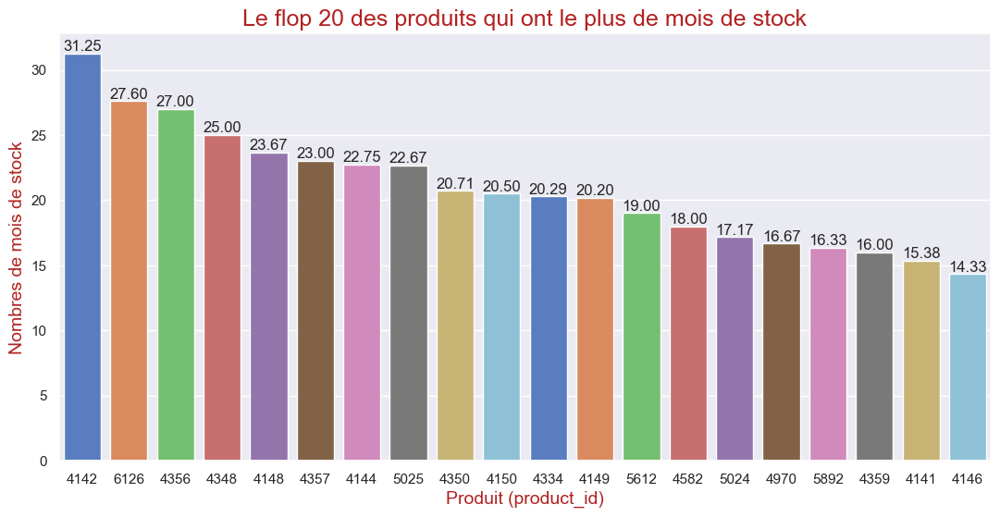

In [594]:
plt.figure(figsize=(13,6))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_mois_stock , 
                 x='product_id',
                 y = 'mois_de_stock', 
                 errorbar=None,
                 hue='product_id',
                 legend=False,
                 palette='muted',
                 order=df_top20_article_mois_stock['product_id']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x],fmt='%.2f')

plt.xlabel('Produit (product_id)',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('Nombres de mois de stock', fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le flop 20 des produits qui ont le plus de mois de stock",
          fontdict = {'fontsize' : 18, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

###### **VERSION VERTICALE NOM :**

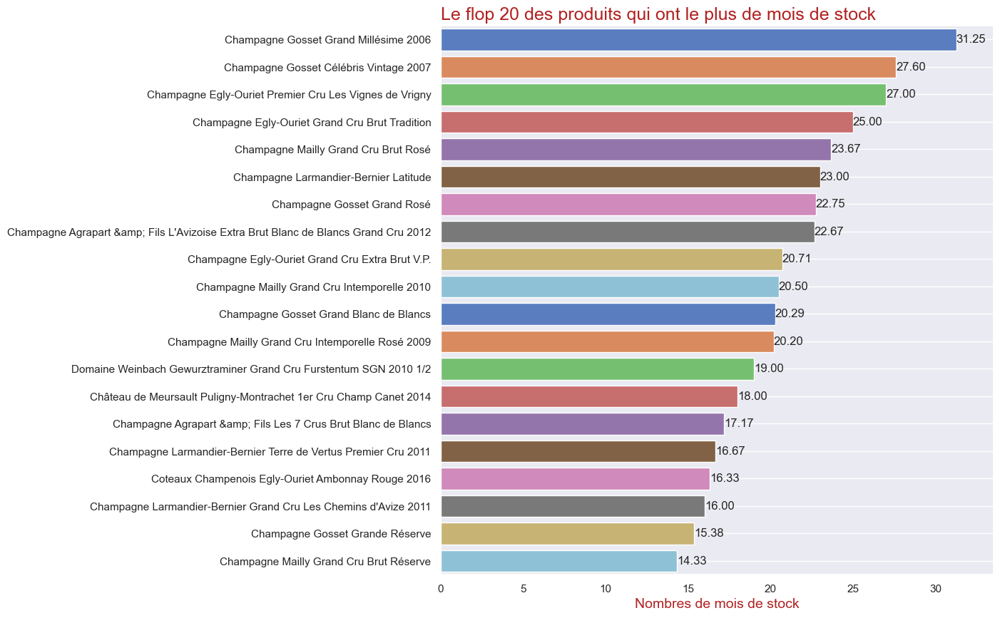

In [595]:
###### **VERSION VERTICALE NOM :**
plt.figure(figsize=(10,10))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_mois_stock , 
                 y='post_title',
                 x = 'mois_de_stock', 
                 errorbar=None,
                 hue='post_title',
                 legend=False,
                 palette='muted',
                 order=df_top20_article_mois_stock['post_title']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x],fmt='%.2f')
plt.xlabel('Nombres de mois de stock',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
plt.xlim(0,33.5)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Le flop 20 des produits qui ont le plus de mois de stock",loc='left',
          fontdict = {'fontsize' : 18, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

In [596]:
df_top20_article_mois_stock['Label']=df_top20_article_mois_stock['post_title']+' - '+df_top20_article_mois_stock['product_type']

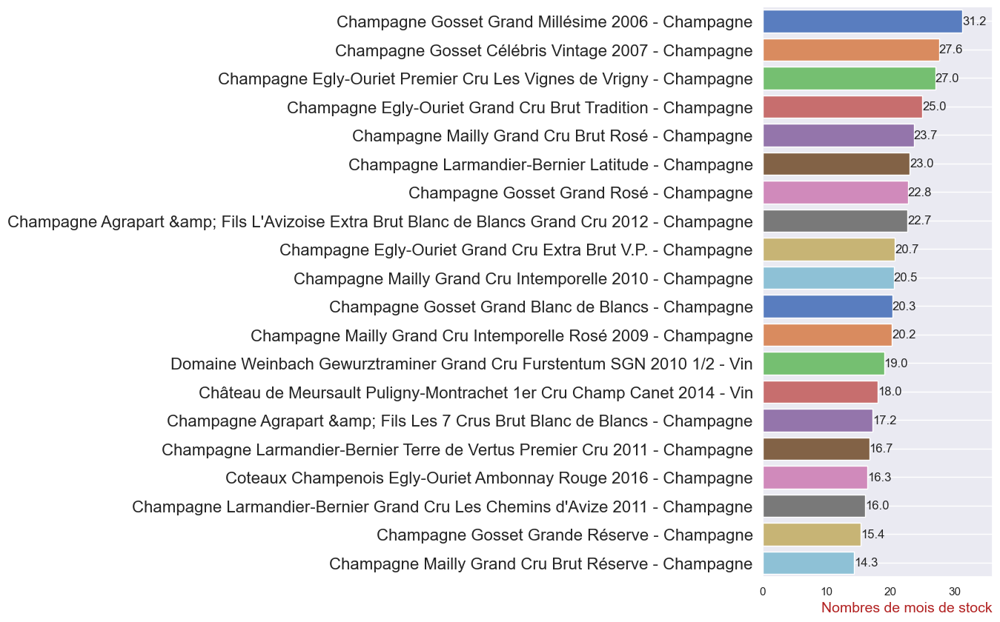

In [597]:
###### **VERSION VERTICALE NOM :**
plt.figure(figsize=(4,10))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top20_article_mois_stock , 
                 y='Label',
                 x = 'mois_de_stock', 
                 errorbar=None,
                 hue='Label',
                 legend=False,
                 palette='muted',
                 order=df_top20_article_mois_stock['Label']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x],fmt='%.1f')
    
plt.yticks(fontsize=16)
plt.xlabel('Nombres de mois de stock',loc='right',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('', fontdict = {'fontsize' : 16,'color':'firebrick'})
plt.grid(axis='y')
plt.xlim(0,36)
#plt.yticks(range(3300,4000,100))
#plt.legend()
#plt.title("Flop 20 des produits avec le plus de mois de stock",loc='left',
#          fontdict = {'fontsize' : 20, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

###### Classement par titre: 

In [598]:
#Classement par titre :
classement_flop20_mois_stock = df_top20_article_mois_stock[['post_title','product_type','mois_de_stock']]

classement_flop20_mois_stock['classement']=1+classement_flop20_mois_stock.index
classement_flop20_mois_stock = classement_flop20_mois_stock[['classement','post_title', 'product_type', 'mois_de_stock']]
classement_flop20_mois_stock_extract = classement_flop20_mois_stock.rename(columns={'post_title':'Nom',
                                                                                 'product_type':'type de produit', 
                                                                                 'mois_de_stock':'Mois de stock'})
classement_flop20_mois_stock_extract

,classement,Nom,type de produit,Mois de stock
0,1,Champagne Gosset Grand Millésime 2006,Champagne,31.250000
1,2,Champagne Gosset Célébris Vintage 2007,Champagne,27.600000
2,3,Champagne Egly-Ouriet Premier Cru Les Vignes d...,Champagne,27.000000
3,4,Champagne Egly-Ouriet Grand Cru Brut Tradition,Champagne,25.000000
4,5,Champagne Mailly Grand Cru Brut Rosé,Champagne,23.666667
5,6,Champagne Larmandier-Bernier Latitude,Champagne,23.000000
6,7,Champagne Gosset Grand Rosé,Champagne,22.750000
7,8,Champagne Agrapart &amp; Fils L'Avizoise Extra...,Champagne,22.666667
8,9,Champagne Egly-Ouriet Grand Cru Extra Brut V.P.,Champagne,20.714286
9,10,Champagne Mailly Grand Cru Intemporelle 2010,Champagne,20.500000


In [599]:
#Extraction si nécessaire :
#classement_flop20_mois_stock_extract.to_excel('classement_flop20_mois_stock_extract.xlsx',index=False)

###### <u>**Complément :**</u>

In [600]:
pd.DataFrame(df_top20_article_mois_stock['product_type'].value_counts())

,count
product_type,
Champagne,18
Vin,2


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.2 Valorisation des stocks en euros</h4></div>

In [601]:
####################################
# Valorisation des stocks en euros #
####################################

#Création de la colonne Valorisation des stocks en euros
#Calculer la somme de la colonne "Valorisation_stock_euros"

<u>**Documentation de la valorisation des stocks :**</u>  
"Le principe d’évaluation des stocks est fixé par l’article 38-3 du CGI qui dispose que les stocks sont évalués à leur prix de revient, ou au cours du jour de la clôture de l’exercice si ce cours est inférieur au prix de revient."  
<u>source :</u>  
https://bofip.impots.gouv.fr/bofip/1497-PGP.html/identifiant%3DBOI-BIC-PDSTK-20-20-10-10-20120912#:~:text=Le%20principe%20d%27%C3%A9valuation%20des,inf%C3%A9rieur%20au%20prix%20de%20revient.

In [602]:
#df_merge_copy_1_6.columns

In [603]:
#colonnes_choix_5

In [604]:
colonnes_choix_5_1 = ['product_id',
                      'price', 'purchase_price',
                      'total_sales',
                      'stock_quantity',
                      'stock_moyen',
                      'rotation_stock_mensuel',
                      'rotation_stock_annuel',
                      'mois_de_stock',
                      'post_title',
                      'product_type']

In [605]:
#df_merge_copy_1_6[colonnes_choix_5_1].head(2)

In [606]:
df_merge_copy_1_6['Valorisation_stock_euros']=df_merge_copy_1_6['stock_quantity']*df_merge_copy_1_6['purchase_price']

In [607]:
#colonnes_choix_5

In [608]:
colonnes_choix_6 = ['product_id','price', 'purchase_price','total_sales','stock_quantity',
                    'Valorisation_stock_euros',
                    'stock_moyen', 'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock', 'post_title', 'product_type']

In [609]:
#df_merge_copy_1_6[colonnes_choix_6].head(2)

In [610]:
total_Valorisation_stock_euros = df_merge_copy_1_6['Valorisation_stock_euros'].sum()
print("Le total de la valeur des stocks de boisson est de : ", round(total_Valorisation_stock_euros,2) ," euros TTC.",
     "sur la base de la valeur d'achat")

Le total de la valeur des stocks de boisson est de :  277022.17  euros TTC. sur la base de la valeur d'achat


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.3 Nombre de produit en stock</h4></div>

In [611]:
##############################################
# Valorisation du nombre de produit en stock #
##############################################

#Calculer la somme de la colonne stock quantity

In [612]:
total_stock_quantity = df_merge_copy_1_6['stock_quantity'].sum()
print("Le total du nombre de bouteilles en stock est de : ", round(total_stock_quantity,0) )

Le total du nombre de bouteilles en stock est de :  16717


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.4 Analyse complémentaire des stocks</h4></div>

##### **<u>vision Globale :</u>**

In [613]:
#df_merge_copy_1_6.columns

In [614]:
df_merge_copy_1_6[['stock_quantity',
                   'stock_moyen','rotation_stock_mensuel',
                   'rotation_stock_annuel','mois_de_stock','Valorisation_stock_euros']].describe()

,stock_quantity,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,Valorisation_stock_euros
count,713.000000,713.000000,691.000000,691.000000,691.000000,713.000000
mean,23.446003,27.474053,0.412269,4.947230,2.967793,388.530393
std,22.234835,23.224199,0.321165,3.853978,3.468489,994.281576
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000,11.500000,0.278129,3.337553,1.750000,138.320000
50%,20.000000,24.500000,0.344828,4.137931,2.400000,202.020000
75%,30.000000,36.000000,0.444444,5.333333,3.083333,285.200000
max,145.000000,148.500000,2.000000,24.000000,31.250000,11373.880000


**Inconvénient :** Les inf ne permettent pas d'avoir des moyennes globales de tout

##### <u>**Une autre façon d'avoir une vision globale :**</u>

In [615]:
#df_merge_copy_1_6.columns

In [616]:
df_merge_copy_1_6_vision_global

,stock_quantity,total_sales,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock
0,16717.0,5744.0,19589.0,0.293226,3.518709,2.910341


In [617]:
round(df_merge_copy_1_6_vision_global,2)

,stock_quantity,total_sales,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock
0,16717.0,5744.0,19589.0,0.29,3.52,2.91


In [618]:
df_merge_copy_1_6_vision_global.columns

Index(['stock_quantity', 'total_sales', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock'],
      dtype='object')

In [619]:
#total_Valorisation_stock_euros

In [620]:
#df_merge_copy_1_6['Valorisation_stock_euros'].sum()

In [621]:
df_merge_copy_1_6_vision_global['Valorisation_stock_euros']=df_merge_copy_1_6['Valorisation_stock_euros'].sum()

In [622]:
round(df_merge_copy_1_6_vision_global,2)

,stock_quantity,total_sales,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,Valorisation_stock_euros
0,16717.0,5744.0,19589.0,0.29,3.52,2.91,277022.17


##### Nbre de stock

In [623]:
df_graph_stock_par_produit = df_merge_copy_1_6[['product_type','stock_quantity']].groupby(by='product_type').sum()
df_graph_stock_par_produit.sort_values(by="stock_quantity",inplace=True,ascending=False)
df_graph_stock_par_produit

,stock_quantity
product_type,
Vin,13470
Champagne,2894
Huile d'olive,158
Cognac,99
Whisky,85
Gin,11


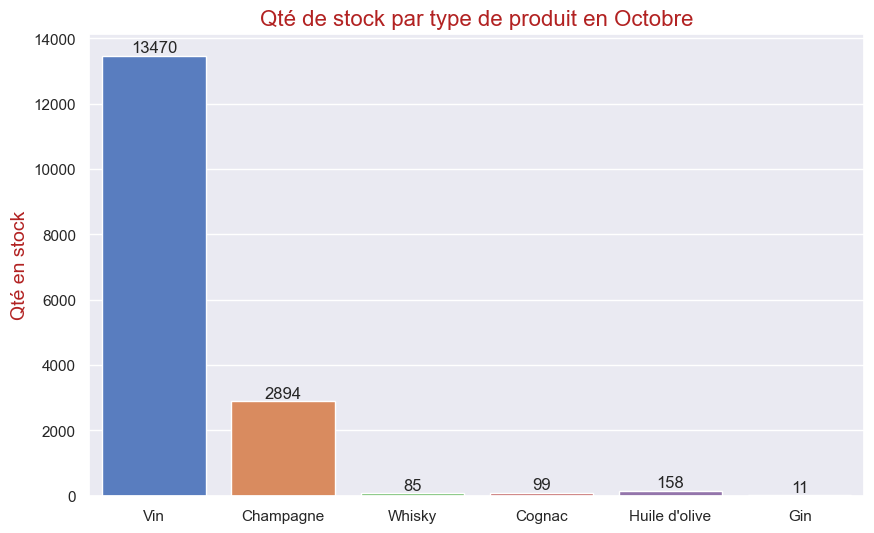

In [624]:
plt.figure(figsize=(10,6))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

ax=sns.barplot(data= df_merge_copy_1_6 ,
               x='product_type' ,
               y='stock_quantity',
               estimator ='sum',
               errorbar=None,
               hue='product_type',
               order=Ordre_produit,
               palette=palette_fixe
              )

# now simply assign the bar values to
# each bar by passing containers method
# to bar_label function
for x in range(0,6) :
    ax.bar_label( ax.containers[x])

plt.xlabel("")
plt.ylabel('Qté en stock',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
#plt.ylim(0,250)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.22,1.02))
plt.title("Qté de stock par type de produit en Octobre",fontdict={'fontsize' : 16, 'color':'firebrick'})


plt.show()

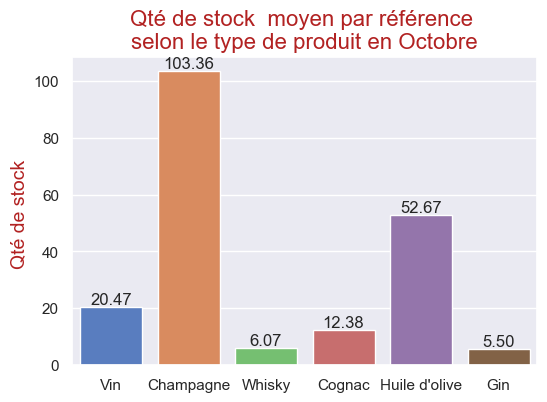

In [625]:
plt.figure(figsize=(6,4))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

ax=sns.barplot(data= df_merge_copy_1_6 ,
               x='product_type' ,
               y='stock_quantity',
               estimator ='mean',
               errorbar=None,
               hue='product_type',
               order=Ordre_produit,
               palette=palette_fixe
              )


for x in range(0,6) :
    ax.bar_label( ax.containers[x],fmt='%.2f')#fmt='%.2f' permet de tronquer 2 chiffres après la virgule.

plt.xlabel("")
plt.ylabel('Qté de stock ',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
#plt.ylim(0,250)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.22,1.02))
plt.title("Qté de stock  moyen par référence \nselon le type de produit en Octobre",fontdict={'fontsize' : 16, 'color':'firebrick'})


plt.show()

##### <font color='red'><u>**OBSERVATION**<u></font>  
Le champagne cela peut s'expliquer par l'approche des fêtes.

In [626]:
#AU GLOBAL :
print("La Qté de stock moyen par reference en Octobre est de : ",
      round(df_merge_copy_1_6['stock_quantity'].mean(),2), " bouteilles.")
print("La Qté de stock médiane par reference en Octobre est de : ",
      round(df_merge_copy_1_6['stock_quantity'].median(),2), " bouteilles.")

La Qté de stock moyen par reference en Octobre est de :  23.45  bouteilles.
La Qté de stock médiane par reference en Octobre est de :  20.0  bouteilles.


##### Valorisation de stock

In [627]:
df_graph_Valor_stock_par_produit = df_merge_copy_1_6[['product_type','Valorisation_stock_euros']].groupby(by='product_type').sum()
df_graph_Valor_stock_par_produit.sort_values(by="Valorisation_stock_euros",inplace=True,ascending=False)
df_graph_Valor_stock_par_produit

,Valorisation_stock_euros
product_type,
Vin,146020.51
Champagne,121639.98
Cognac,4461.84
Whisky,2767.36
Huile d'olive,1943.72
Gin,188.76


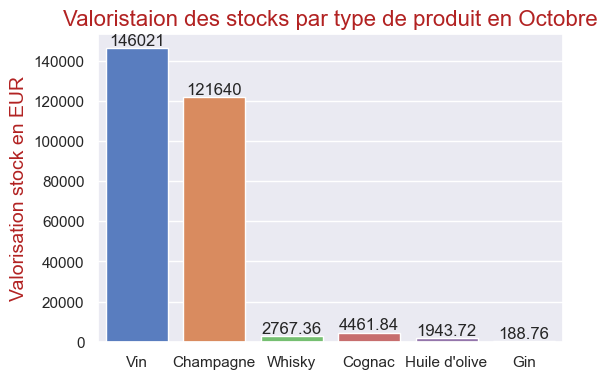

In [628]:
plt.figure(figsize=(6,4))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

ax=sns.barplot(data= df_merge_copy_1_6 ,
               x='product_type' ,
               y='Valorisation_stock_euros',
               estimator ='sum',
               errorbar=None,
               hue='product_type',
               order=Ordre_produit,
               palette=palette_fixe
              )

# now simply assign the bar values to
# each bar by passing containers method
# to bar_label function
for x in range(0,6) :
    ax.bar_label( ax.containers[x])

plt.xlabel("")
plt.ylabel('Valorisation stock en EUR',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
#plt.ylim(0,250)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.22,1.02))
plt.title("Valoristaion des stocks par type de produit en Octobre",fontdict={'fontsize' : 16, 'color':'firebrick'})


plt.show()

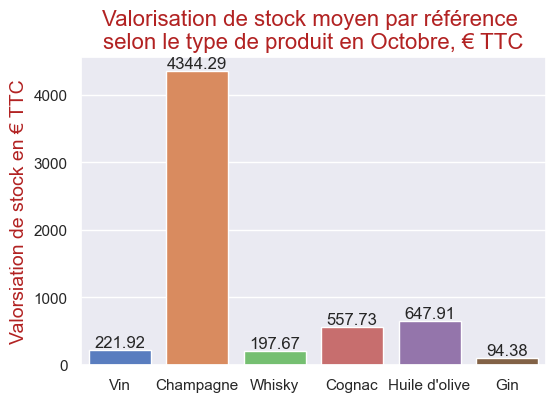

In [629]:
plt.figure(figsize=(6,4))
#plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

ax=sns.barplot(data= df_merge_copy_1_6 ,
               x='product_type' ,
               y='Valorisation_stock_euros',
               estimator ='mean',
               errorbar=None,
               hue='product_type',
               order=Ordre_produit,
               palette=palette_fixe
              )


for x in range(0,6) :
    ax.bar_label( ax.containers[x],fmt='%.2f')#fmt='%.2f' permet de tronquer 2 chiffres après la virgule.

plt.xlabel("")
plt.ylabel('Valorsiation de stock en € TTC',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.grid(axis='y')
#plt.ylim(0,250)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.22,1.02))
plt.title("Valorisation de stock moyen par référence \nselon le type de produit en Octobre, € TTC",fontdict={'fontsize' : 16, 'color':'firebrick'})


plt.show()

In [630]:
#AU GLOBAL :
print("La Valeur de stock moyen par référence en Octobre est de : ",
      round(df_merge_copy_1_6['Valorisation_stock_euros'].mean(),2), " euros.")
print("La Valeur de stock médian par référence en Octobre est de : ",
      round(df_merge_copy_1_6['Valorisation_stock_euros'].median(),2), " euros.")

La Valeur de stock moyen par référence en Octobre est de :  388.53  euros.
La Valeur de stock médian par référence en Octobre est de :  202.02  euros.


##### **Construisons un DataFrame avec les données en pourcentage**

In [631]:
df_merge_copy_1_6.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock',
       'Valorisation_stock_euros'],
      dtype='object')

In [632]:
data_graph_agg_par_prod_2

,Nbr_references,Total_stock,Total_vente,Part_references,Part_stock,Part_ventes,CA_par_produit,Part_CA_par_produit
product_type,,,,,,,,
Vin,658,13470,5456,92.286115,80.576658,94.986072,123518.0,86.072202
Champagne,28,2894,169,3.927069,17.311719,2.942201,12928.6,9.009157
Whisky,14,85,48,1.963534,0.508464,0.835655,2886.6,2.011496
Cognac,8,99,35,1.122020,0.592212,0.609331,3170.2,2.209120
Huile d'olive,3,158,22,0.420757,0.945146,0.383008,497.7,0.346817
Gin,2,11,14,0.280505,0.065801,0.243733,504.0,0.351207


In [633]:
#liste_col = ['product_type','stock_moyen','rotation_stock_mensuel','mois_de_stock','Valorisation_stock_euros']
liste_col=['product_type','Valorisation_stock_euros']
data_graph_agg_par_prod_temp3 = df_merge_copy_1_6[liste_col].groupby(by='product_type'
                                                                     ).agg({'Valorisation_stock_euros':'sum'})
data_graph_agg_par_prod_temp3

,Valorisation_stock_euros
product_type,
Champagne,121639.98
Cognac,4461.84
Gin,188.76
Huile d'olive,1943.72
Vin,146020.51
Whisky,2767.36


In [634]:
Ordre_produit

['Vin', 'Champagne', 'Whisky', 'Cognac', "Huile d'olive", 'Gin']

In [635]:
#Test
#permet de remettre dans l'ordre habituel, mais j'ai perdu le nom 'product_type' de l'index
#pd.DataFrame(data_graph_agg_par_prod_temp3,index =Ordre_produit)

In [636]:
data_graph_agg_par_prod_3 = pd.merge(left=data_graph_agg_par_prod_2,
                                     right=data_graph_agg_par_prod_temp3,
                                     on='product_type',
                                     how='inner')
data_graph_agg_par_prod_3

,Nbr_references,Total_stock,Total_vente,Part_references,Part_stock,Part_ventes,CA_par_produit,Part_CA_par_produit,Valorisation_stock_euros
product_type,,,,,,,,,
Vin,658,13470,5456,92.286115,80.576658,94.986072,123518.0,86.072202,146020.51
Champagne,28,2894,169,3.927069,17.311719,2.942201,12928.6,9.009157,121639.98
Whisky,14,85,48,1.963534,0.508464,0.835655,2886.6,2.011496,2767.36
Cognac,8,99,35,1.122020,0.592212,0.609331,3170.2,2.209120,4461.84
Huile d'olive,3,158,22,0.420757,0.945146,0.383008,497.7,0.346817,1943.72
Gin,2,11,14,0.280505,0.065801,0.243733,504.0,0.351207,188.76


In [637]:
data_graph_agg_par_prod_3['Part_Valorisation_stock_euros']=((data_graph_agg_par_prod_3['Valorisation_stock_euros']*100)/
                                                            data_graph_agg_par_prod_3['Valorisation_stock_euros'].sum())
data_graph_agg_par_prod_3

,Nbr_references,Total_stock,Total_vente,Part_references,Part_stock,Part_ventes,CA_par_produit,Part_CA_par_produit,Valorisation_stock_euros,Part_Valorisation_stock_euros
product_type,,,,,,,,,,
Vin,658,13470,5456,92.286115,80.576658,94.986072,123518.0,86.072202,146020.51,52.710767
Champagne,28,2894,169,3.927069,17.311719,2.942201,12928.6,9.009157,121639.98,43.909836
Whisky,14,85,48,1.963534,0.508464,0.835655,2886.6,2.011496,2767.36,0.998967
Cognac,8,99,35,1.122020,0.592212,0.609331,3170.2,2.209120,4461.84,1.610644
Huile d'olive,3,158,22,0.420757,0.945146,0.383008,497.7,0.346817,1943.72,0.701648
Gin,2,11,14,0.280505,0.065801,0.243733,504.0,0.351207,188.76,0.068139


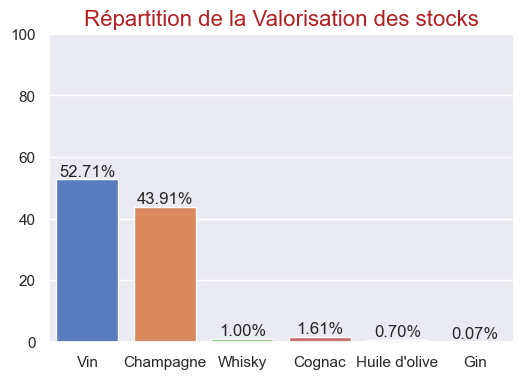

In [638]:
plt.figure(figsize=(6,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
ax = sns.barplot(data=data_graph_agg_par_prod_3,
                 x='product_type',
                 y='Part_Valorisation_stock_euros',
                 hue='product_type',
                 errorbar=None,
                 #estimator='count',
                 order =Ordre_produit,
                 palette=palette_fixe
           )

for x in range(0,6) :
    ax.bar_label(ax.containers[x],fmt='%.2f%%')

plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('')
plt.ylim(0,100)
#plt.ylabel('Part de la valorisation',fontdict={'fontsize' : 14, 'color':'firebrick'})
#plt.legend()
plt.title("Répartition de la Valorisation des stocks",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show() 

In [639]:
pd.DataFrame(data_graph_agg_par_prod_3['Valorisation_stock_euros']).rename(columns={'Valorisation_stock_euros':'Val_stock_eur'})

,Val_stock_eur
product_type,
Vin,146020.51
Champagne,121639.98
Whisky,2767.36
Cognac,4461.84
Huile d'olive,1943.72
Gin,188.76


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.5 Conservations des modifications :</h4></div>

In [640]:
#Validons ces modification dans df_merge_final_1 
#(ajout des colonnes liées au stock, rotation de stock...
df_merge_final_1 = df_merge_copy_1_6.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.3.6 Complément : Etude de l'impact du Nettoyage sur les stocks :</h4></div>

<u>**Dans df_erp initial :**</u>  

In [641]:
df_erp.head(3)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
0,3847,1,24.2,16,instock,12.88
1,3849,1,34.3,10,instock,17.54
2,3850,1,20.8,0,outofstock,10.64


In [642]:
#pour rappel :
#stock total dans ERP INITIAL
Total_stock_quantite_ERP_INITIAL = df_erp['stock_quantity'].sum()
#print("le stock total dans ERP INITIAL est de ",
#      Total_stock_quantite_ERP_INITIAL , "divers articles, incluant : bon cadeau, stock négatifs,article indéterminés.")

In [643]:
df_erp_etude_csqc_Nettoyage =df_erp.copy(deep=True)

In [644]:
df_erp_etude_csqc_Nettoyage['Val_Stock_achat_TTC']=(df_erp_etude_csqc_Nettoyage['stock_quantity']*
                                                    df_erp_etude_csqc_Nettoyage['purchase_price'])
#df_erp_etude_csqc_Nettoyage.head(3)

In [645]:
#Valorisation du stock total dans ERP INITIAL
Total_Val_Stock_achat_TTC_ERP_INITIAL = df_erp_etude_csqc_Nettoyage['Val_Stock_achat_TTC'].sum()
#print("La Valorisation du stock total dans ERP INITIAL ",
#      Total_Val_Stock_achat_TTC_ERP_INITIAL , 
#      " euros de divers articles, incluant : bon cadeau, stock négatifs,article indéterminés.")

In [646]:
print("Dans ERP INITIAL (incluant : bon cadeau, stock négatifs,articles indéterminés), \nle stock total est de :",
      "\nQuantité : ", Total_stock_quantite_ERP_INITIAL, "divers articles",
      "\nValeur (achat) : ", Total_Val_Stock_achat_TTC_ERP_INITIAL, " € TTC")

Dans ERP INITIAL (incluant : bon cadeau, stock négatifs,articles indéterminés), 
le stock total est de : 
Quantité :  17811 divers articles 
Valeur (achat) :  298555.76  € TTC


<u>**Dans le nettoyage de df_erp :**</u>  
**Nous avions modifiés les lignes suivantes** 

In [647]:
df_erp.loc[Index_pb_stock_status,:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
4,4039,1,46.0,3,outofstock,23.77
398,4885,1,18.7,0,instock,9.66
449,4973,0,10.0,-10,outofstock,4.96
573,5700,1,44.5,-1,outofstock,22.30


Nous avions corrigés les product_id 4973 et 5700 , en remettant les stocks à zéros.  
ce qui représenait : 11/17811x100 **0,06% du total des stocks de df erp**  
ce qui représenait : 11/16717x100 **0,06% du total des stocks de boissons**  

In [648]:
(11/17811)*100

0.06175958677221942

**Nous avions retiré la ligne qui correspond au bon cadeau :**
Celle_ci ne doit pas être prise en compte dans un calcul de stock total.  
Doit-elle l'êter dans un calcul de valorisation de stock ?  
Il ne semble pas que l'on puiss non plus l'intégré dans une valorisation de stock.  
On créerait artificiellement une valorisation de stock.  
**=> Pas d'impact, les bons cadeaux ne semblent pas devoir figurer dans les stocks ou valorisations de stocks**

In [649]:
#LE 'bon-cadeau-25-euros' dans df_erp_Nettoye :
df_erp.loc[df_erp['product_id'].isin(product_id_bon_cadeau_25_eur),:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
443,4954,1,25.0,23,instock,13.3


**Lors des jointures :**  
- lors de la première jointure nous n'avons perdu aucune ligen donc aucune valeur de stock_quantity.
- lors de la seconde jointure nous avions perdu 111 lignes sur 824 ce qui est important.

In [650]:
df_lignes_perdues_jointure_2 = df_merge_OUTER_1_OUTER_2.loc[df_merge_OUTER_1_OUTER_2['_merge']=='left_only',:]
df_lignes_perdues_jointure_2

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
81,4741,0,12.4,0,outofstock,6.66,12601,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
127,5957,0,39.0,0,outofstock,20.75,13577,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
139,4289,0,22.8,0,outofstock,11.90,13771,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
180,4869,0,17.2,0,outofstock,9.33,14360,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
185,5955,0,27.3,0,outofstock,13.68,14377,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
819,7196,0,31.0,55,instock,31.20,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
820,7200,0,31.0,6,instock,15.54,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
821,7201,0,31.0,18,instock,16.02,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
822,7203,0,45.0,30,instock,23.48,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only


Cela représente un nombre non négligeable de lignes.  
Cependant nous ne savons pas de quel type de produit il s'agit :  
est-ce que ce sont des bons cadeaux, d'autres types de produits que des boissons ?
Est-ce que ce sont des bouteilles invendues, des bouteilles recepetionnées mais non encore vendues sur le site ?  
Est-ce un mélange de ces types de produits ?

En l'absence d'information sur le type de produit, il semble judicieux de ne pas les avoir intégré à notre analyse, afin de ne pas la fausser. 
Nosu pouvons cependant évaluer le volume que cela représente :

In [651]:
total_stock_quantity_non_determine = df_lignes_perdues_jointure_2['stock_quantity'].sum()
total_stock_quantity_non_determine

1082

In [652]:
Valorisation_stock_non_determine = (df_lignes_perdues_jointure_2['stock_quantity']
                                    *df_lignes_perdues_jointure_2['purchase_price']).sum()
Valorisation_stock_non_determine = round(Valorisation_stock_non_determine,2)
Valorisation_stock_non_determine

21299.59

In [653]:
#Rappel des valeurs pour les boissons étudiées:
#total_stock_quantity
#total_Valorisation_stock_euros

In [654]:
print("Le total de produit non determiné en stock est de : ",
      total_stock_quantity_non_determine , "unités.",
      "\n Ce qui represente ", 
      round((total_stock_quantity_non_determine*100)/
            (total_stock_quantity_non_determine+total_stock_quantity),2),
      "% du total cumulé (boisson+indeterminé).")
print("pour rappel, le total des stocks de boissons est de : ",
      total_stock_quantity, 'unités.')
print("\nle cumul (boisson+indeterminé) en stock est de : ",
      total_stock_quantity_non_determine+total_stock_quantity , "unités.")

Le total de produit non determiné en stock est de :  1082 unités. 
 Ce qui represente  6.08 % du total cumulé (boisson+indeterminé).
pour rappel, le total des stocks de boissons est de :  16717 unités.

le cumul (boisson+indeterminé) en stock est de :  17799 unités.


In [655]:
print("Le total de produit non determiné en Valorisation de stock est de : ",
      Valorisation_stock_non_determine , "euros.",
      "\n Ce qui represente ", 
      round((Valorisation_stock_non_determine*100)/
            (Valorisation_stock_non_determine+total_Valorisation_stock_euros),2),
      "% du total cumulé (boisson+indeterminé).")
print("pour rappel, le total des valorisations de stocks de boissons est de : ",
      total_Valorisation_stock_euros, 'euros.')
print("\nle cumul (boisson+indeterminé) en Valorisation de stock est de : ",
      Valorisation_stock_non_determine+total_Valorisation_stock_euros , "euros.")

Le total de produit non determiné en Valorisation de stock est de :  21299.59 euros. 
 Ce qui represente  7.14 % du total cumulé (boisson+indeterminé).
pour rappel, le total des valorisations de stocks de boissons est de :  277022.17 euros.

le cumul (boisson+indeterminé) en Valorisation de stock est de :  298321.76 euros.


##### <u>**=>Poids des 111 produits indeterminés n'apparaissant pas dans df_web :**</u>  
Le total de produit non determiné en stock est de :  1082 unités.  
Ce qui represente  **6.08 % du total cumulé (boisson+indeterminé).**  
pour rappel, le total des stocks de boissons est de :  16717 unités.  

le cumul (boisson+indeterminé) en stock est de :  17799 unités.


Le total de produit non determiné en Valorisation de stock est de :  21299.59 euros.   
 Ce qui represente  **7.14 % du total cumulé (boisson+indeterminé).**  
pour rappel, le total des valorisations de stocks de boissons est de :  277022.17 euros.  

le cumul (boisson+indeterminé) en Valorisation de stock est de :  298321.76 euros.  

**Ici le poids n'est pas négligeable**

##### <font color='red'><u>**SUGGESTION :**</u></font>   
Il serait important que ces marchandises puissent être identifiées pour savoir si elles doivent rentrer dans l'étude ou non.

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 5.4 - Analyse du taux de marge</h3>
</div>

In [656]:
#Travaillons sur une copie :
df_merge_copy_1_7 = df_merge_final_1.copy(deep=True)

In [657]:
df_merge_copy_1_7.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock',
       'Valorisation_stock_euros'],
      dtype='object')

In [658]:
df_merge_copy_1_7.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,...,CA_par_article,part_CA_pct,part_CA_pct_cumul,part_total_sales,part_total_sales_cumul,stock_moyen,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,Valorisation_stock_euros
0,4142,1,53.0,125,instock,32.15,11641,product,Champagne Gosset Grand Millésime 2006,Champagne,...,212.0,0.148,56.354,0.070,95.973,127.0,0.031496,0.377953,31.25,4018.75
1,6126,1,135.0,138,instock,80.33,14923,product,Champagne Gosset Célébris Vintage 2007,Champagne,...,675.0,0.470,6.450,0.087,91.923,140.5,0.035587,0.427046,27.60,11085.54


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.4.1 - Documentation - Calcul du taux de marge :</h4></div> 

**source :**  
https://irce.fr/faq_gestion_commerciale/single-faq/calculer-taux-de-marge?gad_source=1&gclid=Cj0KCQiA-aK8BhCDARIsAL_-H9l2trn6khpc-4f3403XanD1MMr-BnUf_Ly3TxYVdm0DFcsUobv8XXUaAmfzEALw_wcB  

<u>Calcul de la marge « commerciale » :</u>  
**Marge commerciale = Chiffre d’affaires HT – Coût d’achat HT**  
(Marge commerciale = Marge commerciale par article x Nbre de ventes  
dans notre cas nous travaillerons en marge commerciale par article, sans impact pour le calcul du Taux de marge.  
afin de pouvoir comparer les articles entre eux sans influence du volume de vente )  

<u>Le taux de marge se calcule par rapport au coût d’achat</u>  
**Taux de marge = (Marge commerciale HT ÷ Coût d’achat HT) x 100**  
(compte tenu du rapport le Taux de marge par article et le Taux de marge par article sont égaux)

<u>Calculer son taux de   MARQUE</u>  
Attention : le terme taux de marge est souvent utilisé abusivement pour le calcul correspondant au taux de marque.  
Le taux de MARQUE (et non de marge) se calcule par rapport au prix de  vente.    
*Taux de marque = (Marge commerciale HT ÷ Prix de vente HT) x 100*

HT = Hors_Taxe

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.4.2 - Analyse du taux de marge :</h4></div>

##### <font color='green'><u>***1 Création des colonnes TVA, price_HT et purchase_price_HT :***</u></font>

<u>**Documentation-Taux de TVA applicable :**</u>  
https://entreprendre.service-public.fr/vosdroits/F22399#:~:text=Sans%20alcool-,Alcoolis%C3%A9es,herm%C3%A9tiquement%20ou%20%C3%A0%20consommer%20imm%C3%A9diatement.

Il existe 3 taux de TVA pour les produits de l'alimentation :  
- **5,5 % sur un produit conditionné dans un contenant permettant sa conservation, donc pour une consommation qui peut être différée. Le contenant doit être hermétique, avec une date limite de conservation.**  
- 10 % sur un produit vendu pour une consommation immédiate  
- **20 % : seulement sur les boissons alcoolisées, quel que soit le type de consommation, immédiate ou différée.**  

In [659]:
#Les types de produits vendus par BottleNeck:
df_merge_copy_1_7['product_type'].unique()

array(['Champagne', 'Vin', "Huile d'olive", 'Cognac', 'Whisky', 'Gin'],
      dtype=object)

##### <u>**Ici la TVA ne sera pas la même pour tous les produits :**</u>
- boissons alcoolisées : ['Champagne', 'Vin', 'Cognac', 'Whisky', 'Gin'] => TVA =0.2
- boisson non alcoolisée : [ "Huile d'olive"] => TVA=0.055

In [660]:
#Créons une colonne TVA :
df_merge_copy_1_7['TVA']=0.0
liste_boissons_alcool = ['Champagne', 'Vin', 'Cognac', 'Whisky', 'Gin']
liste_boissons_non_alcool =  [ "Huile d'olive"] 
df_merge_copy_1_7.loc[df_merge_copy_1_7['product_type'].isin(liste_boissons_alcool),'TVA']=0.2
df_merge_copy_1_7.loc[df_merge_copy_1_7['product_type'].isin(liste_boissons_non_alcool),'TVA']=0.055

In [661]:
df_merge_copy_1_7[['product_type','TVA']].value_counts()

product_type   TVA  
Vin            0.200    658
Champagne      0.200     28
Whisky         0.200     14
Cognac         0.200      8
Huile d'olive  0.055      3
Gin            0.200      2
Name: count, dtype: int64

In [662]:
#Création des price_HT et purchase_price_HT  :
df_merge_copy_1_7['price_HT']= round(df_merge_copy_1_7['price']/(1.0+df_merge_copy_1_7['TVA']),2)
df_merge_copy_1_7['purchase_price_HT']= round(df_merge_copy_1_7['purchase_price']/(1.0+df_merge_copy_1_7['TVA']),2)

In [663]:
colonnes_choix_6

['product_id',
 'price',
 'purchase_price',
 'total_sales',
 'stock_quantity',
 'Valorisation_stock_euros',
 'stock_moyen',
 'rotation_stock_mensuel',
 'rotation_stock_annuel',
 'mois_de_stock',
 'post_title',
 'product_type']

In [664]:
colonnes_choix_7_1 = ['product_id',
                      'product_type',
                      'TVA',
                      'price',
                      'price_HT',
                      'purchase_price',
                      'purchase_price_HT',
                      'post_title']

In [665]:
df_merge_copy_1_7[colonnes_choix_7_1].head(2)

,product_id,product_type,TVA,price,price_HT,purchase_price,purchase_price_HT,post_title
0,4142,Champagne,0.2,53.0,44.17,32.15,26.79,Champagne Gosset Grand Millésime 2006
1,6126,Champagne,0.2,135.0,112.50,80.33,66.94,Champagne Gosset Célébris Vintage 2007


##### <font color='green'><u>***2 Création des colonnes marge_HT et taux_marge :***</u></font>

In [666]:
df_merge_copy_1_7['marge_HT']=(df_merge_copy_1_7['price_HT']-df_merge_copy_1_7['purchase_price_HT'])
df_merge_copy_1_7['taux_marge']=(df_merge_copy_1_7['price_HT']-df_merge_copy_1_7['purchase_price_HT'])/(df_merge_copy_1_7['purchase_price_HT'])

In [667]:
colonnes_choix_7_2 = ['product_id',
                      'product_type',
                      'TVA',
                      'price',
                      'price_HT',
                      'purchase_price',
                      'purchase_price_HT',
                      'marge_HT',
                      'taux_marge',
                      'post_title']

In [668]:
df_merge_copy_1_7[colonnes_choix_7_2].head(2)

,product_id,product_type,TVA,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,post_title
0,4142,Champagne,0.2,53.0,44.17,32.15,26.79,17.38,0.64875,Champagne Gosset Grand Millésime 2006
1,6126,Champagne,0.2,135.0,112.50,80.33,66.94,45.56,0.68061,Champagne Gosset Célébris Vintage 2007


In [669]:
df_merge_copy_1_7[colonnes_choix_7_2].describe()

,product_id,TVA,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge
count,713.000000,713.000000,713.000000,713.000000,713.000000,713.000000,713.000000,713.000000
mean,5032.667602,0.199390,32.343969,26.965372,16.909060,14.098569,12.866802,0.932254
std,791.060331,0.009392,27.614335,23.012372,14.837177,12.366255,11.270840,0.115558
min,3847.000000,0.055000,5.200000,4.330000,2.740000,2.280000,-54.030000,-0.836766
25%,4280.000000,0.200000,14.050000,11.750000,7.240000,6.030000,5.730000,0.878613
50%,4795.000000,0.200000,23.400000,19.500000,12.280000,10.280000,9.380000,0.935208
75%,5711.000000,0.200000,42.100000,35.080000,22.030000,18.360000,16.820000,0.995671
max,7338.000000,0.200000,225.000000,187.500000,137.810000,114.840000,83.860000,1.296977


##### <font color='green'><u>***3 Afficher le prix minimum et maximum de la colonne "taux_marge" :***</u></font>

In [670]:
taux_marge_min = df_merge_copy_1_7['taux_marge'].describe()['min']
taux_marge_max = df_merge_copy_1_7['taux_marge'].describe()['max']
print("Le taux de marge minimum est de : ", round(taux_marge_min,2) , " euros.")
print("Le taux de marge maximum est de : ", round(taux_marge_max,2) , " euros.")

Le taux de marge minimum est de :  -0.84  euros.
Le taux de marge maximum est de :  1.3  euros.


##### <font color='green'><u>***4 affichage de la ligne avec un taux de marge inférieur à 0 :***</u></font>

In [671]:
#affichage de la ligne avec un taux de marge inférieur à 0
df_merge_copy_1_7.loc[df_merge_copy_1_7['taux_marge']<0,colonnes_choix_7_2]

,product_id,product_type,TVA,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,post_title
688,4355,Champagne,0.2,12.65,10.54,77.48,64.57,-54.03,-0.836766,Champagne Egly-Ouriet Grand Cru Blanc de Noirs


##### <font color='green'><u>***4bis Analyse de la ligne avec un taux de marge inférieur à 0 :***</u></font>

In [672]:
df_merge_copy_1_7['ratio_P_PP']=df_merge_copy_1_7['price']/df_merge_copy_1_7['purchase_price']

In [673]:
df_merge_copy_1_7['ratio_P_PP'].describe()

count    713.000000
mean       1.932278
std        0.115567
min        0.163268
25%        1.878941
50%        1.935257
75%        1.995523
max        2.296950
Name: ratio_P_PP, dtype: float64

In [674]:
#colonnes_choix_7_2

In [675]:
colonnes_choix_7_2_ratio =colonnes_choix_7_2.copy()
colonnes_choix_7_2_ratio.append('ratio_P_PP')
#colonnes_choix_7_2_ratio

In [676]:
#colonnes_choix_7_2

In [677]:
df_merge_copy_1_7.loc[df_merge_copy_1_7['product_id']==4355,colonnes_choix_7_2_ratio]

,product_id,product_type,TVA,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,post_title,ratio_P_PP
688,4355,Champagne,0.2,12.65,10.54,77.48,64.57,-54.03,-0.836766,Champagne Egly-Ouriet Grand Cru Blanc de Noirs,0.163268


In [678]:
colonnes_choix_7_2_ratio_bis =['product_id',
 'product_type',
 'TVA',
 'price',
 'price_HT',
 'purchase_price',
 'purchase_price_HT',
 'marge_HT',
 'taux_marge',
 'ratio_P_PP']

In [679]:
df_merge_copy_1_7.loc[df_merge_copy_1_7['product_id']==4355,colonnes_choix_7_2_ratio_bis]

,product_id,product_type,TVA,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,ratio_P_PP
688,4355,Champagne,0.2,12.65,10.54,77.48,64.57,-54.03,-0.836766,0.163268


In [680]:
#Etude du ratio Prix/Purchase_P et du Taux de marge pour le Champagne :
#Masque Champagne hors product_id==4355 (car probablement erronné)
mask = (df_merge_copy_1_7['product_type']=='Champagne')&(~(df_merge_copy_1_7['product_id']==4355))
df_merge_copy_1_7.loc[mask,['ratio_P_PP', 'taux_marge']].describe()

,ratio_P_PP,taux_marge
count,27.000000,27.000000
mean,1.679455,0.679451
std,0.049577,0.049594
min,1.568785,0.568533
25%,1.640543,0.640690
50%,1.680568,0.680109
75%,1.714090,0.714289
max,1.785714,0.785714


##### ISOLONS la ligne du product_id 4355 dans le dataframe df_id4355_corrige et recalculons certaines données avec un price TTC à 126,5 euros:

In [681]:
df_id4355_corrige = (df_merge_copy_1_7.loc[df_merge_copy_1_7['product_id']==4355,:] ).copy()
df_id4355_corrige[colonnes_choix_7_2_ratio]

,product_id,product_type,TVA,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,post_title,ratio_P_PP
688,4355,Champagne,0.2,12.65,10.54,77.48,64.57,-54.03,-0.836766,Champagne Egly-Ouriet Grand Cru Blanc de Noirs,0.163268


In [682]:
df_id4355_corrige.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock',
       'Valorisation_stock_euros', 'TVA', 'price_HT', 'purchase_price_HT',
       'marge_HT', 'taux_marge', 'ratio_P_PP'],
      dtype='object')

In [683]:
mask_id4355 = df_id4355_corrige['product_id']==4355
df_id4355_corrige.loc[mask_id4355,'price']=126.5
df_id4355_corrige.loc[mask_id4355,'price_HT']=round(df_id4355_corrige.loc[mask_id4355,'price']/(df_id4355_corrige.loc[mask_id4355,'TVA']+1),2)
df_id4355_corrige.loc[mask_id4355,'marge_HT']=df_id4355_corrige.loc[mask_id4355,'price_HT']-df_id4355_corrige.loc[mask_id4355,'purchase_price_HT']
df_id4355_corrige.loc[mask_id4355,'taux_marge']=df_id4355_corrige.loc[mask_id4355,'marge_HT']/df_id4355_corrige.loc[mask_id4355,'purchase_price_HT']
df_id4355_corrige.loc[mask_id4355,'ratio_P_PP'] = df_id4355_corrige.loc[mask_id4355,'price']/df_id4355_corrige.loc[mask_id4355,'purchase_price']
df_id4355_corrige.loc[mask_id4355,'CA_par_article']=df_id4355_corrige.loc[mask_id4355,'price']*df_id4355_corrige.loc[mask_id4355,'total_sales']
df_id4355_corrige.loc[mask_id4355,'Valorisation_stock_euros']=(df_id4355_corrige.loc[mask_id4355,'stock_quantity']
                                                               *df_id4355_corrige.loc[mask_id4355,'purchase_price'])


In [684]:
colonnes_choix_7_2_ratio_corr_id4355 = ['product_id',
                                        'product_type',
                                        'price',
                                        'price_HT',
                                        'purchase_price',
                                        'purchase_price_HT',
                                        'marge_HT',
                                        'taux_marge',
                                        'ratio_P_PP',
                                       'total_sales','CA_par_article','Valorisation_stock_euros']

In [685]:
df_id4355_corrige[colonnes_choix_7_2_ratio_corr_id4355]

,product_id,product_type,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,ratio_P_PP,total_sales,CA_par_article,Valorisation_stock_euros
688,4355,Champagne,126.5,105.42,77.48,64.57,40.85,0.632647,1.632679,0.0,0.0,7515.56


In [686]:
mask_id4355 = df_id4355_corrige['product_id']==4355
print('''Pour le product_id 4355, avec un prix TTC de vente corrigé à 126,5 euros,\n le ratio Prix/Purchase_P est de : ''' , 
      round((df_id4355_corrige.loc[mask_id4355,'ratio_P_PP']).sum(),2))

print('''Pour le product_id 4355, avec un prix TTC de vente corrigé à 126,5 euros,\n le taux de marge est de est de : ''' , 
      round((df_id4355_corrige.loc[mask_id4355,'taux_marge']).sum(),2))

Pour le product_id 4355, avec un prix TTC de vente corrigé à 126,5 euros,
 le ratio Prix/Purchase_P est de :  1.63
Pour le product_id 4355, avec un prix TTC de vente corrigé à 126,5 euros,
 le taux de marge est de est de :  0.63


In [687]:
#RAPPEL :
#Etude du ratio Prix/Purchase_P et du Taux de marge pour le Champagne :
#Masque Champagne hors product_id==4355 (car probablement erronné)
mask = (df_merge_copy_1_7['product_type']=='Champagne')&(~(df_merge_copy_1_7['product_id']==4355))
df_merge_copy_1_7.loc[mask,['taux_marge','ratio_P_PP']].describe()

,taux_marge,ratio_P_PP
count,27.000000,27.000000
mean,0.679451,1.679455
std,0.049594,0.049577
min,0.568533,1.568785
25%,0.640690,1.640543
50%,0.680109,1.680568
75%,0.714289,1.714090
max,0.785714,1.785714


In [688]:
#RAPPEL :
#Etude du ratio Prix/Purchase_P et du Taux de marge pour le Champagne :
#Masque Champagne hors product_id==4355 (car probablement erronné)
mask = (df_merge_copy_1_7['product_type']=='Champagne')&(~(df_merge_copy_1_7['product_id']==4355))
(df_merge_copy_1_7.loc[mask,['ratio_P_PP', 'taux_marge']]).mean()

ratio_P_PP    1.679455
taux_marge    0.679451
dtype: float64

In [689]:
#RAPPEL :
#Etude du ratio Prix/Purchase_P et du Taux de marge pour le Champagne :
#Masque Champagne hors product_id==4355 (car probablement erronné)
mask = (df_merge_copy_1_7['product_type']=='Champagne')&(~(df_merge_copy_1_7['product_id']==4355))
pd.DataFrame((df_merge_copy_1_7.loc[mask,['ratio_P_PP', 'taux_marge']].describe()).loc['mean',:]).T

,ratio_P_PP,taux_marge
mean,1.679455,0.679451


In [690]:
#RAPPEL :
#Etude du ratio Prix/Purchase_P et du Taux de marge pour le Champagne :
#Masque Champagne hors product_id==4355 (car probablement erronné)
mask = (df_merge_copy_1_7['product_type']=='Champagne')&(~(df_merge_copy_1_7['product_id']==4355))
df_merge_copy_1_7.loc[mask,['product_type','taux_marge','ratio_P_PP']].groupby(by='product_type').agg('mean')

,taux_marge,ratio_P_PP
product_type,,
Champagne,0.679451,1.679455


###### **ESSAI**

In [691]:
#POur un prix de vente de 126.5 TTC:
price_id4355_corrige = 10 * (df_merge_copy_1_7.loc[df_merge_copy_1_7['product_id']==4355,'price'].sum())
purchase_price_id4355_corrige =(df_merge_copy_1_7.loc[df_merge_copy_1_7['product_id']==4355,'purchase_price']).sum()

ratio_P_PP_id4355_corrige = (price_id4355_corrige/purchase_price_id4355_corrige)

print('''Pour le product_id 4355, avec un prix TTC de vente corrigé à 126,5 euros,\n le ratio Prix/Purchase_P est de : ''' , 
      round(ratio_P_PP_id4355_corrige,2))

Pour le product_id 4355, avec un prix TTC de vente corrigé à 126,5 euros,
 le ratio Prix/Purchase_P est de :  1.63


###### **FIN ESSAI**

##### <font color='red'><u>**RECOMMANDATIONS :**</u></font>  
Vérifier que les données pour le product_id **4355** ne sont pas erronées.  
Voir si il y a une justification à une marge négative : opération ponctuelle (solde, foire aux vins etc...).  
Corriger les données (notamment le prix de vente ) si nécessaire.  

##### <u>**ANALYSE et CHOIX (PEDAGOGIQUE) de NETTOYAGE :**</u>

###### <u>**ANALYSE du product_id 4355 :**</u>  

Un **rabais de 83% sur le prix d'achat parait surdimensionné** même pour une solde. ((77,48-12,65)*100/77,48)  
D'autant plus que Octobre n'est **pas une période de solde**, ce qui implique que sauf exception les ventes à perte ne sont pas permises.

**Une erreur, notamment une erreur de virgule semble plus probable :**  
En effet **cela ramènerait** le **prix de vente** de 12,65 à **126,5 euros**  
et donc **à un ratio Prix/Purchase_P** de (126,5/77,48) de **1,63** ;  
tout à fait **dans les ratios standard pour le Champagne**, au niveaud du Q1, mais sans être ni le minimum, ni un outlier.

Et concernant le taux de marge :
cela ramènerait **à un taux de marge** de : (105,4-64,57)/64,57 = **0,63**  
de même **dans les marges standard pour le Champagne**, au niveaud du Q1, mais sans être ni le minimum, ni un outlier.

###### <u>**=>NETTOYAGE DE DONNEES : SUPPRESSION DE LIGNE OU CORRECTION DU PRIX**</u>

1.Nous pourrions supprimer cette ligne qui est manifestement erronnée, en tout cas qui nécessite vérification.  
2.Nous pourrions apporter une correction :  
- soit en remplaçant le prix par le prix moyen de vente du Champagne... cependant il faudrait également prendre en compte le prix d'achat et donc se restreindre à des Champagnes avec un prix d'achat similaire.
- soit l'erreur étant ici, a priori intelligible (erreur courante de décalage de la virgule), et cette correction permettant de revenir à un prix dans les standards de ce type de produit, nous pouvons effectuer la correction de cette erreur.

**C'est donc ce dernier choix que je souhaiterais appliquer :  
CORRECTION pour le product_id 4355 :  
prix de vente = 126,5 euros (au lieu de 12,65)  
prix de vente HT=105,4 (au lieu de 10,54)**

**Cependant pour des raisons pédagogiques (voire ci dessous) :  
je fais le choix de la SUPPRESSION DE LIGNE**

###### **PM :CHOIX PEDAGOGIQUE DE SUPPRESSON DE LIGNE PLUTOT QUE CORRECTION**  

Le problème ici c'est que l'on a déjà calculé le CA, les valorisations de stock....  
Apporter un correctif de prix maintenant alors que l'on a déjà calculé le CA, la valorisation de stock....  
Ca nécessiterait de refaire ces calculs.  
**En effet les corrections sont à faire avant analyse des données.**  
D'ailleurs j'avais déjà identifié dans l'analyse des prix initial ces marges négatives, 
et c'est à ce moment qu'un correctif aurait pu petre apporté.  

Si on a vu l'erreur seulement au moment de l'analyse,  
L'avantage c'est qu'ici après jonction, on peut apporter une correction sur la base des analyses des autres produits similaires (Champagne ici, info présente dans l'autre fichier).
**Cette correction doit être faite sur le fichier df_erp_Nettoye avant jonction, ou dans le df_merge juste après jonction.**  
Et ensuite on doit relancer tous les calculs qui tiendront compte de la correction :  CA, valorisation de stock, taux de marge...  
**Cependant alors le taux de marge négatif ne serait plus visible.**  

**Dans un but pédagogique, afin de pouvoir souligner ce Taux de marge négatif, 
nous ne prenons pas l'option de corriger ce prix,  
Mais plutôt celle de supprimer la ligne pour la suite des observations.**

##### <font color='orange'><u>**=>NETTOYAGE DE DONNEES (CHOIX PEDAGOGIQUE): SUPPRESSION DE LIGNE**</u></font>  
**Nous gardons uniquement les lignes avec Taux positifs,   
ce qui va de facto supprimer la ligne product_id 4355 qui est la seule avec un taux de marge négatif**

##### <font color='green'><u>***5 création d'un dataframe avec les taux positifs : df_merge_copy_1_7_taux_marge_positif***</u></font>

##### **OPTION 1- CORRECTION DE LIGNES (NON CHOISIE)**

In [692]:
#df_merge_copy_1_7_taux_marge_positif.loc[df_merge_copy_1_7_taux_marge_positif['product_id']==4355,:]

In [693]:
#AUTRE POSSIBILITE AVEC CORRECTIF :
#df_merge_copy_1_7_taux_marge_positif = df_merge_copy_1_7.copy(deep=True)
#df_merge_copy_1_7_taux_marge_positif.loc[df_merge_copy_1_7_taux_marge_positif['product_id']==4355,'price'] =126.5
#df_merge_copy_1_7_taux_marge_positif.loc[df_merge_copy_1_7_taux_marge_positif['product_id']==4355,'price_HT'] =105.42

#ATTENTION EN FAISANT LA CORRECTION ICI, il faudrait également relancer le calcul de toutes les colonnes d'analyses :
#'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
#       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
#       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock',
#       'Valorisation_stock_euros', 'TVA', 'price_HT', 'purchase_price_HT',
#       'marge_HT', 'taux_marge', 'ratio_P_PP'

#C'est pour cela que la correction si elle se fait,
#doit se faire sur le fichier avant jonction (ou au plus tard juste après jonction et relancer tous les calculs)
#au lieu de tout refaire une autre fois à chaque ligne corrigées.

In [694]:
#df_merge_copy_1_7_taux_marge_positif.loc[df_merge_copy_1_7_taux_marge_positif['product_id']==4355,:]

##### **OPTION 2: SUPPRESSION DE LIGNES (CHOISIE)**

In [695]:
len(df_merge_copy_1_7)

713

In [696]:
len(df_merge_copy_1_7.loc[df_merge_copy_1_7['taux_marge']<0,colonnes_choix_7_2])

1

In [697]:
#création d'un dataframe avec les taux positifs
df_merge_copy_1_7_taux_marge_positif = df_merge_copy_1_7.loc[df_merge_copy_1_7['taux_marge']>=0,:]

In [698]:
len(df_merge_copy_1_7_taux_marge_positif)

712

In [699]:
df_merge_copy_1_7_taux_marge_positif.loc[df_merge_copy_1_7_taux_marge_positif['product_id']==4355,colonnes_choix_7_2]

,product_id,product_type,TVA,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,post_title


In [700]:
df_merge_copy_1_7_taux_marge_positif[colonnes_choix_7_2].describe()

,product_id,TVA,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge
count,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000
mean,5033.619382,0.199389,32.371629,26.988441,16.823989,14.027683,12.960758,0.934739
std,791.207797,0.009399,27.623862,23.020298,14.672562,12.229126,10.995793,0.094682
min,3847.000000,0.055000,5.200000,4.330000,2.740000,2.280000,2.050000,0.554443
25%,4279.250000,0.200000,14.087500,11.750000,7.235000,6.027500,5.797500,0.878613
50%,4796.000000,0.200000,23.450000,19.540000,12.280000,10.255000,9.380000,0.935260
75%,5711.250000,0.200000,42.125000,35.102500,22.030000,18.360000,16.832500,0.995672
max,7338.000000,0.200000,225.000000,187.500000,137.810000,114.840000,83.860000,1.296977


In [701]:
round(pd.DataFrame(df_merge_copy_1_7_taux_marge_positif['taux_marge'].describe()),2)

,taux_marge
count,712.00
mean,0.93
std,0.09
min,0.55
25%,0.88
50%,0.94
75%,1.00
max,1.30


##### <font color='green'><u>***6 Afficher le prix minimum et maximum de la colonne "taux_marge" pour df_merge_copy_1_7_taux_marge_positif:***</u></font>

In [702]:
taux_marge_min_taux_pos = df_merge_copy_1_7_taux_marge_positif['taux_marge'].describe()['min']
taux_marge_max_taux_pos = df_merge_copy_1_7_taux_marge_positif['taux_marge'].describe()['max']
print("Le taux de marge minimum pour df_merge_copy_1_7_taux_marge_positif est de : ", round(taux_marge_min_taux_pos,2) , " euros.")
print("Le taux de marge maximum pour df_merge_copy_1_7_taux_marge_positif est de : ", round(taux_marge_max_taux_pos,2) , " euros.")

Le taux de marge minimum pour df_merge_copy_1_7_taux_marge_positif est de :  0.55  euros.
Le taux de marge maximum pour df_merge_copy_1_7_taux_marge_positif est de :  1.3  euros.


##### <font color='green'><u>***7 création d'un dataframe avec le taux de marge moyen par type de produit :***</u></font>

In [703]:
df_merge_copy_1_7_taux_marge_positif[['product_type','taux_marge']].groupby(by='product_type').mean()

,taux_marge
product_type,
Champagne,0.679451
Cognac,1.187695
Gin,1.097902
Huile d'olive,0.600827
Vin,0.937926
Whisky,1.181000


###### **ANALYSE INTERESSANTE :**

In [704]:
data_stats_taux_par_prod = df_merge_copy_1_7_taux_marge_positif[['product_type','taux_marge']].groupby(by='product_type').agg({'taux_marge':['min','max','mean']})
data_stats_taux_par_prod

taux_marge                    
                     min       max      mean
product_type                                
Champagne       0.568533  0.785714  0.679451
Cognac          1.077620  1.296296  1.187695
Gin             1.097902  1.097902  1.097902
Huile d'olive   0.554443  0.632653  0.600827
Vin             0.840532  1.041379  0.937926
Whisky          1.078191  1.296977  1.181000

In [705]:
#data_stats_taux_par_prod.loc['Champagne',[('taux_marge','min')]]

In [706]:
data_stats_taux_global = df_merge_copy_1_7_taux_marge_positif[['taux_marge']].agg({'taux_marge':['min','max','mean']})
data_stats_taux_global

,taux_marge
min,0.554443
max,1.296977
mean,0.934739


###### **AUTRES ANALYSES INTERESSANTES :**

In [707]:
colonnes_choix_7_2

['product_id',
 'product_type',
 'TVA',
 'price',
 'price_HT',
 'purchase_price',
 'purchase_price_HT',
 'marge_HT',
 'taux_marge',
 'post_title']

In [708]:
colonnes_choix_7_3 = ['product_type',
                      'purchase_price_HT',
                      'price_HT',
                      'taux_marge'
                      ]

In [709]:
#help(df_merge_copy_1_7_taux_marge_positif[colonnes_choix_7_3].groupby)

In [710]:
df_merge_copy_1_7_taux_marge_positif[colonnes_choix_7_3].groupby(by='product_type').mean()

,purchase_price_HT,price_HT,taux_marge
product_type,,,
Champagne,35.775556,59.780741,0.679451
Cognac,36.907500,81.251250,1.187695
Gin,14.300000,30.000000,1.097902
Huile d'olive,14.643333,23.633333,0.600827
Vin,12.621155,24.401109,0.937926
Whisky,24.947143,54.632143,1.181000


In [711]:
df_merge_copy_1_7_taux_marge_positif[['product_type','price_HT','taux_marge']].groupby(by='product_type').agg({'price_HT':['min','max','mean'],
                                                                                                               'taux_marge':['min','max','mean']
                                                                                                               })

price_HT                    taux_marge                    
                   min     max       mean        min       max      mean
product_type                                                            
Champagne        18.75  187.50  59.780741   0.568533  0.785714  0.679451
Cognac           36.67  146.67  81.251250   1.077620  1.296296  1.187695
Gin              30.00   30.00  30.000000   1.097902  1.097902  1.097902
Huile d'olive    12.42   40.00  23.633333   0.554443  0.632653  0.600827
Vin               4.33  181.25  24.401109   0.840532  1.041379  0.937926
Whisky           22.92  101.67  54.632143   1.078191  1.296977  1.181000

In [712]:
liste_col = ['product_type','price_HT','marge_HT','taux_marge']
df_merge_copy_1_7_taux_marge_positif[liste_col].groupby(by='product_type').agg({'price_HT':['min','max','mean'],
                                                                                'marge_HT':['min','max','mean'],
                                                                                'taux_marge':['min','max','mean']
                                                                                })

price_HT                    marge_HT                    \
                   min     max       mean      min    max       mean   
product_type                                                           
Champagne        18.75  187.50  59.780741     7.27  72.66  24.005185   
Cognac           36.67  146.67  81.251250    19.02  81.46  44.343750   
Gin              30.00   30.00  30.000000    15.70  15.70  15.700000   
Huile d'olive    12.42   40.00  23.633333     4.43  15.50   8.990000   
Vin               4.33  181.25  24.401109     2.05  83.86  11.779954   
Whisky           22.92  101.67  54.632143    12.00  56.47  29.685000   

              taux_marge                      
                     min       max      mean  
product_type                                  
Champagne       0.568533  0.785714  0.679451  
Cognac          1.077620  1.296296  1.187695  
Gin             1.097902  1.097902  1.097902  
Huile d'olive   0.554443  0.632653  0.600827  
Vin             0.840532  1.041379  0.937926  
Whisky          1.078191  1.296977  1.181000

###### **FIN AUTRES ANALYSES INTERESSANTES :**

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.4.3 - Visualisation graphique du taux de marge :</h4></div>

##### <font color='green'><u>***1 Affichage dans un graphique du taux de marge moyen par type de produit***</u></font>

In [713]:
df_graph_marge_par_produit = df_merge_copy_1_7_taux_marge_positif[['product_type','taux_marge']].groupby(by='product_type').mean()
df_graph_marge_par_produit

,taux_marge
product_type,
Champagne,0.679451
Cognac,1.187695
Gin,1.097902
Huile d'olive,0.600827
Vin,0.937926
Whisky,1.181000


###### **AUTRE GRAPH:**

In [714]:
df_graph_marge_par_produit_2 = df_graph_marge_par_produit.reset_index()
df_graph_marge_par_produit_2

,product_type,taux_marge
0,Champagne,0.679451
1,Cognac,1.187695
2,Gin,1.097902
3,Huile d'olive,0.600827
4,Vin,0.937926
5,Whisky,1.181000


In [715]:
fig = px.bar(df_graph_marge_par_produit_2,
                   x= 'product_type' ,
                   y= 'taux_marge' ,
                   title = 'taux de marge moyen par type de produit en EUR',
                   labels={'product_type':'Type de produit',
                           'taux_marge': 'taux de marge en EUR'},
                   width=1000,
                   height=600,
                   color='product_type',
                   color_discrete_sequence=px.colors.qualitative.G10,
                   opacity=0.75
           
                  )
fig.show()

###### **FIN-AUTRE GRAPH:**

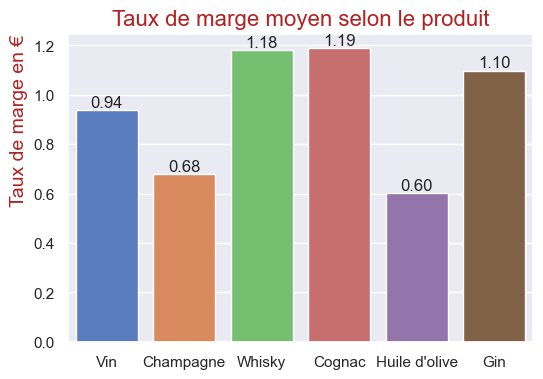

In [716]:
plt.figure(figsize=(6,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')

ax=sns.barplot(data= df_merge_copy_1_7_taux_marge_positif ,
               x='product_type' ,
               y='taux_marge',
               estimator ='mean',
               errorbar=None,
               hue='product_type',
               order=Ordre_produit,
               palette=palette_fixe
              )


for x in range(0,6) :
    ax.bar_label( ax.containers[x],fmt='%.2f')#fmt='%.2f' permet de tronquer 2 chiffres après la virgule.

plt.xlabel("")
plt.ylabel('Taux de marge en €',fontdict = {'fontsize' : 14,'color':'firebrick'},loc='top')
plt.grid(axis='y')
#plt.ylim(0,250)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.22,1.02))
plt.title("Taux de marge moyen selon le produit",fontdict={'fontsize' : 16, 'color':'firebrick'})


plt.show()

##### <u>**Complément :**</u>

In [717]:
#AU GLOBAL :
nbr_reference = df_merge_copy_1_5['product_id'].count()
print("Le Taux de marge moyen de ventes par référence en Octobre est de : ",
      round(df_merge_copy_1_7_taux_marge_positif['taux_marge'].mean(),2))
print("La Taux de marge médian de ventes par référence en Octobre est de : ",
      round(df_merge_copy_1_7_taux_marge_positif['taux_marge'].median(),2))

Le Taux de marge moyen de ventes par référence en Octobre est de :  0.93
La Taux de marge médian de ventes par référence en Octobre est de :  0.94


In [718]:
Ordre_produit

['Vin', 'Champagne', 'Whisky', 'Cognac', "Huile d'olive", 'Gin']

In [719]:
palette_fixe

{'Vin': (0.2823529411764706, 0.47058823529411764, 0.8156862745098039),
 'Champagne': (0.9333333333333333, 0.5215686274509804, 0.2901960784313726),
 'Whisky': (0.41568627450980394, 0.8, 0.39215686274509803),
 'Cognac': (0.8392156862745098, 0.37254901960784315, 0.37254901960784315),
 "Huile d'olive": (0.5843137254901961, 0.4235294117647059, 0.7058823529411765),
 'Gin': (0.5490196078431373, 0.3803921568627451, 0.23529411764705882)}

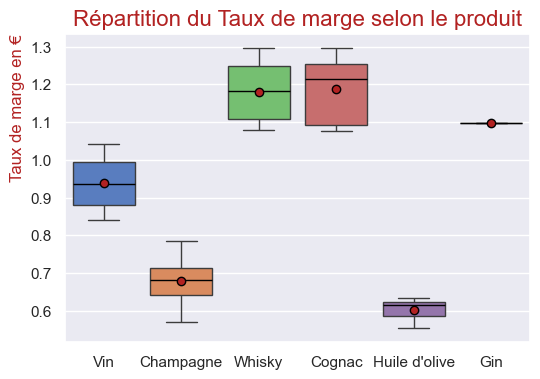

In [720]:
plt.figure(figsize=(6,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_merge_copy_1_7_taux_marge_positif,
            x='product_type',
            y='taux_marge',
            hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            order=Ordre_produit,
            palette=palette_fixe
           )
#plt.xlim(0,240)
plt.grid(axis='y')
#plt.xticks(range(0,250,25))
plt.xlabel('',fontdict={'fontsize' : 12, 'color':'firebrick'},loc='right')
plt.ylabel('Taux de marge en €',fontdict={'fontsize' : 12, 'color':'firebrick'},loc='top')
#plt.legend(title=None)
#plt.legend(title='Type de produit')
plt.title("Répartition du Taux de marge selon le produit",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

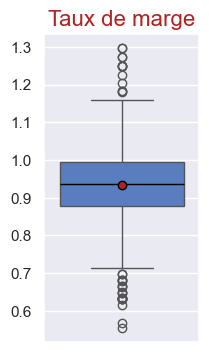

In [721]:
plt.figure(figsize=(2,4))
plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})

sns.set_theme(style='dark', palette='muted')
sns.boxplot(data=df_merge_copy_1_7_taux_marge_positif,
            y='taux_marge',
            #"hue='product_type',
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},
            #caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #hue_order=Ordre_produit
           )
#plt.xlim(0,250)
plt.grid(axis='y')
plt.xlabel('')
plt.ylabel('',fontdict={'fontsize' : 12, 'color':'firebrick'},loc='top')
#plt.legend()
plt.title("Taux de marge",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.4.4 Analyses Complémentaires : Top/Flop Taux de Marge</h4></div>

In [722]:
df_merge_copy_1_7_taux_marge_positif.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock',
       'Valorisation_stock_euros', 'TVA', 'price_HT', 'purchase_price_HT',
       'marge_HT', 'taux_marge', 'ratio_P_PP'],
      dtype='object')

In [723]:
df_top10_flop10_taux_marge = df_merge_copy_1_7_taux_marge_positif[['product_type',
                                                                   'post_title',
                                                                   'taux_marge']].sort_values(by='taux_marge',ascending=False)
df_top10_flop10_taux_marge.head(3)

,product_type,post_title,taux_marge
647,Whisky,Wemyss Malts Single Cask Scotch Whisky Chocola...,1.296977
530,Cognac,Cognac Frapin VSOP,1.296296
461,Whisky,Kingsbarns Distillery Lowland Single Malt Whisky,1.272727


In [724]:
df_top10_flop10_taux_marge['Label']=df_top10_flop10_taux_marge['post_title']+ ' - '+df_top10_flop10_taux_marge['product_type']
df_top10_flop10_taux_marge.head(3)

,product_type,post_title,taux_marge,Label
647,Whisky,Wemyss Malts Single Cask Scotch Whisky Chocola...,1.296977,Wemyss Malts Single Cask Scotch Whisky Chocola...
530,Cognac,Cognac Frapin VSOP,1.296296,Cognac Frapin VSOP - Cognac
461,Whisky,Kingsbarns Distillery Lowland Single Malt Whisky,1.272727,Kingsbarns Distillery Lowland Single Malt Whis...


In [725]:
df_top10_flop10_taux_marge_TOP10 =df_top10_flop10_taux_marge.head(10)
df_top10_flop10_taux_marge_FLOP10=df_top10_flop10_taux_marge.tail(10)

In [726]:
df_top10_flop10_taux_marge_TOP10

,product_type,post_title,taux_marge,Label
647,Whisky,Wemyss Malts Single Cask Scotch Whisky Chocola...,1.296977,Wemyss Malts Single Cask Scotch Whisky Chocola...
530,Cognac,Cognac Frapin VSOP,1.296296,Cognac Frapin VSOP - Cognac
461,Whisky,Kingsbarns Distillery Lowland Single Malt Whisky,1.272727,Kingsbarns Distillery Lowland Single Malt Whis...
179,Cognac,Cognac Frapin Château de Fontpinot 1989 20 Ans...,1.272538,Cognac Frapin Château de Fontpinot 1989 20 Ans...
34,Whisky,Wemyss Malts Single Cask Scotch Whisky Choc 'n...,1.249336,Wemyss Malts Single Cask Scotch Whisky Choc 'n...
36,Cognac,Cognac Frapin VIP XO,1.249195,Cognac Frapin VIP XO - Cognac
638,Whisky,Wemyss Malts Blended Malt Scotch Whisky Spice ...,1.249182,Wemyss Malts Blended Malt Scotch Whisky Spice ...
589,Whisky,Wemyss Malts Blended Malt Scotch Whisky Peat C...,1.249182,Wemyss Malts Blended Malt Scotch Whisky Peat C...
249,Cognac,Cognac Frapin Cigar Blend,1.226304,Cognac Frapin Cigar Blend - Cognac
689,Cognac,Cognac Normandin Mercier VFC,1.203974,Cognac Normandin Mercier VFC - Cognac


In [727]:
df_top10_flop10_taux_marge_FLOP10

,product_type,post_title,taux_marge,Label
27,Champagne,Champagne Petit Lebrun &amp; Fils Blanc de Bla...,0.633275,Champagne Petit Lebrun &amp; Fils Blanc de Bla...
26,Champagne,Champagne Larmandier-Bernier Grand Cru Vieille...,0.632824,Champagne Larmandier-Bernier Grand Cru Vieille...
668,Champagne,Champagne Egly-Ouriet Grand Cru Millésimé 2008,0.632706,Champagne Egly-Ouriet Grand Cru Millésimé 2008...
513,Huile d'olive,Huile d'Olive Extra Vierge Planeta Selezione C...,0.632653,Huile d'Olive Extra Vierge Planeta Selezione C...
10,Champagne,Champagne Gosset Grand Blanc de Blancs,0.632547,Champagne Gosset Grand Blanc de Blancs - Champ...
7,Champagne,Champagne Agrapart &amp; Fils L'Avizoise Extra...,0.632500,Champagne Agrapart &amp; Fils L'Avizoise Extra...
20,Champagne,Champagne Agrapart &amp; Fils Terroirs Brut Bl...,0.632492,Champagne Agrapart &amp; Fils Terroirs Brut Bl...
21,Huile d'olive,Huiles d'Olive Extra Vierge Planeta 3x 10cl,0.615385,Huiles d'Olive Extra Vierge Planeta 3x 10cl - ...
18,Champagne,Champagne Gosset Grande Réserve,0.568533,Champagne Gosset Grande Réserve - Champagne
59,Huile d'olive,Huile d'Olive Extra Vierge Planeta 50cl,0.554443,Huile d'Olive Extra Vierge Planeta 50cl - Huil...


In [728]:
df_top10_flop10_taux_marge_FINAL = pd.concat( [df_top10_flop10_taux_marge_TOP10 , df_top10_flop10_taux_marge_FLOP10] )

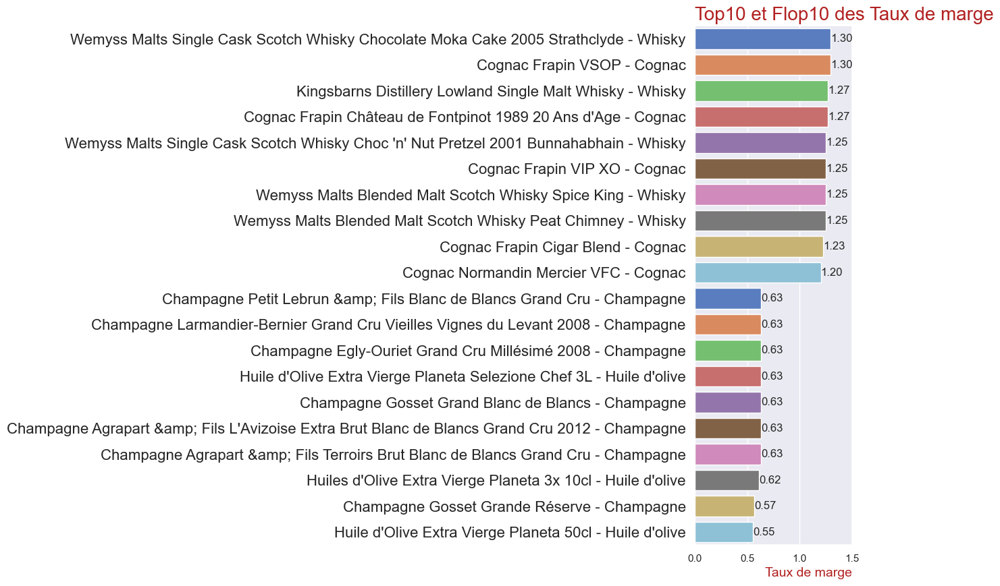

In [729]:
###### **VERSION VERTICALE NOM :**
plt.figure(figsize=(3,10))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_flop10_taux_marge_FINAL , 
                 y='Label',
                 x = 'taux_marge', 
                 errorbar=None,
                 hue='Label',
                 legend=False,
                 palette='muted',
                 order=df_top10_flop10_taux_marge_FINAL['Label']
                )

for x in range(0,20) :
    ax.bar_label(ax.containers[x],fmt='%.2f')
    
plt.yticks(fontsize=16)
plt.xlabel('Taux de marge',loc='right',fontdict = {'fontsize' : 14,'color':'firebrick'})
plt.ylabel('', fontdict = {'fontsize' : 16,'color':'firebrick'})
plt.grid(axis='x')
plt.xlim(0,1.50)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 et Flop10 des Taux de marge",loc='left',fontdict = {'fontsize' : 20, 'color':'firebrick', 'verticalalignment': 'baseline'})
plt.show()

In [730]:
pd.DataFrame(df_top10_flop10_taux_marge_TOP10['product_type'].value_counts())

,count
product_type,
Whisky,5
Cognac,5


In [731]:
pd.DataFrame(df_top10_flop10_taux_marge_FLOP10['product_type'].value_counts())

,count
product_type,
Champagne,7
Huile d'olive,3


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.4.5 Complément : Etude de l'impact du Nettoyage sur les Taux de Marge :</h4></div>

##### <u>**Impact des 111 lignes indeterminérs :**</u>  
Le Taux de Marge étant calculé par article et non comme un cumulé,  
L'impact du retrait des 111 lignes indeterminées est moins grand, mais **pourrait tout de même influencer légèrement les moyennes ( et médianes)**.  
Il est difficile de l'évaluer ne sachant pas quelle TVA appliquer.
On rappelle que La part de ces produits représente entre 6 et 7 % des produits.

##### <u>**Impact de la ligne à Taux de marge négatif :**</u>  
Il s'agit d'une seule ligne sur 700,  
cela avait un **impact fort sur le Taux de marge minimum, mais pas sur la moyenne globale (faiblement sur la moyenne champagne).**

##### **AVEC cet OUTLIER Négatif:**

In [732]:
#affichage de la ligne avec un taux de marge inférieur à 0
df_merge_copy_1_7.loc[df_merge_copy_1_7['taux_marge']<0,colonnes_choix_7_2_ratio_corr_id4355]

,product_id,product_type,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,ratio_P_PP,total_sales,CA_par_article,Valorisation_stock_euros
688,4355,Champagne,12.65,10.54,77.48,64.57,-54.03,-0.836766,0.163268,0.0,0.0,7515.56


In [733]:
taux_marge_min = df_merge_copy_1_7['taux_marge'].describe()['min']
taux_marge_max = df_merge_copy_1_7['taux_marge'].describe()['max']
print("Le taux de marge minimum est de : ", round(taux_marge_min,2) , " euros.")
print("Le taux de marge maximum est de : ", round(taux_marge_max,2) , " euros.")

Le taux de marge minimum est de :  -0.84  euros.
Le taux de marge maximum est de :  1.3  euros.


In [734]:
#AU GLOBAL :
nbr_reference = df_merge_copy_1_7['product_id'].count()
print("Le Taux de marge moyen de ventes par référence en Octobre est de : ",
      round(df_merge_copy_1_7['taux_marge'].mean(),2))
print("La Taux de marge médian de ventes par référence en Octobre est de : ",
      round(df_merge_copy_1_7['taux_marge'].median(),2))

Le Taux de marge moyen de ventes par référence en Octobre est de :  0.93
La Taux de marge médian de ventes par référence en Octobre est de :  0.94


In [735]:
df_merge_copy_1_7[['product_type','taux_marge']].groupby(by='product_type').mean()

,taux_marge
product_type,
Champagne,0.625301
Cognac,1.187695
Gin,1.097902
Huile d'olive,0.600827
Vin,0.937926
Whisky,1.181000


##### **SANS cet OUTLIER Négatif:**

In [736]:
taux_marge_min_taux_pos = df_merge_copy_1_7_taux_marge_positif['taux_marge'].describe()['min']
taux_marge_max_taux_pos = df_merge_copy_1_7_taux_marge_positif['taux_marge'].describe()['max']
print("Le taux de marge minimum pour df_merge_copy_1_7_taux_marge_positif est de : ", round(taux_marge_min_taux_pos,2) , " euros.")
print("Le taux de marge maximum pour df_merge_copy_1_7_taux_marge_positif est de : ", round(taux_marge_max_taux_pos,2) , " euros.")

Le taux de marge minimum pour df_merge_copy_1_7_taux_marge_positif est de :  0.55  euros.
Le taux de marge maximum pour df_merge_copy_1_7_taux_marge_positif est de :  1.3  euros.


**=>Impact fort sur le taux de marge minimum qui passe de -0.84 à +0.55**

In [737]:
#AU GLOBAL :
nbr_reference = df_merge_copy_1_5['product_id'].count()
print("Le Taux de marge moyen de ventes par référence en Octobre est de : ",
      round(df_merge_copy_1_7_taux_marge_positif['taux_marge'].mean(),2))
print("La Taux de marge médian de ventes par référence en Octobre est de : ",
      round(df_merge_copy_1_7_taux_marge_positif['taux_marge'].median(),2))

Le Taux de marge moyen de ventes par référence en Octobre est de :  0.93
La Taux de marge médian de ventes par référence en Octobre est de :  0.94


**=>Impact invisible sur le taux de marge moyen (1 référence sur 713)**

In [738]:
df_merge_copy_1_7_taux_marge_positif[['product_type','taux_marge']].groupby(by='product_type').mean()

,taux_marge
product_type,
Champagne,0.679451
Cognac,1.187695
Gin,1.097902
Huile d'olive,0.600827
Vin,0.937926
Whisky,1.181000


**=>Impact léger sur le Taux de marge moyen du Champagne  (1 référence sur 28)**

**AUTRES IMPACTES**

In [739]:
#affichage de la ligne avec un taux de marge inférieur à 0
df_merge_copy_1_7.loc[df_merge_copy_1_7['taux_marge']<0,colonnes_choix_7_2_ratio_corr_id4355]

,product_id,product_type,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,ratio_P_PP,total_sales,CA_par_article,Valorisation_stock_euros
688,4355,Champagne,12.65,10.54,77.48,64.57,-54.03,-0.836766,0.163268,0.0,0.0,7515.56


In [740]:
df_id4355_corrige[colonnes_choix_7_2_ratio_corr_id4355]

,product_id,product_type,price,price_HT,purchase_price,purchase_price_HT,marge_HT,taux_marge,ratio_P_PP,total_sales,CA_par_article,Valorisation_stock_euros
688,4355,Champagne,126.5,105.42,77.48,64.57,40.85,0.632647,1.632679,0.0,0.0,7515.56


**AUTRES IMPACTS :**
- Répartition des prix de ventes TTC :impact faible sur le global (1 référence sur 713, impact léger sur le champagne 1 ref sur 28)
- Analyse des ventes en valeurs et en quantité : pas d'impact car total_sales=0
- Valorisation de stock : pas d'impact car calculé sur le prix d'achat
- Calcul du nombre de mois stock : pas d'impact.
- Analyse du taux de marge : déjà évalué.


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.4.6 Conservations des modifications :</h4></div>

In [741]:
#Conservons les modifications dans df_merge_copy_1_7_taux_marge_positif :
#ajout de colonnes concernant la marge
# sans conserver retrait d'une ligne product_id =4355 dont la marge est négative
df_merge_final_2_tout_taux = df_merge_copy_1_7.copy(deep=True)

In [742]:
#Conservons les modifications dans df_merge_copy_1_7_taux_marge_positif :
#ajout de colonnes concernant la marge
#retrait d'une ligne producr-id =43.55 dont la marge est négative
df_merge_final_2_taux_marge_positif = df_merge_copy_1_7_taux_marge_positif.copy(deep=True)

In [743]:
#CHOIX A FAIRE GARDER AVEC CORRECTIF suppression de ligne taux négatif ou non :
#df_merge_final_3 = df_merge_final_2_tout_taux.copy(deep=True)

#POur le moment conservons le correctif de suppression de ligne taux négatif :
df_merge_final_3 = df_merge_final_2_taux_marge_positif.copy(deep=True)


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 5.5 - Analyse des correlations entre les variables stock, sales et price</h3>
</div>

In [744]:
#travaillons sur une copie :
df_merge_copy_1_8 = df_merge_final_3.copy(deep=True)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.5.1 - Analyse des correlations :</h4></div>

In [745]:
############################
# Analyse des correlations #
############################

#Importation de Seaborn

#Création d'un heatmap de correlation avec les variables stock, sales et price
#on peut également créer un mask pour n'afficher qu'une demi heatmap

##### **DATAFRAMES**

In [746]:
df_merge_copy_1_8.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock',
       'Valorisation_stock_euros', 'TVA', 'price_HT', 'purchase_price_HT',
       'marge_HT', 'taux_marge', 'ratio_P_PP'],
      dtype='object')

In [747]:
df_merge_copy_1_8['product_id'].dtypes

dtype('int64')

In [748]:
df_merge_copy_1_9 = df_merge_copy_1_8.copy(deep=True)

In [749]:
df_merge_copy_1_9['product_id'] = (df_merge_copy_1_9['product_id']).astype('string')

In [750]:
df_merge_copy_1_9['product_id'].dtypes

string[python]

##### <font color='blue'><u>**Analyse de corrélation : ['stock_quantity', 'total_sales','price','purchase-price','taux_marge','marge_HT']**</u></font>

In [751]:
colonnes_choix_9_3 = ['stock_quantity', 'total_sales','price_HT','purchase_price_HT','taux_marge','marge_HT']

In [752]:
df_correlation_3 = df_merge_copy_1_9[colonnes_choix_9_3]

In [753]:
df_correlation_3.head(2)

,stock_quantity,total_sales,price_HT,purchase_price_HT,taux_marge,marge_HT
0,125,4.0,44.17,26.79,0.64875,17.38
1,138,5.0,112.50,66.94,0.68061,45.56


pd.DataFrame(columns=[col_1,col_B,col_C ]).corr()  
.corr() va donner une matrice de covariance selon les variables 2 à 2.

In [754]:
df_correlation_3.corr(method='pearson')

,stock_quantity,total_sales,price_HT,purchase_price_HT,taux_marge,marge_HT
stock_quantity,1.000000,0.452625,-0.103753,-0.043370,-0.451523,-0.168977
total_sales,0.452625,1.000000,-0.520070,-0.499654,-0.037088,-0.533097
price_HT,-0.103753,-0.520070,1.000000,0.992082,-0.034598,0.990197
purchase_price_HT,-0.043370,-0.499654,0.992082,1.000000,-0.130994,0.964814
taux_marge,-0.451523,-0.037088,-0.034598,-0.130994,1.000000,0.073255
marge_HT,-0.168977,-0.533097,0.990197,0.964814,0.073255,1.000000


In [755]:
mask_semi_heatmap_3 = np.triu(np.ones( (df_correlation_3.corr(method='pearson')).shape  ))

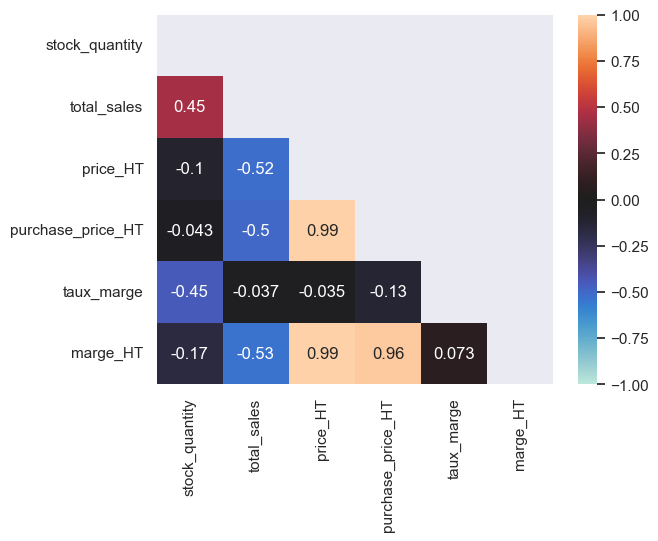

In [756]:
#vmin et vmax indique le champ des possibles c'est donc mieux de le mettre, sinon ils s'appuyent uniquement sur le champ de l'existant.
#.corr(method='pearson') coeff de pearson entre -1 et 1
sns.heatmap(df_correlation_3.corr(method='pearson') ,
            vmin=-1,
            vmax=1,
            center=0.0,
            annot=True,
           mask = mask_semi_heatmap_3
           )
plt.show()

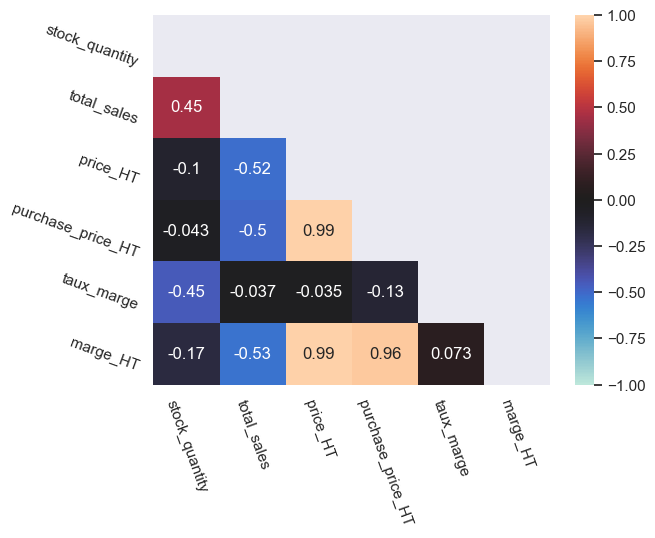

In [757]:
#vmin et vmax indique le champ des possibles c'est donc mieux de le mettre, sinon ils s'appuyent uniquement sur le champ de l'existant.
#.corr(method='pearson') coeff de pearson entre -1 et 1
sns.heatmap(df_correlation_3.corr(method='pearson') ,
            vmin=-1,
            vmax=1,
            center=0.0,
            annot=True,
           mask = mask_semi_heatmap_3
           )
plt.xticks(rotation=-70)
plt.yticks(rotation=-20)
plt.show()

##### <u>***Que peut-on conclure des correlations ?***</u>

##### <font color='red'><u>**OBSERVATIONS :**</u></font>  
3 variables semblent très très corrélées linéairement  : price_HT, purchase_price_HT, et marge_HT.  
Lorsque le prix d'achat est élevé, le prix de vente l'est aussi, et la marge HT aussi (et inversement).
Nous sommes dans une stratégie ou plus le prix d'achat est elevé, plus le prix de vente l'est aussi, et également plus la marge augmente.

On peut noter que les Taux de marges eux ne semblent pas augmenter avec les prix.  
Nous avions pu effectivement constater que les Taux de marges sont assez constants autour de 1 quel que soit le prix (Ratio prix de vente/prix d'achat=2)

A noter que cela n'est pas forcément le cas.  
On pourrait avoir une marge fixe sur tous les prix et faire de grosse marge sur les prix peu chers.  
Inversement on pourrait avoir une grosse marge sur les prix élevés, et multiplier le Taux de marge.

Il y a une légère corrélation linéaire positive pour :  
plus le quantité de stock est elvée, plus les ventes sont fortes.

Il y a une légère corrélation négative pour : 
plus le prix (le prix d'achat, la marg) sont élevés, plus  le nombre de vente est faible.  

Le Taux de marge semble êrte relativement indépendant des autres variables.  
Mais il est légèrement corrélé linéairement négativement avec la quantité en stock.  
QUnad les stocks sont importantes les taux sont plus bas.
Cela correspond peut_être à une volonté de baisser la marge lorsuq'il ya beaucoup de stock à écouler.  
Soit pour liquider des stocks élevés, soit pour utiliser une stratégie de gros volumes sur certaines références (avec faible marge mais sur des volumes importants).  
En tout cas cette stratégie semble marche relativement car le taux de vente est légèrement corrélé positivement avec ces stocks elevés et Taux faible.  
Le taux de marge n'étant pas corrélé aux ventes. IL semble que ce soit plus la politique de baisser la marge sur des stocks elevés qui permet de rattraper les ventes.  
Les stocks sont plus élevés là ou il y a le plus de vente, ce qui témoigne d'une bonne gestion.

In [758]:
df_merge_copy_1_9.columns

Index(['product_id', 'onsale_web', 'price', 'stock_quantity', 'stock_status',
       'purchase_price', 'id_web', 'post_type', 'post_title', 'product_type',
       'total_sales', 'CA_par_article', 'part_CA_pct', 'part_CA_pct_cumul',
       'part_total_sales', 'part_total_sales_cumul', 'stock_moyen',
       'rotation_stock_mensuel', 'rotation_stock_annuel', 'mois_de_stock',
       'Valorisation_stock_euros', 'TVA', 'price_HT', 'purchase_price_HT',
       'marge_HT', 'taux_marge', 'ratio_P_PP'],
      dtype='object')

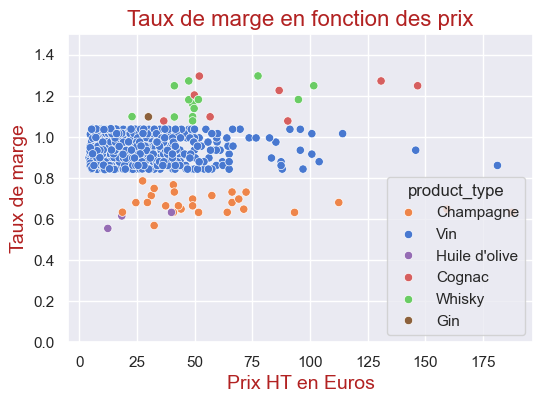

In [759]:

plt.figure(figsize=(6,4))
plt.rcParams.update({'font.size':12})

sns.set_theme(style='dark', palette='muted')

sns.scatterplot(data= df_merge_copy_1_9,x='price_HT',y='taux_marge',hue='product_type',palette=palette_fixe)

plt.ylabel("Taux de marge",fontdict={'fontsize' : 14, 'color':'firebrick'})
plt.xlabel('Prix HT en Euros',fontdict={'fontsize' : 14, 'color':'firebrick'})
plt.grid()
plt.ylim(0,1.5)
#plt.yticks(range(0,251,25))
#plt.legend(bbox_to_anchor=(1.02,1.02))
plt.title("Taux de marge en fonction des prix",fontdict={'fontsize' : 16, 'color':'firebrick'})
plt.show()

Cela confirme :  
Le taux de marge ne dépend pas du prix de vente.  
Il est très centré autour de 1, avec une assez bonne homogénéité selon le type de produit.

(éventuelllement faire un ensemble de boxplot par catégorie)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 5.5.2 Conservations des modifications :</h4></div>

In [760]:
#PAS DE MODIFICATION du fichier bilan dans  df_merge_copy_1_8 
#( ou  df_merge_copy_1_9 changement inutile du type de product_id)
df_merge_final_3.head(2)

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,post_type,post_title,product_type,...,rotation_stock_mensuel,rotation_stock_annuel,mois_de_stock,Valorisation_stock_euros,TVA,price_HT,purchase_price_HT,marge_HT,taux_marge,ratio_P_PP
0,4142,1,53.0,125,instock,32.15,11641,product,Champagne Gosset Grand Millésime 2006,Champagne,...,0.031496,0.377953,31.25,4018.75,0.2,44.17,26.79,17.38,0.64875,1.648523
1,6126,1,135.0,138,instock,80.33,14923,product,Champagne Gosset Célébris Vintage 2007,Champagne,...,0.035587,0.427046,27.60,11085.54,0.2,112.50,66.94,45.56,0.68061,1.680568


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 5.6 - Mettre à disposition la nouvelle table sur un fichier Excel</h3>
</div>

In [761]:
#Mettre le dataset df_merge sur un fichier Excel
#Cette étape peut-être utile pour partager le résultat du dataset obtenu pour le partager avec les équipes.  


In [762]:
#EXPORT du fichier avec taux positif:
df_merge_final_3.to_excel('Bottleneck_Analyse_Vente_Marge_pos.xlsx',index=False)

In [763]:
#SI on veut faire un export en csv :
#df_merge_final_3.to_csv('Bottleneck_Analyse_Vente_Marge_pos.csv',index=False)

In [764]:
#SI on veut faire des export du fichier tout_taux :
#df_merge_final_2_tout_taux.to_excel('Bottleneck_Analyse_Vente_Marge_pos.xlsx',index=False)
#SI on veut faire un export en csv :
#df_merge_final_2_tout_taux.to_csv('Bottleneck_Analyse_Vente_Marge_pos.csv',index=False)

In [765]:
#Restore the warning behaviour to default : Show all warnings (even those ignored by default)
#warnings.filterwarnings('ignore')

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Etape 5.7 - Complément : Mettre à disposition les anomalies à vérifier</h3>
</div>

##### <u>**1. df_erp / stock_quantity stock_status :**</u>

Voir 2.1.3  : Incohérence entre stock quantity et stock status

In [766]:
df_anomalie_df_erp_1_stock = df_erp.loc[Index_pb_stock_status,:]
df_anomalie_df_erp_1_stock

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
4,4039,1,46.0,3,outofstock,23.77
398,4885,1,18.7,0,instock,9.66
449,4973,0,10.0,-10,outofstock,4.96
573,5700,1,44.5,-1,outofstock,22.30


In [767]:
df_anomalie_df_erp_1_stock.to_excel('ERP_Incoherence_stock_quantity_stock_status.xlsx',index=True)

##### <u>**2. df_erp / Anomalie prix :**</u>

Voir 2.2.1 Prix négatifs

In [768]:
df_anomalie_df_erp_2_prix_neg = df_erp.loc[Index_pb_price_neg,:]
df_anomalie_df_erp_2_prix_neg

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
151,4233,0,-20.0,0,outofstock,10.33
469,5017,0,-8.0,0,outofstock,4.34
739,6594,0,-9.1,19,instock,4.61


In [769]:
df_anomalie_df_erp_2_prix_neg.to_excel('ERP_Prix_Negatifs.xlsx',index=True)

##### <u>**3. df_erp / Anomalie prix :**</u>

Voir 2.2.6 Anomalie de prix : Prix de vente<Pix d'achat , hors période de solde, vente à perte à vérifier/corriger, jusitifier (opération exceptionnelle)
Et particulièrement product_id =4355 : erreur de virgule sur price ?

In [770]:
df_anomalie_df_erp_3_prix_vente_inf_achat = df_erp.loc[Index_pb_price_inf_purchase_price,:]
df_anomalie_df_erp_3_prix_vente_inf_achat

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
210,4355,1,12.65,97,instock,77.48
391,4864,0,8.30,0,outofstock,9.99
724,6324,0,92.00,18,instock,99.00
817,7196,0,31.00,55,instock,31.20


In [771]:
df_anomalie_df_erp_3_prix_vente_inf_achat.to_excel('ERP_Prix_Vente_inf_Achat.xlsx',index=True)

##### <u>**4. df_web / sku hors format :**</u>

Voir 2.3.1. a. :  SKU hors format

In [772]:
df_web.loc[Index_sku_hors_format,liste_col_interet_web_2]

,sku,post_type,post_title,product_type,total_sales,tax_status
272,13127-1,product,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,taxable
842,bon-cadeau-25-euros,attachment,Bon cadeau de 25€,Autre,7.0,NaN
1117,13127-1,attachment,Clos du Mont-Olivet Châteauneuf-du-Pape 2007,Vin,4.0,NaN
1387,bon-cadeau-25-euros,product,Bon cadeau de 25€,NaN,7.0,taxable


In [773]:
df_anomalie_df_web_1_sku_hors_format = df_web.loc[Index_sku_hors_format,:]

In [774]:
df_anomalie_df_web_1_sku_hors_format.to_excel('WEB_sku_hors_format.xlsx',index=True)

##### <u>**5. df_web / sans sku non nulles :**</u>

Voir 2.3.1. b. :  SKU vide mais ligne non vide

In [775]:
df_web.loc[index_sans_sku_non_nulles_a_suppr,liste_col_interet_web_2]

,sku,post_type,post_title,product_type,total_sales,tax_status
1084,NaN,product,Pierre Jean Villa Condrieu Jardin Suspendu 2018,Vin,-56.0,taxable
1087,NaN,product,Pierre Jean Villa Côte Rôtie Fongeant 2017,Vin,-17.0,taxable


In [776]:
df_anomalie_df_web_2_sku_sans_sku_non_nulles = df_web.loc[index_sans_sku_non_nulles_a_suppr,:]

In [777]:
df_anomalie_df_web_2_sku_sans_sku_non_nulles.to_excel('WEB_sku_sans_sku_non_nulle.xlsx',index=True)

##### <u>**6. df_web / sans sku nulles :**</u>

Voir 2.3.1. b. :  SKU vide et lignes vides

In [778]:
index_sans_sku_nulles_a_supprimer

Index([   8,   20,   30,   37,   41,   47,   55,   75,   94,  127,  130,  136,
        153,  162,  169,  184,  198,  199,  244,  264,  269,  290,  319,  339,
        352,  359,  364,  373,  376,  379,  409,  421,  425,  515,  522,  541,
        550,  557,  602,  612,  622,  639,  640,  666,  678,  696,  703,  714,
        717,  726,  778,  797,  819,  822,  829,  836,  944,  947,  968,  971,
        987, 1005, 1018, 1045, 1065, 1086, 1098, 1135, 1137, 1151, 1194, 1231,
       1244, 1254, 1263, 1301, 1329, 1332, 1384, 1429, 1432, 1445, 1457],
      dtype='int64')

In [779]:
df_web.loc[index_sans_sku_nulles_a_supprimer,liste_col_interet_web_2]

,sku,post_type,post_title,product_type,total_sales,tax_status
8,NaN,NaN,NaN,NaN,NaN,NaN
20,NaN,NaN,NaN,NaN,NaN,NaN
30,NaN,NaN,NaN,NaN,NaN,NaN
37,NaN,NaN,NaN,NaN,NaN,NaN
41,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
1384,NaN,NaN,NaN,NaN,NaN,NaN
1429,NaN,NaN,NaN,NaN,NaN,NaN
1432,NaN,NaN,NaN,NaN,NaN,NaN
1445,NaN,NaN,NaN,NaN,NaN,NaN


In [780]:
df_anomalie_df_web_3_sku_sans_sku_nulles = df_web.loc[index_sans_sku_nulles_a_supprimer,:]

In [781]:
df_anomalie_df_web_3_sku_sans_sku_nulles.to_excel('WEB_sku_sans_sku_nulles.xlsx',index=True)

##### <u>**7. df_web / doublon sku/ post_type :attachment :**</u>

Voir 2.3.1. c. :  doublon de sku : post_type attachment à mettre dans une table séparée pour éviter les risques de redondance

In [782]:
df_web.loc[df_web['post_type']=='attachment',liste_col_interet_web_2]

,sku,post_type,post_title,product_type,total_sales,tax_status
0,11862,attachment,Gilles Robin Hermitage Rouge 2012,Vin,3.0,NaN
1,16057,attachment,Domaine Pellé Sancerre Rouge La Croix Au Garde...,Vin,5.0,NaN
3,16295,attachment,Moulin de Gassac IGP Pays d'Hérault Guilhem Ro...,Vin,14.0,NaN
5,15471,attachment,Château d'Arcole Saint-Emilion Grand Cru 2016,Vin,4.0,NaN
7,16246,attachment,Domaine de La Tour Du Bon Bandol Blanc 2019,Vin,10.0,NaN
...,...,...,...,...,...,...
1504,15748,attachment,Tempier Bandol Rouge 2017,Vin,9.0,NaN
1506,16261,attachment,Bernard Baudry Chinon Blanc 2018,Vin,7.0,NaN
1510,15329,attachment,Agnès Levet Côte Rôtie Péroline 2017,Vin,3.0,NaN
1511,14827,attachment,Marc Colin Et Fils Chassagne-Montrachet Blanc ...,Vin,7.0,NaN


In [783]:
index_web_attachment = (df_web.loc[df_web['post_type']=='attachment',:] ).index

In [784]:
df_anomalie_df_web_4_attachment = df_web.loc[index_web_attachment,:]

In [785]:
df_anomalie_df_web_4_attachment.to_excel('WEB_post_type_attachment.xlsx',index=True)

##### <u>**8. df_liaison / sku hors format :**</u>

Voir 2.4.2 : bon_cadeau_25_euros sku-id_web hors format

In [786]:
df_liaison.loc[df_liaison['id_web'].isin(['13127-1','bon-cadeau-25-euros']),:]

,id_web,product_id
443,bon-cadeau-25-euros,4954
822,13127-1,7247


In [787]:
index_liaison_id_web_hors_format = ( df_liaison.loc[df_liaison['id_web'].isin(['13127-1','bon-cadeau-25-euros']),:] ).index

In [788]:
df_anomalie_df_liaison_1_id_web_hors_format = df_liaison.loc[index_liaison_id_web_hors_format,:]

In [789]:
df_anomalie_df_liaison_1_id_web_hors_format.to_excel('LIAISON_id_web_hors_format.xlsx',index=True)

##### <u>**9. JOINTURE : les 111 articles indéterminés (avec id_web ou sans) ne correspondant à aucun sku :**</u>

In [790]:
df_merge_OUTER_1_OUTER_2.loc[df_merge_OUTER_1_OUTER_2['_merge']=='left_only',:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
81,4741,0,12.4,0,outofstock,6.66,12601,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
127,5957,0,39.0,0,outofstock,20.75,13577,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
139,4289,0,22.8,0,outofstock,11.90,13771,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
180,4869,0,17.2,0,outofstock,9.33,14360,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
185,5955,0,27.3,0,outofstock,13.68,14377,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
819,7196,0,31.0,55,instock,31.20,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
820,7200,0,31.0,6,instock,15.54,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
821,7201,0,31.0,18,instock,16.02,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
822,7203,0,45.0,30,instock,23.48,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only


In [791]:
df_anomalie_df_articles_indetermines = df_merge_OUTER_1_OUTER_2.loc[df_merge_OUTER_1_OUTER_2['_merge']=='left_only',:]

In [792]:
df_anomalie_df_articles_indetermines.to_excel('Articles_indetermines.xlsx',index=False)

##### <u>**10. Pour information : df_erp : bon cadeau 25 euros**</u>

Voir 2.4.2 : bon_cadeau_25_euros id_web hors format

In [793]:
df_erp_bon_cadeau = df_erp.loc[index_bon_cadeau_25_euros_erp,:]
df_erp_bon_cadeau

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
443,4954,1,25.0,23,instock,13.3


In [794]:
df_erp_bon_cadeau.to_excel('ERP_bon_cadeau_pour_info.xlsx',index=True)

##### <u>**11. df_erp : Taux marge négatif déjà inclus dans anomalie prix**</u>

Voir 5.4.2 4 et 4bis : product_id 4355 avec prix de vente<prix d'achat et donc marge négative

##### <u>**12. Remarque : pourquoi ne retrouve-ton pas toutes les anomalies de prix dans les Taux de marges négatives :**</u>

In [795]:
df_anomalie_df_erp_3_prix_vente_inf_achat

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price
210,4355,1,12.65,97,instock,77.48
391,4864,0,8.30,0,outofstock,9.99
724,6324,0,92.00,18,instock,99.00
817,7196,0,31.00,55,instock,31.20


In [796]:
liste_product_id_anomalie_prix_vente_inf_achat = df_anomalie_df_erp_3_prix_vente_inf_achat['product_id'].unique()
liste_product_id_anomalie_prix_vente_inf_achat

array([4355, 4864, 6324, 7196], dtype=int64)

Parmis ces product_id lesquels font parti des 111 articles indéterminés qui n'ont pas de correspondance avec un sku ?

In [797]:
df_anomalie_df_articles_indetermines.loc[df_anomalie_df_articles_indetermines['product_id'].isin(liste_product_id_anomalie_prix_vente_inf_achat),:]

,product_id,onsale_web,price,stock_quantity,stock_status,purchase_price,id_web,_merge_1,sku,post_type,post_title,product_type,total_sales,post_date_gmt,post_modified_gmt,post_name,tax_status,_merge
303,4864,0,8.3,0,outofstock,9.99,15154,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
769,6324,0,92.0,18,instock,99.00,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only
819,7196,0,31.0,55,instock,31.20,NaN,both,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,left_only


<u>**CONFIRMATION DE L'ATTENDU :**</u>  
Nous ne les avons pas retrouvés dans l'analyse des Taux de marges négatifs,  
car **ces produits faisaient partie des articles indéterminés qui n'avaient pas de correspondance avec un sku.**  
Le **product_id 4864** avait un id_web (15154)dans la table de LIAISON, mais qui ne correspondait à aucun sku de la table WEB;  
Les **product_id 6324 et 7196** n'avaient pas d'id_web dans la table de LIAISON.